In [1294]:
import datetime
print(datetime.datetime.now())
today = datetime.datetime.now().strftime('%d/%m/%Y')

2025-12-07 07:50:08.985967


In [1283]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mlt
from IPython.display import display
import ast
import re

In [1218]:
df = pd.read_csv('listings.csv', encoding='cp1252')
df.head()

,id,listing_url,scrape_id,last_searched,last_scraped,source,name,description,neighborhood_overview,picture_url,...,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,region_id,region_name,region_parent_id,region_parent_name,region_parent_parent_id,region_parent_parent_name,reviews_per_month
0,8815553,https://www.airbnb.com/rooms/8815553,"20,250,900,000,000.0000",2025/9/6,2025/9/12,country scrape,Forest & mountainbike heaven,"My place is in Lynmore suburb, and only a bloc...",Lynmore is a quiet green family suburb - a ver...,https://a0.muscache.com/pictures/b9eb1c60-d19e...,...,1,0,0,2499,Area Outside Ward,24,Rotorua District,NaN,NaN,6.7900
1,35266840,https://www.airbnb.com/rooms/35266840,"20,250,900,000,000.0000",2025/9/6,2025/9/12,country scrape,Tui's Nest Redwoods-Guest suite + simple break...,Tui's Nest ** No cleaning Fee ** Simple Breakf...,We love the safe and secure Neighbourhood of L...,https://a0.muscache.com/pictures/c8208ba9-34da...,...,1,0,0,2499,Area Outside Ward,24,Rotorua District,NaN,NaN,5.6500
2,1137415991237157527,https://www.airbnb.com/rooms/1137415991237157527,"20,250,900,000,000.0000",2025/9/6,2025/9/11,country scrape,Brand new Food Forest retreat,Brand new accommodation overlooking a growing ...,NaN,https://a0.muscache.com/pictures/hosting/Hosti...,...,1,0,0,2303,Te Papa-Welcome Bay Ward,23,Tauranga City,NaN,NaN,1.1600
3,43972393,https://www.airbnb.com/rooms/43972393,"20,250,900,000,000.0000",2025/9/6,2025/9/11,country scrape,"Hot Water Beach Coromandel ,Magnificient sea v...",Two bedroom typical kiwi Bach with 180 degree ...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,...,1,0,0,1102,Mercury Bay Ward,11,Thames-Coromandel District,NaN,NaN,1.8300
4,532561455107170254,https://www.airbnb.com/rooms/532561455107170254,"20,250,900,000,000.0000",2025/9/6,2025/9/12,country scrape,"The Palm, Huia Street (5 - front unit) - LAKE ...","A hop, skip & jump to the lake, to town (10 mi...","If your after the best location, super central...",https://a0.muscache.com/pictures/miso/Hosting-...,...,2,0,0,2102,Taup?? Ward,21,Taupo District,NaN,NaN,1.9400


In [1219]:
df.tail()

,id,listing_url,scrape_id,last_searched,last_scraped,source,name,description,neighborhood_overview,picture_url,...,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,region_id,region_name,region_parent_id,region_parent_name,region_parent_parent_id,region_parent_parent_name,reviews_per_month
47092,1305573353700115177,https://www.airbnb.com/rooms/1305573353700115177,"20,250,900,000,000.0000",2025/9/6,2025/9/12,country scrape,Lofty Ponsonby Haven w Parking,"Located in the lovely suburb of Ponsonby, this...",NaN,https://a0.muscache.com/pictures/hosting/Hosti...,...,4,0,0,7605,Waitemat?? and Gulf Ward,76,Auckland,NaN,NaN,9.0800
47093,25236606,https://www.airbnb.com/rooms/25236606,"20,250,900,000,000.0000",2025/9/6,2025/9/12,country scrape,Garden Studio close to city centre,Studio and bathroom in the heart of Grey Lynn....,Less than five minutes walk to Richmond Rd: La...,https://a0.muscache.com/pictures/fbfc5981-f1a9...,...,1,0,0,7605,Waitemat?? and Gulf Ward,76,Auckland,NaN,NaN,4.1900
47094,1162523178039110095,https://www.airbnb.com/rooms/1162523178039110095,"20,250,900,000,000.0000",2025/9/6,2025/9/12,country scrape,Amazing Retreat in Queenstown!,Welcome to our stunning retreat near the Remar...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,...,20,6,0,7001,Queenstown-Wakatipu Ward,70,Queenstown-Lakes District,NaN,NaN,4.2400
47095,919810258132974739,https://www.airbnb.com/rooms/919810258132974739,"20,250,900,000,000.0000",2025/9/6,2025/9/12,country scrape,Rata Retreat - Ohakune Holiday Home,With the charm of a character cottage and the ...,Ohakune is the ski capital for the North Islan...,https://a0.muscache.com/pictures/prohost-api/H...,...,1559,1,0,3604,Waimarino-Waiouru Ward,36,Ruapehu District,NaN,NaN,0.1200
47096,1127782668070579782,https://www.airbnb.com/rooms/1127782668070579782,"20,250,900,000,000.0000",2025/9/6,2025/9/12,country scrape,Mt Maunganui Hideaway,Perfectly located within a 2 minute walk to th...,NaN,https://a0.muscache.com/pictures/prohost-api/H...,...,51,0,0,2301,Mount Maunganui-Papamoa Ward,23,Tauranga City,NaN,NaN,0.8900


In [1220]:
df.isna().sum().sum()

np.int64(446838)

In [1221]:
df.isna().sum().sort_values(ascending=False)

license                                        47097
region_parent_parent_name                      47097
region_parent_parent_id                        47097
requires_license                               47097
calendar_updated                               47097
                                               ...  
calculated_host_listings_count_shared_rooms        0
region_parent_id                                   0
region_name                                        0
region_id                                          0
region_parent_name                                 0
Length: 85, dtype: int64

In [1222]:
s = df.isna().sum().sort_values(ascending=False)
print(s.to_string())

license                                         47097
region_parent_parent_name                       47097
region_parent_parent_id                         47097
requires_license                                47097
calendar_updated                                47097
host_neighbourhood                              47018
neighbourhood                                   24601
neighborhood_overview                           24601
host_about                                      24426
host_location                                    9994
host_response_time                               6336
host_response_rate                               6336
review_scores_communication                      5172
review_scores_location                           5172
review_scores_accuracy                           5172
review_scores_checkin                            5172
review_scores_value                              5172
last_review                                      5171
reviews_per_month           

In [1223]:
missing_cols = df.columns[df.isna().any()].tolist()
missing_cols

['last_searched',
 'description',
 'neighborhood_overview',
 'host_name',
 'host_since',
 'host_location',
 'host_about',
 'host_response_time',
 'host_response_rate',
 'host_acceptance_rate',
 'host_is_superhost',
 'host_thumbnail_url',
 'host_picture_url',
 'host_neighbourhood',
 'host_listings_count',
 'host_total_listings_count',
 'host_verifications',
 'host_has_profile_pic',
 'host_identity_verified',
 'neighbourhood',
 'bathrooms',
 'bathrooms_text',
 'bedrooms',
 'beds',
 'price',
 'minimum_minimum_nights',
 'maximum_minimum_nights',
 'minimum_maximum_nights',
 'maximum_maximum_nights',
 'calendar_updated',
 'has_availability',
 'estimated_revenue_l365d',
 'first_review',
 'last_review',
 'review_scores_rating',
 'review_scores_accuracy',
 'review_scores_cleanliness',
 'review_scores_checkin',
 'review_scores_communication',
 'review_scores_location',
 'review_scores_value',
 'requires_license',
 'license',
 'region_parent_parent_id',
 'region_parent_parent_name',
 'reviews_per

In [928]:
report = """I. Business Context & Objectives
Business Context:
This dataset contains Airbnb listings across New Zealand cities and suburbs, featuring a wealth of attributes: 
price, availability, rating, amenities, room/property type, host profile, and location.

Objectives:
Translate these signals into actionable guidelines to help new hosts operate professionally and gradually reach the level of a "superhost."
"""
print(report)

I. Business Context & Objectives
Business Context:
This dataset contains Airbnb listings across New Zealand cities and suburbs, featuring a wealth of attributes: 
price, availability, rating, amenities, room/property type, host profile, and location.

Objectives:
Translate these signals into actionable guidelines to help new hosts operate professionally and gradually reach the level of a "superhost."



In [929]:
report = """II. Stakeholders
Host: How to become a super host and maintain stable income and positive reviews.
Guest: How to choose the best value Airbnb in your preferred suburb.
"""
print(report)

II. Stakeholders
Host: How to become a super host and maintain stable income and positive reviews.
Guest: How to choose the best value Airbnb in your preferred suburb.



In [930]:
report= """ III. Use Case
We organize use cases along two complementary lenses:

Branch A – Host ↔ Features: How to be a super host from new host.
Branch B – Market ↔ Features: How each feature associates with Market.
"""
print(report)

 III. Use Case
We organize use cases along two complementary lenses:

Branch A – Host ↔ Features: How to be a super host from new host.
Branch B – Market ↔ Features: How each feature associates with Market.



In [931]:
report='''
Branch A – Host ↔ Features: How to be a super host from new host.

First part – Host–renter interaction: response behaviour and review ratings.
This section first focuses on interaction factors between hosts and guests. 
It examines the most direct and actionable signals from both sides of the transaction on the Airbnb platform:

Host response behaviour – how hosts respond to enquiries and booking requests, measured by
host_response_rate, host_response_time, host_acceptance_rate, and instant_bookable.
These indicators describe whether a host is willing to accept bookings, how quickly they respond, and how smooth the booking process is.

Post-stay guest review ratings – how guests evaluate their stay, captured by the overall review_scores_rating and six sub-scores
(accuracy, cleanliness, check-in, communication, location, and value), together with the volume and recency of reviews 
(number_of_reviews, number_of_reviews_ltm, number_of_reviews_l30d, reviews_per_month).

These metrics reflect whether the stay experience was positive, whether guests are likely to rebook, and whether they are willing to recommend the host.


Methodologically, this part of the analysis will:
Compare groups – contrast Superhosts and non-Superhosts in terms of overall distributions and bucketed segments.
Handle missing data explicitly – distinguish between “missing = unknown” and valid zeros, and report counts and shares of missing values in the tables.
Use visual summaries – combine tables (counts and shares), bar charts (scale comparison), and pie charts (structural proportions) to present the results.


Second part – Host-related attributes, listing configuration, location and pricing.

The second part extends the analysis from interaction outcomes to the underlying host and listing attributes. 
It first examines host-related factors such as hosting age, verification methods, identity verification status, and profile picture availability. 
It then compares property type and configuration variables (accommodates, bedrooms, beds, bathrooms) across different locations
(region, city, neighbourhood) and pricing and rules (nightly price and booking constraints). 

Finally, it conducts cross-comparisons from two complementary perspectives:
Same configuration, different location pricing – how similarly configured listings are priced across different areas.
Same location, different configuration pricing – how prices vary within the same area as room size and facilities change.

In summary, we begin with Response behaviour and Review ratings,then move on to host-related factors, 
and finally link property type, configuration, location and pricing to understand 
how Superhosts and non-Superhosts differ in both interaction quality and underlying listing structure.
'''
print(report)


Branch A – Host ↔ Features: How to be a super host from new host.

First part – Host–renter interaction: response behaviour and review ratings.
This section first focuses on interaction factors between hosts and guests. 
It examines the most direct and actionable signals from both sides of the transaction on the Airbnb platform:

Host response behaviour – how hosts respond to enquiries and booking requests, measured by
host_response_rate, host_response_time, host_acceptance_rate, and instant_bookable.
These indicators describe whether a host is willing to accept bookings, how quickly they respond, and how smooth the booking process is.

Post-stay guest review ratings – how guests evaluate their stay, captured by the overall review_scores_rating and six sub-scores
(accuracy, cleanliness, check-in, communication, location, and value), together with the volume and recency of reviews 
(number_of_reviews, number_of_reviews_ltm, number_of_reviews_l30d, reviews_per_month).

These metrics ref

In [932]:
report='''
First part:Host-Rental Interaction: A Two-Dimensional Analysis from "Response Behavior" and "Review Ratings". 
This analysis report first focuses on the interaction factors between hosts and renters. 
This first part reflects the most direct and actionable signals from both ends of the transaction relationship on the Airbnb platform:
1. Host's 'response' behavior to renter inquiries/bookings , including host_response_rate, host_response_time, host_acceptance_rate, and instant_bookable. 
These metrics characterize whether a host is willing to accept bookings,how quickly they accept bookings, and whether the process is smooth.

2. Post-stay guest review ratings (review metrics), including review_scores_rating (overall) 
and six sub-categories (accuracy, cleanliness, check-in, communication, location, value), 
as well as the number and freshness of reviews related to reviews (number of reviews / _ltm / _l30d, reviews_per_month). 
These metrics reflect whether the stay was good, whether the guest is willing to rebook, and whether they would recommend the host.

Methodologically, we will:
1. Group comparison: Superhost vs Non-Superhost, examining both overall differences and bucket distribution.
2. Missing data handling: Clearly defining the boundaries between "missing data = unknown" and providing counts and shares in the table.
3. Visualization: Tables (counts & shares), bar charts (comparing scale), and pie charts (structural proportions).

Second part: we will move on to "host-related factors" (hosting age, verifications, identity_verified,has_profile_pic, etc.), 
then compare "property type" ,"accommodates、bedrooms、beds、bathrooms " with "location" and "pricing and rules"，
and finally conduct a cross-comparison of "same configuration, different location pricing" and "same location, different configuration pricing."  

We begin with Response (response behavior) and Reviews (reputation ratings) part.
Then we analyse host-related factors part.
'''
print(report)


First part:Host-Rental Interaction: A Two-Dimensional Analysis from "Response Behavior" and "Review Ratings". 
This analysis report first focuses on the interaction factors between hosts and renters. 
This first part reflects the most direct and actionable signals from both ends of the transaction relationship on the Airbnb platform:
1. Host's 'response' behavior to renter inquiries/bookings , including host_response_rate, host_response_time, host_acceptance_rate, and instant_bookable. 
These metrics characterize whether a host is willing to accept bookings,how quickly they accept bookings, and whether the process is smooth.

2. Post-stay guest review ratings (review metrics), including review_scores_rating (overall) 
and six sub-categories (accuracy, cleanliness, check-in, communication, location, value), 
as well as the number and freshness of reviews related to reviews (number of reviews / _ltm / _l30d, reviews_per_month). 
These metrics reflect whether the stay was good, whether t

In [933]:
report='''
Branch A-Response

In Airbnb's Superhost rating system, the host's ability to "respond proactively and reliably to guests" is the most crucial behavioral indicator. 

Therefore, this section focuses on the host's performance during the inquiry and booking process, comparing Superhosts and non-Superhosts in terms of 
'response rate', 'response time', 'acceptance rate', and 'instant bookable' to see just how different "superhosts" are in these behaviors.
'''
print(report)


Branch A-Response

In Airbnb's Superhost rating system, the host's ability to "respond proactively and reliably to guests" is the most crucial behavioral indicator. 

Therefore, this section focuses on the host's performance during the inquiry and booking process, comparing Superhosts and non-Superhosts in terms of 
'response rate', 'response time', 'acceptance rate', and 'instant bookable' to see just how different "superhosts" are in these behaviors.



In [934]:
df = df.copy()

df['is_super'] = (
    df['host_is_superhost']
      .astype(str)
      .str.strip()
      .str.lower()
      .map({'t': 1, 'true': 1, '1': 1,
            'f': 0, 'false': 0, '0': 0})
      .astype('Int8')
)

print("Total hosts:", len(df))
print("Superhosts:", int((df['is_super'] == 1).sum()))
print("Non-Superhosts:", int((df['is_super'] == 0).sum()))


rate_str = (
    df['host_response_rate']
      .astype(str)
      .str.strip()
      .str.replace('%', '', regex=False)       # remove %
      .replace({'nan': np.nan, '': np.nan,
                'NA': np.nan, 'N/A': np.nan})
)

df['response_rate_pct'] = pd.to_numeric(rate_str, errors='coerce')




sup = df[df['is_super'] == 1].copy()

sup_rate_counts = (
    sup['response_rate_pct']
      .dropna()
      .round(0)
      .value_counts()
      .sort_index()
      .rename_axis('response_rate_pct')
      .reset_index(name='count')
)

print("\nSuperhost response rate distribution:")
display(
    sup_rate_counts.style.format({
        'response_rate_pct': '{:.0f}%',
        'count': '{:,.0f}'
    })
)



non_sup = df[df['is_super'] == 0].copy()

non_rate_counts = (
    non_sup['response_rate_pct']
      .dropna()
      .round(0)
      .value_counts()
      .sort_index()
      .rename_axis('response_rate_pct')
      .reset_index(name='count')
)

print("\nNon-Superhost response rate distribution:")
display(
    non_rate_counts.style.format({
        'response_rate_pct': '{:.0f}%',
        'count': '{:,.0f}'
    })
)


Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Superhost response rate distribution:


,response_rate_pct,count
0,0%,24
1,17%,1
2,20%,5
3,25%,1
4,33%,5
5,40%,5
6,50%,23
7,60%,6
8,63%,1
9,67%,44



Non-Superhost response rate distribution:


,response_rate_pct,count
0,0%,540
1,10%,7
2,11%,2
3,13%,4
4,14%,2
5,17%,8
6,18%,3
7,20%,14
8,22%,1
9,25%,20


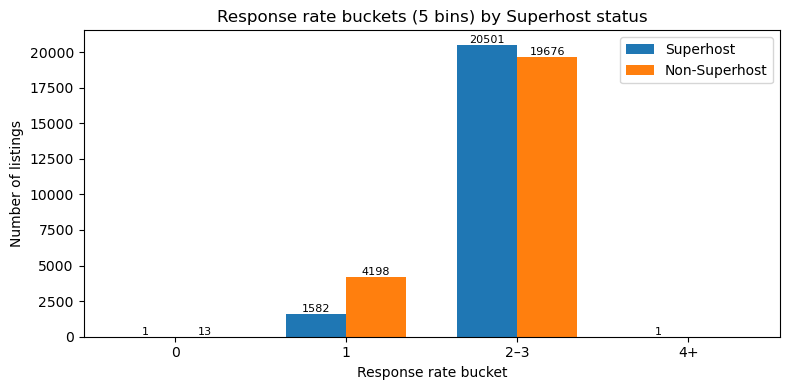

In [935]:
#table
df = df.copy()

df['is_super'] = (
    df['host_is_superhost']
      .astype(str)
      .str.strip()
      .str.lower()
      .map({'t': 1, 'true': 1, '1': 1,
            'f': 0, 'false': 0, '0': 0})
      .astype('Int8')
)

bins = [0, 80, 90, 95, 99, 100]
labels = ['0–80%', '80–90%', '90–95%', '95–99%', '100%']


#Bar chart
x_labels = pivot_counts.index.tolist()        
x = np.arange(len(x_labels))
width = 0.35

super_vals = pivot_counts['Superhost'].values
non_vals   = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(8, 4))

bars_super = plt.bar(x - width/2, super_vals, width, label='Superhost')
bars_non   = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')

plt.xticks(x, x_labels)
plt.ylabel('Number of listings')
plt.xlabel('Response rate bucket')
plt.title('Response rate buckets (5 bins) by Superhost status')
plt.legend()

for bar in list(bars_super) + list(bars_non):
    h = bar.get_height()
    if h == 0:
        continue
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        h,
        f'{int(h)}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.tight_layout()
plt.show()


Response rate buckets (including 100%) by Superhost status:


,Non-Superhost,Superhost
bucket,,
0–80%,8.88%,1.11%
80–90%,3.66%,2.12%
90–95%,1.42%,0.61%
95–99%,12.60%,4.37%
100%,73.43%,91.78%


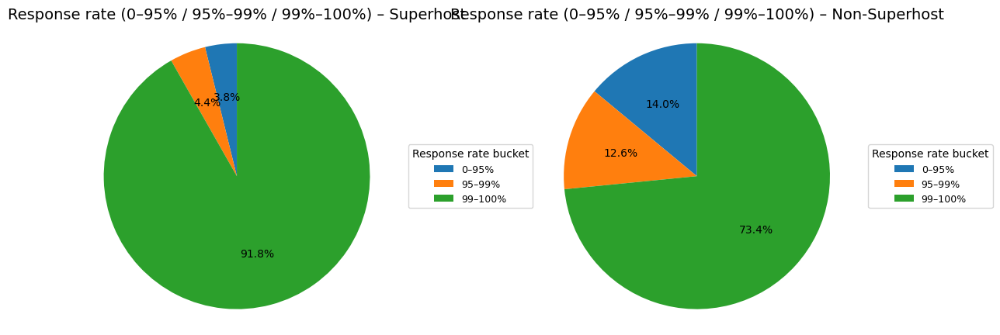

In [936]:
def bucket_response_rate(group_df, group_name):
    rates = (
        group_df['response_rate_pct']
        .dropna()
    )
    
    if len(rates) == 0:
        print(f"[WARN] No valid response rates for group {group_name}")
    
    bucket = pd.cut(
        rates,
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True   
    )
    
    bc = (
        bucket.value_counts()
              .reindex(labels, fill_value=0)
              .rename_axis('bucket')
              .reset_index(name='count')
    )
    total = bc['count'].sum()
    bc['share'] = bc['count'] / total if total > 0 else 0
    bc['group'] = group_name
    return bc

bc_super = bucket_response_rate(df[df['is_super'] == 1], 'Superhost')
bc_non   = bucket_response_rate(df[df['is_super'] == 0], 'Non-Superhost')

bucket_compare = pd.concat([bc_super, bc_non], ignore_index=True)

print("\nResponse rate buckets (including 100%) by Superhost status:")

share_table = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='share')
        .reindex(labels)
)
share_table.columns.name = None  

display(share_table.style.format('{:.2%}'))


pivot_counts = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='count')
        .reindex(labels)
        .fillna(0)
)

#pie chart
labels      = share_table.index.tolist()
sizes_super = share_table['Superhost'].values
sizes_non   = share_table['Non-Superhost'].values

bucket_map = {
    '0–80%':  '0–95%',
    '80–90%': '0–95%',
    '90–95%': '0–95%',
    '95–99%': '95–99%',
    '100%':   '99–100%',
}

agg_share = (
    share_table
        .rename(index=bucket_map)   
        .groupby(level=0).sum()     
        .reindex(['0–95%', '95–99%', '99–100%'])
)

labels_3    = agg_share.index.tolist()
sizes_super = agg_share['Superhost'].values
sizes_non   = agg_share['Non-Superhost'].values

def make_pie(ax, sizes, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize': 10},
        radius=1.1
    )
    ax.set_title(title, fontsize=14)
    ax.legend(
        wedges,
        labels_3,
        title='Response rate bucket',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=9
    )

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

make_pie(axes[0], sizes_super, 'Response rate (0–95% / 95%–99% / 99%–100%) – Superhost')
make_pie(axes[1], sizes_non,   'Response rate (0–95% / 95%–99% / 99%–100%) – Non-Superhost')

plt.tight_layout()
plt.show()

In [937]:
report='''
The response rate closer to 100% is more likely to indicate a Superhost; a response rate below 95% strongly suggests a Non-Superhost.

For Branch A (response), host_response_rate is a highly discriminative metric: it can be directly used as one of the model's core features;
in practice, it can also be used as a simple rule, such as: `response_rate_pct >= 99%` → "high response".

It can also be seen that many listings among Non-Superhosts have a 100% response rate.
Therefore, a high response rate is a "necessary condition" for Superhosts, but not a "sufficient condition," 
and must be combined with other features such as ratings and review volume.

In this dataset, Superhosts almost consistently maintain a response rate close to 100%, 
while listings with low response rates are mainly concentrated in the Non-Superhost group. 
Therefore, "response rate" is not one of the key behavioral features for explaining Superhost identity.
'''
print(report)


The response rate closer to 100% is more likely to indicate a Superhost; a response rate below 95% strongly suggests a Non-Superhost.

For Branch A (response), host_response_rate is a highly discriminative metric: it can be directly used as one of the model's core features;
in practice, it can also be used as a simple rule, such as: `response_rate_pct >= 99%` → "high response".

It can also be seen that many listings among Non-Superhosts have a 100% response rate.
Therefore, a high response rate is a "necessary condition" for Superhosts, but not a "sufficient condition," 
and must be combined with other features such as ratings and review volume.

In this dataset, Superhosts almost consistently maintain a response rate close to 100%, 
while listings with low response rates are mainly concentrated in the Non-Superhost group. 
Therefore, "response rate" is not one of the key behavioral features for explaining Superhost identity.



Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Host response time by group (counts + shares):


,Superhost,Superhost_share,Non-Superhost,Non-Superhost_share
host_response_time_label,,,,
Within an hour,"18,297",82.83%,"12,468",52.17%
Within a few hours,"2,343",10.61%,"2,809",11.75%
Within a day,775,3.51%,"2,332",9.76%
A few days or more,42,0.19%,707,2.96%
NaN,634,2.87%,"5,584",23.36%


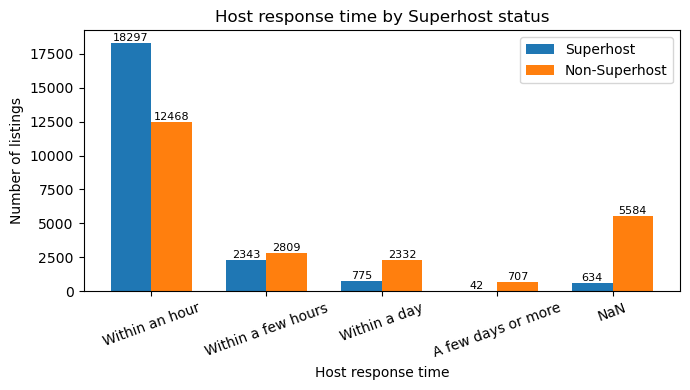

In [938]:
#response time
#table
df = df.copy()

df['is_super'] = (
    df['host_is_superhost']
      .astype(str)
      .str.strip()
      .str.lower()
      .map({'t': 1, 'true': 1, '1': 1,
            'f': 0, 'false': 0, '0': 0})
      .astype('Int8')
)

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")


resp_time_str = (
    df['host_response_time']
      .astype('string')
      .str.strip()
      .str.lower()
)

label_map = {
    'within an hour': 'Within an hour',
    'within a few hours': 'Within a few hours',
    'within a day': 'Within a day',
    'a few days or more': 'A few days or more'
}

df['host_response_time_label'] = resp_time_str.map(label_map)
df['host_response_time_label'] = df['host_response_time_label'].fillna('NaN')


counts = (
    df.groupby(['host_response_time_label', 'is_super'])
      .size()
      .reset_index(name='count')
)


counts['group'] = counts['is_super'].map({1: 'Superhost', 0: 'Non-Superhost'})


totals = counts.groupby('group')['count'].sum()
counts['share'] = counts.apply(
    lambda row: row['count'] / totals[row['group']] if totals[row['group']] > 0 else 0,
    axis=1
)


count_pivot = (
    counts.pivot(index='host_response_time_label',
                 columns='group',
                 values='count')
)

share_pivot = (
    counts.pivot(index='host_response_time_label',
                 columns='group',
                 values='share')
)


result = count_pivot.copy()
if 'Superhost' in share_pivot.columns:
    result['Superhost_share'] = share_pivot['Superhost']
if 'Non-Superhost' in share_pivot.columns:
    result['Non-Superhost_share'] = share_pivot['Non-Superhost']


order = ['Within an hour', 'Within a few hours', 'Within a day', 'A few days or more', 'NaN']
order = [o for o in order if o in result.index]
result = result.reindex(order)

print("\nHost response time by group (counts + shares):")

result.columns.name = None


cols_order = ['Superhost', 'Superhost_share',
              'Non-Superhost', 'Non-Superhost_share']
result = result[cols_order]

display(
    result.style.format({
        'Superhost': '{:,.0f}',
        'Superhost_share': '{:.2%}',
        'Non-Superhost': '{:,.0f}',
        'Non-Superhost_share': '{:.2%}'
    })
)

#bar chart
plot_data = result.copy()

x_labels = plot_data.index.tolist()
x = np.arange(len(x_labels))
width = 0.35

super_vals = plot_data['Superhost'].fillna(0).values
non_vals   = plot_data['Non-Superhost'].fillna(0).values

plt.figure(figsize=(7, 4))

bars_super = plt.bar(x - width/2, super_vals, width, label='Superhost')
bars_non   = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')

plt.xticks(x, x_labels, rotation=20)
plt.ylabel('Number of listings')
plt.xlabel('Host response time')
plt.title('Host response time by Superhost status')
plt.legend()

for bar in list(bars_super) + list(bars_non):
    height = bar.get_height()
    if height == 0:
        continue
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f'{int(height)}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.tight_layout()
plt.show()

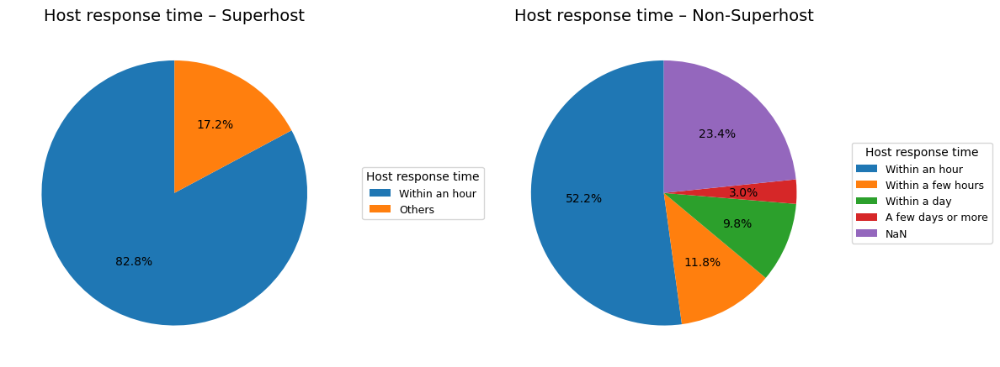

In [939]:
#pie chart response time
pie_data = result.copy()

sup_share = pie_data['Superhost_share'].fillna(0)

within_super = sup_share.get('Within an hour', 0)
others_super = sup_share.sum() - within_super

labels_super = ['Within an hour', 'Others']
sizes_super  = [within_super, others_super]

labels_non = pie_data.index.tolist()
sizes_non  = pie_data['Non-Superhost_share'].fillna(0).values

def make_pie(ax, sizes, labels, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize': 10},
        radius=1
    )
    ax.set_title(title, fontsize=14)
    ax.legend(
        wedges,
        labels,
        title='Host response time',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=9
    )

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

make_pie(
    axes[0],
    sizes_super,
    labels_super,
    'Host response time – Superhost'
)

make_pie(
    axes[1],
    sizes_non,
    labels_non,
    'Host response time – Non-Superhost'
)

plt.tight_layout()
plt.show()

In [940]:
report='''
host_response_time is a highly distinctive feature. 
The probability of seeing "Within an hour" responses is significantly higher for Superhosts than for Non-Superhosts.

"Response rate ≥ 80% within one hour" → very close to Superhost behavior;
"Response rate ≤ 50% within one hour, with many NaN responses" → more like Non-Superhosts.

Combined with response rate: We previously saw that Superhosts generally have a 99-100% response rate; 
here we see that Superhosts not only almost always respond, but most respond within one hour. 
Therefore these two behavioral dimensions together constitute the typical Superhost profile of "high responsiveness and high timeliness."

The difference in response timeliness between Superhosts and Non-Superhosts is very significant: over 80% of Superhosts can respond within one hour, 
while only about half of Non-Superhosts can do so. 
Responses taking more than a day or lacking response records are mainly concentrated in the Non-Superhost group. 
Therefore the response time should be within one hour to become a superhost.
'''
print(report)


host_response_time is a highly distinctive feature. 
The probability of seeing "Within an hour" responses is significantly higher for Superhosts than for Non-Superhosts.

"Response rate ≥ 80% within one hour" → very close to Superhost behavior;
"Response rate ≤ 50% within one hour, with many NaN responses" → more like Non-Superhosts.

Combined with response rate: We previously saw that Superhosts generally have a 99-100% response rate; 
here we see that Superhosts not only almost always respond, but most respond within one hour. 
Therefore these two behavioral dimensions together constitute the typical Superhost profile of "high responsiveness and high timeliness."

The difference in response timeliness between Superhosts and Non-Superhosts is very significant: over 80% of Superhosts can respond within one hour, 
while only about half of Non-Superhosts can do so. 
Responses taking more than a day or lacking response records are mainly concentrated in the Non-Superhost group. 
Therefor

In [941]:
#Accptance table
df = pd.read_csv("listings.csv", encoding="cp1252")

print(f"Total hosts: {len(df)}")

df['is_super'] = (
    df['host_is_superhost']
      .astype(str).str.strip().str.lower()
      .map({'t': 1, 'true': 1, '1': 1,
            'f': 0, 'false': 0, '0': 0})
      .astype('Int8')
)

print("Superhosts:", int((df['is_super'] == 1).sum()))
print("Non-Superhosts:", int((df['is_super'] == 0).sum()))


acc = (
    df['host_acceptance_rate']
      .astype(str).str.strip()
      .str.rstrip('%')   
      .replace({'nan': np.nan, '': np.nan, 'NA': np.nan, 'N/A': np.nan})
)

df['accept_rate_raw'] = pd.to_numeric(acc, errors='coerce')


if df['accept_rate_raw'].max() <= 1.1:
    df['accept_rate_pct'] = df['accept_rate_raw'] * 100
else:
    df['accept_rate_pct'] = df['accept_rate_raw']


sup_accept  = df.loc[df['is_super'] == 1, 'accept_rate_pct'].dropna()
non_accept = df.loc[df['is_super'] == 0, 'accept_rate_pct'].dropna()

print(f"\nSuperhosts with valid acceptance rate: {len(sup_accept)}")
print(f"Non-Superhosts with valid acceptance rate: {len(non_accept)}")

sup_rate_counts = (
    sup_accept.round(0)
              .value_counts()
              .sort_index()
              .rename_axis('accept_rate_pct')
              .reset_index(name='count')
)

non_rate_counts = (
    non_accept.round(0)
              .value_counts()
              .sort_index()
              .rename_axis('accept_rate_pct')
              .reset_index(name='count')
)

Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Superhosts with valid acceptance rate: 22081
Non-Superhosts with valid acceptance rate: 21443



Acceptance rate buckets by Superhost status:


,Non-Superhost,Superhost
bucket,,
0–80%,28.01%,4.62%
80–90%,8.16%,8.32%
90–95%,5.89%,11.83%
95–99%,11.08%,33.42%
100%,46.86%,41.80%


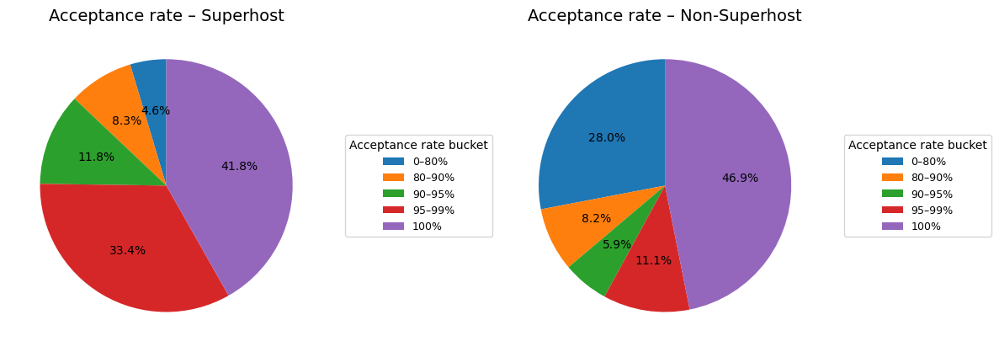

In [942]:
bins   = [0, 80, 90, 95, 99, 100]
labels = ['0–80%', '80–90%', '90–95%', '95–99%', '100%']

#table
def bucket_acceptance(rates, group_name):
    rates = rates.dropna()

    acc_bucket = pd.cut(
        rates,
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True
    )

    bc = (
        acc_bucket.value_counts()
                  .reindex(labels, fill_value=0)
                  .rename_axis('bucket')
                  .reset_index(name='count')
    )

    total_valid = len(rates)
    bc['share'] = bc['count'] / total_valid if total_valid > 0 else 0
    bc['group'] = group_name
    return bc


bc_super = bucket_acceptance(sup_accept,  'Superhost')
bc_non   = bucket_acceptance(non_accept,  'Non-Superhost')

bucket_compare = pd.concat([bc_super, bc_non], ignore_index=True)


share_table = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='share')
        .reindex(labels)
)
share_table.columns.name = None

print("\nAcceptance rate buckets by Superhost status:")
display(share_table.style.format('{:.2%}'))


#pie chart
pie_labels = share_table.index.tolist()
sizes_super = share_table['Superhost'].values
sizes_non   = share_table['Non-Superhost'].values

def make_pie(ax, sizes, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize': 10},
        radius=1
        
    )
    ax.set_title(title, fontsize=14)
    ax.legend(
        wedges,
        pie_labels,
        title='Acceptance rate bucket',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=9
    )

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
make_pie(axes[0], sizes_super, 'Acceptance rate – Superhost')
make_pie(axes[1], sizes_non,   'Acceptance rate – Non-Superhost')

plt.tight_layout()
plt.show()

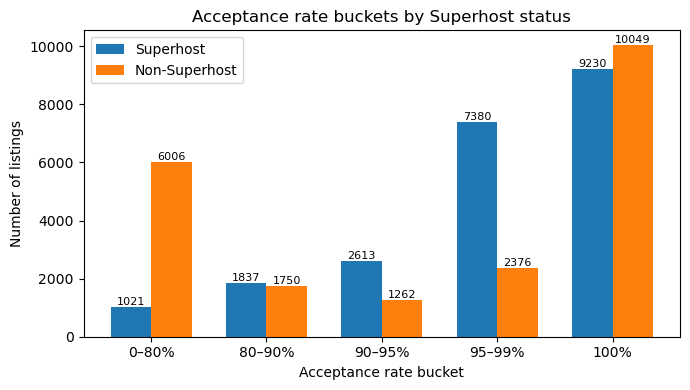

In [943]:
#bar chart
pivot_counts = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='count')
        .reindex(labels)
        .fillna(0)
)

x = np.arange(len(labels))
width = 0.35

sup_vals = pivot_counts['Superhost'].values
non_vals = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7, 4))

bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')

plt.xlabel('Acceptance rate bucket')
plt.ylabel('Number of listings')
plt.title('Acceptance rate buckets by Superhost status')
plt.xticks(x, labels)
plt.legend()


for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h == 0:
        continue
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        h,
        f'{int(h)}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.tight_layout()
plt.show()

In [944]:
report='''
This table and bar chart clearly show that: Low acceptance rates (0–80%) are almost exclusively found on Non-Superhosts: 
28% of Non-Superhosts have an acceptance rate of 0–80%; only 4.6% of Superhosts have this rate.

Note: If the acceptance rate is very low, it's highly unlikely to be a Superhost.
Medium-to-high acceptance rates (90–99%) are significantly higher on Superhosts: 
90–95%: Superhost 11.8%, Non-Superhost 5.9%;  95–99%: Superhost 33.4%, Non-Superhost 11.1%.
Therefore, Superhosts are more concentrated in the 90–99% range, especially 95–99%.

Both Superhosts and Non-Superhosts have a significant number of hosts with a 100% acceptance rate,
but the percentages differ: Superhost 100%: 41.8%; Non-Superhost 100%: 46.9%. 
This indicates that a 100% acceptance rate is not unique to Superhosts; many Non-Superhosts also achieve a nominal 100% acceptance rate.

Regarding response rate, Superhosts are mostly clustered between 99-100%, while Non-Superhosts are much more dispersed.
Regarding acceptance rate: the lower range (0-80%) does indeed differentiate a large number of Non-Superhosts; however, 
the higher range (especially 100%) also contains many Non-Superhosts.

Therefore: Acceptance rate is useful for distinguishing "clearly unqualified hosts" (below 80% or 90%), 
but in the high acceptance rate range, Superhosts and Non-Superhosts are quite mixed.
Acceptance rate is a useful feature, but not as "deadly" as response rate.

Compared to regular hosts, Superhosts almost never have very low acceptance rates (0–80%),
and are more concentrated in the high acceptance rate range of 90–99%; however, 100% acceptance rates are common in both types of hosts. 
Therefore acceptance rate is not the sole criterion for superhosting eligibility, but achieving 100% acceptance is generally preferred.
'''
print(report)


This table and bar chart clearly show that: Low acceptance rates (0–80%) are almost exclusively found on Non-Superhosts: 
28% of Non-Superhosts have an acceptance rate of 0–80%; only 4.6% of Superhosts have this rate.

Note: If the acceptance rate is very low, it's highly unlikely to be a Superhost.
Medium-to-high acceptance rates (90–99%) are significantly higher on Superhosts: 
90–95%: Superhost 11.8%, Non-Superhost 5.9%;  95–99%: Superhost 33.4%, Non-Superhost 11.1%.
Therefore, Superhosts are more concentrated in the 90–99% range, especially 95–99%.

Both Superhosts and Non-Superhosts have a significant number of hosts with a 100% acceptance rate,
but the percentages differ: Superhost 100%: 41.8%; Non-Superhost 100%: 46.9%. 
This indicates that a 100% acceptance rate is not unique to Superhosts; many Non-Superhosts also achieve a nominal 100% acceptance rate.

Regarding response rate, Superhosts are mostly clustered between 99-100%, while Non-Superhosts are much more dispersed.
Reg

Instant bookable by Superhost status:


,group,n_hosts,n_instant,share_instant
0,Non-Superhost,"23,900","8,945",37.43%
1,Superhost,"22,091","9,008",40.78%


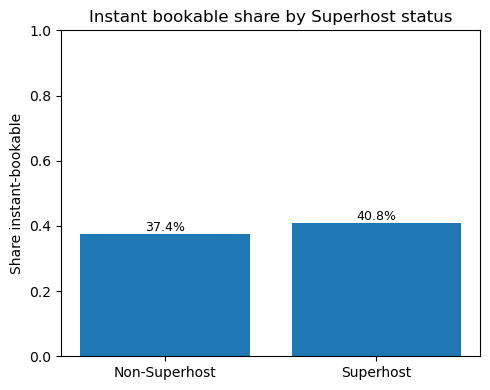


Instant bookable distribution within Superhosts:


,instant_bookable,count,share
0,Not instant bookable,"13,083",59.22%
1,Instant bookable,"9,008",40.78%


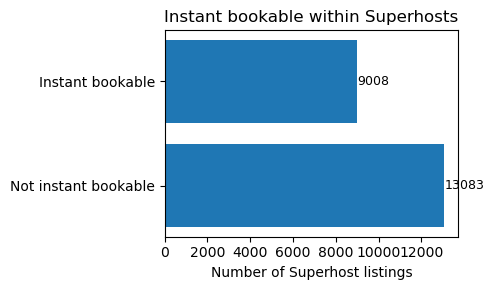

In [945]:
#Instant bookable
df = df.copy()

df['host_is_superhost_bin'] = (
    df['host_is_superhost']
      .astype(str)
      .str.strip()
      .str.lower()
      .map({'t': 1, 'true': 1, '1': 1,
            'f': 0, 'false': 0, '0': 0})
      .astype('Int8')
)

df['instant_bookable_bin'] = (
    df['instant_bookable']
      .astype(str)
      .str.strip()
      .str.lower()
      .map({'t': 1, 'true': 1, '1': 1,
            'f': 0, 'false': 0, '0': 0})
      .astype('Int8')
)


label_map = {0: 'Non-Superhost', 1: 'Superhost'}

tmp = df[
    df['host_is_superhost_bin'].notna() &
    df['instant_bookable_bin'].notna()
].copy()

summary_inst = (
    tmp.assign(group=lambda x: x['host_is_superhost_bin'].map(label_map))
       .groupby('group')['instant_bookable_bin']
       .agg(
           n_hosts='count',          
           n_instant='sum',            
           share_instant='mean'        
       )
       .reset_index()
)

print("Instant bookable by Superhost status:")
display(
    summary_inst.style.format({
        'share_instant': '{:.2%}',
        'n_hosts': '{:,.0f}',
        'n_instant': '{:,.0f}'
    })
)


plt.figure(figsize=(5, 4))

x = summary_inst['group']
y = summary_inst['share_instant']

bars = plt.bar(x, y)

plt.ylabel('Share instant-bookable')
plt.title('Instant bookable share by Superhost status')


for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f'{height:.1%}',
        ha='center',
        va='bottom',
        fontsize=9
    )

plt.ylim(0, 1)
plt.tight_layout()
plt.show()

sup = df[
    (df['host_is_superhost_bin'] == 1) &
    df['instant_bookable_bin'].notna()
].copy()

inst_counts = (
    sup['instant_bookable_bin']
       .value_counts()
       .rename(index={0: 'Not instant bookable', 1: 'Instant bookable'})
       .rename_axis('instant_bookable')
       .reset_index(name='count')
)

inst_counts['share'] = inst_counts['count'] / inst_counts['count'].sum()

print("\nInstant bookable distribution within Superhosts:")
display(
    inst_counts.style.format({
        'count': '{:,.0f}',
        'share': '{:.2%}'
    })
)

plt.figure(figsize=(5, 3))

bars2 = plt.barh(inst_counts['instant_bookable'], inst_counts['count'])

plt.xlabel('Number of Superhost listings')
plt.title('Instant bookable within Superhosts')

for bar in bars2:
    width = bar.get_width()
    y_pos = bar.get_y() + bar.get_height() / 2
    plt.text(
        width,
        y_pos,
        f'{int(width)}',
        va='center',
        ha='left',
        fontsize=9
    )

plt.tight_layout()
plt.show()

In [946]:
report='''
Approximately 41% of Superhosts offer instant booking, and approximately 37% of Non-Superhosts offer instant booking.
The difference is only 3–4 percentage points, far less extreme than the response rate/response time.

Within Superhosts, most listings do not actually offer instant booking:Instant bookable: 9,008 (40.78%),Not instant bookable: 13,083 (59.22%)

Therefore, even among Superhosts, about 60% of listings still require traditional booking methods that require manual confirmation.
This indicates that instant booking is not a necessary condition for becoming a Superhost, nor is it a strong differentiating feature.

Superhosts do have a slight preference for enabling instant booking, but many Non-Superhosts also offer instant booking. 
Therefore, in the model, instant_bookable is far less differentiating than: host_response_rate, host_response_time, review_scores_.

If you already meet the criteria of high response time, high order acceptance rate, and positive reviews, enabling instant booking can be a bonus, 
making new hosts more like typical Superhosts. 
However, simply enabling instant booking doesn't make you a Superhost; it's more of a slight bonus than a core requirement.

Compared to regular hosts, Superhosts have a slightly higher percentage enabling instant booking (approximately 41% vs 37%), 
but the difference is not significant, and most Superhosts don't actually enable instant booking. 
Therefore instant bookability is more of a slight preference trait than a key indicator of Superhost status.
'''
print(report)


Approximately 41% of Superhosts offer instant booking, and approximately 37% of Non-Superhosts offer instant booking.
The difference is only 3–4 percentage points, far less extreme than the response rate/response time.

Within Superhosts, most listings do not actually offer instant booking:Instant bookable: 9,008 (40.78%),Not instant bookable: 13,083 (59.22%)

Therefore, even among Superhosts, about 60% of listings still require traditional booking methods that require manual confirmation.
This indicates that instant booking is not a necessary condition for becoming a Superhost, nor is it a strong differentiating feature.

Superhosts do have a slight preference for enabling instant booking, but many Non-Superhosts also offer instant booking. 
Therefore, in the model, instant_bookable is far less differentiating than: host_response_rate, host_response_time, review_scores_.

If you already meet the criteria of high response time, high order acceptance rate, and positive reviews, enablin

In [947]:
report='''
Branch A – Response Behavior Analysis

This section compares the differences between Superhosts and non-Superhosts in four key aspects from a platform behavior perspective: 
host_response_rate; host_response_time; host_acceptance_rate; and instant_bookability. 
The data includes approximately 47k listings, with Superhosts ≈ 22k and non-Superhosts ≈ 24k. 
The sample sizes for both categories are similar, making it suitable for proportional comparison.

1. Response Rate (host_response_rate)
We first divide the response rate into five intervals: 0–80%, 80–90%, 90–95%, 95–99%, and 100%, a
nd then calculate the percentage of Superhosts and non-Superhosts for each interval.

    1.1 Distribution Characteristics
        Superhosts: 100% response rate, approximately 92%; 95–99%: approximately 4%; 
        Those below 95% account for only a very small portion (less than 5% in total).

        Non-Superhosts: 100% response rate accounts for approximately 73%; 95–99%: approximately 13%; 
        Below 95% totals around 14%, with the 0–80% range accounting for approximately 9%.

    1.2 Conclusion
        High response rate is a basic requirement for Superhosts: 
        the vast majority of listings in the Superhost community maintain a 99–100% response rate, 
        and hosts with consistently low response times are almost never seen.

Low response rates almost exclusively occur in non-Superhosts: the 0–80% range accounts for 8–9% in non-Superhosts, but only about 1% in Superhosts.

However, it's important to note that a 100% response rate is common in both categories, 
indicating that "response rate = 100%" is not a necessary condition for Superhosts, but rather a threshold.

2. Response Time (host_response_time)
Response rate only considers "whether there is a response"; response time reflects "how quickly the response is received.
" We standardized the platform's tags into four levels: Within an hour; Within a few hours; Within a day; A few days or more 
(plus NaN, indicating the system failed to track stable response times).

    2.1 Superhost vs Non-Superhost Comparison

        Superhost: Within an hour: ≈ 83%; Within a few hours: ≈ 11%
            Within a day: ≈ 4%; A few days or more: ~0.2%; NaN: ≈ 3%

        Non-Superhost: Within an hour: ≈ 52%; Within a few hours: ≈ 12%
            Within a day: ≈ 10%; A few days or more: ≈ 3%; NaN: ~23%

    2.2 Conclusion
        Superhosts almost always respond within one hour, and there are virtually no cases of responses taking several days. 
        While non-Superhosts also have about half of their listings responding within one hour,
        Slow responses (one day or more) are significantly more frequent; and nearly a quarter of listings.
        The lack of stable response time records (high NaN ratio) indicates either infrequent inquiries or inconsistent response behavior.

Summary: In terms of "whether they respond" and "how quickly they respond," Superhost's behavior is highly focused on "fast and stable," 
while non-Superhost's performance is more scattered and uncertain.

3. Acceptance Rate (host_acceptance_rate) The acceptance rate measures the host's acceptance of booking requests. We also divide it into five levels: 0–80%, 80–90%, 90–95%, 95–99%, and 100%.

    3.1 Distribution Characteristics
        Superhost: 0–80%:4.6%; 80–90%:8.3%; 90–95%:11.8%; 95–99%: 33.4%; 100%: 41.8%
        Non-Superhost:0–80%: 28% ;80–90%: 8.2%; 90–95%: 5.9%; 95–99%: 11.1%; 100%: 46.9%

    3.2 Conclusion
        Low booking rates almost exclusively occur in Non-Superhosts: 28% of Non-Superhosts have a booking rate of 0–80%, while Superhosts have 4–5%.
        Superhosts are more concentrated in the 90–99% booking rate range, especially 95–99%;
    
However, unlike response rate, a "100% booking rate" is common in both categories, even slightly higher in Non-Superhosts. 
This suggests that some hosts, while currently accepting all bookings, 
may not perform well in other areas (response speed, ratings, number of reviews, etc.) and therefore are not rated as Superhosts.

Summary: Acceptance is not the standard for judging a superhost, and most listings are not superhosts, 
but a near 100% booking success rate does not guarantee you will be a superhost.

4. Instant Bookable
Instant bookable reduces communication costs and is generally considered helpful in improving conversion rates.
Here we look at whether the listing has instant_bookable = True enabled.

    4.1 Superhost vs Non-Superhost
        Non-Superhost: Approximately 37% support instant bookable;
        Superhost: Approximately 41% support instant bookable.

        Within Superhost:
            Instant bookable: Approximately 41%
            Not instant bookable: Approximately 59%

    4.2 Conclusion
        Superhosts do have a slight preference for instant bookable, but the difference is only 3–4 percentage points;
        even within the Superhost community, most listings still use a "manual confirmation required" booking method; 
        therefore, compared to the response rate and response time mentioned earlier, instant_bookable. 
        The differentiation is significantly weaker; it's more of a "slight bonus" than a decisive factor.

Summary: Instant booking is a small optimization that can improve the experience, but it's not a core requirement for Superhost.

5. Overall Conclusion: What kind of "Response Behavior" is closer to Superhost?

Looking at these four characteristics as a whole, we can derive a relatively clear behavioral path:
1. High and stable response rate (almost 100%): Almost all Superhosts have a response rate of 99-100%; 
a consistently low response rate almost directly equates to "non-Superhost".

2. Extremely fast response time (mostly responding within one hour): Over 80% of Superhosts respond within one hour; 
long periods without response/unstable response behavior are more like a non-Superhost.

3. Not overly selective order acceptance behavior (at least maintaining a medium-to-high order acceptance rate): 
Superhosts rarely have an order acceptance rate below 80%; there are significantly more Superhosts with an order acceptance rate of 95-99%, 
but a 100% order acceptance rate does not necessarily indicate a Superhost. Exclusive.

4. Use instant booking appropriately to reduce booking friction. 
Enabling instant booking can slightly improve consistency with Superhost's behavior, but it is not a hard requirement.

In this dataset, the biggest difference between Superhost and ordinary hosts is not whether they "enable instant booking,"
but whether they can "respond to almost all inquiries and provide feedback to guests within an hour, 
while maintaining a high booking acceptance rate."
'''
print(report)


Branch A – Response Behavior Analysis

This section compares the differences between Superhosts and non-Superhosts in four key aspects from a platform behavior perspective: 
host_response_rate; host_response_time; host_acceptance_rate; and instant_bookability. 
The data includes approximately 47k listings, with Superhosts ≈ 22k and non-Superhosts ≈ 24k. 
The sample sizes for both categories are similar, making it suitable for proportional comparison.

1. Response Rate (host_response_rate)
We first divide the response rate into five intervals: 0–80%, 80–90%, 90–95%, 95–99%, and 100%, a
nd then calculate the percentage of Superhosts and non-Superhosts for each interval.

    1.1 Distribution Characteristics
        Superhosts: 100% response rate, approximately 92%; 95–99%: approximately 4%; 
        Those below 95% account for only a very small portion (less than 5% in total).

        Non-Superhosts: 100% response rate accounts for approximately 73%; 95–99%: approximately 13%; 
       

In [948]:
report='''
Branch A – Reputation & Ratings

On Airbnb, guest feedback is at the heart of the Superhost program. Beyond operational behavior like response and acceptance, 
the platform evaluates hosts on how consistently they deliver great stays through ratings and reviews.

Therefore, this section focuses on the host’s reputation and review performance,
comparing Superhosts and non-Superhosts in terms of overall rating (review_scores_rating), 
detailed sub-scores (accuracy, cleanliness, check-in, communication, location, value), 
review volume and recency (number_of_reviews, number_of_reviews_ltm, reviews_per_month).
'''
print(report)


Branch A – Reputation & Ratings

On Airbnb, guest feedback is at the heart of the Superhost program. Beyond operational behavior like response and acceptance, 
the platform evaluates hosts on how consistently they deliver great stays through ratings and reviews.

Therefore, this section focuses on the host’s reputation and review performance,
comparing Superhosts and non-Superhosts in terms of overall rating (review_scores_rating), 
detailed sub-scores (accuracy, cleanliness, check-in, communication, location, value), 
review volume and recency (number_of_reviews, number_of_reviews_ltm, reviews_per_month).



In [949]:
cols_B = [
    'host_listings_count',
    'review_scores_rating',
    'review_scores_accuracy',
    'review_scores_cleanliness',
    'review_scores_checkin',
    'review_scores_communication',
    'review_scores_location',
    'review_scores_value',
    'number_of_reviews',
    'number_of_reviews_ltm',
    'number_of_reviews_l30d',
    'reviews_per_month',
]

missing = (
    df[cols_B]
      .isna()
      .sum()
      .rename('missing_count')
      .to_frame()
)

missing['missing_share'] = missing['missing_count'] / len(df)

print("Missing values for Branch A-Reputation features:")
display(
    missing.style.format({
        'missing_count': '{:,.0f}',
        'missing_share': '{:.2%}'
    })
)


missing_cols = missing[missing['missing_count'] > 0].index.tolist()
print("\nColumns with missing values:")
print(missing_cols)

Missing values for Branch A-Reputation features:


,missing_count,missing_share
host_listings_count,19,0.04%
review_scores_rating,"5,171",10.98%
review_scores_accuracy,"5,172",10.98%
review_scores_cleanliness,"5,171",10.98%
review_scores_checkin,"5,172",10.98%
review_scores_communication,"5,172",10.98%
review_scores_location,"5,172",10.98%
review_scores_value,"5,172",10.98%
number_of_reviews,0,0.00%
number_of_reviews_ltm,0,0.00%



Columns with missing values:
['host_listings_count', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'reviews_per_month']


In [950]:
#review_scores_rating	
df = df.copy()

if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost']
          .astype(str)
          .str.strip()
          .str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")

rating_raw = pd.to_numeric(df['review_scores_rating'], errors='coerce')
max_val = rating_raw.max()

if pd.notna(max_val) and max_val <= 5.1:
    df['rating_pct'] = rating_raw * 20
else:
    df['rating_pct'] = rating_raw

summary_stats = (
    df.groupby('is_super')['rating_pct']
      .agg(['count', 'mean', 'median'])
      .rename(index={1: 'Superhost', 0: 'Non-Superhost'})
)

print("\nBasic stats of review_scores_rating (0–100 scale):")
display(summary_stats.style.format({'mean': '{:.2f}', 'median': '{:.2f}', 'count': '{:,.0f}'}))



bins = [0, 80, 90, 95, 100]
labels = ['0–80', '80–90', '90–95', '95–100']

def bucket_rating(group_df, group_name):
    r = group_df['rating_pct'].dropna()
    rating_bucket = pd.cut(
        r,
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True
    )

    bucket_counts = (
        rating_bucket.value_counts()
                     .reindex(labels, fill_value=0)
                     .rename_axis('bucket')
                     .reset_index(name='count')
    )

    total_valid = len(r)
    bucket_counts['share'] = bucket_counts['count'] / total_valid if total_valid > 0 else 0
    bucket_counts['group'] = group_name
    return bucket_counts

sup_bucket  = bucket_rating(df[df['is_super'] == 1], 'Superhost')
non_bucket  = bucket_rating(df[df['is_super'] == 0], 'Non-Superhost')


print("\nRating buckets among Superhosts:")
display(
    sup_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

print("\nRating buckets among Non-Superhosts:")
display(
    non_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)


Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Basic stats of review_scores_rating (0–100 scale):


,count,mean,median
is_super,,,
Non-Superhost,"19,606",95.45,97.60
Superhost,"21,299",97.80,98.40



Rating buckets among Superhosts:


,bucket,count,share
0,0–80,116,0.54%
1,80–90,316,1.48%
2,90–95,"1,765",8.29%
3,95–100,"19,102",89.68%



Rating buckets among Non-Superhosts:


,bucket,count,share
0,0–80,929,4.74%
1,80–90,"1,798",9.17%
2,90–95,"3,819",19.48%
3,95–100,"13,060",66.61%



Share of listings in each rating bucket (Superhost vs Non-Superhost):


,Superhost,Non-Superhost
bucket,,
0–80,0.54%,4.74%
80–90,1.48%,9.17%
90–95,8.29%,19.48%
95–100,89.68%,66.61%


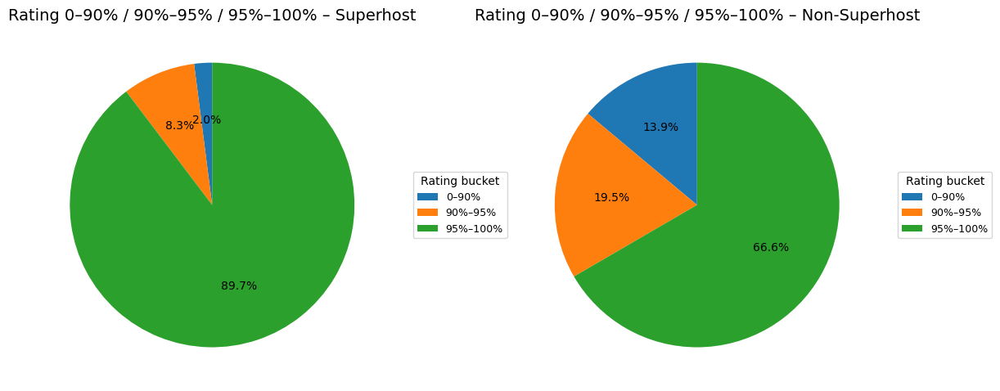

In [951]:
#table
bucket_compare = pd.concat([sup_bucket, non_bucket], ignore_index=True)

share_table = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='share')
        .reindex(labels)
)

share_table.columns.name = None

share_table = share_table[['Superhost', 'Non-Superhost']]

print("\nShare of listings in each rating bucket (Superhost vs Non-Superhost):")
display(share_table.style.format('{:.2%}'))



#pie chart
pie_data = share_table.copy()   
sup_vals = pie_data['Superhost'].fillna(0).values
non_vals = pie_data['Non-Superhost'].fillna(0).values


sup_0_90   = sup_vals[0] + sup_vals[1]
sup_90_95  = sup_vals[2]
sup_95_100 = sup_vals[3]

non_0_90   = non_vals[0] + non_vals[1]
non_90_95  = non_vals[2]
non_95_100 = non_vals[3]


agg_share = pd.DataFrame({
    'Superhost':      [sup_0_90,   sup_90_95,   sup_95_100],
    'Non-Superhost':  [non_0_90,   non_90_95,   non_95_100],
}, index=['0–90%', '90%–95%', '95%–100%'])

labels_3    = agg_share.index.tolist()
sizes_super = agg_share['Superhost'].values
sizes_non   = agg_share['Non-Superhost'].values

def make_pie(ax, sizes, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize': 10},
        radius=1
    )
    ax.set_title(title, fontsize=14)
    ax.legend(
        wedges,
        labels_3,
        title='Rating bucket',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=9
    )

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

make_pie(axes[0], sizes_super, 'Rating 0–90% / 90%–95% / 95%–100% – Superhost')
make_pie(axes[1], sizes_non,   'Rating 0–90% / 90%–95% / 95%–100% – Non-Superhost')

plt.tight_layout()
plt.show()


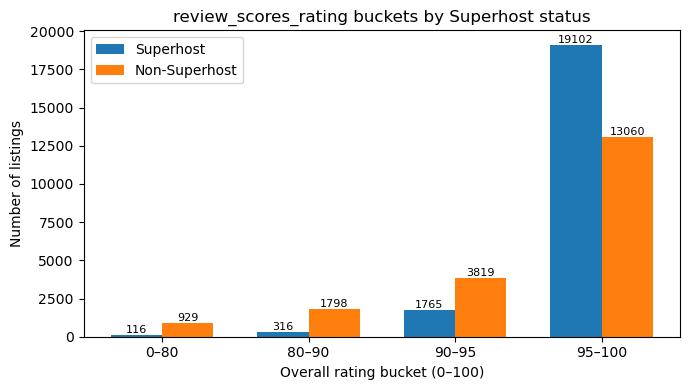

In [952]:
#bar chart
pivot_counts = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='count')
        .reindex(labels)
        .fillna(0)
)

x = np.arange(len(labels))
width = 0.35

sup_vals  = pivot_counts['Superhost'].values
non_vals  = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7, 4))

bars_sup = plt.bar(x - width/2, sup_vals,  width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals,  width, label='Non-Superhost')

plt.xlabel('Overall rating bucket (0–100)')
plt.ylabel('Number of listings')
plt.title('review_scores_rating buckets by Superhost status')
plt.xticks(x, labels)
plt.legend()


for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h == 0:
        continue
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        h,
        f'{int(h)}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.tight_layout()
plt.show()

In [953]:
report='''
Superhost's overall review ratings are significantly higher and more concentrated in the high-score range: the mean is 2.35 higher (97.80 vs 95.45), 
and the median is 0.8 points higher (98.40 vs 97.60); the percentage of ratings in the 95–100 range is 23.07 percentage points higher (89.68% vs 66.61%).

Key findings:

89.68% of Superhost's ratings are in the 95–100 range, compared to 66.61% for Non-Superhost.

The percentage of ratings in the low-score range is extremely small: only 2.02% for Superhost (0–90, 0.54% + 1.48%), 
and 13.91% for Non-Superhost (4.74% + 9.17%).

In the 90–95 score range, there are significantly more Non-Superhosts (19.48% vs 8.29%), 
indicating that they are generally stuck at the second-highest score for longer, struggling to surpass the 95-point threshold.

Higher central tendency:
Mean: 97.80 (SH) vs 95.45 (NSH), +2.35.Median: 98.40 (SH) vs 97.60 (NSH), +0.80.

This means that Superhosts are not just "more at the top," but rather that the overall level is rising.

Search Ranking and Conversion: Review ratings are a crucial indicator of ranking and click/booking rates; 
Superhosts have a higher density of ratings in the 95+ range, naturally gaining more exposure and trust.

Reputation: Non-Superhosts are largely clustered in the 90-95 range, 
indicating that a few negative reviews/experience fluctuations are enough to prevent them from reaching 95+; 
Superhosts are more resilient, less likely to drop out of the high-score range with small fluctuations.

To become a Superhost, prioritize raising your rating from 90-95 to 95+, as this yields the most marginal benefit.

Selection Bias: Hosts with low ratings may have already been delisted, creating a natural bias towards high-scoring hosts.

Heterogeneity: Location, price range, room type, and seasonal demand affect ratings; 
further comparisons can be made within comparable groups of the same city/price/room type to control confounding factors.

Time Dimension: It is recommended to add `last_review` and `reviews_per_month` metrics to differentiate.
'''
print(report)


Superhost's overall review ratings are significantly higher and more concentrated in the high-score range: the mean is 2.35 higher (97.80 vs 95.45), 
and the median is 0.8 points higher (98.40 vs 97.60); the percentage of ratings in the 95–100 range is 23.07 percentage points higher (89.68% vs 66.61%).

Key findings:

89.68% of Superhost's ratings are in the 95–100 range, compared to 66.61% for Non-Superhost.

The percentage of ratings in the low-score range is extremely small: only 2.02% for Superhost (0–90, 0.54% + 1.48%), 
and 13.91% for Non-Superhost (4.74% + 9.17%).

In the 90–95 score range, there are significantly more Non-Superhosts (19.48% vs 8.29%), 
indicating that they are generally stuck at the second-highest score for longer, struggling to surpass the 95-point threshold.

Higher central tendency:
Mean: 97.80 (SH) vs 95.45 (NSH), +2.35.Median: 98.40 (SH) vs 97.60 (NSH), +0.80.

This means that Superhosts are not just "more at the top," but rather that the overall level is

In [954]:
# review_scores_accuracy
df = df.copy()

if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost']
          .astype(str)
          .str.strip()
          .str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")


acc_raw = pd.to_numeric(df['review_scores_accuracy'], errors='coerce')
max_val = acc_raw.max()

if pd.notna(max_val) and max_val <= 5.1:
    df['accuracy_pct'] = acc_raw * 20
elif pd.notna(max_val) and max_val <= 10.1:
    df['accuracy_pct'] = acc_raw * 10
else:
    df['accuracy_pct'] = acc_raw




summary_acc = (
    df.groupby('is_super')['accuracy_pct']
      .agg(['count', 'mean', 'median'])
      .rename(index={1: 'Superhost', 0: 'Non-Superhost'})
)

print("\nBasic stats of review_scores_accuracy (0–100 scale):")
display(summary_acc.style.format({
    'count': '{:,.0f}',
    'mean': '{:.2f}',
    'median': '{:.2f}'
}))


bins = [0, 80, 90, 95, 100]
labels = ['0–80', '80–90', '90–95', '95–100']

def bucket_accuracy(group_df, group_name):
    r = group_df['accuracy_pct'].dropna()
    acc_bucket = pd.cut(
        r,
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True
    )

    bucket_counts = (
        acc_bucket.value_counts()
                  .reindex(labels, fill_value=0)
                  .rename_axis('bucket')
                  .reset_index(name='count')
    )

    total_valid = len(r)
    bucket_counts['share'] = (
        bucket_counts['count'] / total_valid if total_valid > 0 else 0
    )
    bucket_counts['group'] = group_name
    return bucket_counts

sup_bucket  = bucket_accuracy(df[df['is_super'] == 1], 'Superhost')
non_bucket  = bucket_accuracy(df[df['is_super'] == 0], 'Non-Superhost')

print("\nAccuracy buckets among Superhosts:")
display(
    sup_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

print("\nAccuracy buckets among Non-Superhosts:")
display(
    non_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)



Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Basic stats of review_scores_accuracy (0–100 scale):


,count,mean,median
is_super,,,
Non-Superhost,"19,605",95.95,98.00
Superhost,"21,299",98.03,98.60



Accuracy buckets among Superhosts:


,bucket,count,share
0,0–80,116,0.54%
1,80–90,274,1.29%
2,90–95,"1,267",5.95%
3,95–100,"19,642",92.22%



Accuracy buckets among Non-Superhosts:


,bucket,count,share
0,0–80,814,4.15%
1,80–90,"1,467",7.48%
2,90–95,"3,162",16.13%
3,95–100,"14,162",72.24%



Share of listings in each accuracy bucket (Superhost vs Non-Superhost):


,Non-Superhost,Superhost
bucket,,
0–80,4.15%,0.54%
80–90,7.48%,1.29%
90–95,16.13%,5.95%
95–100,72.24%,92.22%


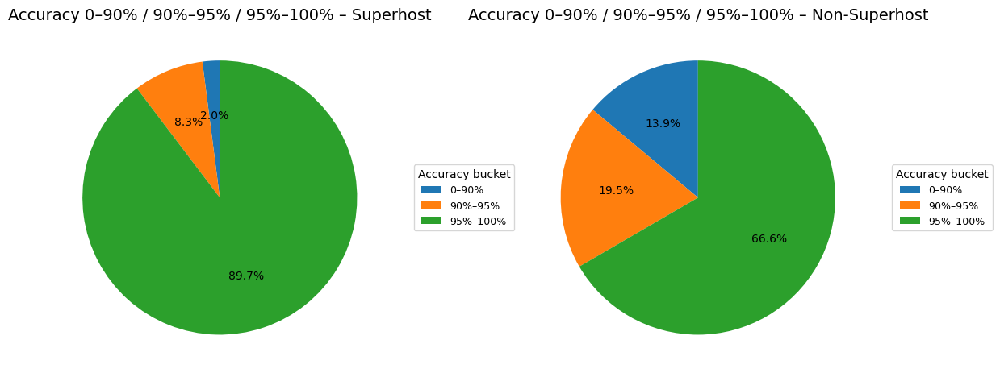

In [955]:
#table
bucket_compare = pd.concat([sup_bucket, non_bucket], ignore_index=True)

share_table = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='share')
        .reindex(labels)
)
share_table.columns.name = None

print("\nShare of listings in each accuracy bucket (Superhost vs Non-Superhost):")
display(share_table.style.format('{:.2%}'))


#pie chart
pie_data = share_table[['Superhost', 'Non-Superhost']].fillna(0)

sup_vals = pie_data['Superhost'].values
non_vals = pie_data['Non-Superhost'].values

sup_0_90   = sup_vals[0] + sup_vals[1]
sup_90_95  = sup_vals[2]
sup_95_100 = sup_vals[3]

non_0_90   = non_vals[0] + non_vals[1]
non_90_95  = non_vals[2]
non_95_100 = non_vals[3]

#chart
labels_3    = agg_share.index.tolist()
sizes_super = agg_share['Superhost'].values
sizes_non   = agg_share['Non-Superhost'].values

def make_pie_3(ax, sizes, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize': 10},
        radius=1
    )
    ax.set_title(title, fontsize=14)
    ax.legend(
        wedges,
        labels_3,
        title='Accuracy bucket',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=9
    )

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

make_pie_3(axes[0], sizes_super, 'Accuracy 0–90% / 90%–95% / 95%–100% – Superhost')
make_pie_3(axes[1], sizes_non,   'Accuracy 0–90% / 90%–95% / 95%–100% – Non-Superhost')

plt.tight_layout()
plt.show()

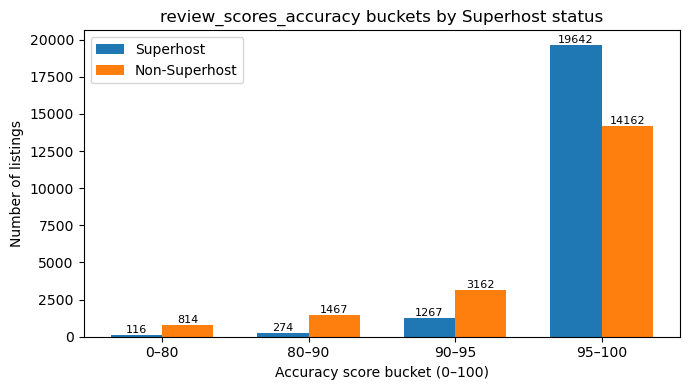

In [956]:
#bar chart
pivot_counts = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='count')
        .reindex(labels)
        .fillna(0)
)

x = np.arange(len(labels))
width = 0.35

sup_vals  = pivot_counts['Superhost'].values
non_vals  = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7, 4))

bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')

plt.xlabel('Accuracy score bucket (0–100)')
plt.ylabel('Number of listings')
plt.title('review_scores_accuracy buckets by Superhost status')
plt.xticks(x, labels)
plt.legend()

for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h == 0:
        continue
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        h,
        f'{int(h)}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.tight_layout()
plt.show()

In [957]:
report='''
Based on the overall statistics and distribution analysis of review scores accuracy, 
Superhost significantly outperforms in "consistency between check-in experience and property description.
Superhost's mean and median scores are 98.03 and 98.60, respectively, significantly higher than Non-superhost's (95.95 and 98.00). 
Bucket analysis shows that 92.22% of Superhost's listings are concentrated in the 95–100 high score range, compared to only 72.24% for Non-superhost. 

Furthermore, Non-superhost has a higher percentage of listings in the 90–95 and 0–90 low-to-mid score ranges 
(16.13% and 11.63%, respectively, compared to Superhost's 5.95% and 1.83%). 

This indicates that Superhost not only has a higher average score but also a larger proportion of consistently high scores, 
exhibiting a "high-score and concentrated" distribution characteristic.
'''
print(report)


Based on the overall statistics and distribution analysis of review scores accuracy, 
Superhost significantly outperforms in "consistency between check-in experience and property description.
Superhost's mean and median scores are 98.03 and 98.60, respectively, significantly higher than Non-superhost's (95.95 and 98.00). 
Bucket analysis shows that 92.22% of Superhost's listings are concentrated in the 95–100 high score range, compared to only 72.24% for Non-superhost. 

Furthermore, Non-superhost has a higher percentage of listings in the 90–95 and 0–90 low-to-mid score ranges 
(16.13% and 11.63%, respectively, compared to Superhost's 5.95% and 1.83%). 

This indicates that Superhost not only has a higher average score but also a larger proportion of consistently high scores, 
exhibiting a "high-score and concentrated" distribution characteristic.



In [958]:
#review_scores_cleanliness
df = df.copy()

if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost']
          .astype(str)
          .str.strip()
          .str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")


clean_raw = pd.to_numeric(df['review_scores_cleanliness'], errors='coerce')
max_val = clean_raw.max()

if pd.notna(max_val) and max_val <= 5.1:
    df['cleanliness_pct'] = clean_raw * 20
elif pd.notna(max_val) and max_val <= 10.1:
    df['cleanliness_pct'] = clean_raw * 10
else:
    df['cleanliness_pct'] = clean_raw

summary_clean = (
    df.groupby('is_super')['cleanliness_pct']
      .agg(['count', 'mean', 'median'])
      .rename(index={1: 'Superhost', 0: 'Non-Superhost'})
)

print("\nBasic stats of review_scores_cleanliness (0–100 scale):")
display(summary_clean.style.format({
    'count': '{:,.0f}',
    'mean': '{:.2f}',
    'median': '{:.2f}'
}))

bins = [0, 80, 90, 95, 100]
labels = ['0–80', '80–90', '90–95', '95–100']

def bucket_cleanliness(group_df, group_name):
    r = group_df['cleanliness_pct'].dropna()
    cl_bucket = pd.cut(
        r,
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True
    )

    bucket_counts = (
        cl_bucket.value_counts()
                 .reindex(labels, fill_value=0)
                 .rename_axis('bucket')
                 .reset_index(name='count')
    )

    total_valid = len(r)
    bucket_counts['share'] = (
        bucket_counts['count'] / total_valid if total_valid > 0 else 0
    )
    bucket_counts['group'] = group_name
    return bucket_counts

sup_bucket  = bucket_cleanliness(df[df['is_super'] == 1], 'Superhost')
non_bucket  = bucket_cleanliness(df[df['is_super'] == 0], 'Non-Superhost')

print("\nCleanliness buckets among Superhosts:")
display(
    sup_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

print("\nCleanliness buckets among Non-Superhosts:")
display(
    non_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Basic stats of review_scores_cleanliness (0–100 scale):


,count,mean,median
is_super,,,
Non-Superhost,"19,606",95.11,97.60
Superhost,"21,299",97.70,98.60



Cleanliness buckets among Superhosts:


,bucket,count,share
0,0–80,121,0.57%
1,80–90,474,2.23%
2,90–95,"2,182",10.24%
3,95–100,"18,522",86.96%



Cleanliness buckets among Non-Superhosts:


,bucket,count,share
0,0–80,"1,077",5.49%
1,80–90,"2,120",10.81%
2,90–95,"3,603",18.38%
3,95–100,"12,806",65.32%



Share of listings in each cleanliness bucket (Superhost vs Non-Superhost):


,Non-Superhost,Superhost
bucket,,
0–80,5.49%,0.57%
80–90,10.81%,2.23%
90–95,18.38%,10.24%
95–100,65.32%,86.96%


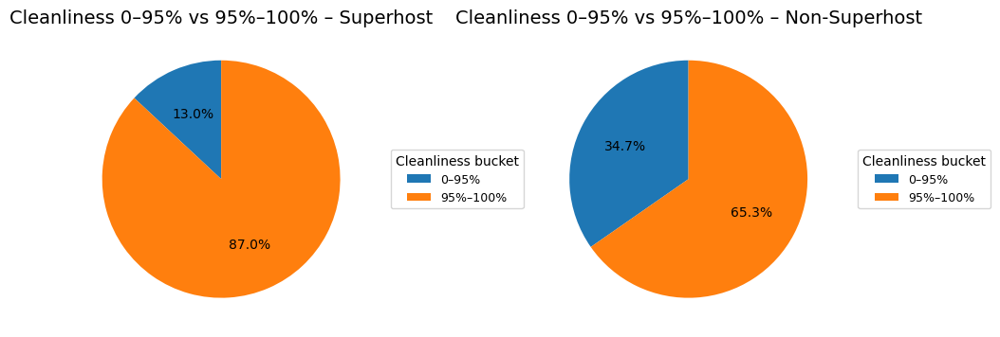

In [959]:
#table
bucket_compare = pd.concat([sup_bucket, non_bucket], ignore_index=True)

share_table = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='share')
        .reindex(labels)
)
share_table.columns.name = None

print("\nShare of listings in each cleanliness bucket (Superhost vs Non-Superhost):")
display(share_table.style.format('{:.2%}'))

#pie chart
low_bins  = ['0–80', '80–90', '90–95']   
high_bin  = '95–100'                     

sup_0_95   = sup_bucket.loc[sup_bucket['bucket'].isin(low_bins), 'share'].sum()
sup_95_100 = sup_bucket.loc[sup_bucket['bucket'] == high_bin, 'share'].sum()

non_0_95   = non_bucket.loc[non_bucket['bucket'].isin(low_bins), 'share'].sum()
non_95_100 = non_bucket.loc[non_bucket['bucket'] == high_bin, 'share'].sum()


agg_clean = pd.DataFrame(
    {'Superhost':     [sup_0_95,  sup_95_100],
        'Non-Superhost': [non_0_95,  non_95_100],},
    index=['0–95%', '95%–100%']
)

labels_2    = agg_clean.index.tolist()
sizes_super = agg_clean['Superhost'].values
sizes_non   = agg_clean['Non-Superhost'].values

def make_pie_0_95(ax, sizes, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize': 10},
        radius=1
    )
    ax.set_title(title, fontsize=14)
    ax.legend(
        wedges,
        labels_2,
        title='Cleanliness bucket',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=9
    )

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

make_pie_0_95(axes[0], sizes_super, 'Cleanliness 0–95% vs 95%–100% – Superhost')
make_pie_0_95(axes[1], sizes_non,   'Cleanliness 0–95% vs 95%–100% – Non-Superhost')

plt.tight_layout()
plt.show()

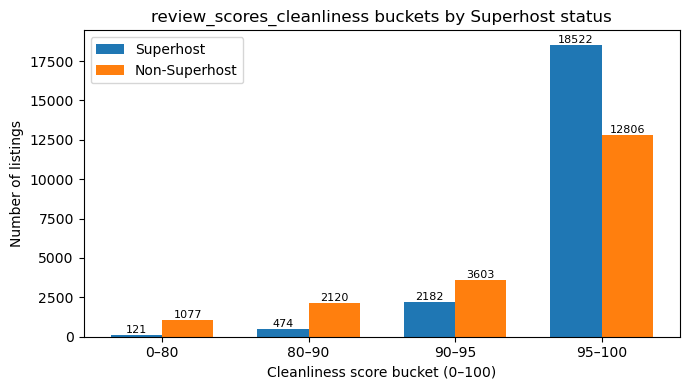

In [960]:
#bar chart
pivot_counts = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='count')
        .reindex(labels)
        .fillna(0)
)

x = np.arange(len(labels))
width = 0.35

sup_vals  = pivot_counts['Superhost'].values
non_vals  = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7, 4))

bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')

plt.xlabel('Cleanliness score bucket (0–100)')
plt.ylabel('Number of listings')
plt.title('review_scores_cleanliness buckets by Superhost status')
plt.xticks(x, labels)
plt.legend()

# add count labels on top
for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h == 0:
        continue
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        h,
        f'{int(h)}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.tight_layout()
plt.show()

In [961]:
report='''
Superhosts have materially higher cleanliness scores: mean 97.70 vs 95.11, median 98.60 vs 97.60.
The 95–100 bucket share is 86.96% (Superhost) vs 65.32% (Non-Superhost).
Low buckets (<90) are 2.80% for Superhosts vs 16.30% for Non-Superhosts.

Pies chart show Superhosts heavily concentrated in 95–100 (~87%), while Non-Superhosts still have ~35% in 0–95.
The summary table shows right-shifted central tendency for Superhosts and a much fatter top bucket.
Bar chart highlights the dominance of Superhosts in the 95–100 bucket and the mid-bucket mass for Non-Superhosts.
Pie Chart (0–95 vs 95–100): The 2-slice pies compress the story into “excellent vs not yet excellent,” great for execution slides.

Therefore, Cleanliness is a controllable strength: it is strongly correlated with Superhost status, 
and the cleanliness score is an important indicator for determining whether someone becomes a Superhost.

In summary: Superhosts almost always maintain a cleanliness level in the 95–100 range, 
while non-Superhosts have a much higher proportion of long-tail and mid-tier hosts. 
Standardizing the cleanliness process is a low-cost, high-return option for new hosts aiming for Superhost status.
'''
print(report)


Superhosts have materially higher cleanliness scores: mean 97.70 vs 95.11, median 98.60 vs 97.60.
The 95–100 bucket share is 86.96% (Superhost) vs 65.32% (Non-Superhost).
Low buckets (<90) are 2.80% for Superhosts vs 16.30% for Non-Superhosts.

Pies chart show Superhosts heavily concentrated in 95–100 (~87%), while Non-Superhosts still have ~35% in 0–95.
The summary table shows right-shifted central tendency for Superhosts and a much fatter top bucket.
Bar chart highlights the dominance of Superhosts in the 95–100 bucket and the mid-bucket mass for Non-Superhosts.
Pie Chart (0–95 vs 95–100): The 2-slice pies compress the story into “excellent vs not yet excellent,” great for execution slides.

Therefore, Cleanliness is a controllable strength: it is strongly correlated with Superhost status, 
and the cleanliness score is an important indicator for determining whether someone becomes a Superhost.

In summary: Superhosts almost always maintain a cleanliness level in the 95–100 range, 
w

In [962]:
#review_scores_checkin
df = df.copy()

if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost']
          .astype(str)
          .str.strip()
          .str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")


check_raw = pd.to_numeric(df['review_scores_checkin'], errors='coerce')
max_val = check_raw.max()

if pd.notna(max_val) and max_val <= 5.1:
    df['checkin_pct'] = check_raw * 20
elif pd.notna(max_val) and max_val <= 10.1:
    df['checkin_pct'] = check_raw * 10
else:
    df['checkin_pct'] = check_raw


summary_checkin = (
    df.groupby('is_super')['checkin_pct']
      .agg(['count', 'mean', 'median'])
      .rename(index={1: 'Superhost', 0: 'Non-Superhost'})
)

print("\nBasic stats of review_scores_checkin (0–100 scale):")
display(summary_checkin.style.format({
    'count': '{:,.0f}',
    'mean': '{:.2f}',
    'median': '{:.2f}'
}))


bins = [0, 80, 90, 95, 100]
labels = ['0–80', '80–90', '90–95', '95–100']

def bucket_checkin(group_df, group_name):
    r = group_df['checkin_pct'].dropna()
    ck_bucket = pd.cut(
        r,
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True
    )

    bucket_counts = (
        ck_bucket.value_counts()
                 .reindex(labels, fill_value=0)
                 .rename_axis('bucket')
                 .reset_index(name='count')
    )

    total_valid = len(r)
    bucket_counts['share'] = (
        bucket_counts['count'] / total_valid if total_valid > 0 else 0
    )
    bucket_counts['group'] = group_name
    return bucket_counts

sup_bucket  = bucket_checkin(df[df['is_super'] == 1], 'Superhost')
non_bucket  = bucket_checkin(df[df['is_super'] == 0], 'Non-Superhost')

print("\nCheck-in score buckets among Superhosts:")
display(
    sup_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

print("\nCheck-in score buckets among Non-Superhosts:")
display(
    non_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Basic stats of review_scores_checkin (0–100 scale):


,count,mean,median
is_super,,,
Non-Superhost,"19,605",97.14,99.20
Superhost,"21,299",98.61,99.20



Check-in score buckets among Superhosts:


,bucket,count,share
0,0–80,71,0.33%
1,80–90,192,0.90%
2,90–95,728,3.42%
3,95–100,"20,308",95.35%



Check-in score buckets among Non-Superhosts:


,bucket,count,share
0,0–80,600,3.06%
1,80–90,892,4.55%
2,90–95,"1,864",9.51%
3,95–100,"16,249",82.88%



Share of listings in each check-in bucket (Superhost vs Non-Superhost):


,Non-Superhost,Superhost
bucket,,
0–80,3.06%,0.33%
80–90,4.55%,0.90%
90–95,9.51%,3.42%
95–100,82.88%,95.35%


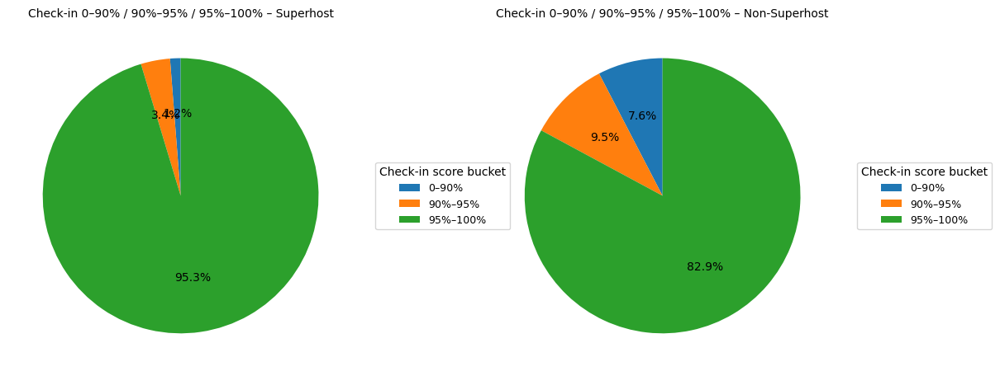

In [963]:
#table
bucket_compare = pd.concat([sup_bucket, non_bucket], ignore_index=True)

share_table = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='share')
        .reindex(labels)
)
share_table.columns.name = None

print("\nShare of listings in each check-in bucket (Superhost vs Non-Superhost):")
display(share_table.style.format('{:.2%}'))

# Pie chart
low_bins   = ['0–80', '80–90']   
mid_bin    = '90–95'
high_bin   = '95–100'

sup_0_90   = sup_bucket.loc[sup_bucket['bucket'].isin(low_bins), 'share'].sum()
sup_90_95  = sup_bucket.loc[sup_bucket['bucket'] == mid_bin, 'share'].sum()
sup_95_100 = sup_bucket.loc[sup_bucket['bucket'] == high_bin, 'share'].sum()

non_0_90   = non_bucket.loc[non_bucket['bucket'].isin(low_bins), 'share'].sum()
non_90_95  = non_bucket.loc[non_bucket['bucket'] == mid_bin, 'share'].sum()
non_95_100 = non_bucket.loc[non_bucket['bucket'] == high_bin, 'share'].sum()


agg_checkin = pd.DataFrame(
    {
        'Superhost':     [sup_0_90,  sup_90_95,  sup_95_100],
        'Non-Superhost': [non_0_90,  non_90_95,  non_95_100],
    },
    index=['0–90%', '90%–95%', '95%–100%']
)

labels_3    = agg_checkin.index.tolist()
sizes_super = agg_checkin['Superhost'].values
sizes_non   = agg_checkin['Non-Superhost'].values

def make_pie_3(ax, sizes, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize': 10},
        radius=1
    )
    ax.set_title(title, fontsize=10)
    ax.legend(
        wedges,
        labels_3,
        title='Check-in score bucket',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=9
    )

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

make_pie_3(axes[0], sizes_super, 'Check-in 0–90% / 90%–95% / 95%–100% – Superhost')
make_pie_3(axes[1], sizes_non,   'Check-in 0–90% / 90%–95% / 95%–100% – Non-Superhost')

plt.tight_layout()
plt.show()

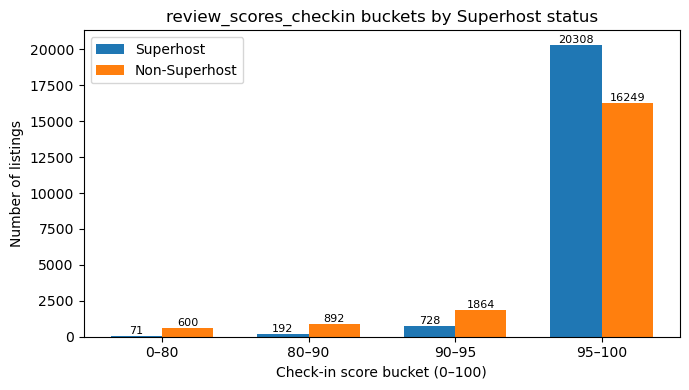

In [964]:
#bar chart
pivot_counts = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='count')
        .reindex(labels)
        .fillna(0)
)

x = np.arange(len(labels))
width = 0.35

sup_vals  = pivot_counts['Superhost'].values
non_vals  = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7, 4))

bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')

plt.xlabel('Check-in score bucket (0–100)')
plt.ylabel('Number of listings')
plt.title('review_scores_checkin buckets by Superhost status')
plt.xticks(x, labels)
plt.legend()

for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h == 0:
        continue
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        h,
        f'{int(h)}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.tight_layout()
plt.show()

In [965]:
report='''
Check-in Scores:

Superhost: Mean 98.61, Median 99.20; Non-superhost: Mean 97.14, Median 99.20. 
Both groups have a median of 99.2, but Superhost has a higher mean and a more concentrated distribution.

Distribution Comparison:
95–100: Superhost 95.35% vs Non-superhost 82.88% (12.5pp higher)
90–95: Superhost 3.42% vs Non-superhost 9.51%
80–90: Superhost 0.90% vs 4.55%
0–80: Superhost 0.33% vs 3.06%

Non-Superhost has a significantly longer percentage of scores below 95,
with the lower score range (≤90) being approximately 4–9 times higher than Superhost.

Bar Chart:

1. Superhost: 95–100 approximately 20,308, 90–95 728, 80–90 192, 0–80 71

2. Non-superhost: 95–100 16,249, 90–95 1,864, 80–90 892, 0–80 600

Low scores are mainly concentrated in Non-superhosts, and even more so in the 80–95 range.

Check-in scores are very important for new hosts.
Superhosts have significantly higher scores in the 95–100 range (95.35% vs 82.88%), while those ≤95 have significantly lower scores (4.65% vs 17.12%). 
This indicates that the guest check-in experience is one of the core indicators distinguishing Superhosts from Non-Superhosts.
'''
print(report)


Check-in Scores:

Superhost: Mean 98.61, Median 99.20; Non-superhost: Mean 97.14, Median 99.20. 
Both groups have a median of 99.2, but Superhost has a higher mean and a more concentrated distribution.

Distribution Comparison:
95–100: Superhost 95.35% vs Non-superhost 82.88% (12.5pp higher)
90–95: Superhost 3.42% vs Non-superhost 9.51%
80–90: Superhost 0.90% vs 4.55%
0–80: Superhost 0.33% vs 3.06%

Non-Superhost has a significantly longer percentage of scores below 95,
with the lower score range (≤90) being approximately 4–9 times higher than Superhost.

Bar Chart:

1. Superhost: 95–100 approximately 20,308, 90–95 728, 80–90 192, 0–80 71

2. Non-superhost: 95–100 16,249, 90–95 1,864, 80–90 892, 0–80 600

Low scores are mainly concentrated in Non-superhosts, and even more so in the 80–95 range.

Check-in scores are very important for new hosts.
Superhosts have significantly higher scores in the 95–100 range (95.35% vs 82.88%), while those ≤95 have significantly lower scores (4.65% vs 

In [966]:
#review_scores_communication
df = df.copy()

if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost']
          .astype(str)
          .str.strip()
          .str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")


comm_raw = pd.to_numeric(df['review_scores_communication'], errors='coerce')
max_val = comm_raw.max()

if pd.notna(max_val) and max_val <= 5.1:
    df['comm_pct'] = comm_raw * 20
elif pd.notna(max_val) and max_val <= 10.1:
    df['comm_pct'] = comm_raw * 10
else:
    # already 0–100
    df['comm_pct'] = comm_raw



summary_comm = (
    df.groupby('is_super')['comm_pct']
      .agg(['count', 'mean', 'median'])
      .rename(index={1: 'Superhost', 0: 'Non-Superhost'})
)

print("\nBasic stats of review_scores_communication (0–100 scale):")
display(summary_comm.style.format({
    'count': '{:,.0f}',
    'mean': '{:.2f}',
    'median': '{:.2f}'
}))


bins = [0, 80, 90, 95, 100]
labels = ['0–80', '80–90', '90–95', '95–100']

def bucket_comm(group_df, group_name):
    r = group_df['comm_pct'].dropna()
    cm_bucket = pd.cut(
        r,
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True
    )

    bucket_counts = (
        cm_bucket.value_counts()
                 .reindex(labels, fill_value=0)
                 .rename_axis('bucket')
                 .reset_index(name='count')
    )

    total_valid = len(r)
    bucket_counts['share'] = (
        bucket_counts['count'] / total_valid if total_valid > 0 else 0
    )
    bucket_counts['group'] = group_name
    return bucket_counts

sup_bucket  = bucket_comm(df[df['is_super'] == 1], 'Superhost')
non_bucket  = bucket_comm(df[df['is_super'] == 0], 'Non-Superhost')

print("\nCommunication score buckets among Superhosts:")
display(
    sup_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

print("\nCommunication score buckets among Non-Superhosts:")
display(
    non_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Basic stats of review_scores_communication (0–100 scale):


,count,mean,median
is_super,,,
Non-Superhost,"19,605",97.13,99.20
Superhost,"21,299",98.75,99.40



Communication score buckets among Superhosts:


,bucket,count,share
0,0–80,62,0.29%
1,80–90,149,0.70%
2,90–95,603,2.83%
3,95–100,"20,485",96.18%



Communication score buckets among Non-Superhosts:


,bucket,count,share
0,0–80,593,3.02%
1,80–90,880,4.49%
2,90–95,"1,822",9.29%
3,95–100,"16,310",83.19%



Share of listings in each communication bucket (Superhost vs Non-Superhost):


,Non-Superhost,Superhost
bucket,,
0–80,3.02%,0.29%
80–90,4.49%,0.70%
90–95,9.29%,2.83%
95–100,83.19%,96.18%


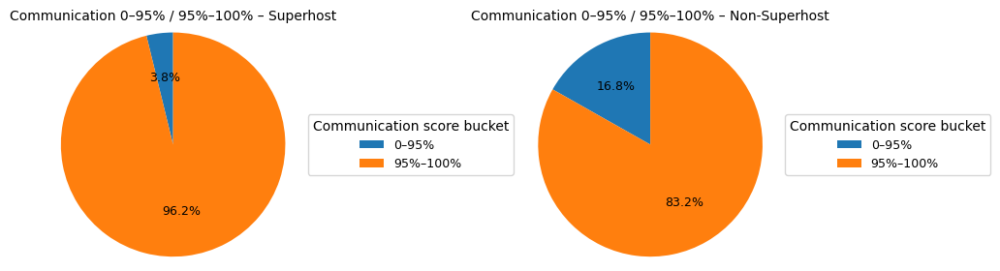

In [967]:
#table
bucket_compare = pd.concat([sup_bucket, non_bucket], ignore_index=True)

share_table = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='share')
        .reindex(labels)
)
share_table.columns.name = None

print("\nShare of listings in each communication bucket (Superhost vs Non-Superhost):")
display(share_table.style.format('{:.2%}'))


# Pie chart
low_bins = ['0–80', '80–90', '90–95']
high_bin = '95–100'

sup_0_95   = sup_bucket.loc[sup_bucket['bucket'].isin(low_bins), 'share'].sum()
sup_95_100 = sup_bucket.loc[sup_bucket['bucket'] == high_bin, 'share'].sum()

non_0_95   = non_bucket.loc[non_bucket['bucket'].isin(low_bins), 'share'].sum()
non_95_100 = non_bucket.loc[non_bucket['bucket'] == high_bin, 'share'].sum()


agg_comm = pd.DataFrame(
    {
        'Superhost':     [sup_0_95,  sup_95_100],
        'Non-Superhost': [non_0_95,  non_95_100],
    },
    index=['0–95%', '95%–100%']
)

labels_2    = agg_comm.index.tolist()
sizes_super = agg_comm['Superhost'].values
sizes_non   = agg_comm['Non-Superhost'].values

def make_pie_2(ax, sizes, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize': 9},
        radius=1.2
    )
    ax.set_title(title, fontsize=10)
    ax.legend(
        wedges,
        labels_2,
        title='Communication score bucket',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=9
    )

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

make_pie_2(axes[0], sizes_super, 'Communication 0–95% / 95%–100% – Superhost')
make_pie_2(axes[1], sizes_non,   'Communication 0–95% / 95%–100% – Non-Superhost')

plt.tight_layout()
plt.show()

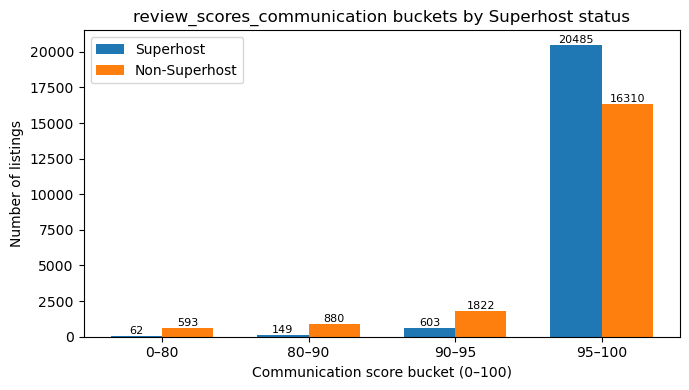

In [968]:
#bar chart
pivot_counts = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='count')
        .reindex(labels)
        .fillna(0)
)

x = np.arange(len(labels))
width = 0.35

sup_vals  = pivot_counts['Superhost'].values
non_vals  = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7, 4))

bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')

plt.xlabel('Communication score bucket (0–100)')
plt.ylabel('Number of listings')
plt.title('review_scores_communication buckets by Superhost status')
plt.xticks(x, labels)
plt.legend()

for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h == 0:
        continue
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        h,
        f'{int(h)}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.tight_layout()
plt.show()

In [969]:
report='''
Based on 47,097 listings (22,091 Superhosts; 23,900 Non-Superhosts), 
communication ratings on a 0–100 scale are highly discriminative for Superhosts: the mean rating for Superhosts is 98.75, and the median is 99.40; 
for Non-Superhosts, the mean rating is 97.13, and the median is 99.20. 

In terms of distribution, ratings ≥95 account for 96.18% of Superhosts vs. 83.19% of Non-Superhosts (a difference of approximately 13%); 
ratings <95 account for 3.82% vs. 16.81%.

Specific ranges: 0–80: 0.29% vs. 3.02%; 80–90: 0.70% vs. 4.49%; 90–95: 2.83% vs. 9.29%.
Based on the relative advantage estimate of "≥95 points", Superhost has an advantage of approximately 25.2,
while Non-Superhost has an advantage of approximately 4.95, with an advantage ratio of ≈ 5.1. 
This means that a high communication score (≥95) has a significant impact on becoming a Superhost.

Overall, the communication score reflects both the quality of host interaction and is linked to the platform's professionalism, 
making it one of the key indicators among interaction factors.
'''
print(report)


Based on 47,097 listings (22,091 Superhosts; 23,900 Non-Superhosts), 
communication ratings on a 0–100 scale are highly discriminative for Superhosts: the mean rating for Superhosts is 98.75, and the median is 99.40; 
for Non-Superhosts, the mean rating is 97.13, and the median is 99.20. 

In terms of distribution, ratings ≥95 account for 96.18% of Superhosts vs. 83.19% of Non-Superhosts (a difference of approximately 13%); 
ratings <95 account for 3.82% vs. 16.81%.

Specific ranges: 0–80: 0.29% vs. 3.02%; 80–90: 0.70% vs. 4.49%; 90–95: 2.83% vs. 9.29%.
Based on the relative advantage estimate of "≥95 points", Superhost has an advantage of approximately 25.2,
while Non-Superhost has an advantage of approximately 4.95, with an advantage ratio of ≈ 5.1. 
This means that a high communication score (≥95) has a significant impact on becoming a Superhost.

Overall, the communication score reflects both the quality of host interaction and is linked to the platform's professionalism, 
making 

In [970]:
#review_scores_location
df = df.copy()

if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost']
          .astype(str)
          .str.strip()
          .str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")


loc_raw = pd.to_numeric(df['review_scores_location'], errors='coerce')
max_val = loc_raw.max()

if pd.notna(max_val) and max_val <= 5.1:
    df['location_pct'] = loc_raw * 20
elif pd.notna(max_val) and max_val <= 10.1:
    df['location_pct'] = loc_raw * 10
else:
    df['location_pct'] = loc_raw

summary_loc = (
    df.groupby('is_super')['location_pct']
      .agg(['count', 'mean', 'median'])
      .rename(index={1: 'Superhost', 0: 'Non-Superhost'})
)

print("\nBasic stats of review_scores_location (0–100 scale):")
display(summary_loc.style.format({
    'count': '{:,.0f}',
    'mean': '{:.2f}',
    'median': '{:.2f}'
}))


bins = [0, 80, 90, 95, 100]
labels = ['0–80', '80–90', '90–95', '95–100']

def bucket_location(group_df, group_name):
    r = group_df['location_pct'].dropna()
    loc_bucket = pd.cut(
        r,
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True
    )

    bucket_counts = (
        loc_bucket.value_counts()
                  .reindex(labels, fill_value=0)
                  .rename_axis('bucket')
                  .reset_index(name='count')
    )

    total_valid = len(r)
    bucket_counts['share'] = (
        bucket_counts['count'] / total_valid if total_valid > 0 else 0
    )
    bucket_counts['group'] = group_name
    return bucket_counts

sup_bucket  = bucket_location(df[df['is_super'] == 1], 'Superhost')
non_bucket  = bucket_location(df[df['is_super'] == 0], 'Non-Superhost')

print("\nLocation score buckets among Superhosts:")
display(
    sup_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

print("\nLocation score buckets among Non-Superhosts:")
display(
    non_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Basic stats of review_scores_location (0–100 scale):


,count,mean,median
is_super,,,
Non-Superhost,"19,605",96.85,98.40
Superhost,"21,299",97.82,98.40



Location score buckets among Superhosts:


,bucket,count,share
0,0–80,80,0.38%
1,80–90,251,1.18%
2,90–95,"1,607",7.54%
3,95–100,"19,361",90.90%



Location score buckets among Non-Superhosts:


,bucket,count,share
0,0–80,505,2.58%
1,80–90,"1,019",5.20%
2,90–95,"2,685",13.70%
3,95–100,"15,396",78.53%



Share of listings in each location bucket (Superhost vs Non-Superhost):


,Non-Superhost,Superhost
bucket,,
0–80,2.58%,0.38%
80–90,5.20%,1.18%
90–95,13.70%,7.54%
95–100,78.53%,90.90%


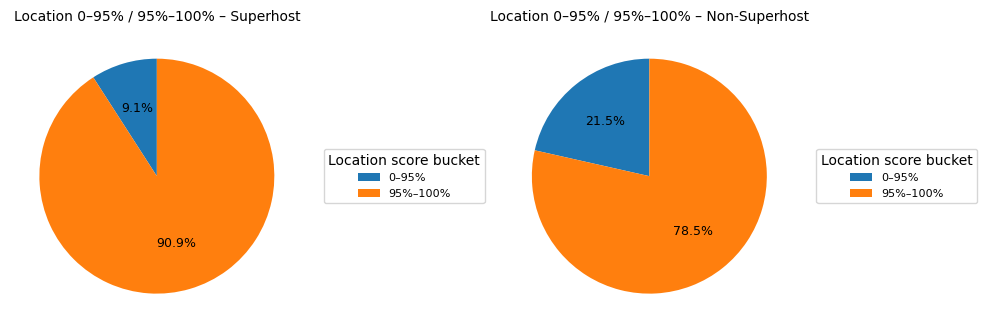

In [971]:
#table
bucket_compare = pd.concat([sup_bucket, non_bucket], ignore_index=True)

share_table = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='share')
        .reindex(labels)
)
share_table.columns.name = None

print("\nShare of listings in each location bucket (Superhost vs Non-Superhost):")
display(share_table.style.format('{:.2%}'))


#Pie chart
low_bins  = ['0–80', '80–90', '90–95']
high_bin  = '95–100'

sup_0_95   = sup_bucket.loc[sup_bucket['bucket'].isin(low_bins), 'share'].sum()
sup_95_100 = sup_bucket.loc[sup_bucket['bucket'] == high_bin, 'share'].sum()

non_0_95   = non_bucket.loc[non_bucket['bucket'].isin(low_bins), 'share'].sum()
non_95_100 = non_bucket.loc[non_bucket['bucket'] == high_bin, 'share'].sum()


agg_loc = pd.DataFrame(
    {
        'Superhost':     [sup_0_95,  sup_95_100],
        'Non-Superhost': [non_0_95,  non_95_100],
    },
    index=['0–95%', '95%–100%']
)

labels_2    = agg_loc.index.tolist()
sizes_super = agg_loc['Superhost'].values
sizes_non   = agg_loc['Non-Superhost'].values

def make_loc_pie(ax, sizes, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize': 9},
        radius=1
    )
    ax.set_title(title, fontsize=10)
    ax.legend(
        wedges,
        labels_2,
        title='Location score bucket',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=8
    )

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

make_loc_pie(axes[0], sizes_super, 'Location 0–95% / 95%–100% – Superhost')
make_loc_pie(axes[1], sizes_non,   'Location 0–95% / 95%–100% – Non-Superhost')

plt.tight_layout()
plt.show()

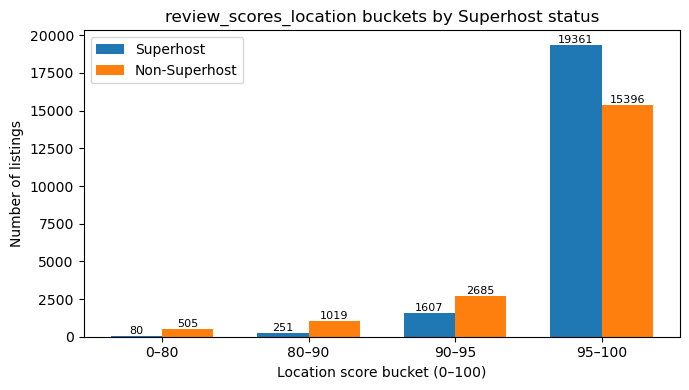

In [972]:
#bar chart
pivot_counts = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='count')
        .reindex(labels)
        .fillna(0)
)

x = np.arange(len(labels))
width = 0.35

sup_vals  = pivot_counts['Superhost'].values
non_vals  = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7, 4))

bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')

plt.xlabel('Location score bucket (0–100)')
plt.ylabel('Number of listings')
plt.title('review_scores_location buckets by Superhost status')
plt.xticks(x, labels)
plt.legend()

for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h == 0:
        continue
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        h,
        f'{int(h)}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.tight_layout()
plt.show()

In [973]:
report='''
The data shows that Superhosts have a significantly higher percentage (90.90%) in the 95–100 score range than Non-Superhosts (78.53%), 
while the percentage in the lower score range (≤95) is significantly lower (9.10% vs 21.47%). 
This indicates a strong correlation between high location scores and becoming a Superhost, 
serving as a stable characteristic for differentiating high-performing listings. 

However, location scores are more influenced by geography and surrounding resources, making them less controllable.
They are more suitable as a control variable than a factor that can be directly modified in the short-term operations of a new host.
'''
print(report)


The data shows that Superhosts have a significantly higher percentage (90.90%) in the 95–100 score range than Non-Superhosts (78.53%), 
while the percentage in the lower score range (≤95) is significantly lower (9.10% vs 21.47%). 
This indicates a strong correlation between high location scores and becoming a Superhost, 
serving as a stable characteristic for differentiating high-performing listings. 

However, location scores are more influenced by geography and surrounding resources, making them less controllable.
They are more suitable as a control variable than a factor that can be directly modified in the short-term operations of a new host.



In [974]:
#review_scores_value
df = df.copy()

if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost']
          .astype(str)
          .str.strip()
          .str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")


val_raw = pd.to_numeric(df['review_scores_value'], errors='coerce')
max_val = val_raw.max()

if pd.notna(max_val) and max_val <= 5.1:
    df['value_pct'] = val_raw * 20
elif pd.notna(max_val) and max_val <= 10.1:
    df['value_pct'] = val_raw * 10
else:
    df['value_pct'] = val_raw


summary_value = (
    df.groupby('is_super')['value_pct']
      .agg(['count', 'mean', 'median'])
      .rename(index={1: 'Superhost', 0: 'Non-Superhost'})
)

print("\nBasic stats of review_scores_value (0–100 scale):")
display(summary_value.style.format({
    'count': '{:,.0f}',
    'mean': '{:.2f}',
    'median': '{:.2f}'
}))


bins = [0, 80, 90, 95, 100]
labels = ['0–80', '80–90', '90–95', '95–100']

def bucket_value(group_df, group_name):
    r = group_df['value_pct'].dropna()
    val_bucket = pd.cut(
        r,
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=True
    )

    bucket_counts = (
        val_bucket.value_counts()
                  .reindex(labels, fill_value=0)
                  .rename_axis('bucket')
                  .reset_index(name='count')
    )

    total_valid = len(r)
    bucket_counts['share'] = (
        bucket_counts['count'] / total_valid if total_valid > 0 else 0
    )
    bucket_counts['group'] = group_name
    return bucket_counts

sup_bucket  = bucket_value(df[df['is_super'] == 1], 'Superhost')
non_bucket  = bucket_value(df[df['is_super'] == 0], 'Non-Superhost')

print("\nValue score buckets among Superhosts:")
display(
    sup_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

print("\nValue score buckets among Non-Superhosts:")
display(
    non_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Basic stats of review_scores_value (0–100 scale):


,count,mean,median
is_super,,,
Non-Superhost,"19,605",93.73,95.60
Superhost,"21,299",96.25,97.00



Value score buckets among Superhosts:


,bucket,count,share
0,0–80,236,1.11%
1,80–90,847,3.98%
2,90–95,"4,398",20.65%
3,95–100,"15,818",74.27%



Value score buckets among Non-Superhosts:


,bucket,count,share
0,0–80,"1,391",7.10%
1,80–90,"2,763",14.09%
2,90–95,"5,057",25.79%
3,95–100,"10,394",53.02%



Share of listings in each value bucket (Superhost vs Non-Superhost):


,Non-Superhost,Superhost
bucket,,
0–80,7.10%,1.11%
80–90,14.09%,3.98%
90–95,25.79%,20.65%
95–100,53.02%,74.27%


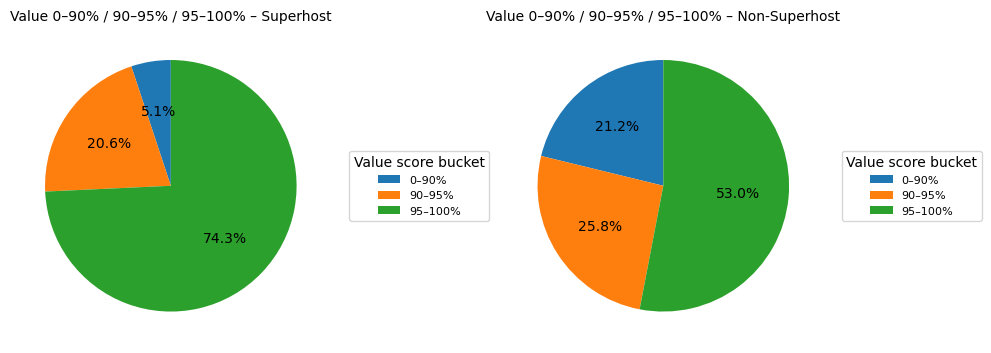

In [975]:
bucket_compare = pd.concat([sup_bucket, non_bucket], ignore_index=True)

share_table = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='share')
        .reindex(labels)
)
share_table.columns.name = None

print("\nShare of listings in each value bucket (Superhost vs Non-Superhost):")
display(share_table.style.format('{:.2%}'))

#Pie chart
low_bins  = ['0–80', '80–90']   
mid_bin   = '90–95'             
high_bin  = '95–100'            

sup_0_90   = sup_bucket.loc[sup_bucket['bucket'].isin(low_bins), 'share'].sum()
sup_90_95  = sup_bucket.loc[sup_bucket['bucket'] == mid_bin, 'share'].sum()
sup_95_100 = sup_bucket.loc[sup_bucket['bucket'] == high_bin, 'share'].sum()

non_0_90   = non_bucket.loc[non_bucket['bucket'].isin(low_bins), 'share'].sum()
non_90_95  = non_bucket.loc[non_bucket['bucket'] == mid_bin, 'share'].sum()
non_95_100 = non_bucket.loc[non_bucket['bucket'] == high_bin, 'share'].sum()


agg_value = pd.DataFrame(
    {
        'Superhost':     [sup_0_90,  sup_90_95,  sup_95_100],
        'Non-Superhost': [non_0_90,  non_90_95,  non_95_100],
    },
    index=['0–90%', '90–95%', '95–100%']
)

labels_3    = agg_value.index.tolist()              
sizes_super = agg_value['Superhost'].values
sizes_non   = agg_value['Non-Superhost'].values

def make_value_pie(ax, sizes, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',          
        startangle=90,
        textprops={'fontsize': 10},
        radius=1
    )
    ax.set_title(title, fontsize=10)
    ax.legend(
        wedges,
        labels_3,                   
        title='Value score bucket',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=8
    )

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

make_value_pie(axes[0], sizes_super, 'Value 0–90% / 90–95% / 95–100% – Superhost')
make_value_pie(axes[1], sizes_non,   'Value 0–90% / 90–95% / 95–100% – Non-Superhost')

plt.tight_layout()
plt.show()

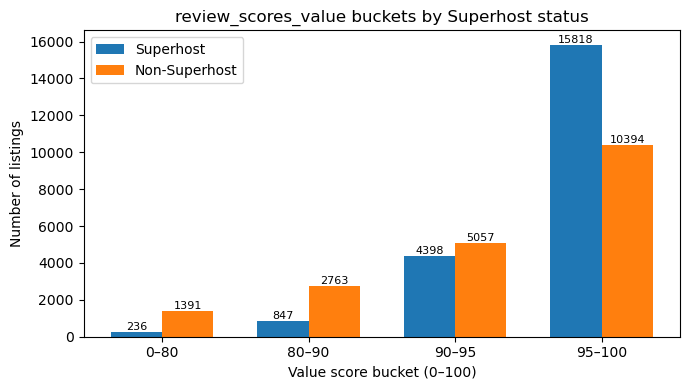

In [976]:
#bar chart
pivot_counts = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='count')
        .reindex(labels)
        .fillna(0)
)

x = np.arange(len(labels))
width = 0.35

sup_vals  = pivot_counts['Superhost'].values
non_vals  = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7, 4))

bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')

plt.xlabel('Value score bucket (0–100)')
plt.ylabel('Number of listings')
plt.title('review_scores_value buckets by Superhost status')
plt.xticks(x, labels)
plt.legend()

for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h == 0:
        continue
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        h,
        f'{int(h)}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.tight_layout()
plt.show()

In [977]:
report='''
Overall Value Scores: 
Superhosts: 21,299 listings; Non-Superhosts: 19,605 listings
Mean Score: 96.25 (Superhost) vs 93.73 (Non-Superhost)
Median: 97.00 (Superhost) vs 95.60 (Non-Superhost)

Bar Chart:
0–80: 236 (Superhost) vs 1,391 (Non-Superhost)
80–90: 847 vs 2,763
90–95: 4,398 vs 5,057
95–100: 15,818 vs 10,394

Pie Chart:
Superhost: 0–90 5.1%｜90–95 20.6%｜95–100 74.3%
Non-Superhost: 0–90 21.2% | 90–95 25.8% | 95–100 53.0%

Key Comparisons:
Difference in percentage of high-scoring users (95–100): 74.3% (SH) – 53.0% (NSH) (Superhost is more concentrated at the top).
Difference in percentage of low-scoring users (≤90): 5.1% (SH) – 21.2% (NSH) (Superhost has fewer low-scoring users).
Superhost's mean/median score is 2.52/1.40 points higher.
Conclusion: Superhost is significantly better overall in terms of "value for money": 21.3% more guests scored high (95–100), 
and 16.1% fewer scored low (≤90); its mean score of 96.25 and median score of 97.00 are also higher than non-Superhost (93.73 / 95.60). 
This indicates that Superhost is more consistent and closer to the perfect score range in guests' perception of whether the cost matches the experience.
This indicator has only a moderate impact.
'''
print(report)


Overall Value Scores: 
Superhosts: 21,299 listings; Non-Superhosts: 19,605 listings
Mean Score: 96.25 (Superhost) vs 93.73 (Non-Superhost)
Median: 97.00 (Superhost) vs 95.60 (Non-Superhost)

Bar Chart:
0–80: 236 (Superhost) vs 1,391 (Non-Superhost)
80–90: 847 vs 2,763
90–95: 4,398 vs 5,057
95–100: 15,818 vs 10,394

Pie Chart:
Superhost: 0–90 5.1%｜90–95 20.6%｜95–100 74.3%
Non-Superhost: 0–90 21.2% | 90–95 25.8% | 95–100 53.0%

Key Comparisons:
Difference in percentage of high-scoring users (95–100): 74.3% (SH) – 53.0% (NSH) (Superhost is more concentrated at the top).
Difference in percentage of low-scoring users (≤90): 5.1% (SH) – 21.2% (NSH) (Superhost has fewer low-scoring users).
Superhost's mean/median score is 2.52/1.40 points higher.
Conclusion: Superhost is significantly better overall in terms of "value for money": 21.3% more guests scored high (95–100), 
and 16.1% fewer scored low (≤90); its mean score of 96.25 and median score of 97.00 are also higher than non-Superhost (93.

In [978]:
from scipy import stats

# Superhost
df = df.copy()
if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost'].astype(str).str.strip().str.lower()
          .map({'t':1,'true':1,'1':1,'f':0,'false':0,'0':0}).astype('Int8')
    )


score_cols = [
    'review_scores_rating',         
    'review_scores_accuracy',       
    'review_scores_cleanliness',    
    'review_scores_checkin',        
    'review_scores_communication',  
    'review_scores_location',       
    'review_scores_value',          
]


def to_100_scale(s: pd.Series) -> pd.Series:
    r = pd.to_numeric(s, errors='coerce')
    mx = r.max()
    if pd.isna(mx):
        return r
    if mx <= 5.1:   
        return r * 20
    if mx <= 10.1:  
        return r * 10
    return r        

# Welch t-test 
def welch_ttest(x, g):
    """x: Series；g: (1=Superhost, 0=Non)"""
    a = x[g==1].dropna().astype(float)
    b = x[g==0].dropna().astype(float)
    n1, n0 = len(a), len(b)
    m1, m0 = a.mean(), b.mean()
    s1, s0 = a.var(ddof=1), b.var(ddof=1)
   
    # t/df (Welch)
    se = np.sqrt(s1/n1 + s0/n0)
    t = (m1 - m0) / se
    df_w = (s1/n1 + s0/n0)**2 / ((s1**2)/((n1**2)*(n1-1)) + (s0**2)/((n0**2)*(n0-1)))
    p = 2*stats.t.sf(np.abs(t), df_w)

    # 均值差 CI
    alpha = 0.05
    tcrit = stats.t.ppf(1 - alpha/2, df_w)
    diff = m1 - m0
    ci_low, ci_high = diff - tcrit*se, diff + tcrit*se

    # Cohen's d（pooled SD） Hedges' g
    sp = np.sqrt(((n1-1)*s1 + (n0-1)*s0) / (n1 + n0 - 2))
    d = diff / sp if sp > 0 else np.nan
    J = 1 - 3/(4*(n1+n0)-9)            # Hedges g 
    g_eff = J * d

    return {
        'n_super': n1, 'n_non': n0,
        'mean_super': m1, 'mean_non': m0, 'diff(SH-NSH)': diff,
        't': t, 'df': df_w, 'p': p,
        'ci_low': ci_low, 'ci_high': ci_high,
        "cohen_d": d, "hedges_g": g_eff
    }


rows = []
for col in score_cols:
    x100 = to_100_scale(df[col])
    res = welch_ttest(x100, df['is_super'])
    res['metric'] = col
    rows.append(res)

out = pd.DataFrame(rows)

# Benjamini–Hochberg (FDR) 
p = out['p'].values
m = len(p)
order = np.argsort(p)
rank = np.empty_like(order)
rank[order] = np.arange(1, m+1)
p_bh = p * m / rank
# BH 
p_bh_sorted = np.minimum.accumulate(np.sort(p_bh)[::-1])[::-1]
p_bh_final = np.empty_like(p_bh_sorted)
p_bh_final[order] = p_bh_sorted
out['p_FDR_BH'] = np.clip(p_bh_final, 0, 1)


show = (out
    .loc[:, ['metric','n_super','n_non','mean_super','mean_non','diff(SH-NSH)',
             't','df','p','p_FDR_BH','ci_low','ci_high','cohen_d','hedges_g']]
    .sort_values('p_FDR_BH')
)
pd.set_option('display.float_format', lambda v: f"{v:,.4f}")
print("Welch t-test: Superhost vs Non-Superhost")
display(show)

Welch t-test: Superhost vs Non-Superhost


,metric,n_super,n_non,mean_super,mean_non,diff(SH-NSH),t,df,p,p_FDR_BH,ci_low,ci_high,cohen_d,hedges_g
0,review_scores_rating,21299,19606,97.7993,95.4511,2.3481,43.8067,"25,338.0763",0.0000,0.0000,2.2431,2.4532,0.4467,0.4467
1,review_scores_accuracy,21299,19605,98.0314,95.9475,2.0839,39.5454,"26,044.8221",0.0000,0.0000,1.9806,2.1871,0.4028,0.4028
2,review_scores_cleanliness,21299,19606,97.7043,95.1130,2.5913,44.8630,"25,908.2452",0.0000,0.0000,2.4781,2.7045,0.4570,0.4570
6,review_scores_value,21299,19605,96.2516,93.7276,2.5240,40.5597,"27,506.2220",0.0000,0.0000,2.4021,2.6460,0.4121,0.4121
4,review_scores_communication,21299,19605,98.7535,97.1254,1.6282,33.8539,"24,624.8069",0.0000,0.0000,1.5339,1.7224,0.3457,0.3457
3,review_scores_checkin,21299,19605,98.6052,97.1406,1.4646,30.3113,"25,864.0741",0.0000,0.0000,1.3699,1.5593,0.3088,0.3088
5,review_scores_location,21299,19605,97.8230,96.8542,0.9687,23.4653,"27,906.5955",0.0000,0.0000,0.8878,1.0497,0.2382,0.2382


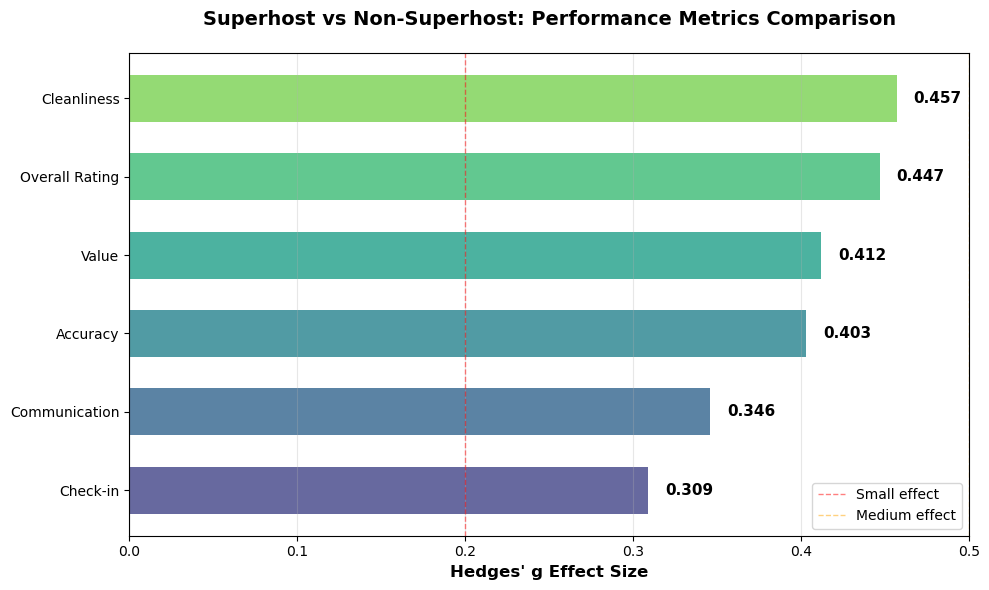

In [979]:
def create_clean_effect_size_plot():
  
    plt.rcParams['font.family'] = 'DejaVu Sans'
    plt.rcParams['font.sans-serif'] = ['DejaVu Sans']
    
    
    data = {
        'Metric': ['Check-in', 'Communication', 'Accuracy', 'Value', 'Overall Rating', 'Cleanliness'],
        'Effect_Size': [0.309, 0.346, 0.403, 0.412, 0.447, 0.457]
    }
    df = pd.DataFrame(data)
    
   
    fig, ax = plt.subplots(figsize=(10, 6))
    
   
    df = df.sort_values('Effect_Size', ascending=True)
    
    
    colors = plt.cm.viridis(np.linspace(0.2, 0.8, len(df)))
    bars = ax.barh(df['Metric'], df['Effect_Size'], color=colors, alpha=0.8, height=0.6)
    
   
    for bar, value in zip(bars, df['Effect_Size']):
        ax.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2, 
                f'{value:.3f}', ha='left', va='center', fontsize=11, fontweight='bold')
    
    
    ax.set_xlabel("Hedges' g Effect Size", fontsize=12, fontweight='bold')
    ax.set_title("Superhost vs Non-Superhost: Performance Metrics Comparison", 
                 fontsize=14, fontweight='bold', pad=20)
    
    
    ax.grid(True, alpha=0.3, axis='x')
    ax.axvline(x=0, color='black', linestyle='-', alpha=0.3)
    ax.axvline(x=0.2, color='red', linestyle='--', alpha=0.5, linewidth=1, label='Small effect')
    ax.axvline(x=0.5, color='orange', linestyle='--', alpha=0.5, linewidth=1, label='Medium effect')
    
   
    ax.set_xlim(0, 0.5)
    ax.set_xticks(np.arange(0, 0.51, 0.1))
    
    
    ax.legend(loc='lower right')
    
    
    plt.tight_layout()
    plt.show()
    
    return df
if __name__ == "__main__":
    results = create_clean_effect_size_plot()

In [980]:
report='''
We compare Superhosts vs Non-Superhosts using Welch’s t-tests on six review metrics. 
All differences remain statistically significant after Benjamini–Hochberg FDR correction (p < 0.001). 
We report the mean difference (Super − Non) with 95% CI and Hedges’ g (standardized effect size).

Results (ranked by effect size g):
Cleanliness:(95% CI 2.48–2.70), g = 0.457 → largest, medium effect.
Overall rating: (2.24–2.45), g = 0.447, medium.
Value: (2.40–2.65), g = 0.412, medium.
Accuracy: (1.98–2.19), g = 0.403, medium.
Communication: (1.53–1.72), g = 0.346, small–medium.
Check-in: (1.37–1.56), g = 0.309, small–medium.
Location :(0.89–1.05), g = 0.238, small and less controllable.


All six metrics are significantly higher for Superhosts; four of them reach medium effects (Cleanliness, Overall, Value, Accuracy).

Cleanliness shows the largest practical gap (g≈0.46): standardizing cleaning SOPs is the most actionable lever.

Overall/Accuracy reflect expectation alignment; Value indicates better price-to-experience perception—all with medium effects.

Communication/Check-in remain significant but with smaller effects; they are still worth fixing but come after cleanliness/accuracy/value.

Location differs statistically yet has small effect and low controllability → treat mainly as a control variable when benchmarking.
'''
print(report)



We compare Superhosts vs Non-Superhosts using Welch’s t-tests on six review metrics. 
All differences remain statistically significant after Benjamini–Hochberg FDR correction (p < 0.001). 
We report the mean difference (Super − Non) with 95% CI and Hedges’ g (standardized effect size).

Results (ranked by effect size g):
Cleanliness:(95% CI 2.48–2.70), g = 0.457 → largest, medium effect.
Overall rating: (2.24–2.45), g = 0.447, medium.
Value: (2.40–2.65), g = 0.412, medium.
Accuracy: (1.98–2.19), g = 0.403, medium.
Communication: (1.53–1.72), g = 0.346, small–medium.
Check-in: (1.37–1.56), g = 0.309, small–medium.
Location :(0.89–1.05), g = 0.238, small and less controllable.


All six metrics are significantly higher for Superhosts; four of them reach medium effects (Cleanliness, Overall, Value, Accuracy).

Cleanliness shows the largest practical gap (g≈0.46): standardizing cleaning SOPs is the most actionable lever.

Overall/Accuracy reflect expectation alignment; Value indicates bet

In [981]:
#host_listing count
d = df.copy()
if 'is_super' not in d.columns:
    d['is_super'] = (
        d['host_is_superhost']
          .astype(str).str.strip().str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

# Function to detect columns
def _detect_col(columns, candidates):
    lower = {c.lower(): c for c in columns}
    for cand in candidates:
        if cand.lower() in lower:
            return lower[cand.lower()]
    for c in columns:  # fallback
        cl = c.lower().replace("_","")
        for cand in candidates:
            if cand.lower().replace("_","") in cl:
                return c
    return None

HOST    = _detect_col(d.columns, ["host_id","hostid","host_id_str"])
LISTING = _detect_col(d.columns, ["id","listing_id","listingid"])

assert HOST is not None, "no find host id"
assert LISTING is not None, "no find listing id"

# Marking superhosts
host_flag = (
    d.groupby(HOST)['is_super'].max()
      .rename('host_is_super').astype('Int8')
)

# Count the unique listings per host
host_listings = (
    d.groupby(HOST)[LISTING].nunique()
      .rename('n_listings').astype(int)
)

host_df = pd.concat([host_flag, host_listings], axis=1).reset_index()

# Bucketize listing counts into 1, 2–3, 4–5, 6–10, 10+
def bucketize(n: int) -> str:
    if pd.isna(n):
        return "NA"
    n = int(n)
    if n <= 1:   return "1"
    if n == 2:   return "2"
    if n == 3:   return "3"
    if n == 4:   return "4"
    if n == 5:   return "5"
    if n == 6:   return "6"
    if n == 7:   return "7"
    if n == 8:   return "8"
    if n == 9:   return "9"
    if n == 10:  return "10"
    return "10+"

order = ["1","2","3","4","5","6","7","8","9","10","10+"]  # 用于 reindex/作图刻度一致

host_df['bucket'] = host_df['n_listings'].map(bucketize)


# Function to count the frequency of each bucket
def bucket_table(g, gname):
    ct = (g['bucket'].value_counts()
          .reindex(order, fill_value=0)
          .rename_axis('bucket')
          .to_frame(name='count')
          .reset_index())
    total = ct['count'].sum()
    ct['share'] = ct['count'] / total if total > 0 else 0
    ct['group'] = gname
    return ct

# Superhost and Non-Superhost bucket counts
sup_bucket = bucket_table(host_df[host_df['host_is_super'] == 1], 'Superhost')
non_bucket = bucket_table(host_df[host_df['host_is_super'] == 0], 'Non-Superhost')

# Display tables for Superhost and Non-Superhost bucket counts
print("\nHost listing count buckets — Superhost (per host):")
display(sup_bucket[['bucket', 'count', 'share']].style.format({'count': '{:,.0f}', 'share': '{:.2%}'}))

print("\nHost listing count buckets — Non-Superhost (per host):")
display(non_bucket[['bucket', 'count', 'share']].style.format({'count': '{:,.0f}', 'share': '{:.2%}'}))


Host listing count buckets — Superhost (per host):


,bucket,count,share
0,1,"9,474",76.56%
1,2,"1,705",13.78%
2,3,538,4.35%
3,4,213,1.72%
4,5,108,0.87%
5,6,76,0.61%
6,7,41,0.33%
7,8,34,0.27%
8,9,18,0.15%
9,10,15,0.12%



Host listing count buckets — Non-Superhost (per host):


,bucket,count,share
0,1,"12,713",84.06%
1,2,"1,398",9.24%
2,3,439,2.90%
3,4,188,1.24%
4,5,106,0.70%
5,6,69,0.46%
6,7,46,0.30%
7,8,19,0.13%
8,9,25,0.17%
9,10,16,0.11%



Share of hosts in each listing-count bucket (Superhost vs Non-Superhost):


,Superhost,Non-Superhost
1,76.56%,84.06%
2–3,18.13%,12.15%
4–5,2.59%,1.94%
6–10+,2.72%,1.85%


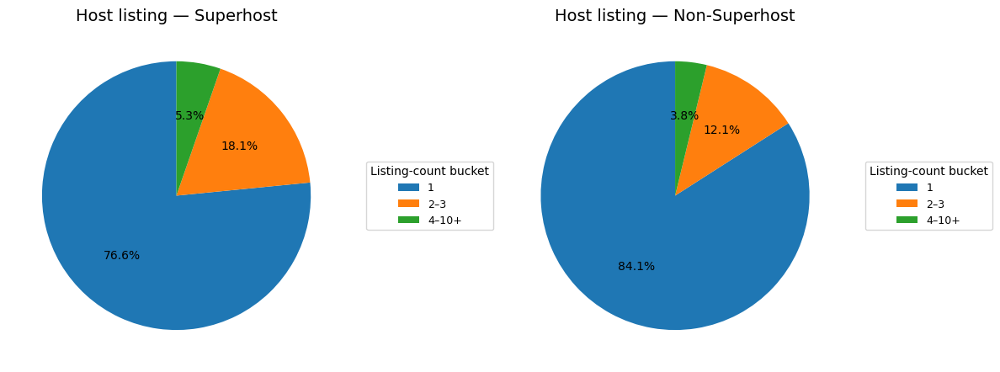

In [982]:
#share table
host_flag = d.groupby(HOST)['is_super'].max().rename('host_is_super').astype('Int8')
host_n    = d.groupby(HOST)[LISTING].nunique().rename('n_listings').astype(int)
host_df   = pd.concat([host_flag, host_n], axis=1).reset_index()


def bucketize_full(n):
    if n == 1: return "1"
    if 2 <= n <= 3: return "2–3"
    if 4 <= n <= 5: return "4–5"
    if 6 <= n <= 10: return "6–10"
    return "10+"

order_full = ["1","2–3","4–5","6–10","10+"]
host_df['bucket_full'] = host_df['n_listings'].map(bucketize_full)

def bucket_table(g):
    ct = (g['bucket_full'].value_counts()
          .reindex(order_full, fill_value=0)
          .rename_axis('bucket_full').to_frame('count').reset_index())
    total = ct['count'].sum()
    ct['share'] = ct['count'] / total if total > 0 else 0.0
    return ct

sup_tab  = bucket_table(host_df[host_df['host_is_super']==1]).assign(group='Superhost')
non_tab  = bucket_table(host_df[host_df['host_is_super']==0]).assign(group='Non-Superhost')
both_tab = pd.concat([sup_tab, non_tab], ignore_index=True)


share_full = (
    both_tab.pivot(index='bucket_full', columns='group', values='share')
            .reindex(order_full)
)


collapsed = pd.DataFrame(index=['1','2–3','4–5','6–10+'],
                         columns=['Superhost','Non-Superhost'], dtype=float)
collapsed.loc['1']     = share_full.loc['1']
collapsed.loc['2–3']   = share_full.loc['2–3']
collapsed.loc['4–5']   = share_full.loc['4–5']
collapsed.loc['6–10+'] = share_full.loc[['6–10','10+']].sum(skipna=True)

print("\nShare of hosts in each listing-count bucket (Superhost vs Non-Superhost):")
display(collapsed.style.format('{:.2%}'))



#pie chart
def get_collapsed_3():
    if 'collapsed' in globals():
        c = collapsed.copy()
        out = pd.DataFrame(index=['1','2–3','4–10+'], columns=c.columns, dtype=float)
        out.loc['1']     = c.loc['1']
        out.loc['2–3']   = c.loc['2–3']
        out.loc['4–10+'] = c.loc[['4–5','6–10+']].sum(skipna=True)
        return out.fillna(0.0)

    assert 'share_full' in globals(), "lack share_full"
    sf = share_full.copy() 
    out = pd.DataFrame(index=['1','2–3','4–10+'], columns=sf.columns, dtype=float)
    out.loc['1']     = sf.loc['1']
    out.loc['2–3']   = sf.loc['2–3']
    out.loc['4–10+'] = sf.loc[['4–5','6–10','10+']].sum(skipna=True)
    return out.fillna(0.0)

pie_share = get_collapsed_3()


labels_3    = ['1','2–3','4–10+']
sizes_super = pie_share['Superhost'].values
sizes_non   = pie_share['Non-Superhost'].values

def make_pie(ax, sizes, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize': 10},
        radius=1
    )
    ax.set_title(title, fontsize=14)
    ax.legend(
        wedges,
        labels_3,
        title='Listing-count bucket',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=9
    )

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
make_pie(axes[0], sizes_super, 'Host listing — Superhost')
make_pie(axes[1], sizes_non,   'Host listing — Non-Superhost')
plt.tight_layout()
plt.show()

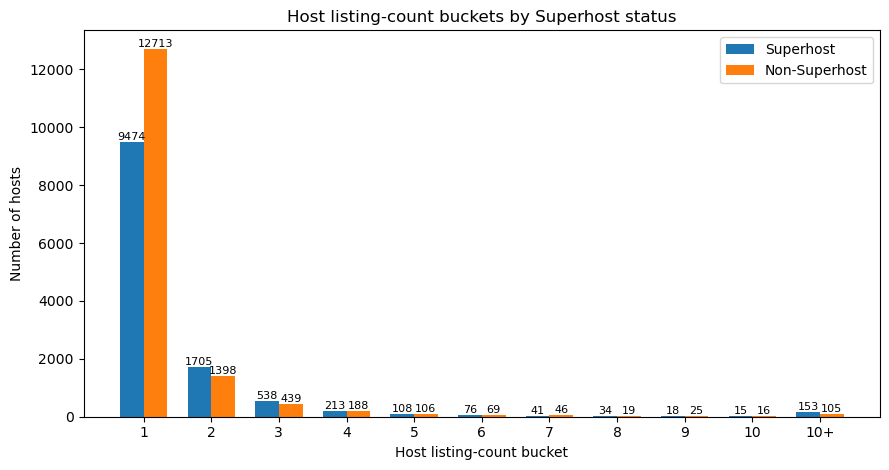

In [983]:
# bar chart
order_full = [str(i) for i in range(1, 11)] + ['10+']

if 'host_df_full' not in globals():
    assert 'host_df' in globals(), "need host _df"
    def bucket_full(n):
        return str(int(n)) if n <= 10 else '10+'
    host_df_full = host_df.copy()
    host_df_full['bucket_full'] = host_df_full['n_listings'].map(bucket_full)

def _bucket_table_full(g, gname):
    ct = (g['bucket_full'].value_counts()
          .reindex(order_full, fill_value=0)
          .rename_axis('bucket').to_frame('count').reset_index())
    ct['group'] = gname
    return ct

sup_full = _bucket_table_full(host_df_full[host_df_full['host_is_super'] == 1], 'Superhost')
non_full = _bucket_table_full(host_df_full[host_df_full['host_is_super'] == 0], 'Non-Superhost')
full_bucket_compare = pd.concat([sup_full, non_full], ignore_index=True)


pivot_counts = (full_bucket_compare
                .pivot(index='bucket', columns='group', values='count')
                .reindex(order_full)
                .fillna(0))

x = np.arange(len(order_full))
width = 0.35

sup_vals = pivot_counts['Superhost'].values
non_vals = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(9, 4.8))
bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')

plt.xlabel('Host listing-count bucket')
plt.ylabel('Number of hosts')
plt.title('Host listing-count buckets by Superhost status')
plt.xticks(x, order_full)
plt.legend()


for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h > 0:
        plt.text(bar.get_x() + bar.get_width()/2, h, f'{int(h)}',
                 ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()

In [984]:
#number of review
df = df.copy()

if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost']
          .astype(str)
          .str.strip()
          .str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")


reviews_raw = pd.to_numeric(df['number_of_reviews'], errors='coerce')
df['n_reviews'] = reviews_raw


summary_reviews = (
    df.groupby('is_super')['n_reviews']
      .agg(['count', 'mean', 'median'])
      .rename(index={1: 'Superhost', 0: 'Non-Superhost'})
)

print("\nBasic stats of number_of_reviews:")
display(summary_reviews.style.format({
    'count': '{:,.0f}',
    'mean': '{:.2f}',
    'median': '{:.2f}'
}))


bins = [0, 1, 6, 21, 51, np.inf]
labels = ['0', '1–5', '6–20', '21–50', '50+']

def bucket_n_reviews(group_df, group_name):
    r = group_df['n_reviews'].dropna()
    rv_bucket = pd.cut(
        r,
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=False   # left-closed, so [0,1), [1,6), ...
    )

    bucket_counts = (
        rv_bucket.value_counts()
                 .reindex(labels, fill_value=0)
                 .rename_axis('bucket')
                 .reset_index(name='count')
    )

    total_valid = len(r)
    bucket_counts['share'] = (
        bucket_counts['count'] / total_valid if total_valid > 0 else 0
    )
    bucket_counts['group'] = group_name
    return bucket_counts

sup_bucket  = bucket_n_reviews(df[df['is_super'] == 1], 'Superhost')
non_bucket  = bucket_n_reviews(df[df['is_super'] == 0], 'Non-Superhost')

print("\nNumber_of_reviews buckets among Superhosts:")
display(
    sup_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

print("\nNumber_of_reviews buckets among Non-Superhosts:")
display(
    non_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Basic stats of number_of_reviews:


,count,mean,median
is_super,,,
Non-Superhost,"23,900",30.51,7.00
Superhost,"22,091",99.23,50.00



Number_of_reviews buckets among Superhosts:


,bucket,count,share
0,0,792,3.59%
1,1–5,"1,792",8.11%
2,6–20,"3,858",17.46%
3,21–50,"4,680",21.19%
4,50+,"10,969",49.65%



Number_of_reviews buckets among Non-Superhosts:


,bucket,count,share
0,0,"4,294",17.97%
1,1–5,"6,770",28.33%
2,6–20,"5,625",23.54%
3,21–50,"3,328",13.92%
4,50+,"3,883",16.25%



Share of listings in each number_of_reviews bucket (Superhost vs Non-Superhost):


,Non-Superhost,Superhost
bucket,,
0,17.97%,3.59%
1–5,28.33%,8.11%
6–20,23.54%,17.46%
21–50,13.92%,21.19%
50+,16.25%,49.65%


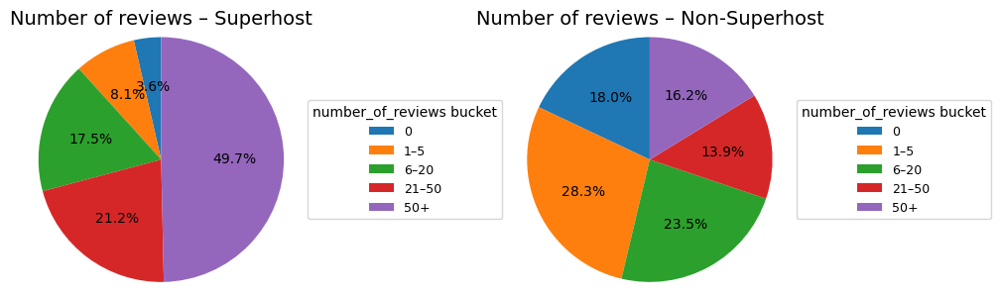

In [985]:
#table
bucket_compare = pd.concat([sup_bucket, non_bucket], ignore_index=True)

share_table = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='share')
        .reindex(labels)
)
share_table.columns.name = None

print("\nShare of listings in each number_of_reviews bucket (Superhost vs Non-Superhost):")
display(share_table.style.format('{:.2%}'))


#Pie chart

labels_pie = sup_bucket['bucket'].tolist()  

sizes_super = sup_bucket['share'].values
sizes_non   = non_bucket['share'].values

def make_reviews_pie(ax, sizes, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',          
        startangle=90,
        textprops={'fontsize': 10},
        radius=1.2
    )
    ax.set_title(title, fontsize=14)
    ax.legend(
        wedges,
        labels_pie,
        title='number_of_reviews bucket',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=9
    )

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

make_reviews_pie(axes[0], sizes_super, 'Number of reviews – Superhost')
make_reviews_pie(axes[1], sizes_non,   'Number of reviews – Non-Superhost')

plt.tight_layout()
plt.show()

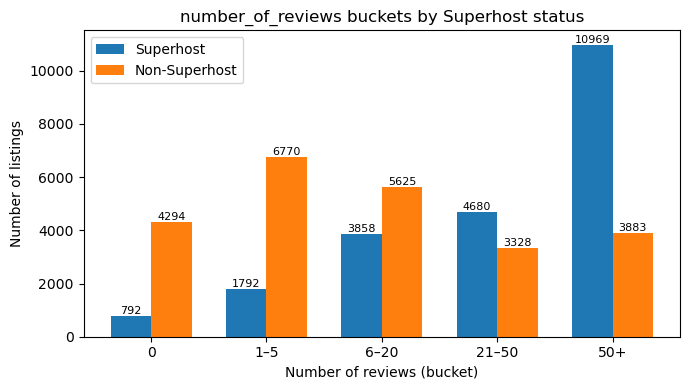

In [986]:
#bar chart
pivot_counts = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='count')
        .reindex(labels)
        .fillna(0)
)

x = np.arange(len(labels))
width = 0.35

sup_vals  = pivot_counts['Superhost'].values
non_vals  = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7, 4))

bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')

plt.xlabel('Number of reviews (bucket)')
plt.ylabel('Number of listings')
plt.title('number_of_reviews buckets by Superhost status')
plt.xticks(x, labels)
plt.legend()


for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h == 0:
        continue
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        h,
        f'{int(h)}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.tight_layout()
plt.show()

In [987]:
report='''
Sample Size: Superhost 22,091; Non-Superhost 23,900.

Central Trend:
Superhost: Mean 99.23, Median 50;
Non-Superhost: Mean 30.51, Median 7.

Therefore, Superhost has a significantly higher total number of reviews, both in terms of mean and median (median 50 vs 7).

Distribution (Percentage):
Superhost: 0 (3.59%) | 1–5 (8.11%) | 6–20 (17.46%) | 21–50 (21.19%) | 50+ (49.65%). Nearly half (49.65%) of Superhost listings have ≥50 reviews.
Non-Superhost: 0 (17.97%) | 1–5 (28.33%) | 6–20 (23.54%) | 21–50 (13.92%) | 50+ (16.25%). 
The percentage of hosts with low review counts (≤5) is 46.30% (0 plus 1–5), while hosts with ≥50 reviews account for only 16.25%.

Conclusion: A structural divergence exists between Superhosts and Non-Superhosts in terms of reviews: 
Superhosts are significantly concentrated in the high review count segment (≥50), 
while Non-Superhosts are largely concentrated in the low review count segment (≤5). 
This means that Superhosts have accumulated more social validation and reputation, resulting in a higher recommendation rate.
'''
print(report)


Sample Size: Superhost 22,091; Non-Superhost 23,900.

Central Trend:
Superhost: Mean 99.23, Median 50;
Non-Superhost: Mean 30.51, Median 7.

Therefore, Superhost has a significantly higher total number of reviews, both in terms of mean and median (median 50 vs 7).

Distribution (Percentage):
Superhost: 0 (3.59%) | 1–5 (8.11%) | 6–20 (17.46%) | 21–50 (21.19%) | 50+ (49.65%). Nearly half (49.65%) of Superhost listings have ≥50 reviews.
Non-Superhost: 0 (17.97%) | 1–5 (28.33%) | 6–20 (23.54%) | 21–50 (13.92%) | 50+ (16.25%). 
The percentage of hosts with low review counts (≤5) is 46.30% (0 plus 1–5), while hosts with ≥50 reviews account for only 16.25%.

Conclusion: A structural divergence exists between Superhosts and Non-Superhosts in terms of reviews: 
Superhosts are significantly concentrated in the high review count segment (≥50), 
while Non-Superhosts are largely concentrated in the low review count segment (≤5). 
This means that Superhosts have accumulated more social validation a

In [988]:
#reviews_per_month
df = df.copy()

if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost']
          .astype(str)
          .str.strip()
          .str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")


rpm_raw = pd.to_numeric(df['reviews_per_month'], errors='coerce')
df['rpm'] = rpm_raw


summary_rpm = (
    df.groupby('is_super')['rpm']
      .agg(['count', 'mean', 'median'])
      .rename(index={1: 'Superhost', 0: 'Non-Superhost'})
)

print("\nBasic stats of reviews_per_month:")
display(summary_rpm.style.format({
    'count': '{:,.0f}',
    'mean': '{:.3f}',
    'median': '{:.3f}'
}))


bins = [0, 1e-9, 0.2, 0.5, 1.0, np.inf]
labels = ['0', '0–0.2', '0.2–0.5', '0.5–1', '1+']

def bucket_rpm(group_df, group_name):
    r = group_df['rpm'].dropna()
    rpm_bucket = pd.cut(
        r,
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=False
    )

    bucket_counts = (
        rpm_bucket.value_counts()
                  .reindex(labels, fill_value=0)
                  .rename_axis('bucket')
                  .reset_index(name='count')
    )

    total_valid = len(r)
    bucket_counts['share'] = (
        bucket_counts['count'] / total_valid if total_valid > 0 else 0
    )
    bucket_counts['group'] = group_name
    return bucket_counts

sup_bucket  = bucket_rpm(df[df['is_super'] == 1], 'Superhost')
non_bucket  = bucket_rpm(df[df['is_super'] == 0], 'Non-Superhost')

print("\nreviews_per_month buckets among Superhosts:")
display(
    sup_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

print("\nreviews_per_month buckets among Non-Superhosts:")
display(
    non_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Basic stats of reviews_per_month:


,count,mean,median
is_super,,,
Non-Superhost,"19,606",0.998,0.540
Superhost,"21,299",2.349,1.780



reviews_per_month buckets among Superhosts:


,bucket,count,share
0,0,0,0.00%
1,0–0.2,858,4.03%
2,0.2–0.5,"1,714",8.05%
3,0.5–1,"3,276",15.38%
4,1+,"15,451",72.54%



reviews_per_month buckets among Non-Superhosts:


,bucket,count,share
0,0,0,0.00%
1,0–0.2,"4,281",21.84%
2,0.2–0.5,"5,031",25.66%
3,0.5–1,"4,110",20.96%
4,1+,"6,184",31.54%



Share of listings in each reviews_per_month bucket (Superhost vs Non-Superhost):


,Non-Superhost,Superhost
bucket,,
0,0.00%,0.00%
0–0.2,21.84%,4.03%
0.2–0.5,25.66%,8.05%
0.5–1,20.96%,15.38%
1+,31.54%,72.54%


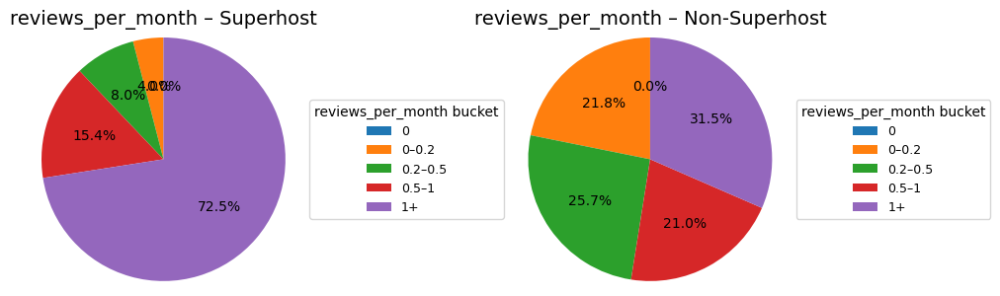

In [989]:
#table
bucket_compare = pd.concat([sup_bucket, non_bucket], ignore_index=True)

share_table = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='share')
        .reindex(labels)
)
share_table.columns.name = None

print("\nShare of listings in each reviews_per_month bucket (Superhost vs Non-Superhost):")
display(share_table.style.format('{:.2%}'))

# Pie charts

labels_pie = sup_bucket['bucket'].tolist()   

sizes_super = sup_bucket['share'].values
sizes_non   = non_bucket['share'].values

def make_rpm_pie(ax, sizes, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',        
        startangle=90,
        textprops={'fontsize': 10},
        radius=1.2
    )
    ax.set_title(title, fontsize=14)
    ax.legend(
        wedges,
        labels_pie,
        title='reviews_per_month bucket',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=9
    )

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

make_rpm_pie(axes[0], sizes_super, 'reviews_per_month – Superhost')
make_rpm_pie(axes[1], sizes_non,   'reviews_per_month – Non-Superhost')

plt.tight_layout()
plt.show()

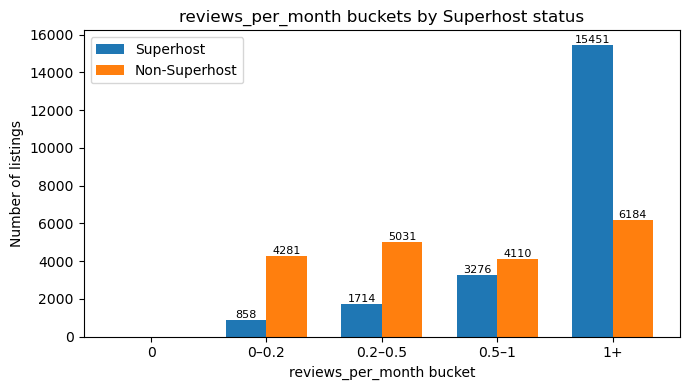

In [990]:
#bar chart
pivot_counts = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='count')
        .reindex(labels)
        .fillna(0)
)

x = np.arange(len(labels))
width = 0.35

sup_vals  = pivot_counts['Superhost'].values
non_vals  = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7, 4))

bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')

plt.xlabel('reviews_per_month bucket')
plt.ylabel('Number of listings')
plt.title('reviews_per_month buckets by Superhost status')
plt.xticks(x, labels)
plt.legend()


for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h == 0:
        continue
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        h,
        f'{int(h)}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.tight_layout()
plt.show()

In [991]:
report='''
`reviews_per_month` represents the average number of reviews per month for a listing over the past year.

Key Findings:
Mean/Median: Superhost 2.349 / 1.780; Non-Superhost 0.998 / 0.540.

Superhost averages 1.351 reviews per month.

High Activity Percentage (≥1 review/month): Superhost 72.54% vs Non-Superhost 31.54%.
Low Activity Percentage (≤0.5 reviews/month): Superhost 12.08% (4.03% + 8.05%) vs Non-Superhost 47.50% (21.84% + 25.66%).

Number of Buckets:
Superhost: 0–0.2 858, 0.2–0.5 1,714, 0.5–1 3,276, 1+ 15,451.
Non-Superhost: 0–0.2 4,281, 0.2–0.5 5,031, 0.5–1 4,110, 1+ 6,184.

Reviews per month is a direct quantitative indicator of host interaction intensity/demand momentum: Comparing 100 listings, 
Superhost is expected to receive approximately 235 reviews per month, while Non-Superhost is expected to receive approximately 100.
This indicator is heavily influenced by Superhost.
'''
print(report)


`reviews_per_month` represents the average number of reviews per month for a listing over the past year.

Key Findings:
Mean/Median: Superhost 2.349 / 1.780; Non-Superhost 0.998 / 0.540.

Superhost averages 1.351 reviews per month.

High Activity Percentage (≥1 review/month): Superhost 72.54% vs Non-Superhost 31.54%.
Low Activity Percentage (≤0.5 reviews/month): Superhost 12.08% (4.03% + 8.05%) vs Non-Superhost 47.50% (21.84% + 25.66%).

Number of Buckets:
Superhost: 0–0.2 858, 0.2–0.5 1,714, 0.5–1 3,276, 1+ 15,451.
Non-Superhost: 0–0.2 4,281, 0.2–0.5 5,031, 0.5–1 4,110, 1+ 6,184.

Reviews per month is a direct quantitative indicator of host interaction intensity/demand momentum: Comparing 100 listings, 
Superhost is expected to receive approximately 235 reviews per month, while Non-Superhost is expected to receive approximately 100.
This indicator is heavily influenced by Superhost.



In [992]:
#number_of_reviews_ltm
df = df.copy()

if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost']
          .astype(str)
          .str.strip()
          .str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")



ltm_raw = pd.to_numeric(df['number_of_reviews_ltm'], errors='coerce')
df['n_reviews_ltm'] = ltm_raw



summary_ltm = (
    df.groupby('is_super')['n_reviews_ltm']
      .agg(['count', 'mean', 'median'])
      .rename(index={1: 'Superhost', 0: 'Non-Superhost'})
)

print("\nBasic stats of number_of_reviews_ltm (last 12 months):")
display(summary_ltm.style.format({
    'count': '{:,.0f}',
    'mean': '{:.2f}',
    'median': '{:.2f}'
}))


bins = [0, 1, 6, 16, 31, np.inf]
labels = ['0', '1–5', '6–15', '16–30', '30+']

def bucket_n_reviews_ltm(group_df, group_name):
    r = group_df['n_reviews_ltm'].dropna()
    ltm_bucket = pd.cut(
        r,
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=False   # [0,1), [1,6), [6,16) ...
    )

    bucket_counts = (
        ltm_bucket.value_counts()
                  .reindex(labels, fill_value=0)
                  .rename_axis('bucket')
                  .reset_index(name='count')
    )

    total_valid = len(r)
    bucket_counts['share'] = (
        bucket_counts['count'] / total_valid if total_valid > 0 else 0
    )
    bucket_counts['group'] = group_name
    return bucket_counts

sup_bucket  = bucket_n_reviews_ltm(df[df['is_super'] == 1], 'Superhost')
non_bucket  = bucket_n_reviews_ltm(df[df['is_super'] == 0], 'Non-Superhost')

print("\nnumber_of_reviews_ltm buckets among Superhosts:")
display(
    sup_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

print("\nnumber_of_reviews_ltm buckets among Non-Superhosts:")
display(
    non_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Basic stats of number_of_reviews_ltm (last 12 months):


,count,mean,median
is_super,,,
Non-Superhost,"23,900",6.21,2.00
Superhost,"22,091",24.00,16.00



number_of_reviews_ltm buckets among Superhosts:


,bucket,count,share
0,0,"1,350",6.11%
1,1–5,"3,260",14.76%
2,6–15,"6,047",27.37%
3,16–30,"5,270",23.86%
4,30+,"6,164",27.90%



number_of_reviews_ltm buckets among Non-Superhosts:


,bucket,count,share
0,0,"7,645",31.99%
1,1–5,"9,568",40.03%
2,6–15,"4,058",16.98%
3,16–30,"1,564",6.54%
4,30+,"1,065",4.46%



Share of listings in each number_of_reviews_ltm bucket (Superhost vs Non-Superhost):


,Non-Superhost,Superhost
bucket,,
0,31.99%,6.11%
1–5,40.03%,14.76%
6–15,16.98%,27.37%
16–30,6.54%,23.86%
30+,4.46%,27.90%


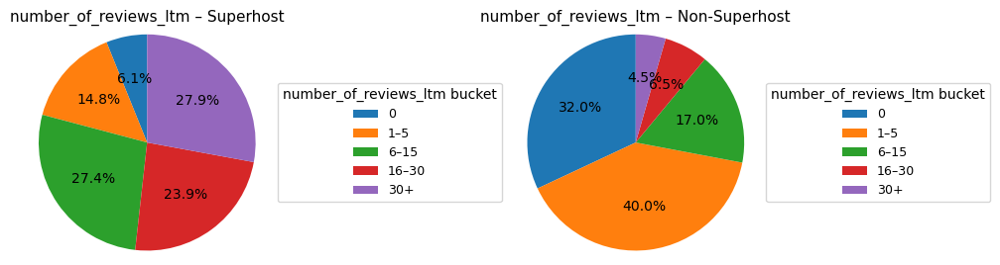

In [993]:
#table
bucket_compare = pd.concat([sup_bucket, non_bucket], ignore_index=True)

share_table = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='share')
        .reindex(labels)
)
share_table.columns.name = None

print("\nShare of listings in each number_of_reviews_ltm bucket (Superhost vs Non-Superhost):")
display(share_table.style.format('{:.2%}'))


#Pie charts

labels_pie = sup_bucket['bucket'].tolist()

sizes_super = sup_bucket['share'].values
sizes_non   = non_bucket['share'].values

def make_ltm_pie(ax, sizes, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',       
        startangle=90,
        textprops={'fontsize': 10},
        radius=1.2
    )
    ax.set_title(title, fontsize=11)
    ax.legend(
        wedges,
        labels_pie,
        title='number_of_reviews_ltm bucket',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=9
    )

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

make_ltm_pie(axes[0], sizes_super, 'number_of_reviews_ltm – Superhost')
make_ltm_pie(axes[1], sizes_non,   'number_of_reviews_ltm – Non-Superhost')

plt.tight_layout()
plt.show()


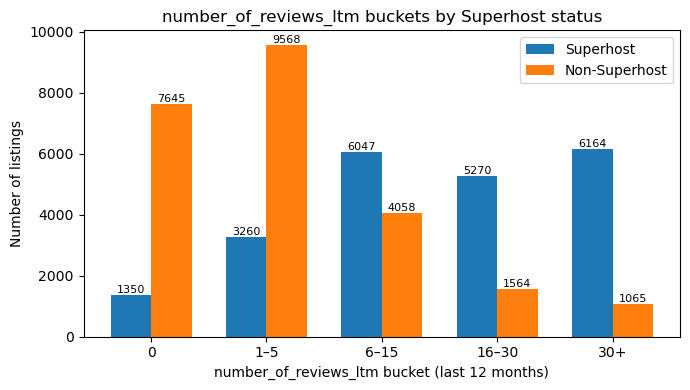

In [994]:
#bar chart
pivot_counts = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='count')
        .reindex(labels)
        .fillna(0)
)

x = np.arange(len(labels))
width = 0.35

sup_vals  = pivot_counts['Superhost'].values
non_vals  = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7, 4))

bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')

plt.xlabel('number_of_reviews_ltm bucket (last 12 months)')
plt.ylabel('Number of listings')
plt.title('number_of_reviews_ltm buckets by Superhost status')
plt.xticks(x, labels)
plt.legend()


for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h == 0:
        continue
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        h,
        f'{int(h)}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.tight_layout()
plt.show()

In [995]:
report='''
The following three charts (LTM = number of reviews in the past 12 months) provide a data summary:

1) Basic Statistics
Superhosts: Mean 24.00, Median 16.00 (sample 22,091).Non-Superhosts: Mean 6.21, Median 2.00 (sample 23,900).

2) Distribution Comparison
Superhost:
0: 6.11% (≈1,350)
1–5: 14.76% (≈3,260)
6–15: 27.37% (≈6,047)
16–30: 23.86% (≈5,270)
30+: 27.90% (≈6,164)

Non-Superhost:
0: 31.99% (≈7,645)
1–5: 40.03% (≈9,568)
6–15: 16.98% (≈4,058)
16–30: 6.54% (≈1,564)
30+: 4.46% (≈1,065)

3) Key Comparison Metrics
At least one review in the past 12 months: Superhost 93.89% vs Non-Superhost 68.01%
Active segment (≥6 reviews/12 months): Superhost 79.13% (=27.37+23.86+27.90) vs Non-Superhost 27.98% (=16.98+6.54+4.46).
Highly active segment (30+ reviews/12 months): Superhost 27.90% ≈ 6.3 × Non-Superhost 4.46%.
Inactive (0 reviews/12 months): Superhost 6.11% vs Non-Superhost 31.99%

Conclusion: "Number of reviews (LTM)" is a highly discriminating indicator of activity:
Superhosts have a significantly higher percentage of reviews in the medium-to-high activity range (≥6 reviews) than Non-Superhosts (79% vs 28%), 
and are significantly concentrated in the 30+ extremely high activity range (27.9% vs 4.5%).

A higher LTM number of reviews generally means more stable bookings and more experience, which is strongly correlated with being rated as a Superhost.
'''
print(report)


The following three charts (LTM = number of reviews in the past 12 months) provide a data summary:

1) Basic Statistics
Superhosts: Mean 24.00, Median 16.00 (sample 22,091).Non-Superhosts: Mean 6.21, Median 2.00 (sample 23,900).

2) Distribution Comparison
Superhost:
0: 6.11% (≈1,350)
1–5: 14.76% (≈3,260)
6–15: 27.37% (≈6,047)
16–30: 23.86% (≈5,270)
30+: 27.90% (≈6,164)

Non-Superhost:
0: 31.99% (≈7,645)
1–5: 40.03% (≈9,568)
6–15: 16.98% (≈4,058)
16–30: 6.54% (≈1,564)
30+: 4.46% (≈1,065)

3) Key Comparison Metrics
At least one review in the past 12 months: Superhost 93.89% vs Non-Superhost 68.01%
Active segment (≥6 reviews/12 months): Superhost 79.13% (=27.37+23.86+27.90) vs Non-Superhost 27.98% (=16.98+6.54+4.46).
Highly active segment (30+ reviews/12 months): Superhost 27.90% ≈ 6.3 × Non-Superhost 4.46%.
Inactive (0 reviews/12 months): Superhost 6.11% vs Non-Superhost 31.99%

Conclusion: "Number of reviews (LTM)" is a highly discriminating indicator of activity:
Superhosts have a si

In [996]:
#number_of_reviews_l30d
df = df.copy()
if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost']
          .astype(str)
          .str.strip()
          .str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")


l30_raw = pd.to_numeric(df['number_of_reviews_l30d'], errors='coerce')
df['n_reviews_l30d'] = l30_raw


summary_l30 = (
    df.groupby('is_super')['n_reviews_l30d']
      .agg(['count', 'mean', 'median'])
      .rename(index={1: 'Superhost', 0: 'Non-Superhost'})
)

print("\nBasic stats of number_of_reviews_l30d (last 30 days):")
display(summary_l30.style.format({
    'count': '{:,.0f}',
    'mean': '{:.2f}',
    'median': '{:.2f}'
}))

bins = [0, 1, 3, 6, 11, np.inf]
labels = ['0', '1–2', '3–5', '6–10', '10+']

def bucket_n_reviews_l30d(group_df, group_name):
    r = group_df['n_reviews_l30d'].dropna()
    l30_bucket = pd.cut(
        r,
        bins=bins,
        labels=labels,
        include_lowest=True,
        right=False   # [0,1), [1,3), [3,6) ...
    )

    bucket_counts = (
        l30_bucket.value_counts()
                  .reindex(labels, fill_value=0)
                  .rename_axis('bucket')
                  .reset_index(name='count')
    )

    total_valid = len(r)
    bucket_counts['share'] = (
        bucket_counts['count'] / total_valid if total_valid > 0 else 0
    )
    bucket_counts['group'] = group_name
    return bucket_counts

sup_bucket  = bucket_n_reviews_l30d(df[df['is_super'] == 1], 'Superhost')
non_bucket  = bucket_n_reviews_l30d(df[df['is_super'] == 0], 'Non-Superhost')

print("\nnumber_of_reviews_l30d buckets among Superhosts:")
display(
    sup_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

print("\nnumber_of_reviews_l30d buckets among Non-Superhosts:")
display(
    non_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Basic stats of number_of_reviews_l30d (last 30 days):


,count,mean,median
is_super,,,
Non-Superhost,"23,900",0.37,0.00
Superhost,"22,091",1.19,0.00



number_of_reviews_l30d buckets among Superhosts:


,bucket,count,share
0,0,"11,550",52.28%
1,1–2,"6,727",30.45%
2,3–5,"2,976",13.47%
3,6–10,782,3.54%
4,10+,56,0.25%



number_of_reviews_l30d buckets among Non-Superhosts:


,bucket,count,share
0,0,"19,316",80.82%
1,1–2,"3,556",14.88%
2,3–5,866,3.62%
3,6–10,144,0.60%
4,10+,18,0.08%



Share of listings in each number_of_reviews_l30d bucket (Superhost vs Non-Superhost):


,Non-Superhost,Superhost
bucket,,
0,80.82%,52.28%
1–2,14.88%,30.45%
3–5,3.62%,13.47%
6–10,0.60%,3.54%
10+,0.08%,0.25%


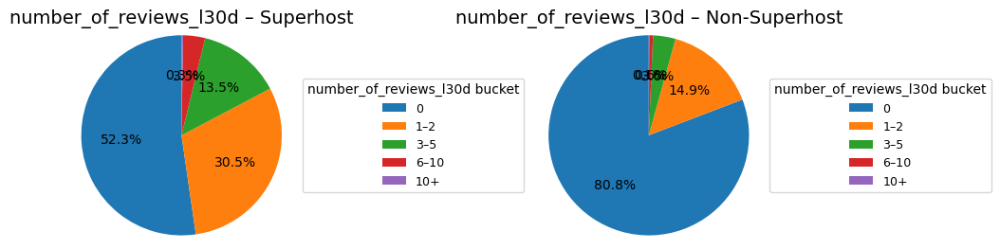

In [997]:
#table
bucket_compare = pd.concat([sup_bucket, non_bucket], ignore_index=True)

share_table = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='share')
        .reindex(labels)
)
share_table.columns.name = None

print("\nShare of listings in each number_of_reviews_l30d bucket (Superhost vs Non-Superhost):")
display(share_table.style.format('{:.2%}'))

#Pie charts

labels_pie = sup_bucket['bucket'].tolist() 

sizes_super = sup_bucket['share'].values
sizes_non   = non_bucket['share'].values

def make_l30_pie(ax, sizes, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',      
        startangle=90,
        textprops={'fontsize': 10},
        radius=1.2
    )
    ax.set_title(title, fontsize=14)
    ax.legend(
        wedges,
        labels_pie,
        title='number_of_reviews_l30d bucket',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=9
    )

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

make_l30_pie(axes[0], sizes_super, 'number_of_reviews_l30d – Superhost')
make_l30_pie(axes[1], sizes_non,   'number_of_reviews_l30d – Non-Superhost')

plt.tight_layout()
plt.show()

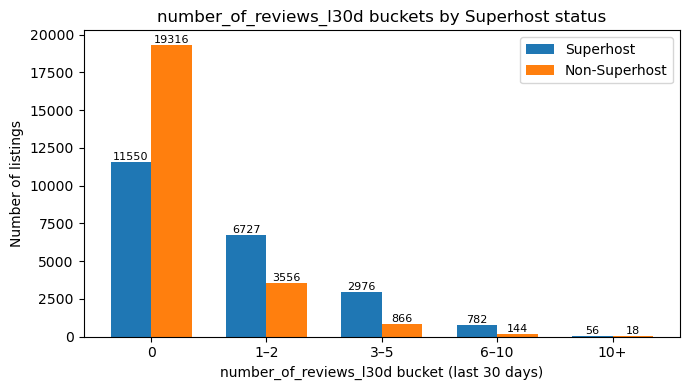

In [998]:
#bar chart 
pivot_counts = (
    bucket_compare
        .pivot(index='bucket', columns='group', values='count')
        .reindex(labels)
        .fillna(0)
)

x = np.arange(len(labels))
width = 0.35

sup_vals  = pivot_counts['Superhost'].values
non_vals  = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7, 4))

bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')

plt.xlabel('number_of_reviews_l30d bucket (last 30 days)')
plt.ylabel('Number of listings')
plt.title('number_of_reviews_l30d buckets by Superhost status')
plt.xticks(x, labels)
plt.legend()


for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h == 0:
        continue
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        h,
        f'{int(h)}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.tight_layout()
plt.show()

In [999]:
report='''
Superhosts are more likely to get new reviews in the past 30 days: 47.7% have reviews compared to 19.2%, 
and the probability of getting more than 3 reviews is about 4 times that of non-Superhosts—this is a strong signal of recent activity and demand,
and should be a key operational metric for new hosts.
'''
print(report)


Superhosts are more likely to get new reviews in the past 30 days: 47.7% have reviews compared to 19.2%, 
and the probability of getting more than 3 reviews is about 4 times that of non-Superhosts—this is a strong signal of recent activity and demand,
and should be a key operational metric for new hosts.



In [1000]:
d = df.copy()

if 'is_super' not in d.columns:
    d['is_super'] = (
        d['host_is_superhost'].astype(str).str.strip().str.lower()
          .map({'t':1,'true':1,'1':1,'f':0,'false':0,'0':0})
          .astype('Int8')
    )


def pick(cols, cands):
    low = {c.lower(): c for c in cols}
    for c in cands:
        if c.lower() in low: return low[c.lower()]
    for c in cols:  
        if any(cc.lower().replace('_','') in c.lower().replace('_','') for cc in cands):
            return c
    return None

HOST    = pick(d.columns, ['host_id','hostid'])
LISTING = pick(d.columns, ['id','listing_id','listingid'])
REV_ALL = pick(d.columns, ['number_of_reviews','reviews_count'])
RPM     = pick(d.columns, ['reviews_per_month','rpm'])
REV_LTM = pick(d.columns, ['number_of_reviews_ltm','reviews_ltm'])
REV_L30 = pick(d.columns, ['number_of_reviews_l30d','reviews_30d','reviews_last_30d'])

assert HOST and LISTING and REV_ALL, "need host_id / listing_id / number_of_reviews "


agg = {LISTING:'nunique', REV_ALL:'sum'}
if RPM:     agg[RPM]     = 'sum'
if REV_LTM: agg[REV_LTM] = 'sum'
if REV_L30: agg[REV_L30] = 'sum'

host = (d.groupby(HOST, as_index=False)
          .agg(agg)
          .rename(columns={LISTING:'n_listings',
                           REV_ALL:'reviews_all',
                           (RPM or 'rpm'):'reviews_per_month',
                           (REV_LTM or 'ltm'):'reviews_ltm',
                           (REV_L30 or 'l30'):'reviews_30d'}))

flag = d.groupby(HOST)['is_super'].max().rename('is_super').reset_index()
host = host.merge(flag, on=HOST, how='left')


def bucket_1_10plus(n):
    return str(int(n)) if n<=10 else '10+'
host['bucket'] = host['n_listings'].apply(bucket_1_10plus)
ORDER = ['1','2','3','4','5','6','7','8','9','10','10+']


def build_summary(host_df, value_col, pretty_name):
    if value_col not in host_df.columns:
        return None, f"⚠️ Skipped {pretty_name} (column `{value_col}` not found)"

    tmp = host_df.copy()
    tmp['per_listing'] = tmp[value_col] / tmp['n_listings'].clip(lower=1)

    
    g = (tmp.groupby(['is_super','bucket'], observed=False)
            .agg(
                n_hosts=('is_super','size'),
                mean=(value_col,'mean'),
                median=(value_col,'median'),
                sum=(value_col,'sum'),
                per_listing_mean=('per_listing','mean'),
                per_listing_median=('per_listing','median'),
            ).reset_index())

    g['group']  = g['is_super'].map({1:'Superhost',0:'Non-Superhost'})
    g['bucket'] = pd.Categorical(g['bucket'], categories=ORDER, ordered=True)
    g = g.sort_values(['group','bucket']).drop(columns='is_super')

    
    g = g.rename(columns={
        'mean'               : f'{pretty_name}_mean',
        'median'             : f'{pretty_name}_median',
        'sum'                : f'{pretty_name}_sum',
        'per_listing_mean'   : f'{pretty_name}_per_listing_mean',
        'per_listing_median' : f'{pretty_name}_per_listing_median',
    })

 
    cols = ['group','bucket','n_hosts',
            f'{pretty_name}_mean', f'{pretty_name}_median', f'{pretty_name}_sum',
            f'{pretty_name}_per_listing_mean', f'{pretty_name}_per_listing_median']
    g = g[cols]
    g.name = pretty_name
    return g, None


tbl_all,  msg1 = build_summary(host, 'reviews_all',       'all_reviews')
tbl_rpm,  msg2 = build_summary(host, 'reviews_per_month', 'reviews_per_month')
tbl_ltm,  msg3 = build_summary(host, 'reviews_ltm',       'ltm_reviews')
tbl_l30,  msg4 = build_summary(host, 'reviews_30d',       'l30d_reviews')


def show_tbl(t):
    if t is None: return
    print(f"\n===== {t.name} (by group × listing-count bucket) =====")
    display(
        t.style.format({
            'n_hosts':'{:,.0f}',
            f'{t.name}_mean':'{:.2f}',
            f'{t.name}_median':'{:.2f}',
            f'{t.name}_sum':'{:,.0f}',
            f'{t.name}_per_listing_mean':'{:.2f}',
            f'{t.name}_per_listing_median':'{:.2f}',
        })
    )

for t, msg in [(tbl_all,msg1),(tbl_rpm,msg2),(tbl_ltm,msg3),(tbl_l30,msg4)]:
    show_tbl(t)
    if msg: print(msg)


===== all_reviews (by group × listing-count bucket) =====


,group,bucket,n_hosts,all_reviews_mean,all_reviews_median,all_reviews_sum,all_reviews_per_listing_mean,all_reviews_per_listing_median
0,Non-Superhost,1,"12,713",31.15,7.00,"396,072",31.15,7.00
3,Non-Superhost,2,"1,398",70.60,22.00,"98,692",35.30,11.00
4,Non-Superhost,3,439,132.85,41.00,"58,320",44.28,13.67
5,Non-Superhost,4,188,141.33,40.50,"26,570",35.33,10.12
6,Non-Superhost,5,106,174.46,82.50,"18,493",34.89,16.50
7,Non-Superhost,6,69,167.86,62.00,"11,582",27.98,10.33
8,Non-Superhost,7,46,216.50,84.50,"9,959",30.93,12.07
9,Non-Superhost,8,19,233.95,137.00,"4,445",29.24,17.12
10,Non-Superhost,9,25,271.12,180.00,"6,778",30.12,20.00
1,Non-Superhost,10,16,204.88,91.00,"3,278",20.49,9.10



===== reviews_per_month (by group × listing-count bucket) =====


,group,bucket,n_hosts,reviews_per_month_mean,reviews_per_month_median,reviews_per_month_sum,reviews_per_month_per_listing_mean,reviews_per_month_per_listing_median
0,Non-Superhost,1,"12,713",0.85,0.43,"10,758",0.85,0.43
3,Non-Superhost,2,"1,398",1.61,0.83,"2,258",0.81,0.41
4,Non-Superhost,3,439,2.78,1.31,"1,221",0.93,0.44
5,Non-Superhost,4,188,2.92,1.56,549,0.73,0.39
6,Non-Superhost,5,106,4.11,2.28,436,0.82,0.46
7,Non-Superhost,6,69,4.05,2.61,279,0.67,0.43
8,Non-Superhost,7,46,5.14,3.12,236,0.73,0.45
9,Non-Superhost,8,19,9.66,5.18,183,1.21,0.65
10,Non-Superhost,9,25,8.22,4.32,205,0.91,0.48
1,Non-Superhost,10,16,4.74,2.87,76,0.47,0.29



===== ltm_reviews (by group × listing-count bucket) =====


,group,bucket,n_hosts,ltm_reviews_mean,ltm_reviews_median,ltm_reviews_sum,ltm_reviews_per_listing_mean,ltm_reviews_per_listing_median
0,Non-Superhost,1,"12,713",5.94,2.00,"75,452",5.94,2.00
3,Non-Superhost,2,"1,398",12.58,4.00,"17,583",6.29,2.00
4,Non-Superhost,3,439,23.55,6.00,"10,337",7.85,2.00
5,Non-Superhost,4,188,23.61,7.00,"4,438",5.90,1.75
6,Non-Superhost,5,106,36.38,15.00,"3,856",7.28,3.00
7,Non-Superhost,6,69,33.64,15.00,"2,321",5.61,2.50
8,Non-Superhost,7,46,38.67,17.00,"1,779",5.52,2.43
9,Non-Superhost,8,19,79.21,35.00,"1,505",9.90,4.38
10,Non-Superhost,9,25,70.64,34.00,"1,766",7.85,3.78
1,Non-Superhost,10,16,40.94,19.50,655,4.09,1.95



===== l30d_reviews (by group × listing-count bucket) =====


,group,bucket,n_hosts,l30d_reviews_mean,l30d_reviews_median,l30d_reviews_sum,l30d_reviews_per_listing_mean,l30d_reviews_per_listing_median
0,Non-Superhost,1,"12,713",0.39,0.00,"4,986",0.39,0.00
3,Non-Superhost,2,"1,398",0.62,0.00,862,0.31,0.00
4,Non-Superhost,3,439,1.10,0.00,485,0.37,0.00
5,Non-Superhost,4,188,1.29,0.00,242,0.32,0.00
6,Non-Superhost,5,106,1.67,0.00,177,0.33,0.00
7,Non-Superhost,6,69,1.86,0.00,128,0.31,0.00
8,Non-Superhost,7,46,2.17,0.00,100,0.31,0.00
9,Non-Superhost,8,19,4.16,1.00,79,0.52,0.12
10,Non-Superhost,9,25,3.84,1.00,96,0.43,0.11
1,Non-Superhost,10,16,1.88,0.50,30,0.19,0.05


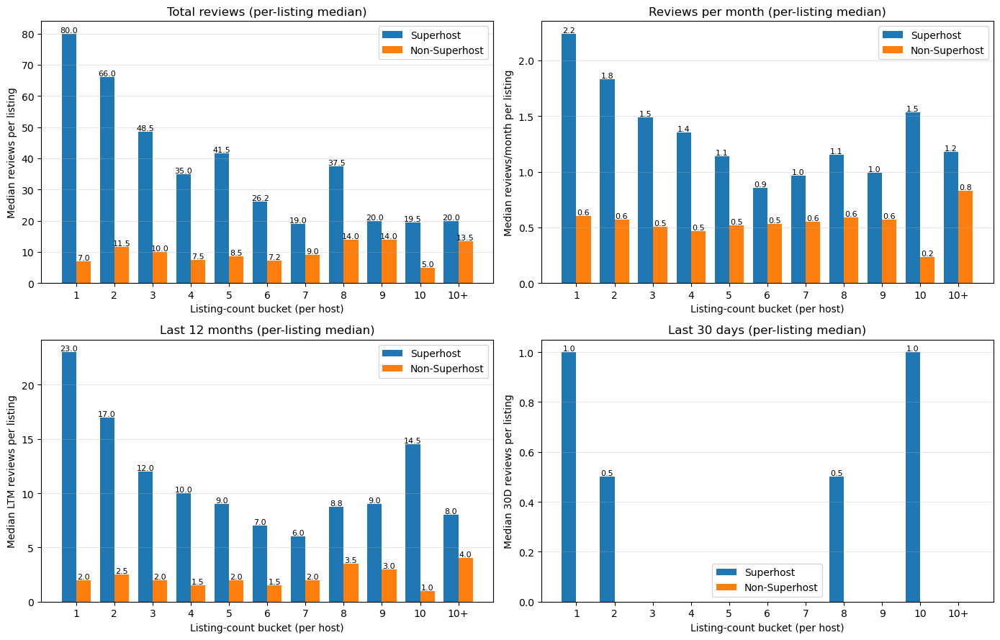

In [1001]:
def _bool01(s):
    return (s.astype(str).str.strip().str.lower()
             .map({'t':1,'true':1,'1':1,'y':1,'yes':1,
                   'f':0,'false':0,'0':0,'n':0,'no':0})
             .fillna(0).astype('int8'))

def _detect_col(columns, candidates):
    lower = {c.lower(): c for c in columns}
    for cand in candidates:
        if cand.lower() in lower: return lower[cand.lower()]
    for c in columns:
        cl = c.lower().replace('_','')
        for cand in candidates:
            if cand.lower().replace('_','') in cl: return c
    return None

def _bucket_n_listings(n):
    n = int(n)
    return str(n) if n <= 10 else '10+'

BUCKET_ORDER = [str(i) for i in range(1,11)] + ['10+']



super_col_guess = _detect_col(d.columns, ['is_super', 'host_is_superhost', 'is_superhost'])
if super_col_guess is None:
    raise ValueError("Could not find a superhost flag column.")
d['is_super'] = _bool01(d[super_col_guess])

HOST    = _detect_col(d.columns, ['host_id','hostid','host_id_str'])
LISTING = _detect_col(d.columns, ['id','listing_id','listingid'])
assert HOST and LISTING, "Missing HOST or LISTING identifier."

# review columns 
ALL_COL = _detect_col(d.columns, ['number_of_reviews','reviews_total','all_reviews'])
RPM_COL = _detect_col(d.columns, ['reviews_per_month','review_per_month'])
LTM_COL = _detect_col(d.columns, ['number_of_reviews_ltm','reviews_ltm','reviews_12m'])
L30_COL = _detect_col(d.columns, ['number_of_reviews_l30d','reviews_30d','reviews_last_30d'])
for c in [ALL_COL, RPM_COL, LTM_COL, L30_COL]:
    d[c] = pd.to_numeric(d[c], errors='coerce')



n_listings = (d.groupby(HOST)[LISTING].nunique()
                .astype('int64')
                .rename('n_listings'))

def host_agg_for_metric(col):
    g = d.groupby(HOST)[col].agg(all_reviews_sum='sum',
                                 all_reviews_median='median')
    g = g.join(n_listings, how='left')
    g['all_reviews_per_listing_mean'] = g['all_reviews_sum'] / g['n_listings']
    # (optional) a host-level median of listing-level values (already computed):
    g['all_reviews_per_listing_median'] = g['all_reviews_median']
    return g

host_all  = host_agg_for_metric(ALL_COL)
host_rpm  = host_agg_for_metric(RPM_COL)
host_ltm  = host_agg_for_metric(LTM_COL)
host_l30  = host_agg_for_metric(L30_COL)

# build clean group labels 
host_meta = (d.groupby(HOST)['is_super'].max()
               .fillna(0).astype('int8')           
               .rename('is_super'))
host_meta = pd.DataFrame({'group': np.where(host_meta.values == 1,
                                            'Superhost', 'Non-Superhost')},
                         index=host_meta.index)

def prepare_for_plot(host_tbl, pretty_name):
    z = host_tbl.join(host_meta, how='inner').reset_index()
    z['bucket'] = z['n_listings'].map(_bucket_n_listings)
    z['pretty'] = pretty_name
    return z

A = prepare_for_plot(host_all, 'Total reviews')
B = prepare_for_plot(host_rpm, 'Reviews / month')
C = prepare_for_plot(host_ltm, 'Reviews (last 12 months)')
D = prepare_for_plot(host_l30, 'Reviews (last 30 days)')

# summaries

def summarize_for_bars(df_part, ycol='all_reviews_per_listing_median'):
    m = (df_part.groupby(['group', 'bucket'])[ycol]
                 .median()                  
                 .rename('median_val')
                 .reset_index())
    pv = (m.pivot(index='bucket', columns='group', values='median_val')
            .reindex(BUCKET_ORDER)
            .reindex(columns=['Superhost','Non-Superhost'], fill_value=0))
    return pv

pv_A = summarize_for_bars(A)  
pv_B = summarize_for_bars(B)
pv_C = summarize_for_bars(C)
pv_D = summarize_for_bars(D)


fig, axes = plt.subplots(2, 2, figsize=(14, 9))

plot_grouped_bar(axes[0,0], pv_A,
                 'Total reviews (per-listing median)',
                 'Median reviews per listing')

plot_grouped_bar(axes[0,1], pv_B,
                 'Reviews per month (per-listing median)',
                 'Median reviews/month per listing')

plot_grouped_bar(axes[1,0], pv_C,
                 'Last 12 months (per-listing median)',
                 'Median LTM reviews per listing')

plot_grouped_bar(axes[1,1], pv_D,
                 'Last 30 days (per-listing median)',
                 'Median 30D reviews per listing')

plt.tight_layout(); plt.show()

In [1002]:
report='''
Superhost outperforms all listing sizes: 
Superhost’s median reviews per listing are higher than Non-Superhost’s for total reviews, reviews/month, last-12-months (LTM), 
and last-30-days, in every listing-count bucket.

Scale effect (medians): as hosts manage more listings, the median reviews per listing generally decline for both groups,
but Superhost keeps a consistent edge.

Edge is strongest at small scale:
1 listing (median): total 80 vs 7 (~11×), reviews/month 2.2 vs 0.6 (~3.7×), LTM 23 vs 2 (~11.5×).
10+ listings (median):20 vs ≈13.5, reviews/month ≈1.2 vs ≈0.8, LTM ≈8 vs ≈4.

Recency signal: in the last 30 days, Superhost medians are often ~0.5–1.0 per listing,
while Non-Superhost medians are frequently near 0, indicating lapsed demand.

Chart Interpretation:
Total reviews — per-listing median
Captures long-run reputation of a typical listing within each bucket. Superhosts dominate at every size (80 vs 7 at 1 listing; still higher at 10+).

Reviews per month — per-listing median
Measures steady-state demand velocity. Superhosts maintain ~1.1–2.2 reviews/month per listing across sizes, while Non-Superhosts sit around 0.5–0.8.

Last 12 months — per-listing median
Shows sustained momentum. Superhosts remain several multiples higher at small sizes ( 23 vs 2 at 1 listing) and keep an edge at larger sizes.

Last 30 days — per-listing median
Short-term recency. Superhost medians frequently fall between 0.5–1.0; Non-Superhost medians are often 0,
especially in mid/high buckets—evidence of lapsed demand.

Recommendations:
For new/small-scale hosts (1-3 properties):
Target: ≥1.0 reviews/property/month, ≥12 reviews received in the past year/property, average reviews received in the past 30 days ≥0.5/property.
Quick Strategy: Proactive care after check-in, follow up with reviews 6-12 hours after check-out; 
improve the stability of cleaning/communication experiences, initially aiming to raise ratings to 95+ and increase monthly review frequency.

For growing hosts (4-9 properties):
Establish standardized SOPs (self-checklist, automated messaging, restocking and inspection frequency); 
conduct "various diagnostics" for properties below the threshold ( monthly reviews <0.8/property) 
(title image, pricing, customizable strategies, cleaning timeliness, check-in friction).

For landlords with 10+ properties:
the natural decline in reviews per property is acceptable: Monthly reviews ≥ 0.9/property, LTM ≥ 12/property, 30-day reviews ≥ 0.5/property.
'''
print(report)


Superhost outperforms all listing sizes: 
Superhost’s median reviews per listing are higher than Non-Superhost’s for total reviews, reviews/month, last-12-months (LTM), 
and last-30-days, in every listing-count bucket.

Scale effect (medians): as hosts manage more listings, the median reviews per listing generally decline for both groups,
but Superhost keeps a consistent edge.

Edge is strongest at small scale:
1 listing (median): total 80 vs 7 (~11×), reviews/month 2.2 vs 0.6 (~3.7×), LTM 23 vs 2 (~11.5×).
10+ listings (median):20 vs ≈13.5, reviews/month ≈1.2 vs ≈0.8, LTM ≈8 vs ≈4.

Recency signal: in the last 30 days, Superhost medians are often ~0.5–1.0 per listing,
while Non-Superhost medians are frequently near 0, indicating lapsed demand.

Chart Interpretation:
Total reviews — per-listing median
Captures long-run reputation of a typical listing within each bucket. Superhosts dominate at every size (80 vs 7 at 1 listing; still higher at 10+).

Reviews per month — per-listing medi

In [1003]:
report='''
1) Ratings Gap & Practical Importance

We conducted a t-test and ranked factors by hedges' g effect size: 
Cleanliness g≈0.457 (largest effect) → Overall Rating g≈0.447 → Value g≈0.412 → Accuracy g≈0.403 → Communication g≈0.346 → Check-in g≈0.309;
Location g≈0.238 (small effect).

The factors with the largest and controllable interaction gaps among actual hosts are, 
in order of priority: Cleanliness → Overall Rating Experience/Accuracy/Value → Communication/Check-in; 
Location is mainly used for grouping/control rather than as a routine operational factor.

2) High-Score Concentration：
Overall Rating: Superhost 89.68% vs Non-superhost 66.61% (+23.07 pct).
Cleanliness: 86.96% vs 65.32% (+21.64 pct).
Accuracy: 92.22% vs 72.24% (+19.98 pct).
Communication: 96.18% vs 83.19% (+12.99 pct).
Check-in: 95.35% vs 82.88% (+12.47 pct).
Value: 74.27% vs 53.02% (+21.25 pct).
Location: 90.90% vs 78.53% (+12.37 pct);( weak controllability, recommended for grouping and controlling variables).

3) Review activity
Reviews per month: Superhost Mean/Median 2.349 / 1.780; Non-superhost 0.998 / 0.540.
≥1 review/month: Superhost 72.54% vs Non-superhost 31.54%.
LTM (Number of reviews in the last 12 months): Active periods (≥6): Superhost ≈79% vs Non-superhost ≈28%; 30+ highly active: Superhost 27.9% vs 4.5%.
New reviews i the last 30 days: Superhost 47.7% vs Non-superhost 19.2%.
Total historical reviews: Average/Median: Superhost 99.23 / 50; Non-superhost 30.51 / 7; ≥50 reviews: 49.65% vs 16.25%.

4) What new hosts should do:
First: Achieve and maintain a cleanliness rating of ≥95.

Second: Improve accuracy/overall experience/value ratings—perfect the matching of information with listings/prices, 
and reduce the "description-experience discrepancy".

Third: Standardize communication/check-in processes, such as automated messages, arrival guidance, and contactless self-check-in.

Maintain "activity": Ensure at least 1 review per month, LTM at least 6, and ideally, new reviews within 30 days.
'''
print(report)


1) Ratings Gap & Practical Importance

We conducted a t-test and ranked factors by hedges' g effect size: 
Cleanliness g≈0.457 (largest effect) → Overall Rating g≈0.447 → Value g≈0.412 → Accuracy g≈0.403 → Communication g≈0.346 → Check-in g≈0.309;
Location g≈0.238 (small effect).

The factors with the largest and controllable interaction gaps among actual hosts are, 
in order of priority: Cleanliness → Overall Rating Experience/Accuracy/Value → Communication/Check-in; 
Location is mainly used for grouping/control rather than as a routine operational factor.

2) High-Score Concentration：
Overall Rating: Superhost 89.68% vs Non-superhost 66.61% (+23.07 pct).
Cleanliness: 86.96% vs 65.32% (+21.64 pct).
Accuracy: 92.22% vs 72.24% (+19.98 pct).
Communication: 96.18% vs 83.19% (+12.99 pct).
Check-in: 95.35% vs 82.88% (+12.47 pct).
Value: 74.27% vs 53.02% (+21.25 pct).
Location: 90.90% vs 78.53% (+12.37 pct);( weak controllability, recommended for grouping and controlling variables).

3) Rev

In [1004]:
report='''
Branch A- Host experience
On Airbnb, trust is not only built through good reviews, 
but also through how long a host has been on the platform and how complete and verified their profile.
These “trust signals” affect both guest confidence and the platform’s confidence when evaluating Superhost eligibility.

Therefore, this section focuses on host tenure and verification completeness, comparing Superhosts and non-Superhosts on:
- host_since → derived host_tenure_years (how long they have been hosting),
- host_identity_verified (whether the host’s identity is verified),
- host_has_profile_pic and host_verifications (profile photo and verification methods).

We will first check missingness for these fields, then analyse how tenure and verification patterns differ between Superhosts and non-Superhosts.
'''
print(report)


Branch A- Host experience
On Airbnb, trust is not only built through good reviews, 
but also through how long a host has been on the platform and how complete and verified their profile.
These “trust signals” affect both guest confidence and the platform’s confidence when evaluating Superhost eligibility.

Therefore, this section focuses on host tenure and verification completeness, comparing Superhosts and non-Superhosts on:
- host_since → derived host_tenure_years (how long they have been hosting),
- host_identity_verified (whether the host’s identity is verified),
- host_has_profile_pic and host_verifications (profile photo and verification methods).

We will first check missingness for these fields, then analyse how tenure and verification patterns differ between Superhosts and non-Superhosts.



In [1005]:
cols_C = [
    'host_since',
    'host_identity_verified',
    'host_has_profile_pic',
    'host_verifications',
]

cols_C = [c for c in cols_C if c in df.columns]

missing_C = (
    df[cols_C]
      .isna()
      .sum()
      .rename('missing_count')
      .to_frame()
)

missing_C['missing_share'] = missing_C['missing_count'] / len(df)

print("Missing values for Branch A – Host tenure & trust features:")
display(
    missing_C.style.format({
        'missing_count': '{:,.0f}',
        'missing_share': '{:.2%}'
    })
)

missing_cols_C = missing_C[missing_C['missing_count'] > 0].index.tolist()
print("\nColumns with missing values in Branch A:")
print(missing_cols_C)

Missing values for Branch A – Host tenure & trust features:


,missing_count,missing_share
host_since,19,0.04%
host_identity_verified,19,0.04%
host_has_profile_pic,19,0.04%
host_verifications,19,0.04%



Columns with missing values in Branch A:
['host_since', 'host_identity_verified', 'host_has_profile_pic', 'host_verifications']


In [1006]:
#host since
df = df.copy()

if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost']
          .astype(str)
          .str.strip()
          .str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")

#  translate host_since into years
host_since_dt = pd.to_datetime(df['host_since'], errors='coerce')


if 'last_scraped' in df.columns:
    snapshot_date = pd.to_datetime(df['last_scraped'], errors='coerce').max()
else:
    snapshot_date = host_since_dt.max()

tenure_days = (snapshot_date - host_since_dt).dt.days
df['host_tenure_years'] = tenure_days / 365.25

# Superhost vs Non-Superhost
summary_tenure = (
    df.groupby('is_super')['host_tenure_years']
      .agg(['count', 'mean', 'median'])
      .rename(index={1: 'Superhost', 0: 'Non-Superhost'})
)

print("\nBasic stats of host tenure (years, derived from host_since):")
display(summary_tenure.style.format({
    'count': '{:,.0f}',
    'mean': '{:.2f}',
    'median': '{:.2f}'
}))


bins_years   = [0, 1, 3, 5, 10, np.inf]
labels_years = ['<1y', '1–3y', '3–5y', '5–10y', '10y+']

def bucket_tenure(group_df, group_name):
    r = group_df['host_tenure_years'].dropna()
    tenure_bucket = pd.cut(
        r,
        bins=bins_years,
        labels=labels_years,
        include_lowest=True,
        right=False    
    )

    bucket_counts = (
        tenure_bucket.value_counts()
                     .reindex(labels_years, fill_value=0)
                     .rename_axis('bucket')
                     .reset_index(name='count')
    )

    total_valid = len(r)
    bucket_counts['share'] = (
        bucket_counts['count'] / total_valid if total_valid > 0 else 0
    )
    bucket_counts['group'] = group_name
    return bucket_counts

sup_bucket = bucket_tenure(df[df['is_super'] == 1], 'Superhost')
non_bucket = bucket_tenure(df[df['is_super'] == 0], 'Non-Superhost')

print("\nHost tenure buckets among Superhosts:")
display(
    sup_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

print("\nHost tenure buckets among Non-Superhosts:")
display(
    non_bucket[['bucket', 'count', 'share']]
        .style.format({'count': '{:,.0f}', 'share': '{:.2%}'})
)

Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Basic stats of host tenure (years, derived from host_since):


,count,mean,median
is_super,,,
Non-Superhost,"23,887",7.05,7.92
Superhost,"22,085",7.82,8.45



Host tenure buckets among Superhosts:


,bucket,count,share
0,<1y,440,1.99%
1,1–3y,"2,131",9.65%
2,3–5y,"1,560",7.06%
3,5–10y,"12,895",58.39%
4,10y+,"5,059",22.91%



Host tenure buckets among Non-Superhosts:


,bucket,count,share
0,<1y,"1,425",5.97%
1,1–3y,"2,840",11.89%
2,3–5y,"2,105",8.81%
3,5–10y,"13,469",56.39%
4,10y+,"4,048",16.95%



Share of listings in each host-tenure bucket (Superhost vs Non-Superhost):


,Non-Superhost,Superhost
bucket,,
<1y,5.97%,1.99%
1–3y,11.89%,9.65%
3–5y,8.81%,7.06%
5–10y,56.39%,58.39%
10y+,16.95%,22.91%


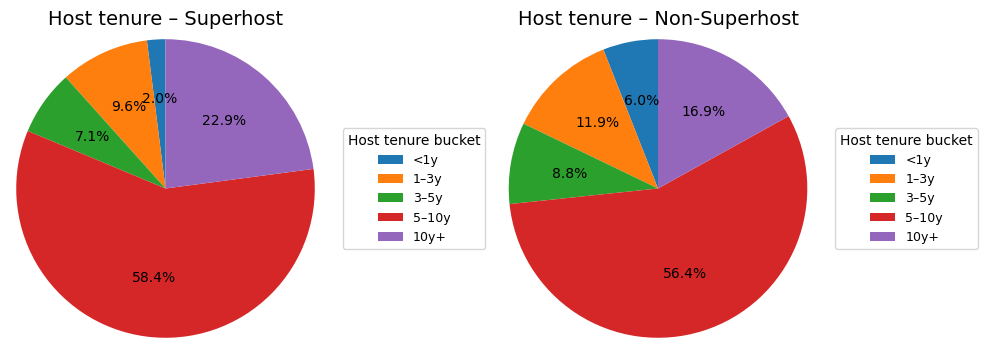

In [1007]:
#Table
bucket_compare = pd.concat([sup_bucket, non_bucket], ignore_index=True)

share_table = (
    bucket_compare
      .pivot(index='bucket', columns='group', values='share')
      .reindex(labels_years)
)
share_table.columns.name = None

print("\nShare of listings in each host-tenure bucket (Superhost vs Non-Superhost):")
display(share_table.style.format('{:.2%}'))


# Pie charts
labels_pie = labels_years
sizes_super = sup_bucket['share'].values
sizes_non   = non_bucket['share'].values

def make_tenure_pie(ax, sizes, title):
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize': 10},
        radius=1.2
    )
    ax.set_title(title, fontsize=14)
    ax.legend(
        wedges,
        labels_pie,
        title='Host tenure bucket',
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=9
    )

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

make_tenure_pie(axes[0], sizes_super, 'Host tenure – Superhost')
make_tenure_pie(axes[1], sizes_non,   'Host tenure – Non-Superhost')

plt.tight_layout()
plt.show()

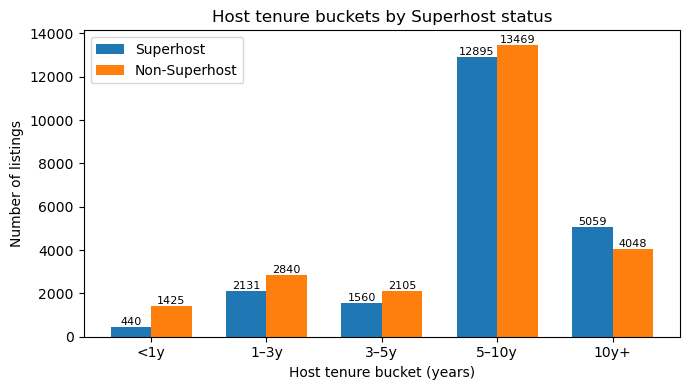

In [1008]:
#bar chart
pivot_counts = (
    bucket_compare
      .pivot(index='bucket', columns='group', values='count')
      .reindex(labels_years)
      .fillna(0)
)

x = np.arange(len(labels_years))
width = 0.35

sup_vals = pivot_counts['Superhost'].values
non_vals = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7, 4))

bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')

plt.xlabel('Host tenure bucket (years)')
plt.ylabel('Number of listings')
plt.title('Host tenure buckets by Superhost status')
plt.xticks(x, labels_years)
plt.legend()

for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h == 0:
        continue
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        h,
        f'{int(h)}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.tight_layout()
plt.show()

In [1009]:
report='''
Superhosts tend to have slightly longer hosting tenure than Non-Superhosts.
The average tenure for Superhosts is about 7.8 years (median 8.5y), compared with 7.0 years (median 7.9y) for Non-Superhosts.
Looking at tenure buckets, only 18.7% of Superhost listings are hosted by “newer” hosts with less than 5 years’ experience, 
compared with 26.7% among Non-Superhosts.

In contrast, Superhosts are more concentrated in the 10+ years bucket (22.9% vs 16.9%).
This pattern suggests that time on the platform helps: long-tenure hosts are more likely to become Superhosts, 
while many newer hosts are still Non-Superhosts.

However, the fact that both groups peak in the 5–10 year bucket also indicates that tenure alone does not guarantee Superhost status .
'''
print(report)


Superhosts tend to have slightly longer hosting tenure than Non-Superhosts.
The average tenure for Superhosts is about 7.8 years (median 8.5y), compared with 7.0 years (median 7.9y) for Non-Superhosts.
Looking at tenure buckets, only 18.7% of Superhost listings are hosted by “newer” hosts with less than 5 years’ experience, 
compared with 26.7% among Non-Superhosts.

In contrast, Superhosts are more concentrated in the 10+ years bucket (22.9% vs 16.9%).
This pattern suggests that time on the platform helps: long-tenure hosts are more likely to become Superhosts, 
while many newer hosts are still Non-Superhosts.

However, the fact that both groups peak in the 5–10 year bucket also indicates that tenure alone does not guarantee Superhost status .



In [1010]:
#host_identity_verified
df = df.copy()

if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost']
          .astype(str).str.strip().str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")

raw = df['host_identity_verified']

norm = raw.astype('string').str.strip().str.lower()
truthy = {'t','true','1','y','yes','verified'}
falsy  = {'f','false','0','n','no','unverified'}

idv_flag = pd.Series(pd.NA, index=df.index)
idv_flag = np.where(norm.isna(), pd.NA,
             np.where(norm.isin(truthy), 1,
               np.where(norm.isin(falsy), 0, pd.NA)))
df['idv_flag'] = pd.Series(idv_flag).astype('Int8')

df['idv_label'] = pd.Series(idv_flag).map({1: 'Verified', 0: 'Not verified'}).astype('string')
df.loc[df['idv_label'].isna(), 'idv_label'] = 'NaN'  

counts = (
    df.groupby(['is_super','idv_label'])
      .size()
      .rename('count')
      .reset_index()
)


totals = counts.groupby('is_super')['count'].transform('sum')
counts['share'] = counts['count'] / totals


order_labels = ['Verified','Not verified','NaN']
share_table = (
    counts.pivot(index='idv_label', columns='is_super', values='share')
          .reindex(order_labels)
          .rename(columns={1:'Superhost', 0:'Non-Superhost'})
)
share_table.index.name = 'host_identity_verified'

print("\nHost identity verified – share by group:")
display(share_table.style.format('{:.2%}'))

Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Host identity verified – share by group:


is_super,Non-Superhost,Superhost
host_identity_verified,,
Verified,94.24%,97.07%
Not verified,5.71%,2.91%
NaN,0.05%,0.03%



Host identity verified – counts by group:


is_super,Non-Superhost,Superhost
idv_label,,
Verified,"22,523","21,443"
Not verified,"1,364",642
NaN,13,6


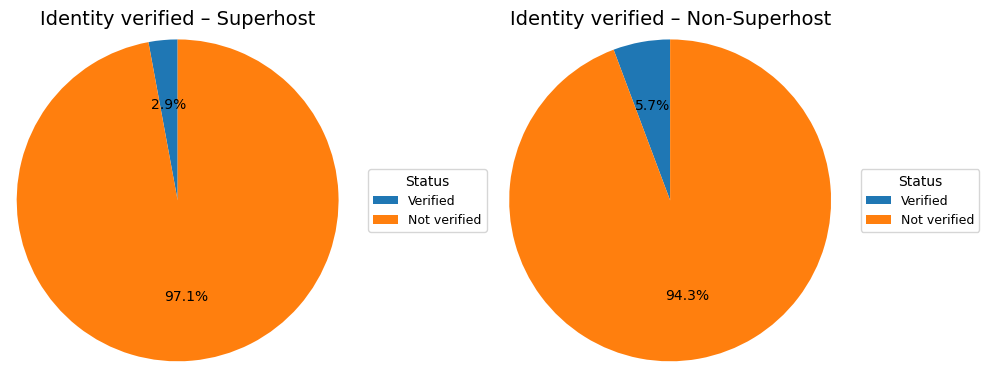

In [1011]:
#table
count_table = (
    counts.pivot(index='idv_label', columns='is_super', values='count')
          .reindex(order_labels)
          .rename(columns={1:'Superhost', 0:'Non-Superhost'})
)
print("\nHost identity verified – counts by group:")
display(count_table.style.format('{:,.0f}'))

#Pie charts
def make_idv_pie(ax, group_name):
    sub = counts[(counts['is_super'] == (1 if group_name=='Superhost' else 0)) &
                 (counts['idv_label'].isin(['Verified','Not verified']))]
    sizes = sub.sort_values('idv_label')['share'].values
    labels = ['Verified','Not verified']
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize':10},
        radius=1.2
    )
    ax.set_title(f'Identity verified – {group_name}', fontsize=14)
    ax.legend(wedges, labels, title='Status', loc='center left',
              bbox_to_anchor=(1.05, 0.5), fontsize=9)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
make_idv_pie(axes[0], 'Superhost')
make_idv_pie(axes[1], 'Non-Superhost')
plt.tight_layout()
plt.show()

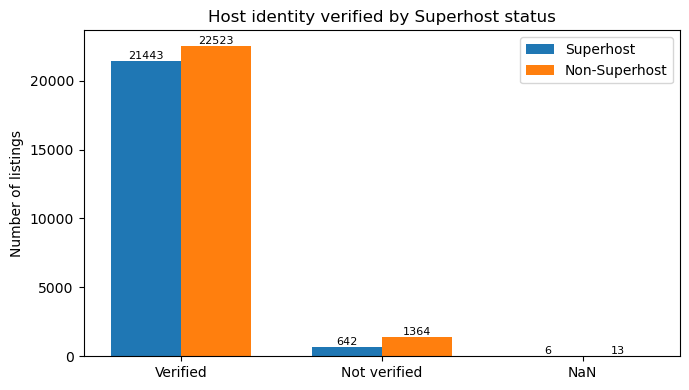

In [1012]:
#Bar chart
pivot_counts = (
    counts.pivot(index='idv_label', columns='is_super', values='count')
          .reindex(order_labels)
          .rename(columns={1:'Superhost', 0:'Non-Superhost'})
          .fillna(0)
)

x = np.arange(len(order_labels))
width = 0.35
sup_vals = pivot_counts['Superhost'].values
non_vals = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7,4))
bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')
plt.xticks(x, order_labels)
plt.ylabel('Number of listings')
plt.title('Host identity verified by Superhost status')

for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h > 0:
        plt.text(bar.get_x()+bar.get_width()/2, h, f'{int(h)}',
                 ha='center', va='bottom', fontsize=8)

plt.legend()
plt.tight_layout()
plt.show()

In [1013]:
report='''
Superhosts are slightly more likely to have their identity verified (97% vs 94%).
The share of “Not verified” hosts is roughly twice as high among Non-Superhosts (5.7% vs 2.9%), 
suggesting that skipping identity verification reduces the chance of becoming a Superhost.

However, since more than 94% of both groups are verified, identity verification is more of a hygiene factor: 
almost necessary, but far from sufficient to explain Superhost status on its own.
'''
print(report)


Superhosts are slightly more likely to have their identity verified (97% vs 94%).
The share of “Not verified” hosts is roughly twice as high among Non-Superhosts (5.7% vs 2.9%), 
suggesting that skipping identity verification reduces the chance of becoming a Superhost.

However, since more than 94% of both groups are verified, identity verification is more of a hygiene factor: 
almost necessary, but far from sufficient to explain Superhost status on its own.



In [1014]:
#host_has_profile_pic	
df = df.copy()
if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost']
          .astype(str).str.strip().str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")


raw = df['host_has_profile_pic'].astype('string').str.strip().str.lower()
truthy = {'t','true','1','y','yes'}
falsy  = {'f','false','0','n','no'}

pp_flag = np.where(raw.isna(), pd.NA,
            np.where(raw.isin(truthy), 1,
              np.where(raw.isin(falsy), 0, pd.NA)))
df['pp_flag'] = pd.Series(pp_flag, index=df.index).astype('Int8')


df['pp_label'] = df['pp_flag'].map({1:'Has profile pic', 0:'No profile pic'}).astype('string')
df.loc[df['pp_label'].isna(), 'pp_label'] = 'NaN'  


counts = (
    df.groupby(['is_super','pp_label'])
      .size().rename('count').reset_index()
)

totals = counts.groupby('is_super')['count'].transform('sum')
counts['share'] = counts['count'] / totals

order_labels = ['Has profile pic', 'No profile pic', 'NaN']

share_table = (
    counts.pivot(index='pp_label', columns='is_super', values='share')
          .reindex(order_labels)
          .rename(columns={1:'Superhost', 0:'Non-Superhost'})
)
share_table.index.name = 'host_has_profile_pic'

print("\nHost has profile pic – share by group:")
display(share_table.style.format('{:.2%}'))

Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Host has profile pic – share by group:


is_super,Non-Superhost,Superhost
host_has_profile_pic,,
Has profile pic,93.76%,97.83%
No profile pic,6.19%,2.15%
NaN,0.05%,0.03%



Host has profile pic – counts by group:


is_super,Non-Superhost,Superhost
pp_label,,
Has profile pic,"22,408","21,611"
No profile pic,"1,479",474
NaN,13,6


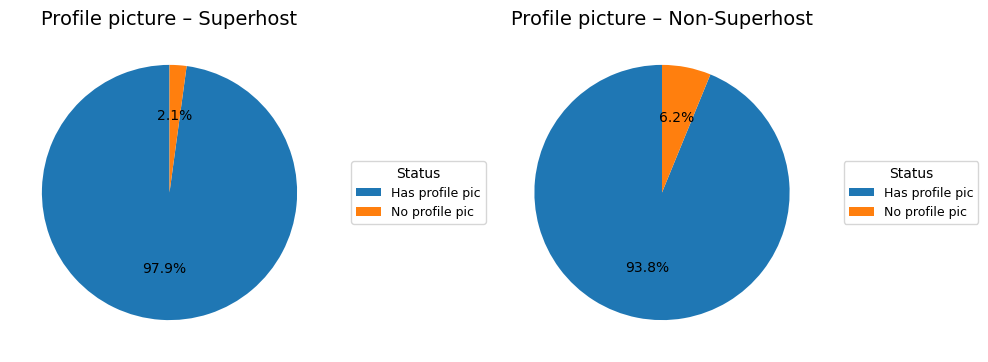

In [1015]:
#table
count_table = (
    counts.pivot(index='pp_label', columns='is_super', values='count')
          .reindex(order_labels)
          .rename(columns={1:'Superhost', 0:'Non-Superhost'})
)
print("\nHost has profile pic – counts by group:")
display(count_table.style.format('{:,.0f}'))

#Pie charts
def make_pp_pie(ax, group_name):
    sub = counts[(counts['is_super'] == (1 if group_name=='Superhost' else 0)) &
                 (counts['pp_label'].isin(['Has profile pic','No profile pic']))]
    sizes = sub.sort_values('pp_label')['share'].values
    labels = ['Has profile pic','No profile pic']
    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize':10},
        radius=1
    )
    ax.set_title(f'Profile picture – {group_name}', fontsize=14)
    ax.legend(wedges, labels, title='Status', loc='center left',
              bbox_to_anchor=(1.05, 0.5), fontsize=9)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
make_pp_pie(axes[0], 'Superhost')
make_pp_pie(axes[1], 'Non-Superhost')
plt.tight_layout()
plt.show()

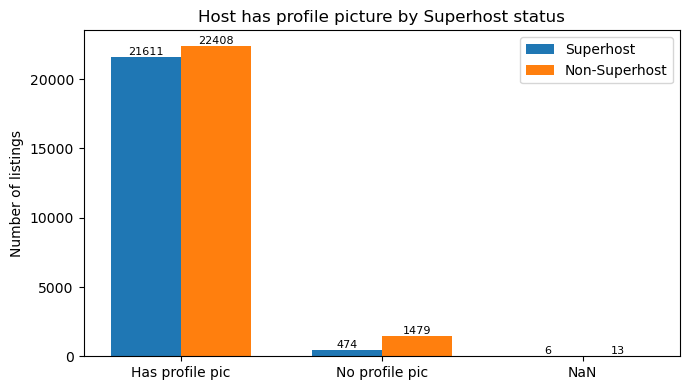

In [1016]:
#Bar chart
pivot_counts = (
    counts.pivot(index='pp_label', columns='is_super', values='count')
          .reindex(order_labels)
          .rename(columns={1:'Superhost', 0:'Non-Superhost'})
          .fillna(0)
)

x = np.arange(len(order_labels))
width = 0.35
sup_vals = pivot_counts['Superhost'].values
non_vals = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7,4))
bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')
plt.xticks(x, order_labels)
plt.ylabel('Number of listings')
plt.title('Host has profile picture by Superhost status')

for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h > 0:
        plt.text(bar.get_x()+bar.get_width()/2, h, f'{int(h)}',
                 ha='center', va='bottom', fontsize=8)

plt.legend()
plt.tight_layout()
plt.show()


In [1017]:
report='''
Superhosts are slightly more likely to have a profile photo (97.8% vs 93.8%),
and the share of “No profile pic” hosts is almost three times higher among Non-Superhosts (6.2% vs 2.1%).

This suggests that not showing a face on the profile reduces trust and is more common in the Non-Superhost group.

However, since more than 93% of both groups already have a photo, a profile picture functions more as a signal factor – 
almost mandatory for trust, but not sufficient on its own to guarantee Superhost status.
'''
print(report)


Superhosts are slightly more likely to have a profile photo (97.8% vs 93.8%),
and the share of “No profile pic” hosts is almost three times higher among Non-Superhosts (6.2% vs 2.1%).

This suggests that not showing a face on the profile reduces trust and is more common in the Non-Superhost group.

However, since more than 93% of both groups already have a photo, a profile picture functions more as a signal factor – 
almost mandatory for trust, but not sufficient on its own to guarantee Superhost status.



In [1018]:
#host_verifications
df = df.copy()
if 'is_super' not in df.columns:
    df['is_super'] = (
        df['host_is_superhost']
          .astype(str).str.strip().str.lower()
          .map({'t': 1, 'true': 1, '1': 1,
                'f': 0, 'false': 0, '0': 0})
          .astype('Int8')
    )

print(f"Total hosts: {len(df)}")
print(f"Superhosts: {(df['is_super'] == 1).sum()}")
print(f"Non-Superhosts: {(df['is_super'] == 0).sum()}")


import ast, re

def _to_list(x):
    if pd.isna(x):
        return pd.NA
    s = str(x).strip()
    if s.startswith('[') or s.startswith('(') or s.startswith('{'):
        try:
            v = ast.literal_eval(s)
            if isinstance(v, (list, tuple, set)):
                return [str(i).strip().lower() for i in list(v)]
        except Exception:
            pass
    parts = [p.strip().lower() for p in re.split(r'[,\|;/]+', s) if p.strip()!='']
    return parts if parts else pd.NA

ver_list = df['host_verifications'].apply(_to_list)

def _count_safe(v):
    if v is pd.NA:
        return pd.NA
    return len(v)

df['verif_count'] = ver_list.apply(_count_safe).astype('Int64')


def _has_govid(v):
    if v is pd.NA:
        return pd.NA
    tokens = set(v)
    joined = ' '.join(tokens)
    return 1 if re.search(r'government|identity|id_card|id\-card|gov', joined) else 0

df['has_govid'] = ver_list.apply(_has_govid).astype('Int8')

bins = [-0.1, 0.9, 1.9, 3.9, np.inf]   
labels = ['0', '1', '2–3', '4+']

df['verif_bucket'] = pd.cut(
    df['verif_count'].astype('float'),
    bins=bins, labels=labels, include_lowest=True, right=True
)

counts = (
    df.groupby(['is_super', 'verif_bucket'], observed=False)
      .size().rename('count').reset_index()
)
totals = counts.groupby('is_super')['count'].transform('sum')
counts['share'] = counts['count'] / totals

order_labels = labels

share_table = (
    counts.pivot(index='verif_bucket', columns='is_super', values='share')
          .reindex(order_labels)
          .rename(columns={1:'Superhost', 0:'Non-Superhost'})
)
share_table.index.name = 'verif_count_bucket'

print("\nHost verifications – share by bucket:")
display(share_table.style.format('{:.2%}'))

Total hosts: 47097
Superhosts: 22091
Non-Superhosts: 23900

Host verifications – share by bucket:


is_super,Non-Superhost,Superhost
verif_count_bucket,,
0,0.05%,0.00%
1,17.57%,7.16%
2–3,82.37%,92.83%
4+,0.00%,0.00%



Host verifications – counts by bucket:


is_super,Non-Superhost,Superhost
verif_bucket,,
0,13,1
1,"4,198","1,582"
2–3,"19,676","20,501"
4+,0,1


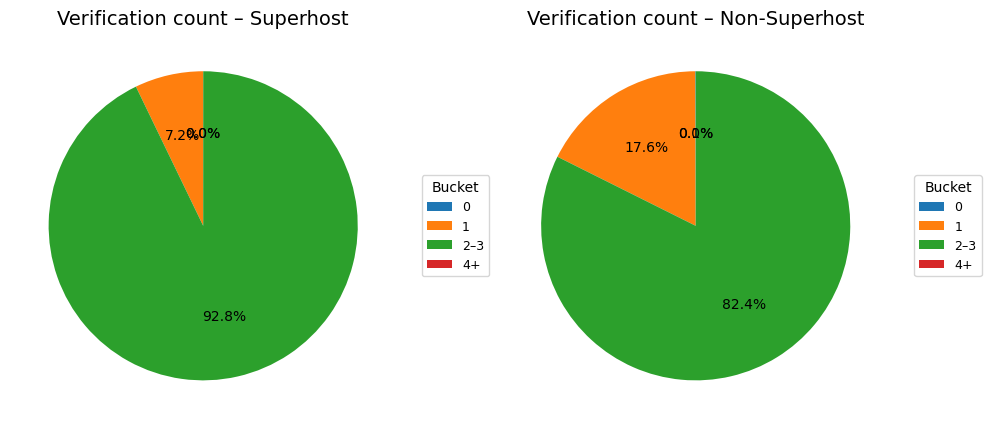

In [1019]:
#table
count_table = (
    counts.pivot(index='verif_bucket', columns='is_super', values='count')
          .reindex(order_labels)
          .rename(columns={1:'Superhost', 0:'Non-Superhost'})
)
print("\nHost verifications – counts by bucket:")
display(count_table.style.format('{:,.0f}'))

#pie charts
def make_bucket_pie(ax, group_name):
    g = 1 if group_name=='Superhost' else 0
    sub = counts[counts['is_super']==g].sort_values('verif_bucket')
    sizes = sub['share'].values
    labs  = sub['verif_bucket'].astype(str).tolist()
    wedges, texts, autotexts = ax.pie(
        sizes, autopct='%1.1f%%', startangle=90,
        textprops={'fontsize':10}, radius=1
    )
    ax.set_title(f'Verification count – {group_name}', fontsize=14)
    ax.legend(wedges, labs, title='Bucket', loc='center left',
              bbox_to_anchor=(1.05, 0.5), fontsize=9)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
make_bucket_pie(axes[0], 'Superhost')
make_bucket_pie(axes[1], 'Non-Superhost')
plt.tight_layout()
plt.show()

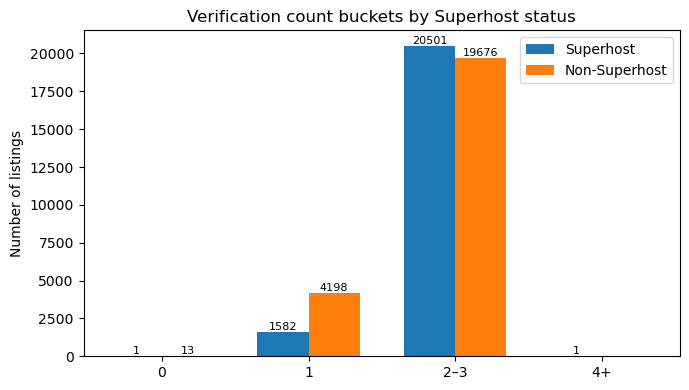

In [1020]:
#Bar chart
pivot_counts = count_table.fillna(0)
x = np.arange(len(order_labels))
width = 0.35
sup_vals = pivot_counts['Superhost'].values
non_vals = pivot_counts['Non-Superhost'].values

plt.figure(figsize=(7,4))
bars_sup = plt.bar(x - width/2, sup_vals, width, label='Superhost')
bars_non = plt.bar(x + width/2, non_vals, width, label='Non-Superhost')
plt.xticks(x, order_labels)
plt.ylabel('Number of listings')
plt.title('Verification count buckets by Superhost status')

for bar in list(bars_sup) + list(bars_non):
    h = bar.get_height()
    if h>0:
        plt.text(bar.get_x()+bar.get_width()/2, h, f'{int(h)}',
                 ha='center', va='bottom', fontsize=8)
plt.legend(); plt.tight_layout(); plt.show()



Branch A - Host Factor Analysis

In addition to response behavior, host profile completeness, verification status, and hosting experience are also important factors influencing Superhost designation.

Superhost count: 22091
Non-Superhost count: 25006

Host Factor Comparison (Means):


,Factor,Superhost_Mean,NonSuperhost_Mean,Difference
0,Hosting_Years,7.99,7.20,0.79
1,Verification_Count,2.06,1.91,0.15
2,Identity_Verified,0.97,0.94,0.03
3,Has_Profile_Pic,0.98,0.94,0.04


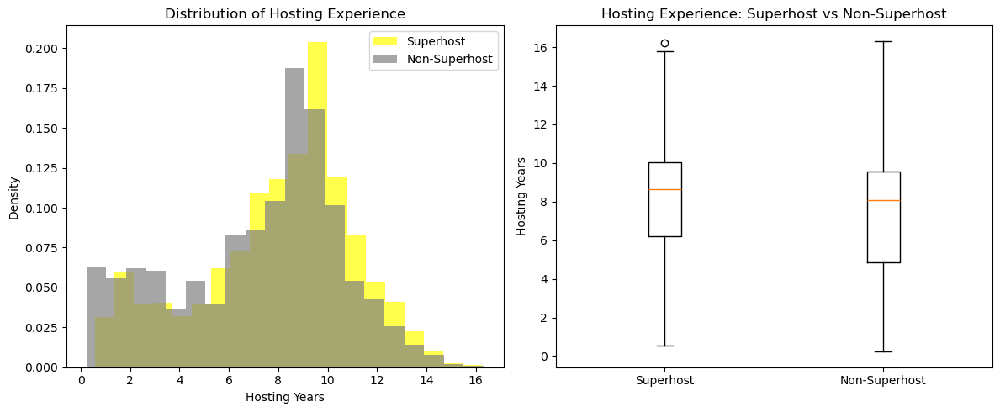


Verification Methods Distribution:


,Verification_Count,Superhost_Count,NonSuperhost_Count,Superhost_Pct,NonSuperhost_Pct
0,1,1583,4260,7.2%,17.0%
1,2,17486,18625,79.2%,74.5%
2,3,3015,2108,13.6%,8.4%
3,4,1,0,0.0%,0.0%


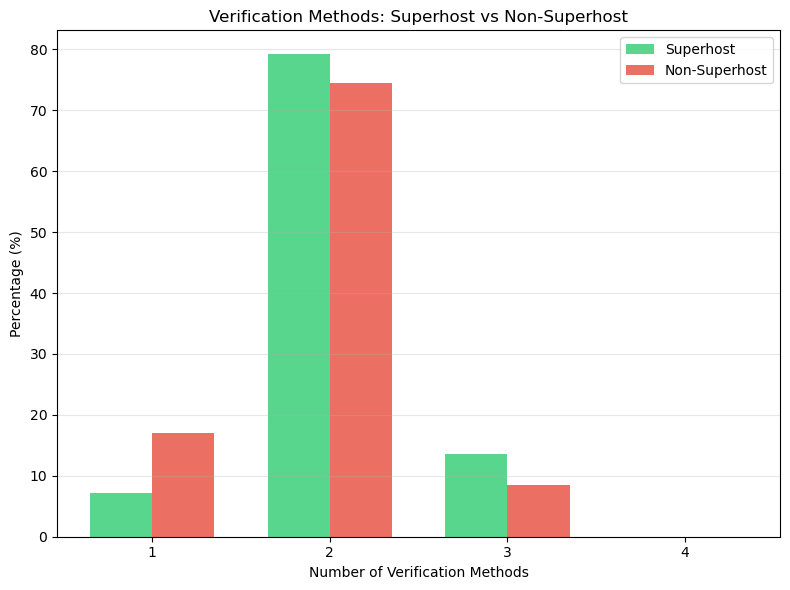

In [1021]:
print("\nBranch A - Host Factor Analysis\n")
print("In addition to response behavior, host profile completeness, verification status, and hosting experience are also important factors influencing Superhost designation.\n")

cols = {c.lower(): c for c in df.columns}
SUPER_COL = (
    cols.get("is_super") or
    cols.get("host_is_superhost") or
    cols.get("is_superhost")
)

if SUPER_COL is None:
    raise ValueError("cannot find Superhost column")

# is_super
df["is_super"] = (
    df[SUPER_COL]
      .astype(str)
      .str.strip()
      .str.lower()
      .map({'t':1,'true':1,'1':1,'y':1,'yes':1,
            'f':0,'false':0,'0':0,'n':0,'no':0})
      .fillna(0)
      .astype("int8")
)
# (host_since)
df['host_since'] = pd.to_datetime(df['host_since'], errors='coerce')
df['hosting_years'] = (pd.Timestamp.now() - df['host_since']).dt.days / 365.25

# Number of verification 
df['verification_count'] = df['host_verifications'].str.split(',').str.len()

# Identity verification 
df['identity_verified'] = (
    df['host_identity_verified']
    .astype(str)
    .str.strip()
    .str.lower()
    .map({'t': 1, 'true': 1, '1': 1, 'f': 0, 'false': 0, '0': 0})
    .astype('Int8')
)

# Profile picture availability
df['has_profile_pic'] = (
    df['host_has_profile_pic']
    .astype(str)
    .str.strip()
    .str.lower()
    .map({'t': 1, 'true': 1, '1': 1, 'f': 0, 'false': 0, '0': 0})
    .astype('Int8')
)


# Extract Superhost vs Non-Superhost
super_host = df[df['is_super'] == 1].copy()
non_super_host = df[df['is_super'] == 0].copy()

print(f"Superhost count: {len(super_host)}")
print(f"Non-Superhost count: {len(non_super_host)}")

#  Comparison Analysis

host_factors = [
    'hosting_years',
    'verification_count',
    'identity_verified',
    'has_profile_pic'
]

factor_names = [
    'Hosting_Years',
    'Verification_Count',
    'Identity_Verified',
    'Has_Profile_Pic'
]

host_summary = pd.DataFrame({
    'Factor': factor_names,
    'Superhost_Mean': [super_host[col].mean() for col in host_factors],
    'NonSuperhost_Mean': [non_super_host[col].mean() for col in host_factors],
    'Difference': [super_host[col].mean() - non_super_host[col].mean() for col in host_factors]
})

print("\nHost Factor Comparison (Means):")
display(host_summary.style.format({
    'Superhost_Mean': '{:.2f}',
    'NonSuperhost_Mean': '{:.2f}',
    'Difference': '{:.2f}'
}).bar(subset=['Difference'], align='mid', color=['#d65f5f', '#5fba7d']))

# Visualization

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(super_host['hosting_years'].dropna(), bins=20, alpha=0.7, label='Superhost', color='yellow', density=True)
plt.hist(non_super_host['hosting_years'].dropna(), bins=20, alpha=0.7, label='Non-Superhost', color='grey', density=True)
plt.xlabel('Hosting Years')
plt.ylabel('Density')
plt.title('Distribution of Hosting Experience')
plt.legend()

plt.subplot(1, 2, 2)
host_exp_data = [super_host['hosting_years'].dropna(), non_super_host['hosting_years'].dropna()]
box_plot = plt.boxplot(host_exp_data, tick_labels=['Superhost', 'Non-Superhost'])
plt.ylabel('Hosting Years')
plt.title('Hosting Experience: Superhost vs Non-Superhost')

plt.tight_layout()
plt.show()

# Verification Methods Count Comparison
print("\nVerification Methods Distribution:")
# Fix: Ensure max_verifications is integer
max_verifications = int(min(df['verification_count'].max(), 15))  # Convert to integer
verification_range = range(1, max_verifications + 1)

verification_summary = pd.DataFrame({
    'Verification_Count': verification_range,
    'Superhost_Count': [super_host['verification_count'].eq(i).sum() for i in verification_range],
    'NonSuperhost_Count': [non_super_host['verification_count'].eq(i).sum() for i in verification_range],
    'Superhost_Pct': [super_host['verification_count'].eq(i).sum() / len(super_host) * 100 for i in verification_range],
    'NonSuperhost_Pct': [non_super_host['verification_count'].eq(i).sum() / len(non_super_host) * 100 for i in verification_range]
})

display(verification_summary.style.format({
    'Superhost_Pct': '{:.1f}%',
    'NonSuperhost_Pct': '{:.1f}%'
}))

# Verification methods count visualization
plt.figure(figsize=(8, 6))
x = np.arange(len(verification_range))
width = 0.35

plt.bar(x - width/2, verification_summary['Superhost_Pct'], width, label='Superhost', alpha=0.8, color='#2ecc71')
plt.bar(x + width/2, verification_summary['NonSuperhost_Pct'], width, label='Non-Superhost', alpha=0.8, color='#e74c3c')

plt.xlabel('Number of Verification Methods')
plt.ylabel('Percentage (%)')
plt.title('Verification Methods: Superhost vs Non-Superhost')
plt.legend()
plt.xticks(x, verification_range)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


Combined Factor Analysis (without host_about):
Profile Completeness (pic + identity + ≥3 verifications) vs Superhost Rate:


,Completeness_Score,Superhost_Rate,Count,Superhost_Rate_Pct
0,0,18.99%,237,19.0%
1,1,27.15%,"3,238",27.1%
2,2,47.17%,"38,819",47.2%
3,3,59.48%,"4,803",59.5%



Hosting Experience vs Superhost Rate:


,Hosting_Experience,Superhost_Rate,Count,Superhost_Rate_Pct
0,<1yr,16.71%,"1,436",16.7%
1,1-3yr,42.12%,"5,017",42.1%
2,3-5yr,39.98%,"3,954",40.0%
3,5-10yr,47.40%,"26,355",47.4%
4,10+yr,54.86%,"10,316",54.9%


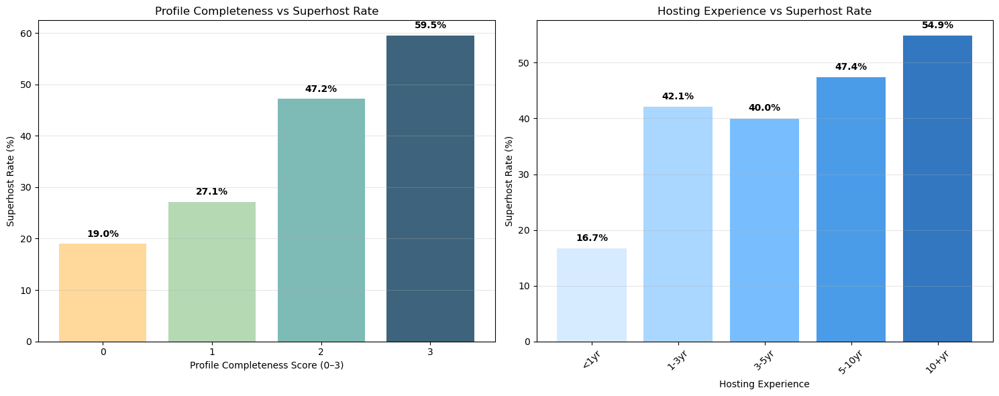


Multi-Factor Cross Analysis: Experience + Profile Completeness
Top 10 Combinations (Sorted by Superhost Rate):


,Group,Superhost_Rate,Count
7,10+yr + Score:3,63.74%,"1,922"
15,5-10yr + Score:3,57.29%,"2,688"
6,10+yr + Score:2,53.27%,"8,117"
11,3-5yr + Score:3,52.70%,148
14,5-10yr + Score:2,47.58%,"22,363"
2,1-3yr + Score:2,44.98%,"4,024"
5,10+yr + Score:1,40.15%,274
10,3-5yr + Score:2,40.12%,"3,417"
9,3-5yr + Score:1,34.63%,361
3,1-3yr + Score:3,34.21%,38


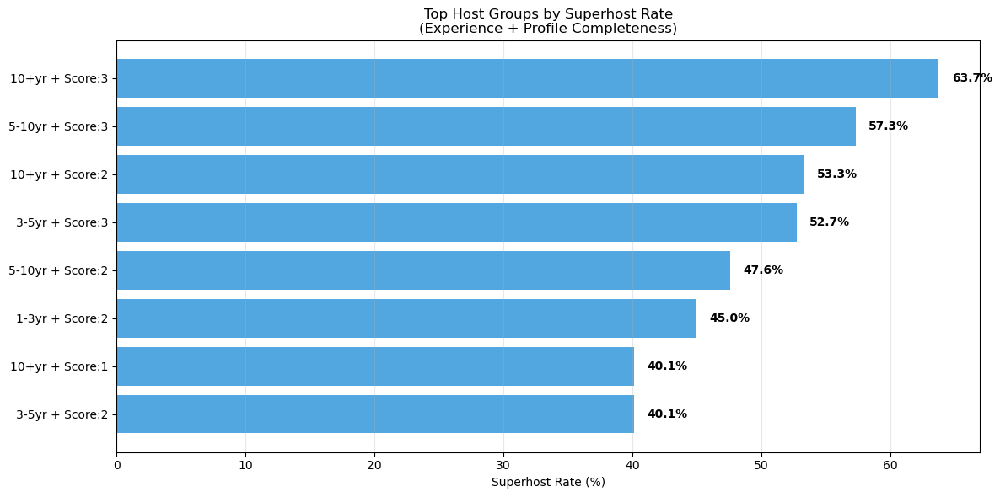

Verification & Profile Picture Combination Analysis:


,Group,Superhost_Rate,Count
0,"High_Verif:0.0, Profile_Pic:0.0",24.09%,"1,955"
1,"High_Verif:0.0, Profile_Pic:1.0",46.50%,"39,999"
2,"High_Verif:1.0, Profile_Pic:0.0",25.00%,12
3,"High_Verif:1.0, Profile_Pic:1.0",58.94%,"5,112"


In [1022]:
# Combined Factor Analysis

print("\nCombined Factor Analysis (without host_about):")

# hosting years
if 'hosting_years' not in df.columns:
    df['host_since'] = pd.to_datetime(df['host_since'], errors='coerce')
    df['hosting_years'] = (pd.Timestamp.now() - df['host_since']).dt.days / 365.25

# verification count
if 'verification_count' not in df.columns:
    df['verification_count'] = df['host_verifications'].astype(str).str.split(',').str.len()

# identity verified -
if 'identity_verified' not in df.columns:
    df['identity_verified'] = (
        df['host_identity_verified'].astype(str).str.strip().str.lower()
          .map({'t':1,'true':1,'1':1,'f':0,'false':0,'0':0})
          .astype('Int8')
    )

# has profile pic 
if 'has_profile_pic' not in df.columns:
    df['has_profile_pic'] = (
        df['host_has_profile_pic'].astype(str).str.strip().str.lower()
          .map({'t':1,'true':1,'1':1,'f':0,'false':0,'0':0})
          .astype('Int8')
    )

#  Profile completeness score (0–3)
# components: has_profile_pic  + identity_verified + (verification_count>=3) 
df['profile_completeness'] = (
    df['has_profile_pic'].fillna(0).astype(int) +
    df['identity_verified'].fillna(0).astype(int) +
    (df['verification_count'].fillna(0) >= 3).astype(int)
)

# Hosting experience 
bins   = [0, 1, 3, 5, 10, 50]
labels = ['<1yr', '1-3yr', '3-5yr', '5-10yr', '10+yr']
df['hosting_exp_group'] = pd.cut(df['hosting_years'], bins=bins, labels=labels, right=False)

# Profile completeness vs Superhost rate 
completeness_summary = (
    df.groupby('profile_completeness', observed=False)['is_super']
      .agg(['mean','count'])
      .reset_index()
      .rename(columns={'mean':'Superhost_Rate','count':'Count',
                       'profile_completeness':'Completeness_Score'})
)
completeness_summary['Superhost_Rate_Pct'] = completeness_summary['Superhost_Rate'] * 100

print("Profile Completeness (pic + identity + ≥3 verifications) vs Superhost Rate:")
display(completeness_summary.style.format({
    'Superhost_Rate': '{:.2%}',
    'Superhost_Rate_Pct': '{:.1f}%',
    'Count': '{:,}'
}))

# Hosting experience vs Superhost rate 
exp_summary = (
    df.groupby('hosting_exp_group', observed=False)['is_super']
      .agg(['mean','count'])
      .reset_index()
      .rename(columns={'mean':'Superhost_Rate','count':'Count',
                       'hosting_exp_group':'Hosting_Experience'})
)
exp_summary['Superhost_Rate_Pct'] = exp_summary['Superhost_Rate'] * 100

print("\nHosting Experience vs Superhost Rate:")
display(exp_summary.style.format({
    'Superhost_Rate': '{:.2%}',
    'Superhost_Rate_Pct': '{:.1f}%',
    'Count': '{:,}'
}))

# Visualizations 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# profile completeness (0–3)
colors1 = ['#ffd28a', '#a7d3a6', '#68b0ab', '#1b4965']  
ax1.bar(completeness_summary['Completeness_Score'].astype(str),
        completeness_summary['Superhost_Rate_Pct'],
        color=colors1[:len(completeness_summary)], alpha=0.85)
ax1.set_xlabel('Profile Completeness Score (0–3)')
ax1.set_ylabel('Superhost Rate (%)')
ax1.set_title('Profile Completeness vs Superhost Rate')
ax1.grid(axis='y', alpha=0.3)
for i, v in enumerate(completeness_summary['Superhost_Rate_Pct']):
    ax1.text(i, v + 1, f'{v:.1f}%', ha='center', va='bottom', fontweight='bold')

# experience buckets
colors2 = ['#cfe8ff', '#9bd1ff', '#61b3ff', '#2a8be6', '#0f5fb5']
ax2.bar(exp_summary['Hosting_Experience'].astype(str),
        exp_summary['Superhost_Rate_Pct'],
        color=colors2[:len(exp_summary)], alpha=0.85)
ax2.set_xlabel('Hosting Experience')
ax2.set_ylabel('Superhost Rate (%)')
ax2.set_title('Hosting Experience vs Superhost Rate')
ax2.tick_params(axis='x', rotation=45)
ax2.grid(axis='y', alpha=0.3)
for i, v in enumerate(exp_summary['Superhost_Rate_Pct']):
    ax2.text(i, v + 1, f'{v:.1f}%', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

#Multi-Factor Cross Analysis
print("\nMulti-Factor Cross Analysis: Experience + Profile Completeness")
df['exp_completeness_group'] = (
    df['hosting_exp_group'].astype(str) + ' + Score:' + df['profile_completeness'].astype(str)
)

cross_summary = (
    df.groupby('exp_completeness_group', observed=False)['is_super']
      .agg(['mean','count'])
      .reset_index()
      .rename(columns={'mean':'Superhost_Rate','count':'Count',
                       'exp_completeness_group':'Group'})
      .sort_values('Superhost_Rate', ascending=False)
)

print("Top 10 Combinations (Sorted by Superhost Rate):")
display(cross_summary.head(10).style.format({
    'Superhost_Rate': '{:.2%}',
    'Count': '{:,}'
}))

plt.figure(figsize=(12, 6))
top_groups = cross_summary.head(8)
plt.barh(top_groups['Group'], top_groups['Superhost_Rate'] * 100, color='#3498db', alpha=0.85)
plt.xlabel('Superhost Rate (%)')
plt.title('Top Host Groups by Superhost Rate\n(Experience + Profile Completeness)')
plt.gca().invert_yaxis()
plt.grid(axis='x', alpha=0.3)
for i, v in enumerate(top_groups['Superhost_Rate'] * 100):
    plt.text(v + 1, i, f'{v:.1f}%', va='center', fontweight='bold')
plt.tight_layout()
plt.show()

# Verification × Profile Pic combo 
df['high_verification'] = (df['verification_count'] >= 3).astype(int)
verification_profile_summary = (
    df.groupby(['high_verification', 'has_profile_pic'], observed=False)['is_super']
      .agg(['mean','count'])
      .reset_index()
      .rename(columns={'mean':'Superhost_Rate','count':'Count',
                       'high_verification':'High_Verification',
                       'has_profile_pic':'Has_Profile_Pic'})
)
verification_profile_summary['Group'] = verification_profile_summary.apply(
    lambda x: f"High_Verif:{x['High_Verification']}, Profile_Pic:{x['Has_Profile_Pic']}", axis=1
)
print("Verification & Profile Picture Combination Analysis:")
display(verification_profile_summary[['Group','Superhost_Rate','Count']].style.format({
    'Superhost_Rate': '{:.2%}', 'Count': '{:,}'
}))

In [1023]:
# Conclusions 
print("COMPLETE HOST FACTOR ANALYSIS CONCLUSIONS ")
report='''
Across all hosts (≈47k listings), Superhosts and Non-Superhosts differ on several host-side factors:

1.Hosting experience:

Superhosts: 7.98 years on average; Non-Superhosts: 7.19 years; Gap ≈ 0.8 years

Verification methods:
Superhosts use on average 2.06 verification methods; Non-Superhosts: 1.91

Identity verified:
Superhosts: 97%; Non-superhosts: 94%

Profile picture:
Superhosts: 98%; Non-Superhosts: 94%

These differences are smallest for identity verification and profile photo, and largest for hosting years.

2.Hosting Experience vs Superhost Rate table:

<1 year: Superhost rate 17.8%（very low）; 1–3 years: 43.4%; 3–5 years: 42.6%（similar to 1–3y; 5–10 years: 48.3%; 10+ years: 56.3% (highest)

Histogram and boxplots show distributions are overlapping but Superhosts are slightly shifted to the right,
with more hosts in the 8–12 year range and fewer in the very new segment.

Interpretation:
Hosting experience is a strong driver of Superhost status.
Very new hosts (<1 year) have a much lower chance (~18%).
Once hosts accumulate 1–5 years, the Superhost rate jumps to ~43%.
Long-tenure hosts (5–10+ years) reach ~48–56% Superhost rate, 
indicating that staying on the platform and surviving over time is positively associated with becoming Superhost.

3.Profile Completeness vs Superhost Rate  table:

Score 0 (none of the three): Superhost rate 19.1%
Score 1: 27.4%
Score 2: 48.3%
Score 3 (fully complete): 61.3%

This is a clear step-change pattern: going from score 0 → 1 gives a small lift, 
but moving to 2 or 3 nearly doubles or triples the Superhost rate compared with the lowest group.

4.Superhosts tend to use slightly more verification methods, and are less likely to stay at the “minimum one verification” level.

However, because both groups already cluster around 2 verifications, method count is more of a hygiene factor: doing too little (only one method) is a negative signal,
but just adding more methods on top gives diminishing marginal gains.

5.“Multi-Factor Cross Analysis”:

Top groups by Superhost rate:
10+ years + score 3 → 64.7% Superhost rate (n ≈ 1,873)
5–10 years + score 3 → 59.9% (n ≈ 2,592)
10+ years + score 2 → 54.8% (n ≈ 7,818)
3–5 years + score 3 → 50.3%,.

Key patterns:
Within the same experience band, raising completeness score from 1 → 2 → 3 consistently pushes the Superhost rate up.

Within the same completeness score, moving from short to long tenure (1–3y → 5–10y → 10+ y) also raises the Superhost rate.

The best-performing cluster is “10+ years + fully complete profile”, with about 65% of listings being Superhosts.

6.A profile picture alone (even without high verification) already doubles the Superhost rate (24% → 48%).

High verification without a photo does not improve much over the lowest group (24% → 25%, but sample is tiny).

The best combination is high verification + profile photo, reaching ~61% Superhost rate.

Interpretation:
For guests, seeing the host’s face is more immediately impactful than just having extra verification badges.
High verification acts as a reinforcing signal on top of a good profile, rather than replacing the need for a photo.

Conclusion:In summary, host-side factors matter for becoming a Superhost. Hosting experience is the strongest driver: 
Superhost rates rise from about 18% for <1-year hosts to more than 56% for 10+-year hosts. 

Profile completeness—having identity verified, a clear profile photo, 
and at least three verification methods—shows a clear step-change from 19% to 61% Superhost rate as the score increases from 0 to 3.
Verification count, identity verification and profile photos behave as hygiene factors: most hosts already have them,
but missing them sharply reduces the chance of being a Superhost. 

The highest Superhost rates (around 60–65%) are achieved by experienced hosts (5–10+ years) 
with fully complete profiles and strong trust signals (photo + multiple verifications).
'''
print(report)

COMPLETE HOST FACTOR ANALYSIS CONCLUSIONS 

Across all hosts (≈47k listings), Superhosts and Non-Superhosts differ on several host-side factors:

1.Hosting experience:

Superhosts: 7.98 years on average; Non-Superhosts: 7.19 years; Gap ≈ 0.8 years

Verification methods:
Superhosts use on average 2.06 verification methods; Non-Superhosts: 1.91

Identity verified:
Superhosts: 97%; Non-superhosts: 94%

Profile picture:
Superhosts: 98%; Non-Superhosts: 94%

These differences are smallest for identity verification and profile photo, and largest for hosting years.

2.Hosting Experience vs Superhost Rate table:

<1 year: Superhost rate 17.8%（very low）; 1–3 years: 43.4%; 3–5 years: 42.6%（similar to 1–3y; 5–10 years: 48.3%; 10+ years: 56.3% (highest)

Histogram and boxplots show distributions are overlapping but Superhosts are slightly shifted to the right,
with more hosts in the 8–12 year range and fewer in the very new segment.

Interpretation:
Hosting experience is a strong driver of Superho

In [1024]:
report='''
This section extends the analysis beyond the characteristics of hosts to the attributes of the properties themselves. 

First, it compares the differences between Superhosts and non-Superhosts in terms of property type and configuration, 
including occupancy, number of bedrooms, number of beds, and number of bathrooms. 

Second, it links these configuration characteristics to geographical location (region, city, and neighborhood) and price (average nightly rate) 
to examine hosts' pricing and configuration strategies in different markets. 

Finally, it cross-compares two perspectives to differentiate the impact of location and configuration on price: 
one is the pricing difference for the same configuration in different locations, 
and the other is the pricing difference for the same location in different configurations, 
thus more systematically depicting the price formation mechanism in the Airbnb market.
'''
print(report)


This section extends the analysis beyond the characteristics of hosts to the attributes of the properties themselves. 

First, it compares the differences between Superhosts and non-Superhosts in terms of property type and configuration, 
including occupancy, number of bedrooms, number of beds, and number of bathrooms. 

Second, it links these configuration characteristics to geographical location (region, city, and neighborhood) and price (average nightly rate) 
to examine hosts' pricing and configuration strategies in different markets. 

Finally, it cross-compares two perspectives to differentiate the impact of location and configuration on price: 
one is the pricing difference for the same configuration in different locations, 
and the other is the pricing difference for the same location in different configurations, 
thus more systematically depicting the price formation mechanism in the Airbnb market.



In [1025]:
print('price Comparsion')

price Comparsion


In [1026]:
#normal dis

In [1105]:
# Superhost vs Non-Superhost: Price analysis

def detect_col(columns, candidates):
    norm = {c.lower().replace("_", ""): c for c in columns}

    for cand in candidates:
        key = cand.lower().replace("_", "")
        if key in norm:
            return norm[key]

    for cand in candidates:
        key = cand.lower().replace("_", "")
        for k, c in norm.items():
            if key in k:
                return c
    return None

def bool01(s):
    mapping = {
        "t": 1, "true": 1, "1": 1, "y": 1, "yes": 1,
        "f": 0, "false": 0, "0": 0, "n": 0, "no": 0,
    }
    return (
        s.astype(str)
         .str.strip()
         .str.lower()
         .map(mapping)
         .fillna(0)
         .astype("int8")
    )

def get_or_raise(df, candidates, err_msg):
    col = detect_col(df.columns, candidates)
    if col is None:
        raise ValueError(err_msg)
    return col

def clean_price_to_numeric(s):
    return pd.to_numeric(
        s.astype(str)
         .str.replace(r"[\$,]", "", regex=True)
         .str.replace(" ", "", regex=False),
        errors="coerce",
    )

PRICE  = get_or_raise(
    df,
    ["price", "nightly_price", "listing_price"],
    "Could not find a price column (price / nightly_price / listing_price).",
)
SUPER  = get_or_raise(
    df,
    ["is_super", "host_is_superhost", "is_superhost"],
    "Could not find a Superhost flag column (e.g. host_is_superhost / is_super).",
)

ID_COL = detect_col(df.columns, ["id", "listing_id", "listingid"])
if ID_COL is None:
    ID_COL = df.columns[0]

d = df.copy()
d["is_super"] = bool01(d[SUPER])

# clean price
d[PRICE] = clean_price_to_numeric(d[PRICE])


d = d[d[PRICE].gt(0)].copy()
if d.empty:
    raise ValueError("No valid price data after cleaning.")

# group label
d["group"] = d["is_super"].map({1: "Superhost", 0: "Non-Superhost"})


#IQR filter 

q1, q3 = d[PRICE].quantile([0.25, 0.75])
iqr = q3 - q1
lower = max(q1 - 1.5 * iqr, 0)
upper = q3 + 1.5 * iqr

d_iqr = d[d[PRICE].between(lower, upper)].copy()
if d_iqr.empty:
    d_iqr = d.copy()

# summary
summary = (
    d_iqr.groupby("group")[PRICE]
         .agg(count="count", mean="mean", median="median")
         .reset_index()
)
print("Price Summary By Group (IQR-Filtered):")
display(summary.style.format({"count": "{:,.0f}", "mean": "{:.2f}", "median": "{:.1f}"}))

#Build buckets by Normal distribution

def add_normal_buckets(
    df_in,
    price_col,
    use_log=True,
    z_cuts=None,
    bucket_col="price_bucket"
):
    df_out = df_in.copy()
    price_series = df_out[price_col].astype(float).dropna()

    if use_log:
        x = np.log(price_series)
    else:
        x = price_series.copy()

    mu = float(x.mean())
    sigma = float(x.std(ddof=0))
    if sigma == 0 or np.isnan(sigma):
        raise ValueError("Price variance is 0; cannot build normal-based buckets.")


    if z_cuts is None:
        z_cuts = np.array([-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2], dtype=float)
    else:
        z_cuts = np.array(z_cuts, dtype=float)


    x_min, x_max = float(x.min()), float(x.max())
    x_edges = np.r_[x_min - 1e-9, mu + z_cuts * sigma, x_max + 1e-9]
    x_edges = np.unique(np.sort(x_edges))


    edges = np.exp(x_edges) if use_log else x_edges
    edges = np.unique(edges)
    edges.sort()
    if len(edges) < 3:
        raise ValueError("Not enough unique bucket edges; try fewer z_cuts or relax filtering.")

    # labels 
    labels = []
    for i in range(len(edges) - 1):
        a, b = edges[i], edges[i + 1]
        a_i, b_i = int(round(a)), int(round(b))
        if i == 0:
            labels.append(f"≤{b_i}")
        elif i == len(edges) - 2:
            labels.append(f"≥{a_i}")
        else:
            labels.append(f"{a_i}–{b_i}")

    df_out[bucket_col] = pd.cut(
        df_out[price_col],
        bins=edges,
        labels=labels,
        include_lowest=True,
        right=False
    )

    df_out = df_out[df_out[bucket_col].notna()].copy()
    if df_out.empty:
        raise ValueError("No data left after bucketing. Check edges or z_cuts.")
    return df_out, edges, labels, mu, sigma

USE_LOG = True
Z_CUTS  = [-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]  

d_iqr, edges, labels, mu, sigma = add_normal_buckets(
    d_iqr, PRICE, use_log=USE_LOG, z_cuts=Z_CUTS, bucket_col="price_bucket"
)

print(f"\nNormal-based bucketing on {'log(price)' if USE_LOG else 'price'}:")
print(f"mu={mu:.4f}, sigma={sigma:.4f}, buckets={len(labels)}")
print("Bucket labels:", labels)


def share_table_by_bucket(df_sub, bucket_col="price_bucket"):
    counts = (
        df_sub.groupby(["group", bucket_col], observed=True)[ID_COL]
              .size()
              .reset_index(name="count")
    )
    pivot_counts = (
        counts.pivot(index=bucket_col, columns="group", values="count")
              .fillna(0)
              .astype(int)
    )
    share = pivot_counts.div(pivot_counts.sum(axis=0), axis=1)
    return pivot_counts, share

def plot_pie_for_group(share_df, count_df, group_name, ax, bucket_col_label="bucket"):
    if group_name not in share_df.columns:
        ax.text(0.5, 0.5, "No data", ha="center", va="center")
        ax.axis("off")
        return

    sizes = share_df[group_name].fillna(0).values
    if sizes.sum() == 0:
        ax.text(0.5, 0.5, "No data", ha="center", va="center")
        ax.axis("off")
        return

    labels = [
        f"{str(idx)}\n(n={int(count_df.loc[idx, group_name])})"
        for idx in share_df.index
    ]

    wedges, texts, autotexts = ax.pie(
        sizes,
        labels=labels,
        autopct="%1.1f%%",
        startangle=90
    )
    ax.set_title(f"{group_name}: {bucket_col_label} share")

def plot_counts_bar(count_df, title="Counts by bucket and group"):
    buckets = [str(x) for x in count_df.index]
    x = np.arange(len(buckets))
    width = 0.35

    super_vals = count_df["Superhost"].values if "Superhost" in count_df.columns else np.zeros(len(buckets))
    non_vals   = count_df["Non-Superhost"].values if "Non-Superhost" in count_df.columns else np.zeros(len(buckets))

    plt.figure(figsize=(12, 5))
    plt.bar(x - width/2, super_vals, width, label="Superhost")
    plt.bar(x + width/2, non_vals,   width, label="Non-Superhost")
    plt.xticks(x, buckets, rotation=45, ha="right")
    plt.ylabel("Number of listings")
    plt.title(title)
    plt.legend()

    for i, v in enumerate(super_vals):
        plt.text(x[i] - width/2, v, f"{int(v)}", ha="center", va="bottom", fontsize=8)
    for i, v in enumerate(non_vals):
        plt.text(x[i] + width/2, v, f"{int(v)}", ha="center", va="bottom", fontsize=8)

    plt.tight_layout()
    plt.show()

def plot_share_bar(share_df, title="Share by bucket (within each group)"):
    buckets = [str(x) for x in share_df.index]
    x = np.arange(len(buckets))
    width = 0.35

    super_vals = share_df["Superhost"].fillna(0).values if "Superhost" in share_df.columns else np.zeros(len(buckets))
    non_vals   = share_df["Non-Superhost"].fillna(0).values if "Non-Superhost" in share_df.columns else np.zeros(len(buckets))

    plt.figure(figsize=(12, 5))
    plt.bar(x - width/2, super_vals * 100, width, label="Superhost")
    plt.bar(x + width/2, non_vals * 100,   width, label="Non-Superhost")
    plt.xticks(x, buckets, rotation=45, ha="right")
    plt.ylabel("Share (%)")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

#tables
pivot_counts, share = share_table_by_bucket(d_iqr, bucket_col="price_bucket")

print("\n=== Price bucket counts table ===")
display(
    pivot_counts.style.format("{:,.0f}")
         .set_caption("Counts of listings in each price bucket (Superhost vs Non-Superhost)")
)

Price Summary By Group (IQR-Filtered):


,group,count,mean,median
0,Non-Superhost,"21,660",225.43,195.0
1,Superhost,"19,840",204.85,173.0



Normal-based bucketing on log(price):
mu=5.2053, sigma=0.5932, buckets=10
Bucket labels: ['≤56', '56–75', '75–101', '101–135', '135–182', '182–245', '245–330', '330–444', '444–597', '≥597']

=== Price bucket counts table ===


group,Non-Superhost,Superhost
price_bucket,,
≤56,568,435
56–75,979,756
75–101,"2,050","2,035"
101–135,"2,954","3,511"
135–182,"3,608","3,946"
182–245,"3,590","3,581"
245–330,"3,484","2,622"
330–444,"2,526","1,815"
444–597,"1,733","1,073"



Price Share By Bucket (within each group):


group,Superhost,Non-Superhost
price_bucket,,
≤56,2.19%,2.62%
56–75,3.81%,4.52%
75–101,10.26%,9.46%
101–135,17.70%,13.64%
135–182,19.89%,16.66%
182–245,18.05%,16.57%
245–330,13.22%,16.08%
330–444,9.15%,11.66%
444–597,5.41%,8.00%


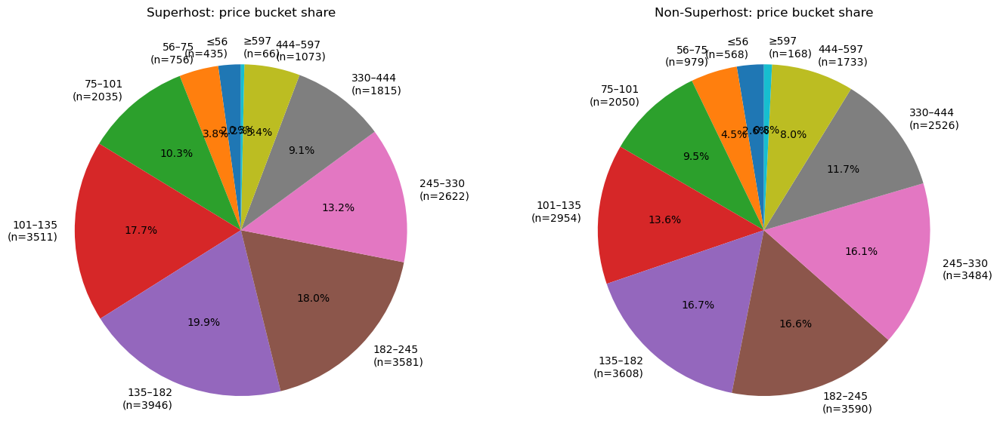

In [1106]:
d_iqr["price_bucket"] = pd.Categorical(d_iqr["price_bucket"], categories=labels, ordered=True)

pct = (d_iqr
       .groupby(["price_bucket", "is_super"], observed=True)[ID_COL]
       .count()
       .rename("cnt")
       .reset_index())

pct["group"] = pct["is_super"].map({1: "Superhost", 0: "Non-Superhost"})

# counts table
count_table = (pct
               .pivot(index="price_bucket", columns="group", values="cnt")
               .reindex(labels)
               .reindex(columns=["Superhost", "Non-Superhost"])
               .fillna(0)
               .astype(int))

# share table
col_sum = count_table.sum(axis=0)
share_table = count_table.div(col_sum.replace(0, np.nan), axis=1).fillna(0)

print("\nPrice Share By Bucket (within each group):")
display(share_table.style.format("{:.2%}"))

# pie chart 
def plot_pie_for_group(pivot_share, pivot_count, group_name, ax):
    if group_name not in pivot_share.columns:
        ax.text(0.5, 0.5, "No data", ha="center", va="center")
        ax.axis("off")
        return

    sizes = pivot_share[group_name].fillna(0).values
    if sizes.sum() == 0:
        ax.text(0.5, 0.5, "No data", ha="center", va="center")
        ax.axis("off")
        return

    pie_labels = [
        f"{idx}\n(n={int(pivot_count.loc[idx, group_name])})"
        for idx in pivot_share.index
    ]

    ax.pie(sizes, labels=pie_labels, autopct="%1.1f%%", startangle=90)
    ax.set_title(f"{group_name}: price bucket share")

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
plot_pie_for_group(share_table, count_table, "Superhost", axes[0])
plot_pie_for_group(share_table, count_table, "Non-Superhost", axes[1])
plt.tight_layout()
plt.show()

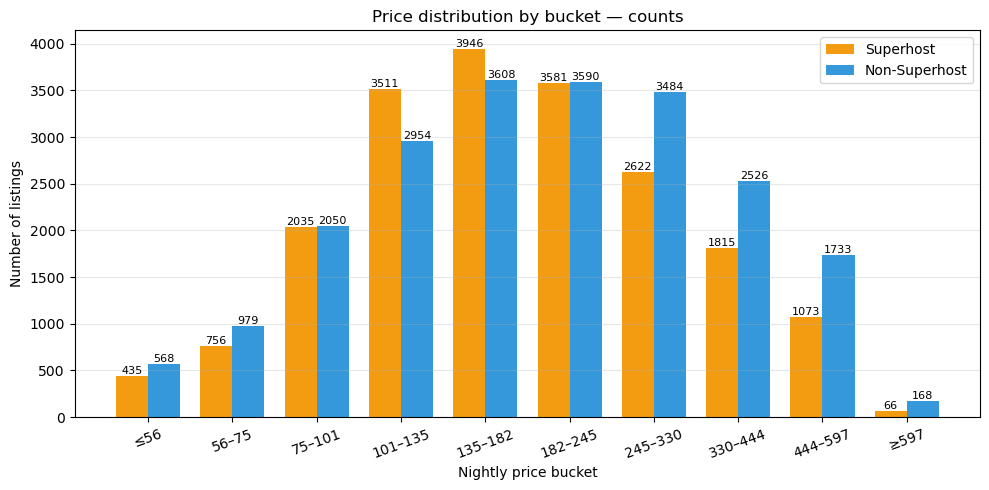

In [1107]:
#bar chart
count_pivot = (
    d_iqr
        .groupby(["price_bucket", "is_super"], observed=False)[ID_COL]
        .count()
        .rename("cnt")
        .reset_index()
)

#labels
count_pivot["group"] = count_pivot["is_super"].map({1: "Superhost",
                                                    0: "Non-Superhost"})

#Pivot
bar_counts = (
    count_pivot
      .pivot(index="price_bucket", columns="group", values="cnt")
      .reindex(labels)          # keep bucket order
      .fillna(0)
)

#Plot
x = np.arange(len(bar_counts.index))
width = 0.38

plt.figure(figsize=(10, 5))

b1 = plt.bar(
    x - width/2,
    bar_counts["Superhost"].values,
    width,
    label="Superhost",
    color="#f39c12"        
)
b2 = plt.bar(
    x + width/2,
    bar_counts["Non-Superhost"].values,
    width,
    label="Non-Superhost",
    color="#3498db"        
)

plt.title("Price distribution by bucket — counts")
plt.xlabel("Nightly price bucket")
plt.ylabel("Number of listings")
plt.xticks(x, bar_counts.index, rotation=20)
plt.legend()
plt.grid(axis="y", alpha=0.3)

#Add value labels on top of bars
for bars in [b1, b2]:
    for r in bars:
        h = r.get_height()
        if h > 0:
            plt.text(
                r.get_x() + r.get_width()/2,
                h,
                f"{int(h)}",
                ha="center",
                va="bottom",
                fontsize=8
            )

plt.tight_layout()
plt.show()

In [1108]:
report='''
After IQR filtering, we have:

Non-Superhosts:
count = 21,660 mean price ≈ NZD 225.43 median price ≈ NZD 195.0

Superhosts:
count = 19,840 mean price ≈ NZD 204.85 median price ≈ NZD 173.0

So Non-Superhosts charge about NZD 20.6 more per night on average, and about NZD 22 higher on median—roughly ~10.0% (mean) and ~12.7% (median) higher than Superhosts.
This suggests that Superhost status is not associated with charging higher prices; instead, Superhosts tend to price slightly lower.

Looking at the bucket shares within each group (Normal-based buckets on log(price)):

Superhosts (share by bucket):
≤56: 2.19%
56–75: 3.81%
75–101: 10.26%
101–135: 17.70%
135–182: 19.89% ← largest
182–245: 18.05%
245–330: 13.22%
330–444: 9.15%
444–597: 5.41%
≥597: 0.33%

Non-Superhosts:
≤56: 2.62%
56–75: 4.52%
75–101: 9.46%
101–135: 13.64%
135–182: 16.66% ← largest (very close to next buckets)
182–245: 16.57%
245–330: 16.08%
330–444: 11.66%
444–597: 8.00%
≥597: 0.78%

The pie charts and count bars show:
Superhosts are more concentrated in the mid-range (101–245), especially 135–182 and 182–245, where their within-group shares are clearly higher.
Non-Superhosts have heavier tails in the higher price buckets: 245–330, 330–444, 444–597, and ≥597 all take a larger share of their portfolio.

Within each price bucket, the share of Superhosts is:

≤56: 43.4% Superhost / 56.6% Non-Superhost
56–75: 43.6% Superhost / 56.4% Non-Superhost
75–101: 49.8% Superhost / 50.2% Non-Superhost
101–135: 54.3% Superhost / 45.7% Non-Superhost
135–182: 52.2% Superhost / 47.8% Non-Superhost
182–245: 49.9% Superhost / 50.1% Non-Superhost
245–330: 42.9% Superhost / 57.1% Non-Superhost
330–444: 41.8% Superhost / 58.2% Non-Superhost
444–597: 38.2% Superhost / 61.8% Non-Superhost
≥597: 28.2% Superhost / 71.8% Non-Superhost

Patterns:
In the lower-to-mid range (101–182), Superhosts are the majority: more than half of listings in these price bands are Superhosts.

From 245+, the Superhost share drops clearly below 50%, and in the very high segment (≥597), only about 28% of listings are Superhosts.

So, very high nightly prices are associated with a lower probability of being a Superhost,
while moderate pricing (especially 101–182) is the most Superhost-dense zone.

Superhosts do not win by over-pricing; they tend to charge slightly lower prices than Non-Superhosts.

The “sweet spot” for Superhosts in this dataset is roughly NZD 101–245 per night (with the strongest Superhost density at 101–182): these bands contain the largest concentration of Superhost listings, and within 101–182, Superhosts make up more than half of the market.
Very high prices (245+, especially ≥597) are dominated by Non-Superhosts and show lower Superhost shares.

For a new host aiming to become a Superhost,
a reasonable strategy is to position prices in the competitive mid-range instead of starting at the very top of the market,
and then rely on service quality to stand out.
'''
print(report)


After IQR filtering, we have:

Non-Superhosts:
count = 21,660 mean price ≈ NZD 225.43 median price ≈ NZD 195.0

Superhosts:
count = 19,840 mean price ≈ NZD 204.85 median price ≈ NZD 173.0

So Non-Superhosts charge about NZD 20.6 more per night on average, and about NZD 22 higher on median—roughly ~10.0% (mean) and ~12.7% (median) higher than Superhosts.
This suggests that Superhost status is not associated with charging higher prices; instead, Superhosts tend to price slightly lower.

Looking at the bucket shares within each group (Normal-based buckets on log(price)):

Superhosts (share by bucket):
≤56: 2.19%
56–75: 3.81%
75–101: 10.26%
101–135: 17.70%
135–182: 19.89% ← largest
182–245: 18.05%
245–330: 13.22%
330–444: 9.15%
444–597: 5.41%
≥597: 0.33%

Non-Superhosts:
≤56: 2.62%
56–75: 4.52%
75–101: 9.46%
101–135: 13.64%
135–182: 16.66% ← largest (very close to next buckets)
182–245: 16.57%
245–330: 16.08%
330–444: 11.66%
444–597: 8.00%
≥597: 0.78%

The pie charts and count bars show:


In [1109]:
print('Property type comparsion')

Property type comparsion


In [1110]:
def bool01(s):
    mapping = {
        "t": 1, "true": 1, "1": 1, "y": 1, "yes": 1,
        "f": 0, "false": 0, "0": 0, "n": 0, "no": 0,
    }
    return (
        s.astype(str)
         .str.strip()
         .str.lower()
         .map(mapping)
         .astype("float")          
    )


df = pd.read_csv("listings.csv", encoding="cp1252")
df["is_super"] = bool01(df["host_is_superhost"])

#price clean
df["price_clean"] = (
    df["price"]
      .astype(str)
      .str.replace(r"[^\d\.]", "", regex=True)  
)
df["price_clean"] = pd.to_numeric(df["price_clean"], errors="coerce")

PRICE = "price_clean"

# amenities
df["amenities_count"] = (
    df["amenities"]
      .fillna("[]")
      .astype(str)
      .str.strip()
      .apply(lambda x: 0 if x in ["", "[]"] else len(x.split(",")))
)

#Superhost property_type、room_type
base = df[
    df["is_super"].isin([0, 1]) &
    df[PRICE].notna() &
    df[PRICE].gt(0) &
    df["property_type"].notna() &
    df["room_type"].notna()
].copy()

#IQR
q1, q3 = base[PRICE].quantile([0.25, 0.75])
iqr = q3 - q1
lower = max(q1 - 1.5 * iqr, 0)
upper = q3 + 1.5 * iqr

d = base[base[PRICE].between(lower, upper)].copy()
if d.empty:
    raise ValueError("check data")

#
for col in ["accommodates", "beds", "bedrooms", "bathrooms"]:
    if col in d.columns:
        d[col] = pd.to_numeric(d[col], errors="coerce").fillna(0)

# id
ID_COL = "id"
d["group"] = d["is_super"].map({1: "Superhost", 0: "Non-Superhost"})


prop_summary = (
    d.groupby(["group", "property_type"])
     .agg(
         count        = (ID_COL, "size"),
         mean_price   = (PRICE, "mean"),
         median_price = (PRICE, "median"),
         acc_mean     = ("accommodates", "mean"),
         beds_mean    = ("beds", "mean"),
         bedrooms_mean= ("bedrooms", "mean"),
         baths_mean   = ("bathrooms", "mean"),
         amen_mean    = ("amenities_count", "mean"),
     )
     .reset_index()
)

# Superhost / Non-Superhost
prop_super = (
    prop_summary[prop_summary["group"] == "Superhost"]
      .sort_values("count", ascending=False)
)

prop_nonsuper = (
    prop_summary[prop_summary["group"] == "Non-Superhost"]
      .sort_values("count", ascending=False)
)

print("Property type comparison — Superhost:")
display(
    prop_super.style.format({
        "count": "{:,.0f}",
        "mean_price": "{:.2f}",
        "median_price": "{:.2f}",
        "acc_mean": "{:.2f}",
        "beds_mean": "{:.2f}",
        "bedrooms_mean": "{:.2f}",
        "baths_mean": "{:.2f}",
        "amen_mean": "{:.2f}",
    })
)

print("Property type comparison — Non-Superhost:")
display(
    prop_nonsuper.style.format({
        "count": "{:,.0f}",
        "mean_price": "{:.2f}",
        "median_price": "{:.2f}",
        "acc_mean": "{:.2f}",
        "beds_mean": "{:.2f}",
        "bedrooms_mean": "{:.2f}",
        "baths_mean": "{:.2f}",
        "amen_mean": "{:.2f}",
    })
)

Property type comparison — Superhost:


,group,property_type,count,mean_price,median_price,acc_mean,beds_mean,bedrooms_mean,baths_mean,amen_mean
110,Superhost,Entire home,"6,434",270.29,240.00,6.27,3.99,2.91,1.68,44.49
114,Superhost,Entire rental unit,"3,363",219.94,188.00,3.58,2.10,1.60,1.27,40.80
109,Superhost,Entire guesthouse,"1,951",145.41,130.00,2.76,1.60,1.09,1.02,38.48
108,Superhost,Entire guest suite,"1,540",142.60,129.00,2.78,1.64,1.14,1.04,40.82
142,Superhost,Private room in home,"1,462",91.39,80.00,2.26,1.34,1.17,1.11,35.04
107,Superhost,Entire cottage,718,204.91,180.50,4.23,2.77,1.89,1.13,44.16
116,Superhost,Entire townhouse,475,236.24,200.00,5.17,3.05,2.42,1.70,45.20
104,Superhost,Entire cabin,448,165.88,144.00,2.88,1.74,1.18,1.01,33.02
180,Superhost,Tiny home,350,153.37,143.00,2.60,1.54,1.10,1.03,38.19
119,Superhost,Farm stay,299,169.87,146.00,3.97,2.53,1.55,1.13,41.41


Property type comparison — Non-Superhost:


,group,property_type,count,mean_price,median_price,acc_mean,beds_mean,bedrooms_mean,baths_mean,amen_mean
17,Non-Superhost,Entire home,"8,609",300.75,281.00,6.31,3.97,2.98,1.65,34.46
50,Non-Superhost,Private room in home,"2,487",105.32,85.00,2.16,1.34,1.20,1.14,24.97
20,Non-Superhost,Entire rental unit,"2,346",200.16,175.00,3.59,2.08,1.59,1.22,33.48
16,Non-Superhost,Entire guesthouse,"1,185",160.34,140.00,3.01,1.83,1.22,1.04,32.19
15,Non-Superhost,Entire guest suite,821,151.67,135.00,2.98,1.79,1.19,1.04,35.75
34,Non-Superhost,Private room in bed and breakfast,573,168.15,145.00,2.29,1.45,1.18,1.25,26.28
14,Non-Superhost,Entire cottage,439,227.80,200.00,4.83,3.30,2.17,1.20,39.04
74,Non-Superhost,Room in hotel,372,188.27,163.00,3.05,2.05,1.50,1.19,22.07
11,Non-Superhost,Entire cabin,359,164.83,135.00,3.47,2.26,1.24,1.02,23.18
10,Non-Superhost,Entire bungalow,325,308.84,299.00,6.25,4.03,2.86,1.54,27.48


In [1111]:
def plot_pie_for_group(share_table, group_name, bucket_label, ax):
    if group_name not in share_table.columns:
        ax.text(0.5, 0.5, "No data", ha="center", va="center")
        ax.axis("off")
        return

    sizes = share_table[group_name].fillna(0).values
    labels = share_table.index.astype(str).tolist()

    if sizes.sum() == 0:
        ax.text(0.5, 0.5, "No data", ha="center", va="center")
        ax.axis("off")
        return

    wedges, texts, autotexts = ax.pie(
        sizes,
        autopct="%1.1f%%",
        startangle=90,
    )

    ax.set_title(f"{group_name}: {bucket_label} share")
    ax.legend(
        wedges,
        labels,
        title=bucket_label,
        loc="center left",
        bbox_to_anchor=(1.02, 0.5),
        fontsize=9
    )


def compare_by_config(df, bucket_col, bucket_label):
    tmp = (
        df.groupby(["group", bucket_col], observed=False)
          .agg(
              count        = (ID_COL, "size"),
              mean_price   = (PRICE, "mean"),
              median_price = (PRICE, "median"),
              acc_mean     = ("accommodates", "mean"),
              beds_mean    = ("beds", "mean"),
              bedrooms_mean= ("bedrooms", "mean"),
              baths_mean   = ("bathrooms", "mean"),
              amen_mean    = ("amenities_count", "mean"),
          )
          .reset_index()
    )

    tmp = tmp.rename(columns={bucket_col: bucket_label})

    
    tmp = tmp.sort_values(["group", "count"], ascending=[True, False])

    print(f"\n=== Comparison by {bucket_label} (Superhost vs Non-Superhost) — detail table ===")
    display(
        tmp.style.format({
            "count": "{:,.0f}",
            "mean_price": "{:.2f}",
            "median_price": "{:.2f}",
            "acc_mean": "{:.2f}",
            "beds_mean": "{:.2f}",
            "bedrooms_mean": "{:.2f}",
            "baths_mean": "{:.2f}",
            "amen_mean": "{:.2f}",
        })
    )

    #share table
    pivot_counts = (
        tmp.pivot(index=bucket_label, columns="group", values="count")
           .fillna(0)
    )
    share = pivot_counts.div(pivot_counts.sum(axis=0), axis=1)

    # soft by share
    if "Superhost" in share.columns:
        order = share["Superhost"].sort_values(ascending=False).index
    else:
        order = share["Non-Superhost"].sort_values(ascending=False).index

    share = share.loc[order]
    pivot_counts = pivot_counts.loc[order]

    print(f"\n=== Share table by {bucket_label} (within each group) ===")
    display(
        share.style.format("{:.2%}")
             .set_caption(f"Share of listings in each {bucket_label} bucket (Superhost vs Non-Superhost)")
    )

    buckets = share.index.astype(str)
    super_count    = pivot_counts["Superhost"]      if "Superhost" in pivot_counts.columns      else np.zeros(len(buckets))
    nonsuper_count = pivot_counts["Non-Superhost"] if "Non-Superhost" in pivot_counts.columns else np.zeros(len(buckets))

    # pie chart
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    plot_pie_for_group(share, "Superhost",     bucket_label, axes[0])
    plot_pie_for_group(share, "Non-Superhost", bucket_label, axes[1])
    plt.tight_layout()
    plt.show()

    #bar chart
    x = np.arange(len(buckets))
    width = 0.35

    plt.figure(figsize=(8, 5))
    plt.bar(x - width/2, super_count,  width, label="Superhost")
    plt.bar(x + width/2, nonsuper_count, width, label="Non-Superhost")

    plt.xticks(x, buckets, rotation=45)
    plt.ylabel("Number of listings")
    plt.title(f"Counts by {bucket_label} and group")
    plt.legend()

    for i, v in enumerate(super_count):
        plt.text(x[i] - width/2, v, f"{int(v)}", ha="center", va="bottom", fontsize=9)
    for i, v in enumerate(nonsuper_count):
        plt.text(x[i] + width/2, v, f"{int(v)}", ha="center", va="bottom", fontsize=9)

    plt.tight_layout()
    plt.show()

In [1112]:
print('Comparison by Room_type')

Comparison by Room_type



=== Comparison by Room_type (Superhost vs Non-Superhost) — detail table ===


,group,Room_type,count,mean_price,median_price,acc_mean,beds_mean,bedrooms_mean,baths_mean,amen_mean
0,Non-Superhost,Entire home/apt,"15,822",254.11,225.00,5.17,3.23,2.37,1.45,34.05
2,Non-Superhost,Private room,"4,728",129.97,104.00,2.32,1.48,1.21,1.16,25.30
1,Non-Superhost,Hotel room,102,227.12,221.00,2.71,1.87,1.17,1.27,26.69
3,Non-Superhost,Shared room,33,74.15,58.00,2.94,2.88,1.09,1.33,20.64
4,Superhost,Entire home/apt,"16,840",220.40,187.00,4.54,2.81,2.03,1.37,42.02
6,Superhost,Private room,"2,865",114.47,90.00,2.43,1.47,1.15,1.13,33.87
7,Superhost,Shared room,67,52.03,39.00,2.00,4.91,0.97,2.87,36.37
5,Superhost,Hotel room,59,270.08,259.00,3.07,1.81,1.03,1.11,31.20



=== Share table by Room_type (within each group) ===


group,Non-Superhost,Superhost
Room_type,,
Entire home/apt,76.49%,84.92%
Private room,22.86%,14.45%
Shared room,0.16%,0.34%
Hotel room,0.49%,0.30%


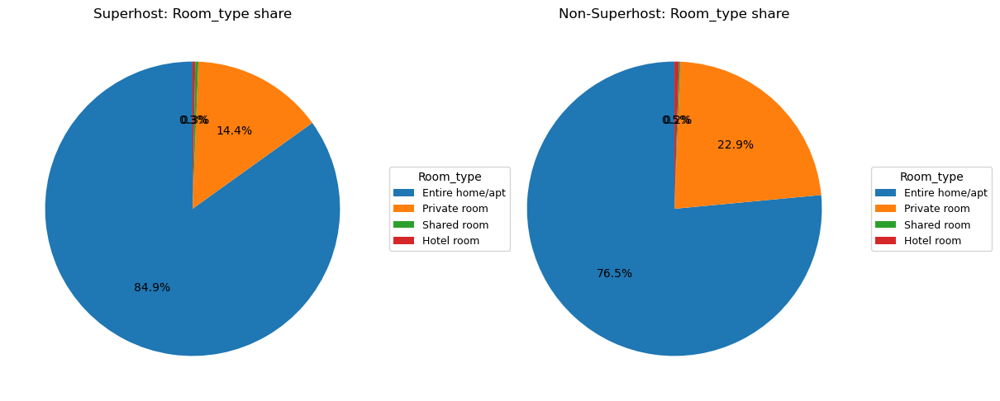

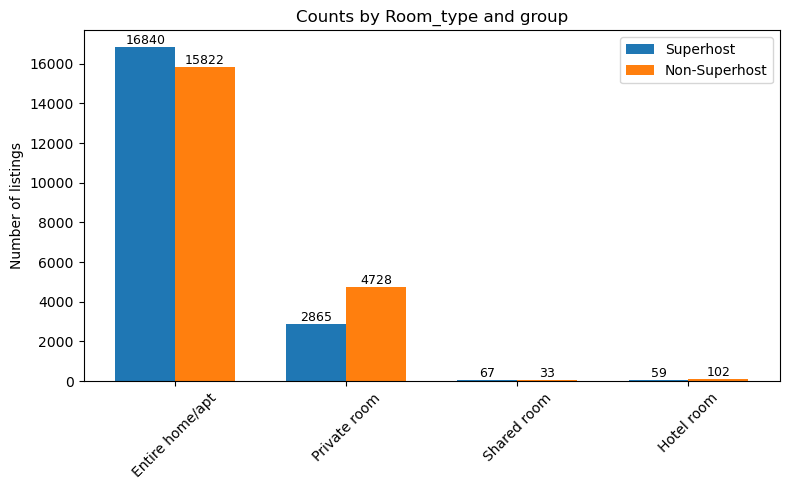

In [1113]:
# room type
compare_by_config(d, "room_type", "Room_type")

In [1114]:
report='''
This section compares room type composition and pricing differences between Superhosts and Non-Superhosts. 
Overall, Superhosts are more concentrated in Entire home/apt, while Non-Superhosts have a relatively higher share of Private room listings. 
Specifically, Entire home/apt accounts for 84.92% of Superhost listings, compared with 76.49% among Non-Superhosts. 

In contrast, Private room contributes 14.45% for Superhosts but rises to 22.86% for Non-Superhosts. 
Hotel rooms and shared rooms remain marginal in both groups (each well below 1%), so they are not key drivers of the overall structure.

In terms of pricing (IQR-filtered), the main categories show a consistent pattern:
Superhosts tend to have lower median nightly prices than Non-Superhosts. 
For Entire home/apt, the median price is 187 for Superhosts versus 225 for Non-Superhosts. 
For Private room, the median is 90 (Superhost) versus 104 (Non-Superhost). 
This suggests that Superhosts may adopt a more value-competitive pricing strategy in mainstream room types to sustain bookings and review performance. 

Meanwhile, Superhosts also show stronger quality signals through listing features:
for example, the average amenities count is higher among Superhosts ( 42.02 vs 34.05 for Entire home/apt; 33.87 vs 25.30 for Private room), 
indicating better-equipped listings that can support guest satisfaction.

Finally, minor categories (Hotel room / Shared room) should be interpreted carefully due to small sample sizes,
so conclusions should rely primarily on median prices and high-volume room types.
'''
print(report)


This section compares room type composition and pricing differences between Superhosts and Non-Superhosts. 
Overall, Superhosts are more concentrated in Entire home/apt, while Non-Superhosts have a relatively higher share of Private room listings. 
Specifically, Entire home/apt accounts for 84.92% of Superhost listings, compared with 76.49% among Non-Superhosts. 

In contrast, Private room contributes 14.45% for Superhosts but rises to 22.86% for Non-Superhosts. 
Hotel rooms and shared rooms remain marginal in both groups (each well below 1%), so they are not key drivers of the overall structure.

In terms of pricing (IQR-filtered), the main categories show a consistent pattern:
Superhosts tend to have lower median nightly prices than Non-Superhosts. 
For Entire home/apt, the median price is 187 for Superhosts versus 225 for Non-Superhosts. 
For Private room, the median is 90 (Superhost) versus 104 (Non-Superhost). 
This suggests that Superhosts may adopt a more value-competitive pric

In [1115]:
print('Comparison by Capacity')

Comparison by Capacity



=== Comparison by Capacity (Superhost vs Non-Superhost) — detail table ===


,group,Capacity,count,mean_price,median_price,acc_mean,beds_mean,bedrooms_mean,baths_mean,amen_mean
0,Non-Superhost,1–2,"7,232",137.11,117.00,1.92,1.15,1.02,1.08,27.76
1,Non-Superhost,3–4,"4,891",202.46,180.00,3.79,2.32,1.72,1.19,32.40
2,Non-Superhost,5–6,"4,647",286.32,268.00,5.72,3.60,2.76,1.54,34.74
3,Non-Superhost,7+,"3,915",344.40,333.00,8.73,5.60,3.77,1.98,36.05
4,Superhost,1–2,"7,496",138.85,120.00,1.96,1.10,0.93,1.04,36.14
5,Superhost,3–4,"5,443",196.36,171.00,3.80,2.32,1.68,1.20,41.81
6,Superhost,5–6,"4,065",262.47,234.00,5.73,3.61,2.69,1.56,44.32
7,Superhost,7+,"2,827",312.10,291.00,8.85,5.80,3.77,2.06,46.05



=== Share table by Capacity (within each group) ===


group,Non-Superhost,Superhost
Capacity,,
1–2,34.96%,37.80%
3–4,23.65%,27.45%
5–6,22.47%,20.50%
7+,18.93%,14.26%


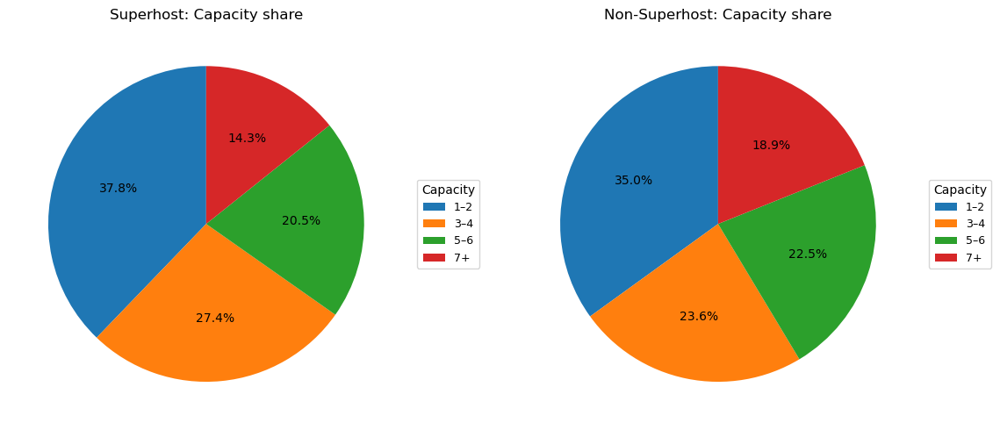

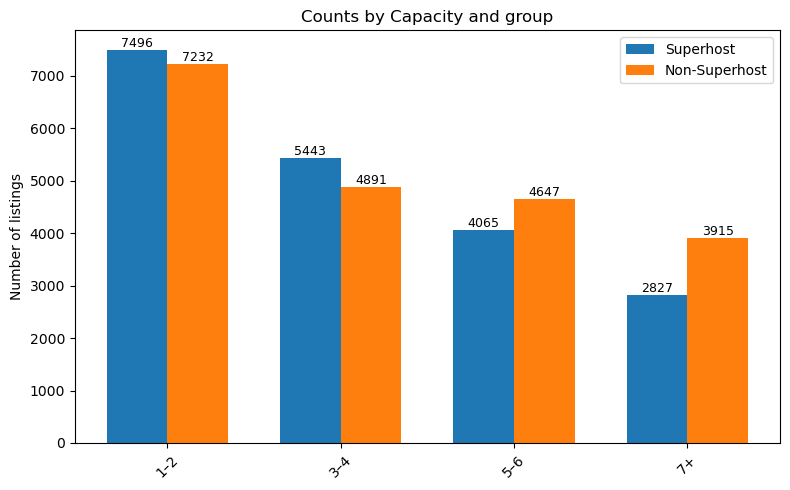

In [1116]:
# 2)Capacity
bins_acc   = [0, 2, 4, 6, np.inf]
labels_acc = ["1–2", "3–4", "5–6", "7+"]
d["acc_bucket"] = pd.cut(d["accommodates"], bins=bins_acc, labels=labels_acc, right=True)
compare_by_config(d, "acc_bucket", "Capacity")

In [1117]:
report='''
This section compares capacity composition (accommodates buckets) and pricing differences between Superhosts and Non-Superhosts.
Overall, Superhosts are more concentrated in smaller to mid-sized capacities, 
while Non-Superhosts have a relatively higher share of larger-capacity listings.

Specifically, 1–2 guest listings account for 37.8% of Superhost supply, and 3–4 guest listings contribute a further 27.4%, 
indicating that Superhosts are skewed toward easier-to-operate capacity segments.

In contrast, Non-Superhosts are more represented in higher-capacity buckets, with relatively larger shares in 5–6 (22.5%) and 7+ (18.9%).
The count bar chart reinforces this pattern: Superhosts exceed Non-Superhosts in 1–2 and 3–4, but fall behind in 5–6 and especially 7+.

This suggests that achieving/maintaining Superhost status may be operationally more feasible in smaller listings,
whereas larger homes tend to involve higher complexity and more performance variability.

In terms of pricing (median within the same capacity bucket), Superhosts are not consistently more expensive.

For 1–2 guests, Superhosts are slightly higher (median 120 vs 117), but for larger capacities Superhosts are lower:3–4 (171 vs 180), 5–6 (234 vs 268), 
and 7+ (291 vs 333).

This implies that in bigger homes, 
Superhosts may adopt a more value-competitive pricing strategy to stabilize occupancy and review outcomes rather than charging a premium.

Meanwhile, Superhosts also show stronger quality signals through listing features.
Across every capacity bucket, Superhosts have higher average amenities counts ( 36.14 vs 27.76 in 1–2), and the gap persists up to 7+.
This indicates that the Superhost advantage is more aligned with “better equipped / better guest experience” than simply offering larger space.

Finally, results for the largest bucket (7+) should be interpreted with some caution 
because capacity segments may have different supply sizes and property mix.

Therefore, conclusions should rely primarily on consistent cross-bucket patterns: 
(1) Superhosts skew smaller/mid capacity, (2) Superhosts tend to price more competitively in larger homes, 
and (3) Superhosts systematically provide higher amenities coverage.
'''
print(report)


This section compares capacity composition (accommodates buckets) and pricing differences between Superhosts and Non-Superhosts.
Overall, Superhosts are more concentrated in smaller to mid-sized capacities, 
while Non-Superhosts have a relatively higher share of larger-capacity listings.

Specifically, 1–2 guest listings account for 37.8% of Superhost supply, and 3–4 guest listings contribute a further 27.4%, 
indicating that Superhosts are skewed toward easier-to-operate capacity segments.

In contrast, Non-Superhosts are more represented in higher-capacity buckets, with relatively larger shares in 5–6 (22.5%) and 7+ (18.9%).
The count bar chart reinforces this pattern: Superhosts exceed Non-Superhosts in 1–2 and 3–4, but fall behind in 5–6 and especially 7+.

This suggests that achieving/maintaining Superhost status may be operationally more feasible in smaller listings,
whereas larger homes tend to involve higher complexity and more performance variability.

In terms of pricing (me

In [1118]:
print('Comparison by Amenity_level')

Comparison by Amenity_level



=== Comparison by Amenity_level (Superhost vs Non-Superhost) — detail table ===


,group,Amenity_level,count,mean_price,median_price,acc_mean,beds_mean,bedrooms_mean,baths_mean,amen_mean
3,Non-Superhost,36+,"8,676",236.76,204.00,4.95,3.11,2.29,1.47,47.67
2,Non-Superhost,21–35,"6,302",225.99,196.00,4.41,2.75,2.03,1.35,28.07
1,Non-Superhost,11–20,"3,626",227.23,198.00,4.30,2.68,2.02,1.35,15.37
0,Non-Superhost,≤10,"2,081",172.23,138.00,3.30,2.04,1.59,1.20,7.47
7,Superhost,36+,"13,035",216.14,185.00,4.52,2.82,2.05,1.40,49.01
6,Superhost,21–35,"4,964",182.92,153.00,3.70,2.27,1.63,1.23,29.11
5,Superhost,11–20,"1,375",183.45,150.00,3.47,2.14,1.55,1.24,16.03
4,Superhost,≤10,457,177.78,150.00,3.41,2.04,1.45,1.13,7.58



=== Share table by Amenity_level (within each group) ===


group,Non-Superhost,Superhost
Amenity_level,,
36+,41.94%,65.73%
21–35,30.47%,25.03%
11–20,17.53%,6.93%
≤10,10.06%,2.30%


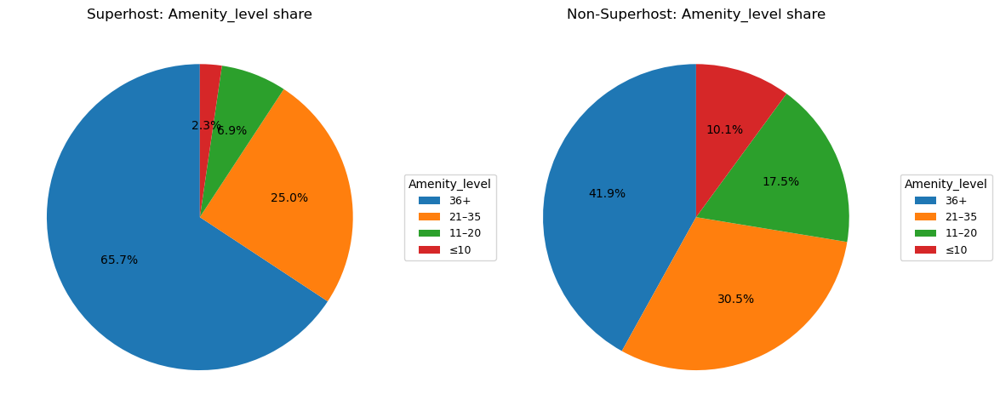

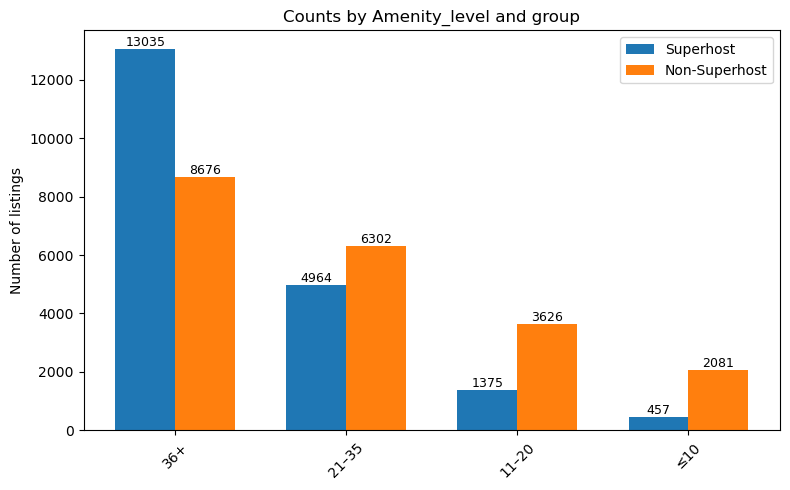

In [1119]:
# Amenity_level
bins_amen   = [-0.1, 10, 20, 35, np.inf]
labels_amen = ["≤10", "11–20", "21–35", "36+"]
d["amen_bucket"] = pd.cut(d["amenities_count"], bins=bins_amen, labels=labels_amen, right=True)
compare_by_config(d, "amen_bucket", "Amenity_level")

In [1120]:
report='''
This section compares amenity level composition and pricing differences between Superhosts and Non-Superhosts.

Overall, Superhosts are heavily concentrated in high-amenity listings (36+),
while Non-Superhosts have a relatively higher share in mid/low amenity buckets. 

Specifically, 36+ amenities account for 65.73% of Superhost listings, compared with 41.94% among Non-Superhosts. 
In contrast, the lower buckets are much more Non-Superhost-heavy: 11–20 contributes 6.93% for Superhosts vs 17.53% for Non-Superhosts, 
and ≤10 is only 2.30% for Superhosts but rises to 10.06% for Non-Superhosts. 

The count bar chart confirms the same structure: Superhosts dominate the 36+ bucket (13,035 vs 8,676), 
while Non-Superhosts are the majority in 21–35, 11–20, and ≤10.

In terms of pricing (median within the same amenity bucket), 
Superhosts tend to have lower median nightly prices in the mainstream (higher-volume) buckets. 
For 36+, the median price is 185 (Superhost) vs 204 (Non-Superhost). 
For 21–35, the median is 153 vs 196; for 11–20, 150 vs 198. 

This suggests that even when amenities are controlled, 
Superhosts may adopt a more value-competitive pricing strategy—likely to sustain bookings and review performance.

Meanwhile, this show an important nuance: within the same amenity bucket, 
Non-Superhosts often have slightly larger listings ( in 36+ the average accommodates/beds/bedrooms are higher for Non-Superhosts: 
acc_mean 4.95 vs 4.52;beds 3.11 vs 2.82; bedrooms 2.29 vs 2.05). 

This implies the Superhost advantage here is less about “bigger homes” and more about higher-quality provisioning and standardized guest experience.

Finally, the ≤10 bucket should be interpreted carefully because the Superhost sample size is small (457) 
and shows an atypical pattern (Superhost median 150 vs Non-Superhost 138). 

Therefore, the most reliable conclusions should rely on the high-volume buckets—especially 36+ and 21–35.
'''
print(report)


This section compares amenity level composition and pricing differences between Superhosts and Non-Superhosts.

Overall, Superhosts are heavily concentrated in high-amenity listings (36+),
while Non-Superhosts have a relatively higher share in mid/low amenity buckets. 

Specifically, 36+ amenities account for 65.73% of Superhost listings, compared with 41.94% among Non-Superhosts. 
In contrast, the lower buckets are much more Non-Superhost-heavy: 11–20 contributes 6.93% for Superhosts vs 17.53% for Non-Superhosts, 
and ≤10 is only 2.30% for Superhosts but rises to 10.06% for Non-Superhosts. 

The count bar chart confirms the same structure: Superhosts dominate the 36+ bucket (13,035 vs 8,676), 
while Non-Superhosts are the majority in 21–35, 11–20, and ≤10.

In terms of pricing (median within the same amenity bucket), 
Superhosts tend to have lower median nightly prices in the mainstream (higher-volume) buckets. 
For 36+, the median price is 185 (Superhost) vs 204 (Non-Superhost). 
Fo

In [1121]:
print('Comparsion by location')

Comparsion by location


In [1122]:
def compare_by_location(df, loc_col, loc_label, top_n=20):
    #top-n
    total_counts = (
        df.groupby(loc_col)[ID_COL]
          .size()
          .sort_values(ascending=False)
    )
    top_locations = total_counts.head(top_n).index

    #keep top-n loc
    df_top = df[df[loc_col].isin(top_locations)].copy()

    #detail table
    tmp = (
        df_top.groupby(["group", loc_col], observed=False)
              .agg(
                  count        = (ID_COL, "size"),
                  mean_price   = (PRICE, "mean"),
                  median_price = (PRICE, "median"),
                  acc_mean     = ("accommodates", "mean"),
                  beds_mean    = ("beds", "mean"),
                  bedrooms_mean= ("bedrooms", "mean"),
                  baths_mean   = ("bathrooms", "mean"),
                  amen_mean    = ("amenities_count", "mean"),
              )
              .reset_index()
    )

    tmp = tmp.rename(columns={loc_col: loc_label})
    tmp = tmp.sort_values(["group", "count"], ascending=[True, False])

    print(f"\n=== Location comparison by {loc_label} — detail table (top {top_n}) ===")
    display(
        tmp.style.format({
            "count": "{:,.0f}",
            "mean_price": "{:.2f}",
            "median_price": "{:.2f}",
            "acc_mean": "{:.2f}",
            "beds_mean": "{:.2f}",
            "bedrooms_mean": "{:.2f}",
            "baths_mean": "{:.2f}",
            "amen_mean": "{:.2f}",
        })
    )

    # 2) share table
    pivot_counts = (
        tmp.pivot(index=loc_label, columns="group", values="count")
           .fillna(0)
    )
    share = pivot_counts.div(pivot_counts.sum(axis=0), axis=1)

    if "Superhost" in share.columns:
        order = share["Superhost"].sort_values(ascending=False).index
    else:
        order = share["Non-Superhost"].sort_values(ascending=False).index

    share = share.loc[order]
    pivot_counts = pivot_counts.loc[order]

    print(f"\n=== Share table by {loc_label} (top {top_n}) ===")
    display(
        share.style.format("{:.2%}")
             .set_caption(f"Share of listings in each {loc_label} (Superhost vs Non-Superhost, top {top_n})")
    )

    buckets = share.index.astype(str)
    super_count    = pivot_counts["Superhost"]      if "Superhost" in pivot_counts.columns      else np.zeros(len(buckets))
    nonsuper_count = pivot_counts["Non-Superhost"] if "Non-Superhost" in pivot_counts.columns else np.zeros(len(buckets))

    #pie
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    plot_pie_for_group(share, "Superhost",     loc_label, axes[0])
    plot_pie_for_group(share, "Non-Superhost", loc_label, axes[1])
    plt.tight_layout()
    plt.show()

    #bar
    x = np.arange(len(buckets))
    width = 0.35

    plt.figure(figsize=(8, 5))
    plt.bar(x - width/2, super_count,  width, label="Superhost")
    plt.bar(x + width/2, nonsuper_count, width, label="Non-Superhost")

    plt.xticks(x, buckets, rotation=45)
    plt.ylabel("Number of listings")
    plt.title(f"Counts by {loc_label} and group (top {top_n})")
    plt.legend()

    for i, v in enumerate(super_count):
        plt.text(x[i] - width/2, v, f"{int(v)}", ha="center", va="bottom", fontsize=9)
    for i, v in enumerate(nonsuper_count):
        plt.text(x[i] + width/2, v, f"{int(v)}", ha="center", va="bottom", fontsize=9)

    plt.tight_layout()
    plt.show()


=== Location comparison by Region_parent:BIGGEST AREA — detail table (top 10) ===


,group,Region_parent:BIGGEST AREA,count,mean_price,median_price,acc_mean,beds_mean,bedrooms_mean,baths_mean,amen_mean
0,Non-Superhost,Auckland,"4,755",184.78,148.00,3.65,2.16,1.79,1.37,31.47
3,Non-Superhost,Queenstown-Lakes District,"1,413",314.49,304.00,4.54,2.84,2.16,1.51,35.47
1,Non-Superhost,Christchurch City,"1,119",176.49,150.00,3.99,2.34,1.86,1.34,32.51
7,Non-Superhost,Tauranga City,989,284.13,264.00,5.05,3.15,2.48,1.46,32.16
8,Non-Superhost,Thames-Coromandel District,973,305.74,288.00,6.13,3.99,2.70,1.51,31.23
6,Non-Superhost,Taupo District,744,262.69,251.50,5.81,3.75,2.65,1.52,32.44
2,Non-Superhost,Far North District,715,258.39,226.00,4.81,2.96,2.10,1.36,32.88
9,Non-Superhost,Wellington City,600,181.16,154.00,3.69,2.12,1.80,1.28,32.97
5,Non-Superhost,Tasman District,492,244.36,221.00,4.65,3.03,2.05,1.33,32.83
4,Non-Superhost,Rotorua District,411,202.75,170.00,5.12,3.21,2.17,1.34,32.11



=== Share table by Region_parent:BIGGEST AREA (top 10) ===


group,Non-Superhost,Superhost
Region_parent:BIGGEST AREA,,
Auckland,38.94%,25.51%
Queenstown-Lakes District,11.57%,21.90%
Christchurch City,9.16%,12.59%
Taupo District,6.09%,7.34%
Tauranga City,8.10%,6.09%
Thames-Coromandel District,7.97%,5.92%
Far North District,5.86%,5.76%
Wellington City,4.91%,5.42%
Rotorua District,3.37%,5.12%


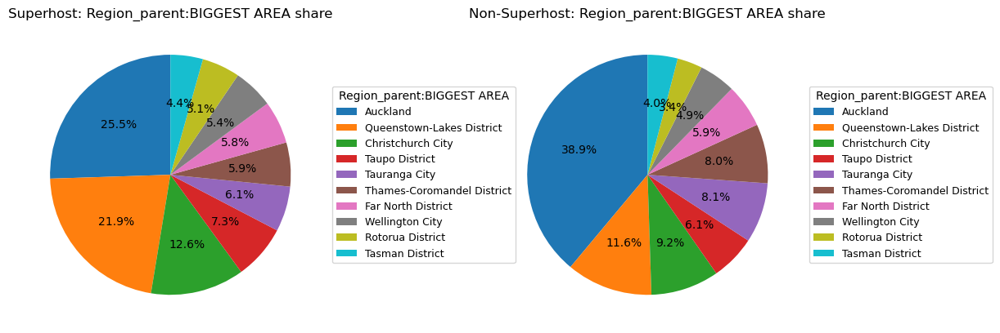

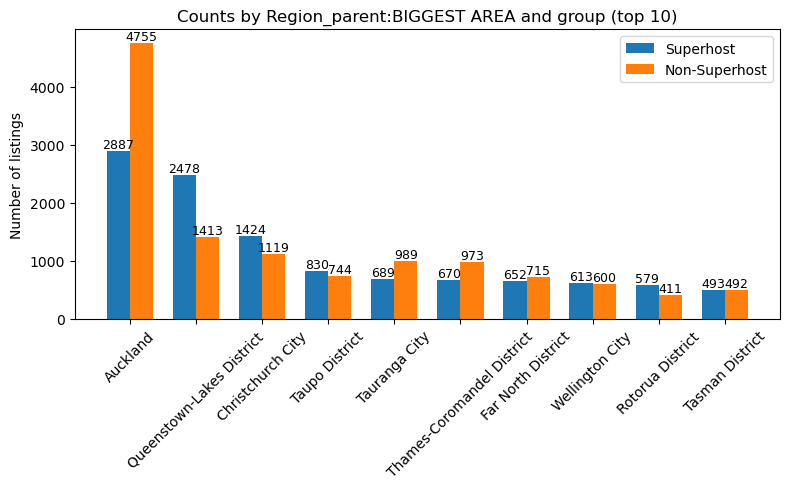

In [1123]:
# THE biggest area
compare_by_location(d, "region_parent_name", "Region_parent:BIGGEST AREA", top_n=10)

In [1124]:
report='''
1. Region_parent:

Auckland: Non-Superhosts account for 38.9% of all non-Superhost listings, while Superhosts only account for 25.5%.

In the bar chart, the orange bars (Non-Superhosts) in Auckland are significantly taller than the blue bars (Superhosts).

This indicates that Auckland has the most listings, but the concentration of non-Superhosts is higher.

Queenstown-Lakes District:
Non-Superhosts 11.6%, Superhosts 21.9%.

That is, only about 1/9 of the listings are non-Superhosts here, but more than 1/5 are Superhost listings. 
This is a destination area where Superhosts are clearly concentrated.

Christchurch City, Taupo District, Wellington City, Rotorua District:
Superhost share > Non-Superhost share ( Christchurch 9.2% vs 12.6%, Rotorua 3.4% vs 5.1%). 
These cities have a relatively stronger presence of superhosts.

Tauranga City and Thames-Coromandel District: Non-superhost share is higher than superhost share (8.1% vs 6.1%, 8.0% vs 5.9%).

These resort areas have more regular hosts and relatively fewer superhosts.

In summary: At the regional level, Auckland dominates total supply but is relatively non-superhost-heavy, 
while Queenstown-Lakes, Christchurch, Taupo, and Rotorua are more superhost-intensive tourism regions.
'''
print(report)


1. Region_parent:

Auckland: Non-Superhosts account for 38.9% of all non-Superhost listings, while Superhosts only account for 25.5%.

In the bar chart, the orange bars (Non-Superhosts) in Auckland are significantly taller than the blue bars (Superhosts).

This indicates that Auckland has the most listings, but the concentration of non-Superhosts is higher.

Queenstown-Lakes District:
Non-Superhosts 11.6%, Superhosts 21.9%.

That is, only about 1/9 of the listings are non-Superhosts here, but more than 1/5 are Superhost listings. 
This is a destination area where Superhosts are clearly concentrated.

Christchurch City, Taupo District, Wellington City, Rotorua District:
Superhost share > Non-Superhost share ( Christchurch 9.2% vs 12.6%, Rotorua 3.4% vs 5.1%). 
These cities have a relatively stronger presence of superhosts.

Tauranga City and Thames-Coromandel District: Non-superhost share is higher than superhost share (8.1% vs 6.1%, 8.0% vs 5.9%).

These resort areas have more regular


=== Location comparison by Region — detail table (top 10) ===


,group,Region,count,mean_price,median_price,acc_mean,beds_mean,bedrooms_mean,baths_mean,amen_mean
1,Non-Superhost,Area Outside Ward,"1,624",198.75,166.00,4.36,2.75,2.01,1.30,31.70
8,Non-Superhost,Waitemat?? and Gulf Ward,"1,189",201.01,164.00,3.54,2.02,1.61,1.28,34.65
6,Non-Superhost,Queenstown-Wakatipu Ward,765,317.92,302.00,4.15,2.51,1.95,1.49,35.97
5,Non-Superhost,Mount Maunganui-Papamoa Ward,665,310.54,299.00,5.40,3.36,2.64,1.51,32.87
9,Non-Superhost,Wanaka Ward,584,304.16,298.50,4.99,3.19,2.37,1.54,35.19
0,Non-Superhost,Albany Ward,536,188.07,153.00,3.81,2.24,1.90,1.39,33.83
7,Non-Superhost,Taup?? Ward,507,273.55,260.00,5.53,3.50,2.61,1.55,33.20
4,Non-Superhost,Mercury Bay Ward,442,312.73,300.00,6.13,3.98,2.70,1.53,32.08
2,Non-Superhost,Bay of Islands-Whangaroa Ward,426,275.61,246.00,4.67,2.92,2.01,1.35,33.62
3,Non-Superhost,Central Ward,280,168.14,149.50,3.81,2.20,1.74,1.38,34.88



=== Share table by Region (top 10) ===


group,Non-Superhost,Superhost
Region,,
Area Outside Ward,23.14%,25.56%
Queenstown-Wakatipu Ward,10.90%,19.68%
Waitemat?? and Gulf Ward,16.94%,10.65%
Wanaka Ward,8.32%,9.52%
Central Ward,3.99%,8.02%
Taup?? Ward,7.22%,7.71%
Mount Maunganui-Papamoa Ward,9.48%,6.02%
Bay of Islands-Whangaroa Ward,6.07%,4.99%
Mercury Bay Ward,6.30%,4.38%


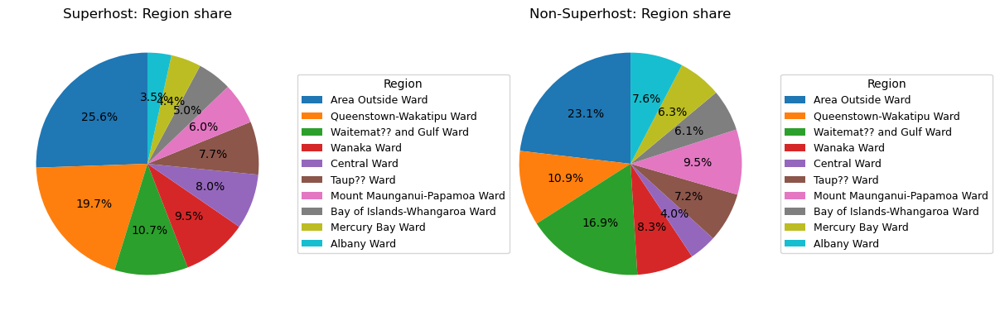

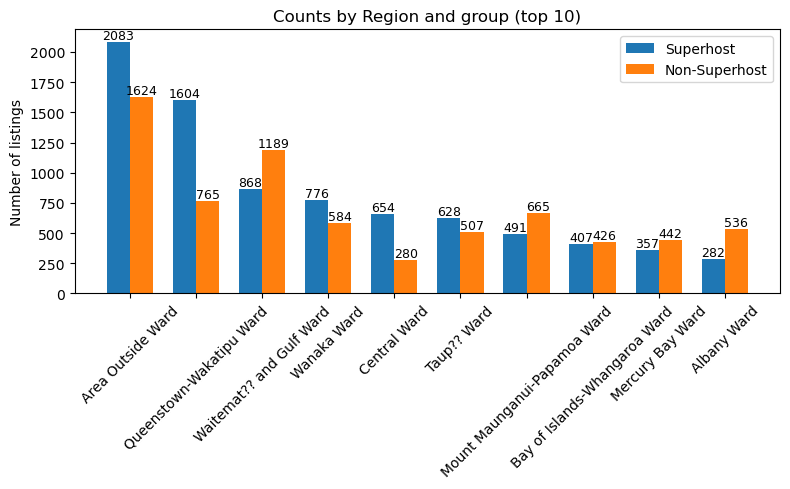

In [1125]:
# city
compare_by_location(d, "region_name", "Region", top_n=10)

In [1126]:
report='''
2. Region (ward): The Ward map further breaks down the regions, showing specific cities:

Area Outside Ward:
The proportion of Superhosts is slightly higher (25.6% vs 23.1%), and the blue bars (Superhost count) are slightly higher than the orange bars, 
indicating a higher proportion of Superhosts in the outer suburbs/rural areas.


Queenstown-Wakatipu Ward:
Non-Superhosts 10.9%, Superhosts 19.7%.
The blue bars (approximately 1600 listings) are significantly higher than the orange bars (approximately 760 listings).
Therefore, the core area of ​​Queenstown is almost a typical "Superhost territory."

Central Ward, Wanaka Ward, Taupō Ward:
The Superhost share is slightly higher than the Non-Superhost share, and the number of Superhosts is not low.
Therefore, the core business/tourist ward is also more Superhost-friendly.


Waitematā and Gulf Ward, Mount Maunganui-Papamoa, Mercury Bay, Albany Ward: 
Non-Superhosts have a higher share than Superhosts; in the bar chart, the orange bars are generally taller than the blue bars.
Therefore, in these beach/suburban holiday wards, non-Superhosts have a greater advantage, and Superhost penetration is relatively low.

In summary: At the ward level, Superhosts are clustered in core tourism wards such as Queenstown-Wakatipu, Central, Wanaka, and Taupō, 
whereas coastal holiday wards like Waitematā & Gulf or Mount Maunganui-Papamoa are relatively dominated by non-Superhosts.
'''
print(report)


2. Region (ward): The Ward map further breaks down the regions, showing specific cities:

Area Outside Ward:
The proportion of Superhosts is slightly higher (25.6% vs 23.1%), and the blue bars (Superhost count) are slightly higher than the orange bars, 
indicating a higher proportion of Superhosts in the outer suburbs/rural areas.


Queenstown-Wakatipu Ward:
Non-Superhosts 10.9%, Superhosts 19.7%.
The blue bars (approximately 1600 listings) are significantly higher than the orange bars (approximately 760 listings).
Therefore, the core area of ​​Queenstown is almost a typical "Superhost territory."

Central Ward, Wanaka Ward, Taupō Ward:
The Superhost share is slightly higher than the Non-Superhost share, and the number of Superhosts is not low.
Therefore, the core business/tourist ward is also more Superhost-friendly.


Waitematā and Gulf Ward, Mount Maunganui-Papamoa, Mercury Bay, Albany Ward: 
Non-Superhosts have a higher share than Superhosts; in the bar chart, the orange bars are 


=== Location comparison by Neighbourhood — detail table (top 10) ===


,group,Neighbourhood,count,mean_price,median_price,acc_mean,beds_mean,bedrooms_mean,baths_mean,amen_mean
0,Non-Superhost,"Auckland, New Zealand","1,436",180.65,143.50,3.63,2.14,1.77,1.36,39.01
1,Non-Superhost,"Christchurch, Canterbury, New Zealand",292,175.75,147.00,3.75,2.21,1.72,1.28,38.36
6,Non-Superhost,"Queenstown, Otago, New Zealand",209,347.75,338.00,4.19,2.62,1.94,1.45,37.81
9,Non-Superhost,"Wellington, New Zealand",206,170.26,145.00,3.49,2.07,1.70,1.25,38.61
5,Non-Superhost,"Nelson, New Zealand",113,216.54,190.00,4.02,2.73,1.92,1.30,42.81
2,Non-Superhost,"Dunedin, Otago, New Zealand",111,191.43,170.00,4.00,2.47,1.89,1.23,36.86
4,Non-Superhost,"Napier, Hawke's Bay, New Zealand",109,262.50,222.00,4.55,2.72,2.18,1.38,36.68
3,Non-Superhost,"Hamilton, Waikato, New Zealand",94,170.43,155.50,3.89,2.46,1.89,1.39,37.76
8,Non-Superhost,"Wanaka, Otago, New Zealand",93,329.62,334.00,5.71,3.84,2.70,1.67,39.98
7,Non-Superhost,"Rotorua, Bay of Plenty, New Zealand",82,229.26,196.50,5.17,3.15,2.20,1.28,36.49



=== Share table by Neighbourhood (top 10) ===


group,Non-Superhost,Superhost
Neighbourhood,,
"Auckland, New Zealand",52.31%,29.61%
"Christchurch, Canterbury, New Zealand",10.64%,17.47%
"Queenstown, Otago, New Zealand",7.61%,16.40%
"Wellington, New Zealand",7.50%,8.81%
"Dunedin, Otago, New Zealand",4.04%,6.04%
"Rotorua, Bay of Plenty, New Zealand",2.99%,4.66%
"Hamilton, Waikato, New Zealand",3.42%,4.37%
"Nelson, New Zealand",4.12%,4.31%
"Wanaka, Otago, New Zealand",3.39%,4.29%


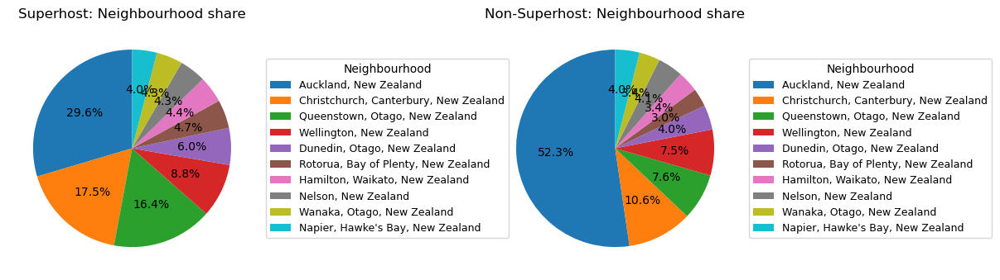

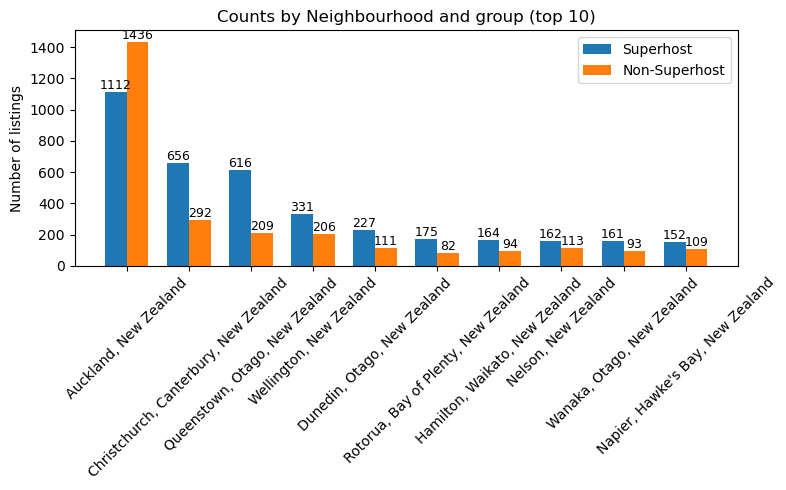

In [1127]:
#neighbourhood
compare_by_location(d, "neighbourhood", "Neighbourhood", top_n=10)

In [1128]:
report='''
3. Neighbourhood

Neighbourhood here is actually tagged with "City, New Zealand," equivalent to city level.

Auckland, New Zealand:
Non-Superhost 52.3%, Superhost 29.6%.
Orange bars (non-superhost) > Blue bars (superhost), and the difference is significant.
This further confirms that Auckland has the largest pool of listings in the country, but it is mainly composed of ordinary landlords.


In cities like Christchurch, Queenstown, Wellington, and Dunedin, the share of Superhosts is higher than that of Non-Superhosts 
( Queenstown 7.6% vs 16.4%). Therefore, the penetration rate of Superhosts is significantly higher in the South Island and some capital/tourist cities.

In second-tier cities like Rotorua, Hamilton, Nelson, Wanaka, and Napier:
The share of Superhosts is also slightly higher than that of Non-Superhosts, and the difference in numbers is not significant.
These second-tier cities generally have a "Superhost advantage," indicating more professional management.

Summary: At the city level, Auckland accounts for over half of non-Superhost listings but less than one-third of Superhosts, 
while cities such as Christchurch, Queenstown, Wellington and Dunedin are relatively more Superhost-oriented.
'''
print(report)


3. Neighbourhood

Neighbourhood here is actually tagged with "City, New Zealand," equivalent to city level.

Auckland, New Zealand:
Non-Superhost 52.3%, Superhost 29.6%.
Orange bars (non-superhost) > Blue bars (superhost), and the difference is significant.
This further confirms that Auckland has the largest pool of listings in the country, but it is mainly composed of ordinary landlords.


In cities like Christchurch, Queenstown, Wellington, and Dunedin, the share of Superhosts is higher than that of Non-Superhosts 
( Queenstown 7.6% vs 16.4%). Therefore, the penetration rate of Superhosts is significantly higher in the South Island and some capital/tourist cities.

In second-tier cities like Rotorua, Hamilton, Nelson, Wanaka, and Napier:
The share of Superhosts is also slightly higher than that of Non-Superhosts, and the difference in numbers is not significant.
These second-tier cities generally have a "Superhost advantage," indicating more professional management.

Summary: At the

In [1129]:
report='''
Location effect – spatial concentration of Superhosts
At all three spatial levels (region_parent, region and neighbourhood), Auckland dominates the overall supply but is relatively non-Superhost heavy. 

In contrast, tourism-oriented destinations such as Queenstown-Lakes, Christchurch, Taupō, Wanaka and Rotorua show a higher concentration of Superhosts. 

This pattern suggests that professional and highly-rated hosts are more likely to operate in mature tourism markets,
while large metropolitan areas like Auckland still have a substantial share of casual or less-experienced hosts.
'''
print(report)


Location effect – spatial concentration of Superhosts
At all three spatial levels (region_parent, region and neighbourhood), Auckland dominates the overall supply but is relatively non-Superhost heavy. 

In contrast, tourism-oriented destinations such as Queenstown-Lakes, Christchurch, Taupō, Wanaka and Rotorua show a higher concentration of Superhosts. 

This pattern suggests that professional and highly-rated hosts are more likely to operate in mature tourism markets,
while large metropolitan areas like Auckland still have a substantial share of casual or less-experienced hosts.



In [1235]:
import folium
from folium.plugins import MarkerCluster, HeatMap

geo = d.dropna(subset=["latitude", "longitude"]).copy()


max_points = 5000
if len(geo) > max_points:
    geo_sample = geo.sample(max_points, random_state=42)
else:
    geo_sample = geo

print(f"Used {len(geo_sample)} points on the map.")


center_lat = geo_sample["latitude"].mean()
center_lon = geo_sample["longitude"].mean()

m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=6,         
    tiles="CartoDB positron"
)


color_map = {
    "Superhost": "red",
    "Non-Superhost": "blue"
}


for g, sub in geo_sample.groupby("group"):
    cluster = MarkerCluster(name=g).add_to(m)
    for _, row in sub.iterrows():
        price = row.get(PRICE, np.nan)
        city  = row.get("region_name", "")
        reg   = row.get("region_parent_name", "")
        nbhd  = row.get("neighbourhood", "")

        popup_txt = (
            f"<b>{g}</b><br>"
            f"Price: {price:.0f} NZD/night<br>"
            f"Region: {reg}<br>"
            f"City/Ward: {city}<br>"
            f"Neighbourhood: {nbhd}"
        )

        folium.CircleMarker(
            location=[row["latitude"], row["longitude"]],
            radius=3,
            color=color_map.get(g, "gray"),
            fill=True,
            fill_opacity=0.6,
            popup=folium.Popup(popup_txt, max_width=250)
        ).add_to(cluster)

# all heatmap
HeatMap(
    data=geo_sample[["latitude", "longitude"]].values.tolist(),
    radius=8,
    blur=6,
    name="All listings heatmap"
).add_to(m)

folium.LayerControl().add_to(m)


m.save("nz_airbnb_superhost_map.html")
m

Used 5000 points on the map.


In [1131]:
report='''
Since Auckland, Queenstown-Lakes District, and Christchurch City accounted for the highest proportion of listings in the Region_parent analysis,
representing the platform's primary supply source, these three locations were further selected for GIS visualization. 
Firstly, they collectively contribute the majority of Superhost and Non-Superhost listings,
representing the overall landscape of the New Zealand Airbnb market. 

Secondly, these three locations correspond to two different scenarios:
a large urban market and a typical tourist destination, respectively, 
facilitating a comparative observation of the spatial distribution and price differences of Superhosts in different types of regions.

Therefore, the subsequent maps will focus on showcasing the spatial layout and price distribution characteristics of these three regions.
'''
print(report)


Since Auckland, Queenstown-Lakes District, and Christchurch City accounted for the highest proportion of listings in the Region_parent analysis,
representing the platform's primary supply source, these three locations were further selected for GIS visualization. 
Firstly, they collectively contribute the majority of Superhost and Non-Superhost listings,
representing the overall landscape of the New Zealand Airbnb market. 

Secondly, these three locations correspond to two different scenarios:
a large urban market and a typical tourist destination, respectively, 
facilitating a comparative observation of the spatial distribution and price differences of Superhosts in different types of regions.

Therefore, the subsequent maps will focus on showcasing the spatial layout and price distribution characteristics of these three regions.



In [1132]:
def plot_region_map(df, region_parent=None, region=None, max_points=3000, zoom_start=11):
    sub = df.dropna(subset=["latitude", "longitude"]).copy()

    if region_parent is not None:
        sub = sub[sub["region_parent_name"] == region_parent]
    if region is not None:
        sub = sub[sub["region_name"] == region]

    if sub.empty:
        print("No data for this filter.")
        return None

    if len(sub) > max_points:
        sub = sub.sample(max_points, random_state=42)

    center_lat = sub["latitude"].mean()
    center_lon = sub["longitude"].mean()

    m_local = folium.Map(
        location=[center_lat, center_lon],
        zoom_start=zoom_start,
        tiles="CartoDB positron"
    )

    color_map = {"Superhost": "red", "Non-Superhost": "blue"}

    for g, gsub in sub.groupby("group"):
        cluster = MarkerCluster(name=g).add_to(m_local)
        for _, row in gsub.iterrows():
            price = row.get(PRICE, np.nan)
            popup_txt = (
                f"<b>{g}</b><br>"
                f"Price: {price:.0f} NZD/night<br>"
                f"{row.get('neighbourhood','')}"
            )
            folium.CircleMarker(
                location=[row["latitude"], row["longitude"]],
                radius=3,
                color=color_map.get(g, "gray"),
                fill=True,
                fill_opacity=0.6,
                popup=folium.Popup(popup_txt, max_width=250)
            ).add_to(cluster)

    HeatMap(
        data=sub[["latitude", "longitude"]].values.tolist(),
        radius=8,
        blur=6,
        name="Heatmap"
    ).add_to(m_local)

    folium.LayerControl().add_to(m_local)
    return m_local

In [1133]:
print('Auckland_Superhost_map')

Auckland_Superhost_map


In [1134]:
m_akl = plot_region_map(d, region_parent="Auckland", max_points=3000, zoom_start=10)
m_akl.save("auckland_superhost_map.html")
m_akl; 

In [1135]:
print('Queenstown_Superhost_map')

Queenstown_Superhost_map


In [1136]:
m_qt = plot_region_map(d, region_parent="Queenstown-Lakes District", max_points=2000, zoom_start=11)
m_qt.save("queenstown_superhost_map.html")
m_qt;

In [1137]:
print('Christchurch_Superhost_map')

Christchurch_Superhost_map


In [1138]:
m_chch = plot_region_map(d,region_parent="Christchurch City", max_points=2000, zoom_start=11)
m_chch.save("christchurch_superhost_map.html")
m_chch;

In [1139]:
#bucket
if "acc_bucket" not in d.columns:
    bins_acc   = [0, 2, 4, 6, np.inf]
    labels_acc = ["1–2", "3–4", "5–6", "7+"]
    d["acc_bucket"] = pd.cut(d["accommodates"], bins=bins_acc,
                             labels=labels_acc, right=True)

if "amen_bucket" not in d.columns:
    bins_amen   = [-0.1, 10, 20, 35, np.inf]
    labels_amen = ["≤10", "11–20", "21–35", "36+"]
    d["amen_bucket"] = pd.cut(d["amenities_count"], bins=bins_amen,
                              labels=labels_amen, right=True)

    
def compare_by_config(df, bucket_col, bucket_label, top_n=None, others_label="Other"):
    df2 = df.copy()
    if top_n is not None:
        counts = df2[bucket_col].value_counts(dropna=False)
        top_vals = counts.index[:top_n]

        df2[bucket_col] = df2[bucket_col].where(
            df2[bucket_col].isin(top_vals),
            other=others_label
        )

   
    tmp = (
        df2.groupby(["group", bucket_col], observed=False)
           .agg(
               count        = (ID_COL, "size"),
               mean_price   = (PRICE, "mean"),
               median_price = (PRICE, "median"),
               acc_mean     = ("accommodates", "mean"),
               beds_mean    = ("beds", "mean"),
               bedrooms_mean= ("bedrooms", "mean"),
               baths_mean   = ("bathrooms", "mean"),
               amen_mean    = ("amenities_count", "mean"),
           )
           .reset_index()
    )

    tmp = tmp.rename(columns={bucket_col: bucket_label})

    
    tmp = tmp.sort_values(["group", "count"], ascending=[True, False])

    print(f"\n=== Comparison by {bucket_label} (Superhost vs Non-Superhost) — detail table ===")
    display(
        tmp.style.format({
            "count": "{:,.0f}",
            "mean_price": "{:.2f}",
            "median_price": "{:.2f}",
            "acc_mean": "{:.2f}",
            "beds_mean": "{:.2f}",
            "bedrooms_mean": "{:.2f}",
            "baths_mean": "{:.2f}",
            "amen_mean": "{:.2f}",
        })
    )

    # share table
    pivot_counts = (
        tmp.pivot(index=bucket_label, columns="group", values="count")
           .fillna(0)
    )
    share = pivot_counts.div(pivot_counts.sum(axis=0), axis=1)

    
    sort_col = "Non-Superhost" if "Non-Superhost" in share.columns else share.columns[0]
    share = share.sort_values(sort_col, ascending=False)
    pivot_counts = pivot_counts.loc[share.index]  

    print(f"\n=== Share table by {bucket_label} (within each group) ===")
    display(
        share.style.format("{:.2%}")
             .set_caption(f"Share of listings in each {bucket_label} bucket (Superhost vs Non-Superhost)")
    )

    buckets = share.index.astype(str)
    super_count    = pivot_counts["Superhost"]      if "Superhost" in pivot_counts.columns      else np.zeros(len(buckets))
    nonsuper_count = pivot_counts["Non-Superhost"] if "Non-Superhost" in pivot_counts.columns else np.zeros(len(buckets))

    #pie chart
    def plot_pie_for_group(pivot_share, group_name, bucket_label, ax):
        if group_name not in pivot_share.columns:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
            ax.axis("off")
            return
        sizes = pivot_share[group_name].fillna(0).values
        if sizes.sum() == 0:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
            ax.axis("off")
            return
        wedges, texts, autotexts = ax.pie(
            sizes,
            autopct="%1.1f%%",
            startangle=90
        )
        ax.set_title(f"{group_name}: {bucket_label} share")
        ax.legend(
            wedges,
            pivot_share.index.tolist(),
            title=bucket_label,
            loc="center left",
            bbox_to_anchor=(1.02, 0.5),
            fontsize=8
        )

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    plot_pie_for_group(share, "Superhost",     bucket_label, axes[0])
    plot_pie_for_group(share, "Non-Superhost", bucket_label, axes[1])
    plt.tight_layout()
    plt.show()

    #bar chart
    x = np.arange(len(buckets))
    width = 0.35

    plt.figure(figsize=(10, 5))
    plt.bar(x - width/2, super_count,    width, label="Superhost")
    plt.bar(x + width/2, nonsuper_count, width, label="Non-Superhost")

    plt.xticks(x, buckets, rotation=45, ha="right")
    plt.ylabel("Number of listings")
    plt.title(f"Counts by {bucket_label} and group")
    plt.legend()

    for i, v in enumerate(super_count):
        if v > 0:
            plt.text(x[i] - width/2, v, f"{int(v)}", ha="center", va="bottom", fontsize=8)
    for i, v in enumerate(nonsuper_count):
        if v > 0:
            plt.text(x[i] + width/2, v, f"{int(v)}", ha="center", va="bottom", fontsize=8)

    plt.tight_layout()
    plt.show()

In [1140]:
report='''
Auckland property type and capacity with price Comparsion
'''
print(report)


Auckland property type and capacity with price Comparsion




=== Comparison by Property_type (Superhost vs Non-Superhost) — detail table ===


,group,Property_type,count,mean_price,median_price,acc_mean,beds_mean,bedrooms_mean,baths_mean,amen_mean
2,Non-Superhost,Entire home,"1,411",277.78,256.00,5.68,3.38,2.81,1.72,34.66
5,Non-Superhost,Private room in home,"1,047",93.06,77.00,2.00,1.25,1.16,1.15,23.74
4,Non-Superhost,Other,"1,042",174.16,143.00,3.07,1.88,1.49,1.36,31.27
3,Non-Superhost,Entire rental unit,864,173.10,148.50,3.33,1.82,1.49,1.20,35.03
1,Non-Superhost,Entire guesthouse,232,155.26,135.00,2.88,1.62,1.23,1.03,32.16
0,Non-Superhost,Entire guest suite,159,139.48,125.00,3.06,1.79,1.35,1.07,35.04
8,Superhost,Entire home,702,280.30,256.00,5.59,3.45,2.71,1.73,45.95
9,Superhost,Entire rental unit,702,180.31,156.50,3.12,1.74,1.43,1.21,42.44
10,Superhost,Other,634,173.01,145.50,3.46,2.08,1.62,1.35,38.69
11,Superhost,Private room in home,370,74.55,69.00,2.05,1.16,1.11,1.11,35.15



=== Share table by Property_type (within each group) ===


group,Non-Superhost,Superhost
Property_type,,
Entire home,29.67%,24.32%
Private room in home,22.02%,12.82%
Other,21.91%,21.96%
Entire rental unit,18.17%,24.32%
Entire guesthouse,4.88%,8.21%
Entire guest suite,3.34%,8.38%


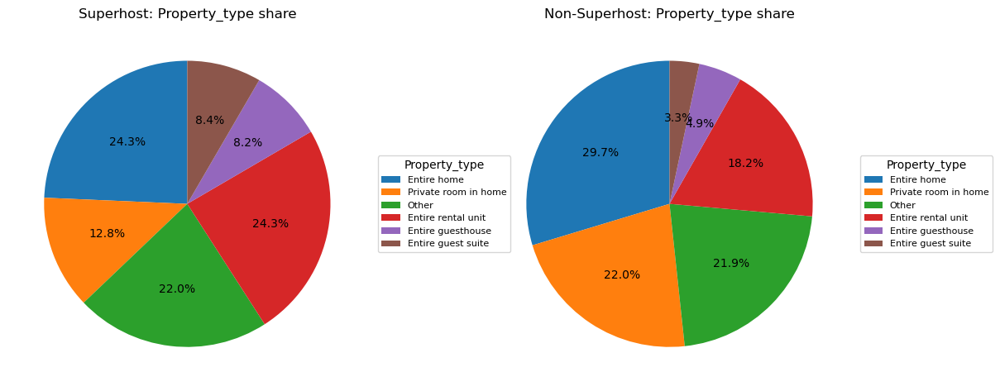

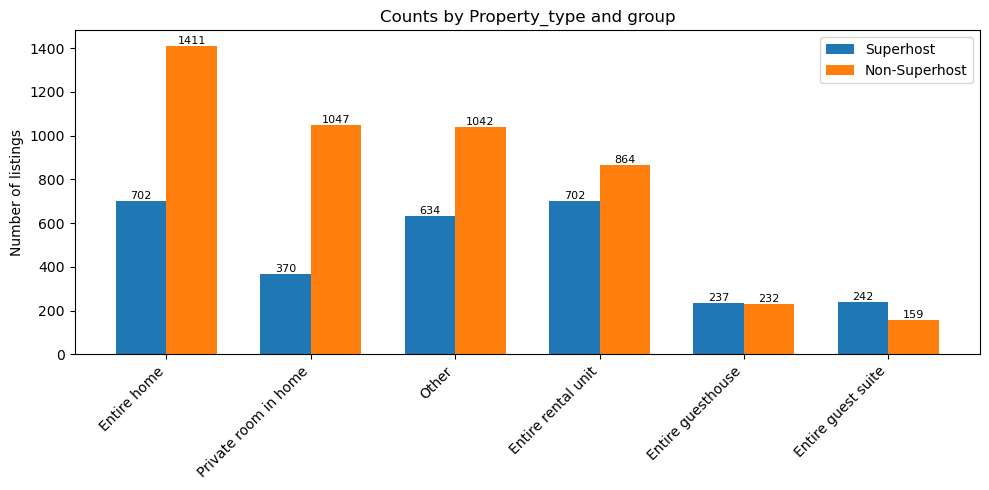

In [1141]:
akl = d[d["region_parent_name"] == "Auckland"].copy()
compare_by_config(akl, "property_type", "Property_type", top_n=5)

Top 5 property types in Auckland:
['Entire home', 'Entire rental unit', 'Private room in home', 'Entire guesthouse', 'Entire guest suite']


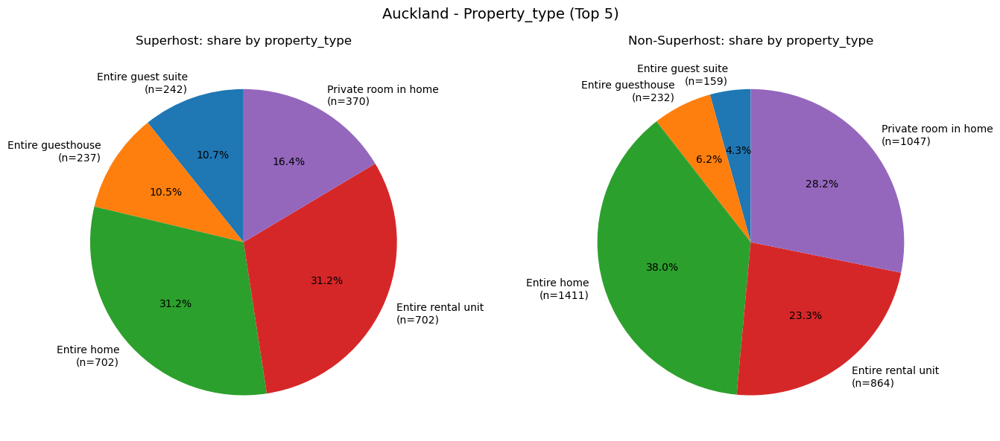


Share table (Top 5 property_type in Auckland):


group,Non-Superhost,Superhost
property_type,,
Entire guest suite,4.28%,10.74%
Entire guesthouse,6.25%,10.52%
Entire home,38.00%,31.16%
Entire rental unit,23.27%,31.16%
Private room in home,28.20%,16.42%


In [1142]:
akl = d[d["region_parent_name"] == "Auckland"].copy()

# Top 5 property_type
top5_types = (
    akl["property_type"]
    .value_counts()
    .head(5)
    .index
)

akl_top = akl[akl["property_type"].isin(top5_types)].copy()
akl_top["property_type"] = akl_top["property_type"].astype(str)
print("Top 5 property types in Auckland:")
print(top5_types.tolist())

def plot_type_share_pies(df, title_prefix="Auckland - Property_type (Top 5)"):
    #count
    cnt = (
        df.groupby(["property_type", "group"])[ID_COL]
          .size()
          .reset_index(name="count")
    )
    pivot_counts = (
        cnt.pivot(index="property_type", columns="group", values="count")
           .fillna(0)
    )
    share = pivot_counts.div(pivot_counts.sum(axis=0), axis=1)

    def _plot_one(ax, group_name):
        if group_name not in pivot_counts.columns:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
            ax.axis("off")
            return

        sizes = share[group_name].values
        labels = [
            f"{t}\n(n={int(pivot_counts.loc[t, group_name])})"
            for t in share.index
        ]
        wedges, texts, autotexts = ax.pie(
            sizes,
            labels=labels,
            autopct="%1.1f%%",
            startangle=90
        )
        ax.set_title(f"{group_name}: share by property_type")

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    fig.suptitle(title_prefix, fontsize=14)

    _plot_one(axes[0], "Superhost")
    _plot_one(axes[1], "Non-Superhost")

    plt.tight_layout()
    plt.show()

    # share table
    print("\nShare table (Top 5 property_type in Auckland):")
    display(
        share.style.format("{:.2%}")
             .set_caption("Share of listings in each property_type (Superhost vs Non-Superhost)")
    )


plot_type_share_pies(akl_top)


Price summary by property_type (Top 5, Auckland):


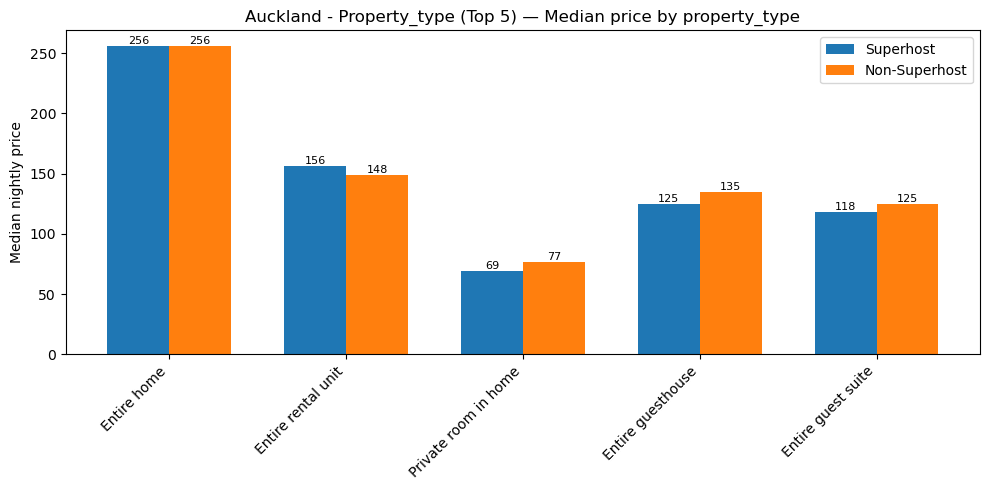

In [1143]:
def plot_type_price_bars(df, title_prefix="Auckland - Property_type (Top 5)"):
    stats = (
        df.groupby(["property_type", "group"])[PRICE]
          .agg(mean_price="mean", median_price="median", count="size")
          .reset_index()
    )

    #by count
    order = (
        stats.groupby("property_type")["count"]
             .sum()
             .sort_values(ascending=False)
             .index
    )
    stats["property_type"] = pd.Categorical(stats["property_type"], categories=order, ordered=True)
    stats = stats.sort_values(["property_type", "group"])

    print("\nPrice summary by property_type (Top 5, Auckland):")
    display(
        stats.pivot(index="property_type", columns="group", values=["mean_price", "median_price"])
             .style.format("{:.2f}")
    )

    types = order.tolist()
    x = np.arange(len(types))
    width = 0.35

    def _bar_for_metric(metric, ylabel, title_suffix):
        plt.figure(figsize=(10, 5))
        super_vals = []
        non_vals   = []
        for t in types:
            tmp = stats[stats["property_type"] == t]
            super_vals.append(tmp.loc[tmp["group"] == "Superhost", metric].values[0]
                              if "Superhost" in tmp["group"].values else np.nan)
            non_vals.append(tmp.loc[tmp["group"] == "Non-Superhost", metric].values[0]
                            if "Non-Superhost" in tmp["group"].values else np.nan)

        plt.bar(x - width/2, super_vals, width, label="Superhost")
        plt.bar(x + width/2, non_vals,   width, label="Non-Superhost")

        plt.xticks(x, types, rotation=45, ha="right")
        plt.ylabel(ylabel)
        plt.title(f"{title_prefix} — {title_suffix}")
        plt.legend()

        for i, v in enumerate(super_vals):
            if not np.isnan(v):
                plt.text(x[i] - width/2, v, f"{v:.0f}", ha="center", va="bottom", fontsize=8)
        for i, v in enumerate(non_vals):
            if not np.isnan(v):
                plt.text(x[i] + width/2, v, f"{v:.0f}", ha="center", va="bottom", fontsize=8)

        plt.tight_layout()
        plt.show()

    # median price
    _bar_for_metric("median_price", "Median nightly price", "Median price by property_type")

plot_type_price_bars(akl_top)

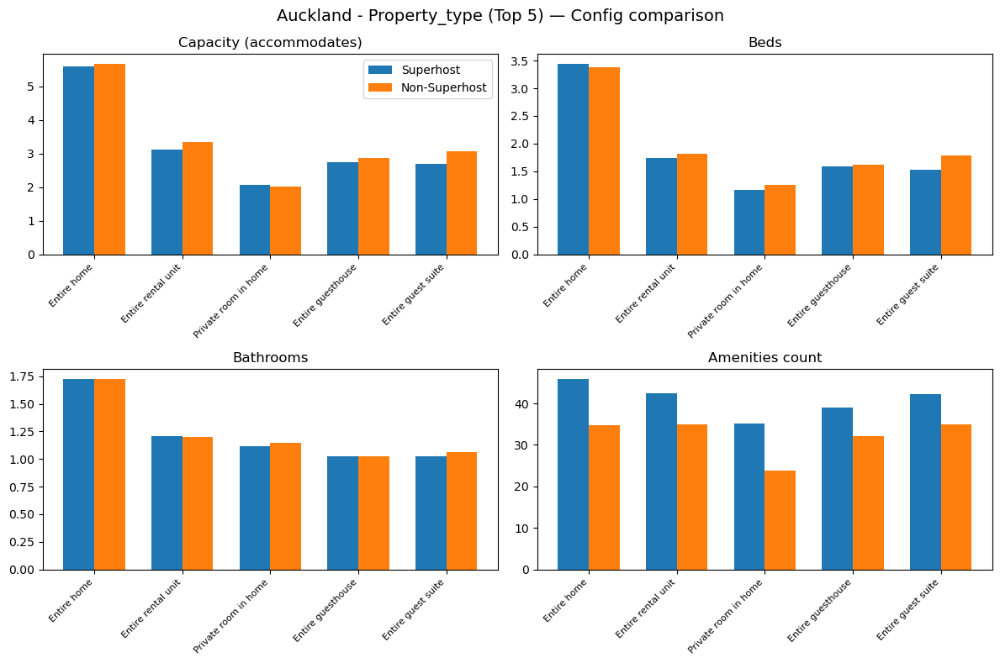

In [1144]:
def plot_type_config_bars(df, title_prefix="Auckland - Property_type (Top 5)"):
    metrics = [
        ("accommodates",    "Capacity (accommodates)"),
        ("beds",            "Beds"),
        ("bathrooms",       "Bathrooms"),
        ("amenities_count", "Amenities count"),
    ]

    stats_cfg = (
        df.groupby(["property_type", "group"])[[m[0] for m in metrics]]
          .mean()
          .reset_index()
    )

    order = (
        df["property_type"]
        .value_counts()
        .loc[stats_cfg["property_type"].unique()]
        .sort_values(ascending=False)
        .index
    )
    stats_cfg["property_type"] = pd.Categorical(stats_cfg["property_type"], categories=order, ordered=True)
    stats_cfg = stats_cfg.sort_values(["property_type", "group"])
    types = order.tolist()
    x = np.arange(len(types))
    width = 0.35

    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    fig.suptitle(f"{title_prefix} — Config comparison", fontsize=14)
    axes = axes.ravel()

    for ax, (col, label) in zip(axes, metrics):
        super_vals = []
        non_vals   = []
        for t in types:
            tmp = stats_cfg[stats_cfg["property_type"] == t]
            super_vals.append(tmp.loc[tmp["group"] == "Superhost", col].values[0]
                              if "Superhost" in tmp["group"].values else np.nan)
            non_vals.append(tmp.loc[tmp["group"] == "Non-Superhost", col].values[0]
                            if "Non-Superhost" in tmp["group"].values else np.nan)

        ax.bar(x - width/2, super_vals, width, label="Superhost")
        ax.bar(x + width/2, non_vals,   width, label="Non-Superhost")
        ax.set_title(label)
        ax.set_xticks(x)
        ax.set_xticklabels(types, rotation=45, ha="right", fontsize=8)

    axes[0].legend(loc="upper right")
    plt.tight_layout()
    plt.show()

plot_type_config_bars(akl_top)

In [1145]:
report='''
This section compares the structural distribution and price differences of different property types between Superhost and Non-Superhost in Auckland. 
Overall, Superhosts are more concentrated on "entire properties/independent spaces" 
(especially Entire rental units, Entire guest suites, and Entire guesthouses), 
while Non-Superhosts have a significantly higher proportion of "private rooms in home." 
Taking the top 5 types as an example: Entire rental units account for 31.16% of Superhosts (compared to 23.27% for Non-Superhosts), 
and Entire guest suites/Entire guesthouses are also more prevalent in Superhosts (10.74%/10.52%), compared to 4.28%/6.25% in Non-Superhosts. 
Conversely, Private rooms in home account for only 16.42% of Superhosts, but rise to 28.20% in Non-Superhosts, 
indicating that Non-Superhosts offer a more "shared/single room" model. 

Regarding pricing (see median), Superhost doesn't exhibit a consistent median premium. 
For example, the median price for Entire Homes is completely consistent (256 vs 256); 
Superhost is slightly higher for Entire Rental Units (156.5 vs 148.5). 
However, Superhost is actually cheaper in other mainstream categories: Private Room in Home (69 vs 77), Entire Guesthouse (125 vs 135),
and Entire Guest Suite (118 vs 125). 
This suggests that Superhost is more likely to employ "more cost-effective pricing" in most categories to stabilize bookings and reviews, 
while only showing a premium for rental unit inventory (possibly related to location/positioning).
The configuration and room quality signals further support the "experience-driven" conclusion: 
Superhosts have significantly more amenities across all property types (Entire home 45.95 vs 34.66; Private room 35.15 vs 23.74; 
Entire rental unit 42.44 vs 35.03; Guesthouse 39.06 vs 32.16; Guest suite 42.14 vs 35.04). 

Meanwhile, the differences in "configuration scale indicators" such as accommodations/beds/bedrooms/baths are not significant between the two groups, 
and even slightly larger for some types of Non-Superhosts, but this does not translate into a higher price advantage. 
Overall, Superhosts' competitiveness is more like "better configurations and a more consistent accommodation experience"
rather than "larger/more expensive." Finally, "Other" belongs to a mixed category (with significant internal differences), 
and the conclusions should primarily rely on the mainstream types with larger sample sizes.
'''
print(report)


This section compares the structural distribution and price differences of different property types between Superhost and Non-Superhost in Auckland. 
Overall, Superhosts are more concentrated on "entire properties/independent spaces" 
(especially Entire rental units, Entire guest suites, and Entire guesthouses), 
while Non-Superhosts have a significantly higher proportion of "private rooms in home." 
Taking the top 5 types as an example: Entire rental units account for 31.16% of Superhosts (compared to 23.27% for Non-Superhosts), 
and Entire guest suites/Entire guesthouses are also more prevalent in Superhosts (10.74%/10.52%), compared to 4.28%/6.25% in Non-Superhosts. 
Conversely, Private rooms in home account for only 16.42% of Superhosts, but rise to 28.20% in Non-Superhosts, 
indicating that Non-Superhosts offer a more "shared/single room" model. 

Regarding pricing (see median), Superhost doesn't exhibit a consistent median premium. 
For example, the median price for Entire Homes

In [1146]:
report='''
Queenstown property type and capacity with price Comparsion
'''
print(report)


Queenstown property type and capacity with price Comparsion




=== Comparison by Property_type (Superhost vs Non-Superhost) — detail table ===


,group,Property_type,count,mean_price,median_price,acc_mean,beds_mean,bedrooms_mean,baths_mean,amen_mean
2,Non-Superhost,Entire home,642,387.60,395.50,6.01,3.75,2.92,1.80,37.03
4,Non-Superhost,Other,283,286.48,268.00,3.63,2.45,1.73,1.38,34.25
3,Non-Superhost,Entire rental unit,236,291.39,264.50,3.70,2.23,1.68,1.31,36.42
5,Non-Superhost,Private room in home,107,164.00,135.00,2.17,1.20,1.10,1.21,28.42
1,Non-Superhost,Entire guesthouse,80,203.43,189.50,3.05,1.84,1.35,1.09,34.31
0,Non-Superhost,Entire guest suite,65,182.54,167.00,2.69,1.62,1.03,1.02,35.06
9,Superhost,Entire rental unit,777,317.37,299.00,3.89,2.33,1.82,1.45,41.68
8,Superhost,Entire home,702,395.84,395.50,5.96,3.75,2.87,1.88,45.07
10,Superhost,Other,478,287.58,270.00,3.67,2.32,1.64,1.31,39.01
7,Superhost,Entire guesthouse,193,207.63,183.00,2.72,1.61,1.18,1.08,39.09



=== Share table by Property_type (within each group) ===


group,Non-Superhost,Superhost
Property_type,,
Entire home,45.44%,28.33%
Other,20.03%,19.29%
Entire rental unit,16.70%,31.36%
Private room in home,7.57%,5.69%
Entire guesthouse,5.66%,7.79%
Entire guest suite,4.60%,7.55%


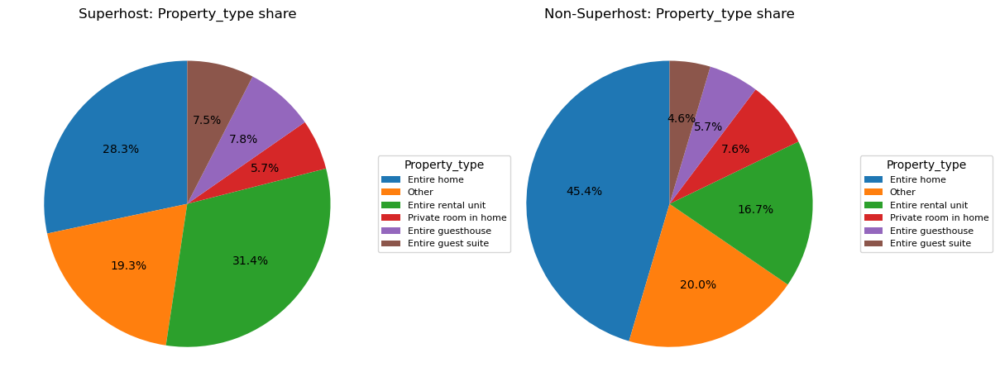

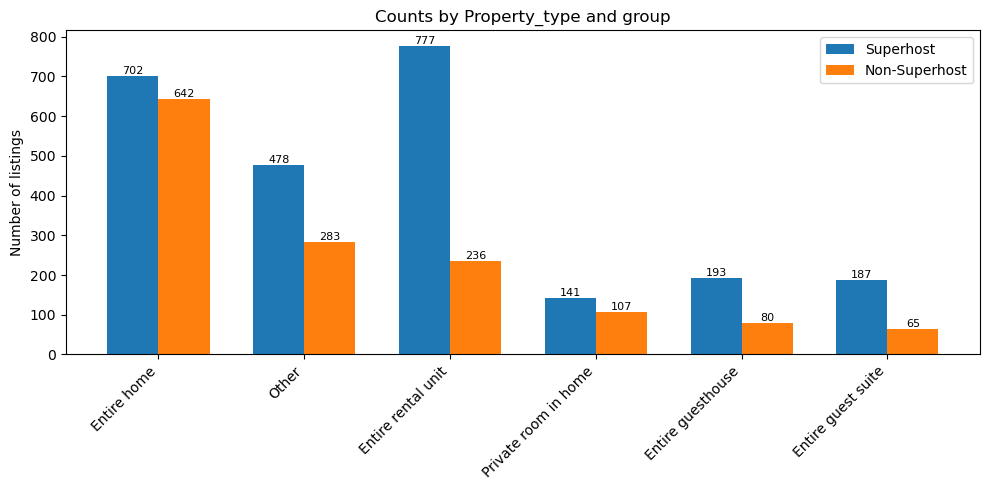

In [1147]:
# Queenstown
qt = d[d["region_parent_name"] == "Queenstown-Lakes District"].copy()
compare_by_config(qt, "property_type", "Property_type", top_n=5)

Top 5 property types in Queenstown:
['Entire home', 'Entire rental unit', 'Entire guesthouse', 'Entire guest suite', 'Private room in home']


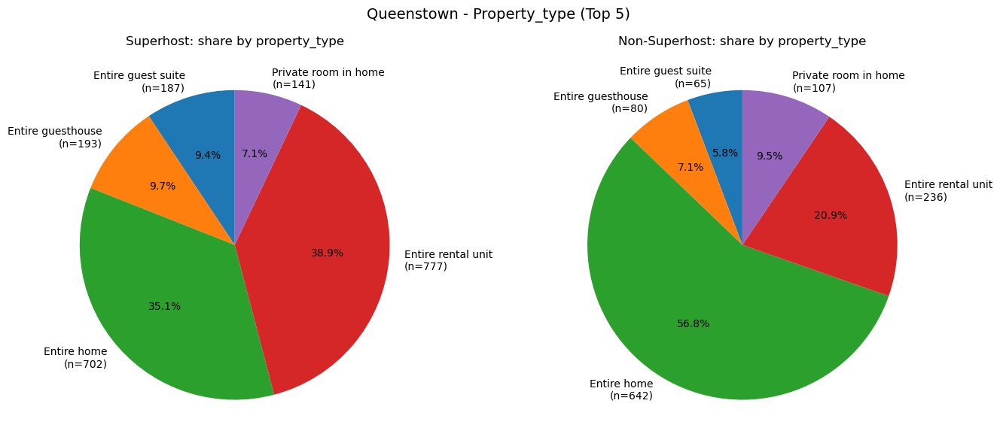


Share table (Top 5 property_type in Queenstown):


group,Non-Superhost,Superhost
property_type,,
Entire guest suite,5.75%,9.35%
Entire guesthouse,7.08%,9.65%
Entire home,56.81%,35.10%
Entire rental unit,20.88%,38.85%
Private room in home,9.47%,7.05%


In [1148]:
qt = d[d["region_parent_name"] == "Queenstown-Lakes District"].copy()

# Top 5 property_type
top5_types = (
    qt["property_type"]
      .value_counts()
      .head(5)
      .index
)

qt_top = qt[qt["property_type"].isin(top5_types)].copy()
qt_top["property_type"] = qt_top["property_type"].astype(str)
print("Top 5 property types in Queenstown:")
print(top5_types.tolist())

def plot_type_share_pies(df, title_prefix="Queenstown - Property_type (Top 5)"):
    # count
    cnt = (
        df.groupby(["property_type", "group"])[ID_COL]
          .size()
          .reset_index(name="count")
    )
    pivot_counts = (
        cnt.pivot(index="property_type", columns="group", values="count")
           .fillna(0)
    )
    share = pivot_counts.div(pivot_counts.sum(axis=0), axis=1)

    def _plot_one(ax, group_name):
        if group_name not in pivot_counts.columns:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
            ax.axis('off')
            return

        sizes = share[group_name].values
        labels = [
            f"{t}\n(n={int(pivot_counts.loc[t, group_name])})"
            for t in share.index
        ]
        wedges, texts, autotexts = ax.pie(
            sizes,
            labels=labels,
            autopct="%1.1f%%",
            startangle=90
        )
        ax.set_title(f"{group_name}: share by property_type")

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    fig.suptitle(title_prefix, fontsize=14)

    _plot_one(axes[0], "Superhost")
    _plot_one(axes[1], "Non-Superhost")

    plt.tight_layout()
    plt.show()

    # share table
    print("\nShare table (Top 5 property_type in Queenstown):")
    display(
        share.style.format("{:.2%}")
             .set_caption(
                 "Share of listings in each property_type "
                 "(Superhost vs Non-Superhost, Queenstown)"
             )
    )

plot_type_share_pies(qt_top)


Price summary by property_type (Top 5, Queenstown):


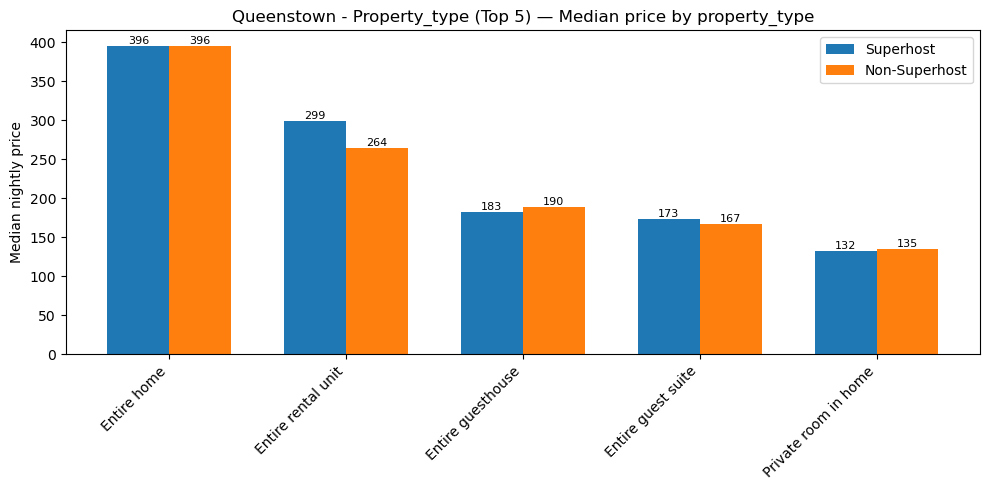

In [1149]:
def plot_type_price_bars(df, title_prefix="Queenstown - Property_type (Top 5)"):
    stats = (
        df.groupby(["property_type", "group"])[PRICE]
          .agg(mean_price="mean", median_price="median", count="size")
          .reset_index()
    )

    # by count 
    order = (
        stats.groupby("property_type")["count"]
             .sum()
             .sort_values(ascending=False)
             .index
    )
    stats["property_type"] = pd.Categorical(
        stats["property_type"], categories=order, ordered=True
    )
    stats = stats.sort_values(["property_type", "group"])

    print("\nPrice summary by property_type (Top 5, Queenstown):")
    display(
        stats.pivot(index="property_type", columns="group", values=["mean_price", "median_price"])
             .style.format("{:.2f}")
    )

    types = order.tolist()
    x = np.arange(len(types))
    width = 0.35

    def _bar_for_metric(metric, ylabel, title_suffix):
        plt.figure(figsize=(10, 5))
        super_vals = []
        non_vals   = []
        for t in types:
            tmp = stats[stats["property_type"] == t]
            super_vals.append(
                tmp.loc[tmp["group"] == "Superhost", metric].values[0]
                if "Superhost" in tmp["group"].values else np.nan
            )
            non_vals.append(
                tmp.loc[tmp["group"] == "Non-Superhost", metric].values[0]
                if "Non-Superhost" in tmp["group"].values else np.nan
            )

        plt.bar(x - width/2, super_vals, width, label="Superhost")
        plt.bar(x + width/2, non_vals,   width, label="Non-Superhost")

        plt.xticks(x, types, rotation=45, ha="right")
        plt.ylabel(ylabel)
        plt.title(f"{title_prefix} — {title_suffix}")
        plt.legend()

        for i, v in enumerate(super_vals):
            if not np.isnan(v):
                plt.text(x[i] - width/2, v, f"{v:.0f}", ha="center", va="bottom", fontsize=8)
        for i, v in enumerate(non_vals):
            if not np.isnan(v):
                plt.text(x[i] + width/2, v, f"{v:.0f}", ha="center", va="bottom", fontsize=8)

        plt.tight_layout()
        plt.show()

    # median price
    _bar_for_metric("median_price", "Median nightly price", "Median price by property_type")

plot_type_price_bars(qt_top, title_prefix="Queenstown - Property_type (Top 5)")

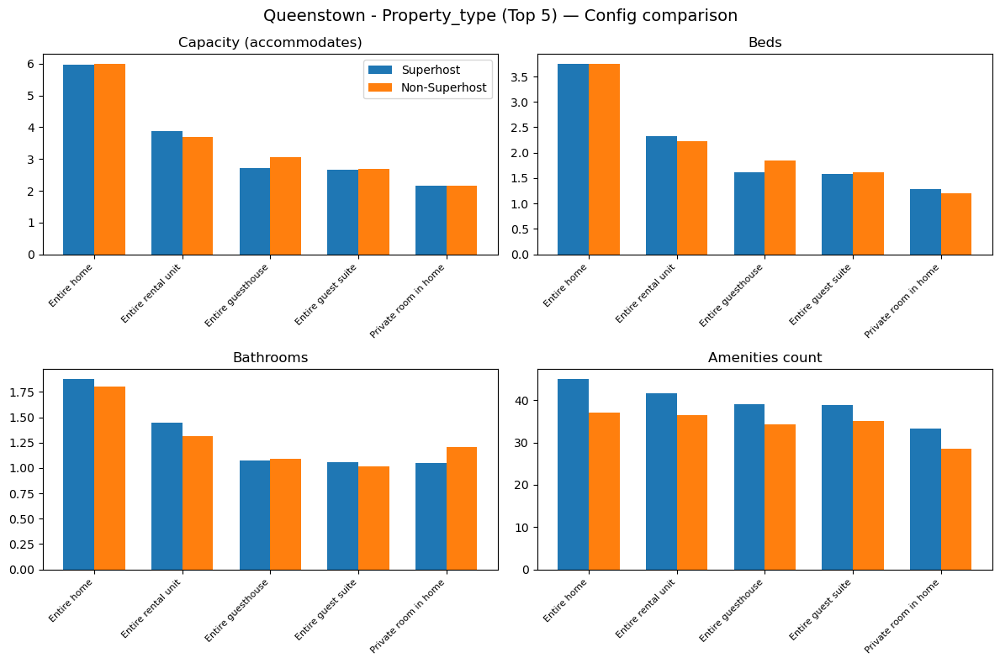

In [1150]:
def plot_type_config_bars(df, title_prefix="Queenstown - Property_type (Top 5)"):
    metrics = [
        ("accommodates",    "Capacity (accommodates)"),
        ("beds",            "Beds"),
        ("bathrooms",       "Bathrooms"),
        ("amenities_count", "Amenities count"),
    ]

    stats_cfg = (
        df.groupby(["property_type", "group"])[[m[0] for m in metrics]]
          .mean()
          .reset_index()
    )

    order = (
        df["property_type"]
          .value_counts()
          .loc[stats_cfg["property_type"].unique()]
          .sort_values(ascending=False)
          .index
    )
    stats_cfg["property_type"] = pd.Categorical(
        stats_cfg["property_type"], categories=order, ordered=True
    )
    stats_cfg = stats_cfg.sort_values(["property_type", "group"])

    types = order.tolist()
    x = np.arange(len(types))
    width = 0.35

    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    fig.suptitle(f"{title_prefix} — Config comparison", fontsize=14)
    axes = axes.ravel()

    for ax, (col, label) in zip(axes, metrics):
        super_vals = []
        non_vals   = []
        for t in types:
            tmp = stats_cfg[stats_cfg["property_type"] == t]
            super_vals.append(
                tmp.loc[tmp["group"] == "Superhost", col].values[0]
                if "Superhost" in tmp["group"].values else np.nan
            )
            non_vals.append(
                tmp.loc[tmp["group"] == "Non-Superhost", col].values[0]
                if "Non-Superhost" in tmp["group"].values else np.nan
            )

        ax.bar(x - width/2, super_vals, width, label="Superhost")
        ax.bar(x + width/2, non_vals,   width, label="Non-Superhost")
        ax.set_title(label)
        ax.set_xticks(x)
        ax.set_xticklabels(types, rotation=45, ha="right", fontsize=8)

    axes[0].legend(loc="upper right")
    plt.tight_layout()
    plt.show()

plot_type_config_bars(qt_top, title_prefix="Queenstown - Property_type (Top 5)")

In [1151]:
report='''
This section compares the structural distribution, price differences, 
and configuration differences of different property types in Queenstown (Superhost vs. Non-Superhost). 
Overall, Superhost's supply is more skewed towards "entire rental units" and is more diversified, while Non-Superhost focuses more on "entire homes".
Specifically, entire rental units account for 38.85% of Superhost's offerings (compared to 20.88% for Non-Superhost); 
conversely, entire homes account for 35.10% of Superhost's offerings but a significant 56.81% of Non-Superhost's. 

Superhost also has a higher percentage of entire guesthouses (9.65% vs. 7.08%) and entire guest suites (9.35% vs. 5.75%), 
indicating that Superhost's property structure is not limited to "entire apartments" 
but focuses more on standardized, replicable combinations of individual room types.

Regarding price (see median), Superhost does not exhibit a consistent premium. 
For example, the median price for Entire Homes is exactly the same (395.5 vs 395.5); 
however, Superhost is significantly higher for Entire Rental Units (299.0 vs 264.5), 
suggesting a premium pricing power for "apartment-style" properties (possibly due to location, maintenance, and operational stability). 
In contrast, Superhost is slightly lower for Entire Guesthouses (183.0 vs 189.5) and Private Room in Homes (132.0 vs 135.0), 
while Entire Guest Suites are slightly higher (173.0 vs 167.0). 

The overall conclusion is that the premium is mainly concentrated in Entire Rental Units, 
while other types tend to be priced more conservatively or offer better value.

The signals regarding amenities and experience are very clear: across all property types, 
Superhosts have a higher number of amenities ( Entire home 45.07 vs 37.03; Entire rental unit 41.68 vs 36.42; Private room 33.28 vs 28.42; 
Guesthouse 39.09 vs 34.31; Guest suite 38.87 vs 35.06). 
Meanwhile, the "scale indicators" for amenities/beds/bedrooms/baths are generally similar across both groups, 
with some types of Non-Superhosts even slightly larger. 

This suggests that Superhosts' advantage lies more in "better amenities + a more consistent accommodation experience" 
rather than "larger and therefore more expensive." 
Finally, "Other" represents a mixed category with significant differences, and some subcategories have small sample sizes (guest suites Non-Superhosts). 
Therefore, interpretation should primarily rely on high-sample types like Entire home and Entire rental unit.
'''
print(report)


This section compares the structural distribution, price differences, 
and configuration differences of different property types in Queenstown (Superhost vs. Non-Superhost). 
Overall, Superhost's supply is more skewed towards "entire rental units" and is more diversified, while Non-Superhost focuses more on "entire homes".
Specifically, entire rental units account for 38.85% of Superhost's offerings (compared to 20.88% for Non-Superhost); 
conversely, entire homes account for 35.10% of Superhost's offerings but a significant 56.81% of Non-Superhost's. 

Superhost also has a higher percentage of entire guesthouses (9.65% vs. 7.08%) and entire guest suites (9.35% vs. 5.75%), 
indicating that Superhost's property structure is not limited to "entire apartments" 
but focuses more on standardized, replicable combinations of individual room types.

Regarding price (see median), Superhost does not exhibit a consistent premium. 
For example, the median price for Entire Homes is exactly the sam

In [1152]:
report='''
Christchurch property type and capacity with price Comparsion
'''
print(report)


Christchurch property type and capacity with price Comparsion




=== Comparison by Property_type (Superhost vs Non-Superhost) — detail table ===


,group,Property_type,count,mean_price,median_price,acc_mean,beds_mean,bedrooms_mean,baths_mean,amen_mean
1,Non-Superhost,Entire home,375,233.10,206.00,5.65,3.30,2.68,1.62,35.41
4,Non-Superhost,Other,293,160.95,147.00,3.02,1.88,1.33,1.03,28.54
2,Non-Superhost,Entire rental unit,180,180.93,156.50,3.75,2.14,1.74,1.35,34.99
5,Non-Superhost,Private room in home,157,82.79,70.00,2.06,1.18,1.08,1.13,24.29
3,Non-Superhost,Entire townhouse,76,164.43,134.50,4.87,2.74,2.18,1.63,43.53
0,Non-Superhost,Entire guesthouse,38,127.89,103.50,2.39,1.39,0.92,1.03,34.63
7,Superhost,Entire home,494,187.14,166.00,5.57,3.25,2.54,1.70,48.33
8,Superhost,Entire rental unit,323,148.72,135.00,3.66,2.07,1.61,1.28,43.91
10,Superhost,Other,254,143.81,121.50,3.26,1.99,1.37,1.17,38.66
11,Superhost,Private room in home,142,68.09,65.00,2.06,1.26,1.13,1.10,36.94



=== Share table by Property_type (within each group) ===


group,Non-Superhost,Superhost
Property_type,,
Entire home,33.51%,34.69%
Other,26.18%,17.84%
Entire rental unit,16.09%,22.68%
Private room in home,14.03%,9.97%
Entire townhouse,6.79%,8.71%
Entire guesthouse,3.40%,6.11%


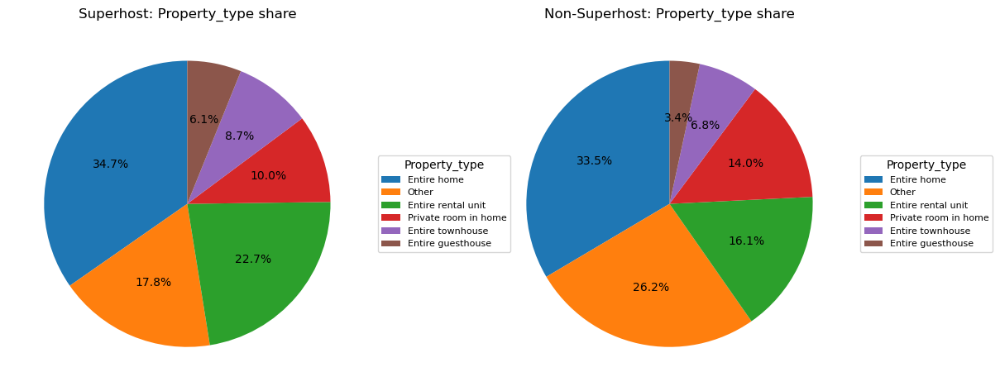

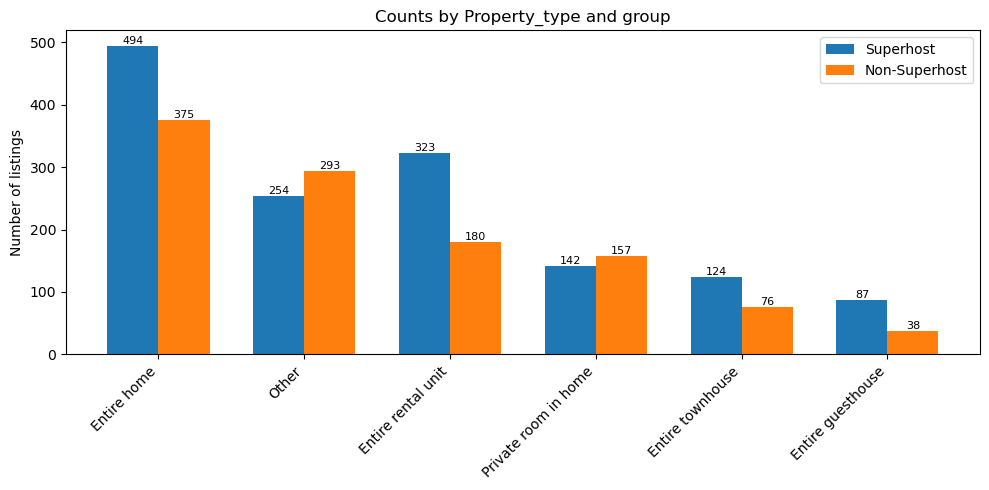

In [1153]:
chch = d[d["region_parent_name"] == "Christchurch City"].copy()

compare_by_config(chch, "property_type", "Property_type", top_n=5)

Top 5 property types in Christchurch:
['Entire home', 'Entire rental unit', 'Private room in home', 'Entire townhouse', 'Entire guesthouse']


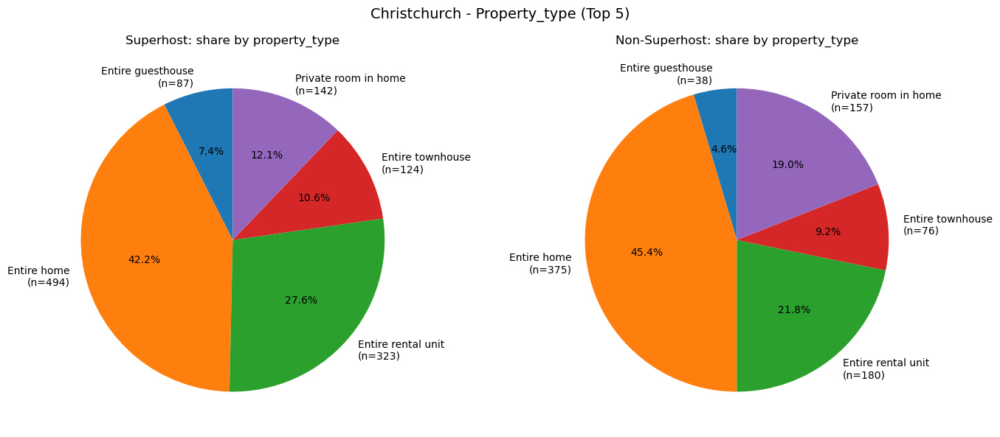


Share table (Top 5 property_type in Christchurch):


group,Non-Superhost,Superhost
property_type,,
Entire guesthouse,4.60%,7.44%
Entire home,45.40%,42.22%
Entire rental unit,21.79%,27.61%
Entire townhouse,9.20%,10.60%
Private room in home,19.01%,12.14%


In [1154]:
chch = d[d["region_parent_name"] == "Christchurch City"].copy()

# Top 5 property_type
top5_types = (
    chch["property_type"]
        .value_counts()
        .head(5)
        .index
)

chch_top = chch[chch["property_type"].isin(top5_types)].copy()
chch_top["property_type"] = chch_top["property_type"].astype(str)
print("Top 5 property types in Christchurch:")
print(top5_types.tolist())

def plot_type_share_pies(df, title_prefix="Christchurch - Property_type (Top 5)"):
    # count
    cnt = (
        df.groupby(["property_type", "group"])[ID_COL]
          .size()
          .reset_index(name="count")
    )
    pivot_counts = (
        cnt.pivot(index="property_type", columns="group", values="count")
           .fillna(0)
    )
    share = pivot_counts.div(pivot_counts.sum(axis=0), axis=1)

    def _plot_one(ax, group_name):
        if group_name not in pivot_counts.columns:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
            ax.axis('off')
            return

        sizes = share[group_name].values
        labels = [
            f"{t}\n(n={int(pivot_counts.loc[t, group_name])})"
            for t in share.index
        ]
        wedges, texts, autotexts = ax.pie(
            sizes,
            labels=labels,
            autopct="%1.1f%%",
            startangle=90
        )
        ax.set_title(f"{group_name}: share by property_type")

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    fig.suptitle(title_prefix, fontsize=14)

    _plot_one(axes[0], "Superhost")
    _plot_one(axes[1], "Non-Superhost")

    plt.tight_layout()
    plt.show()

    # share table
    print("\nShare table (Top 5 property_type in Christchurch):")
    display(
        share.style.format("{:.2%}")
             .set_caption(
                 "Share of listings in each property_type "
                 "(Superhost vs Non-Superhost, Christchurch)"
             )
    )

plot_type_share_pies(chch_top)


Price summary by property_type (Top 5, Christchurch):


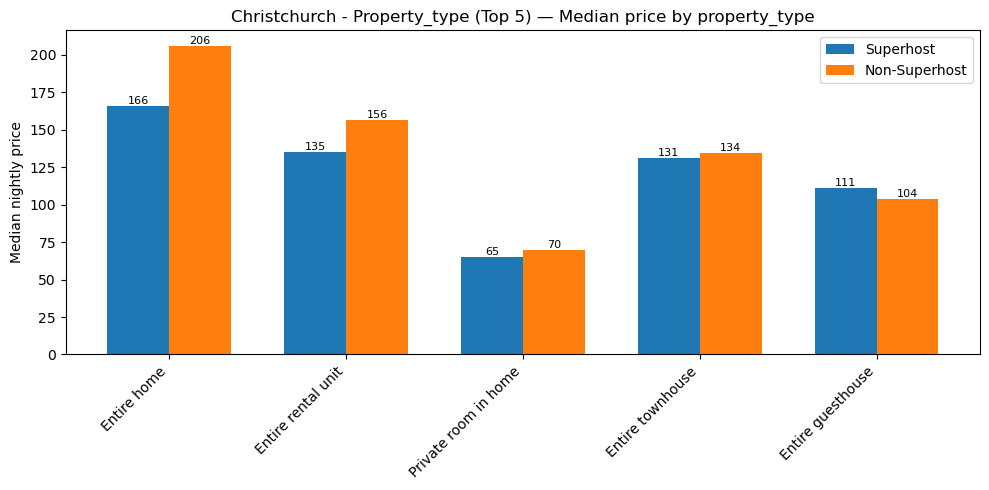

In [1155]:
def plot_type_price_bars(df, title_prefix="Christchurch - Property_type (Top 5)"):
    stats = (
        df.groupby(["property_type", "group"])[PRICE]
          .agg(mean_price="mean", median_price="median", count="size")
          .reset_index()
    )

    # by count
    order = (
        stats.groupby("property_type")["count"]
             .sum()
             .sort_values(ascending=False)
             .index
    )
    stats["property_type"] = pd.Categorical(
        stats["property_type"], categories=order, ordered=True
    )
    stats = stats.sort_values(["property_type", "group"])

    print("\nPrice summary by property_type (Top 5, Christchurch):")
    display(
        stats.pivot(index="property_type", columns="group", values=["mean_price", "median_price"])
             .style.format("{:.2f}")
    )

    types = order.tolist()
    x = np.arange(len(types))
    width = 0.35

    def _bar_for_metric(metric, ylabel, title_suffix):
        plt.figure(figsize=(10, 5))
        super_vals = []
        non_vals   = []
        for t in types:
            tmp = stats[stats["property_type"] == t]
            super_vals.append(
                tmp.loc[tmp["group"] == "Superhost", metric].values[0]
                if "Superhost" in tmp["group"].values else np.nan
            )
            non_vals.append(
                tmp.loc[tmp["group"] == "Non-Superhost", metric].values[0]
                if "Non-Superhost" in tmp["group"].values else np.nan
            )

        plt.bar(x - width/2, super_vals, width, label="Superhost")
        plt.bar(x + width/2, non_vals,   width, label="Non-Superhost")

        plt.xticks(x, types, rotation=45, ha="right")
        plt.ylabel(ylabel)
        plt.title(f"{title_prefix} — {title_suffix}")
        plt.legend()

        for i, v in enumerate(super_vals):
            if not np.isnan(v):
                plt.text(x[i] - width/2, v, f"{v:.0f}", ha="center", va="bottom", fontsize=8)
        for i, v in enumerate(non_vals):
            if not np.isnan(v):
                plt.text(x[i] + width/2, v, f"{v:.0f}", ha="center", va="bottom", fontsize=8)

        plt.tight_layout()
        plt.show()

    # median price
    _bar_for_metric("median_price", "Median nightly price", "Median price by property_type")


plot_type_price_bars(chch_top, title_prefix="Christchurch - Property_type (Top 5)")

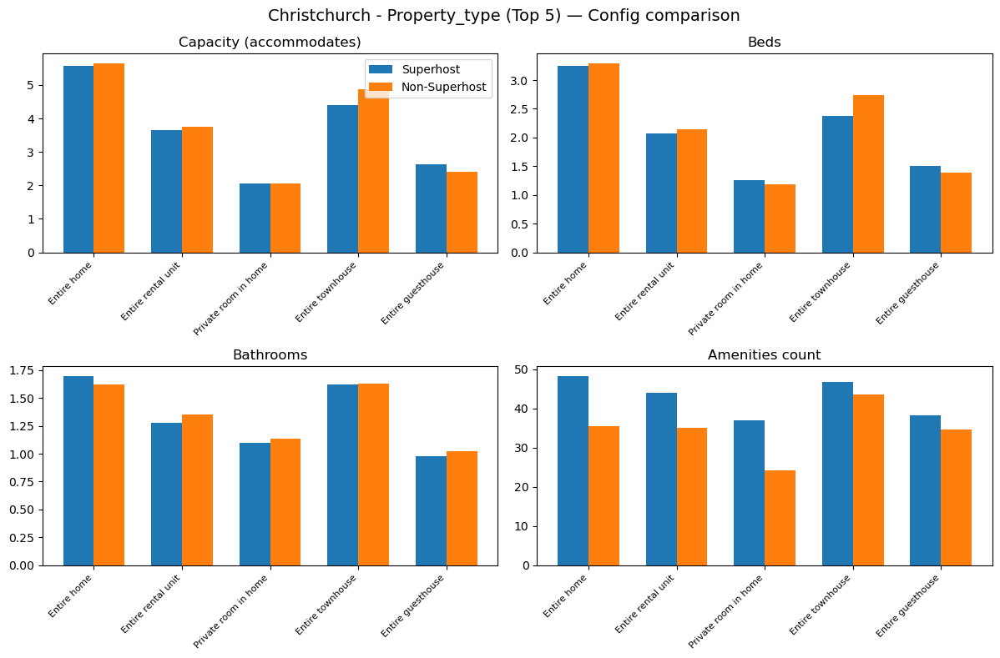

In [1156]:
def plot_type_config_bars(df, title_prefix="Christchurch - Property_type (Top 5)"):
    metrics = [
        ("accommodates",    "Capacity (accommodates)"),
        ("beds",            "Beds"),
        ("bathrooms",       "Bathrooms"),
        ("amenities_count", "Amenities count"),
    ]

    stats_cfg = (
        df.groupby(["property_type", "group"])[[m[0] for m in metrics]]
          .mean()
          .reset_index()
    )

    order = (
        df["property_type"]
          .value_counts()
          .loc[stats_cfg["property_type"].unique()]
          .sort_values(ascending=False)
          .index
    )
    stats_cfg["property_type"] = pd.Categorical(
        stats_cfg["property_type"], categories=order, ordered=True
    )
    stats_cfg = stats_cfg.sort_values(["property_type", "group"])

    types = order.tolist()
    x = np.arange(len(types))
    width = 0.35

    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    fig.suptitle(f"{title_prefix} — Config comparison", fontsize=14)
    axes = axes.ravel()

    for ax, (col, label) in zip(axes, metrics):
        super_vals = []
        non_vals   = []
        for t in types:
            tmp = stats_cfg[stats_cfg["property_type"] == t]
            super_vals.append(
                tmp.loc[tmp["group"] == "Superhost", col].values[0]
                if "Superhost" in tmp["group"].values else np.nan
            )
            non_vals.append(
                tmp.loc[tmp["group"] == "Non-Superhost", col].values[0]
                if "Non-Superhost" in tmp["group"].values else np.nan
            )

        ax.bar(x - width/2, super_vals, width, label="Superhost")
        ax.bar(x + width/2, non_vals,   width, label="Non-Superhost")
        ax.set_title(label)
        ax.set_xticks(x)
        ax.set_xticklabels(types, rotation=45, ha="right", fontsize=8)

    axes[0].legend(loc="upper right")
    plt.tight_layout()
    plt.show()
    
plot_type_config_bars(chch_top, title_prefix="Christchurch - Property_type (Top 5)")

In [1157]:
report='''
This section compares the structural distribution, price differences, and configuration differences of different property types in Christchurch. 

Overall, the two groups have a similar proportion of Entire Homes (Superhost 34.69% vs Non-Superhost 33.51%),
but Superhosts are more concentrated in "independently rented, more standardized" properties such as Entire Rental Units, 
while Non-Superhosts have a higher proportion of Other and Private Room in Home properties. 
Specifically, Superhosts have a 22.68% proportion of Entire Rental Units (compared to 16.09% for Non-Superhosts), 
and also a higher proportion of Entire Townhouses (8.71% vs 6.79%) and Entire Guesthouses (6.11% vs 3.40%). 
Conversely, Non-Superhosts have a significantly higher proportion of Other properties (26.18% vs 17.84%) 
and Private Room in Home properties (14.03% vs 9.97%). 

The bar chart also supports this structure: Superhosts have an advantage in Entire Homes (494 vs 375) and Entire Rental Units (323 vs 180), 
while Non-Superhosts have an advantage in "Other" (293 vs 254).

Regarding price (see median), Christchurch presents a very consistent conclusion: Superhosts have a lower median price across almost all room types, 
with no stable premium. For example, Entire Homes dropped from 206 to 166, Entire Rental Units from 156.5 to 135, Other from 147 to 121.5, 
Private Room in Home from 70 to 65, and Entire Townhouses were also slightly lower (131 vs 134.5). 

The only exception is Entire Guesthouses, where Superhosts actually have a higher median price (111 vs 103.5), 
but the sample size for this category is small (only 38 for Non-Superhosts), so caution is advised when interpreting this. 
The differences in configuration further illustrate that Superhost's advantage lies more in "experience/quality":
Superhost offers a higher number of amenities across all room types (Entire home 48.33 vs 35.41, rental unit 43.91 vs 34.99, private room 36.94 vs 24.29).

While the differences in "space size indicators" such as accommodations/beds/bedrooms/baths are generally small, 
with some non-Superhost rooms even slightly larger, the price remains higher. 

In summary, Christchurch concludes that Superhost achieves stable bookings and positive reviews through better amenities 
and more cost-effective pricing strategies, rather than relying on being "more expensive" to demonstrate its advantage.
'''
print(report)


This section compares the structural distribution, price differences, and configuration differences of different property types in Christchurch. 

Overall, the two groups have a similar proportion of Entire Homes (Superhost 34.69% vs Non-Superhost 33.51%),
but Superhosts are more concentrated in "independently rented, more standardized" properties such as Entire Rental Units, 
while Non-Superhosts have a higher proportion of Other and Private Room in Home properties. 
Specifically, Superhosts have a 22.68% proportion of Entire Rental Units (compared to 16.09% for Non-Superhosts), 
and also a higher proportion of Entire Townhouses (8.71% vs 6.79%) and Entire Guesthouses (6.11% vs 3.40%). 
Conversely, Non-Superhosts have a significantly higher proportion of Other properties (26.18% vs 17.84%) 
and Private Room in Home properties (14.03% vs 9.97%). 

The bar chart also supports this structure: Superhosts have an advantage in Entire Homes (494 vs 375) and Entire Rental Units (323 vs 180),

In [1167]:
report='''
Branch A Final Conclusion

Analyzing Airbnb'response behavior, reputation, and listing supply structure, 
Superhost's advantage lies not in higher prices or offering larger properties, but in "being more consistent, more trustworthy, 
and delivering higher-quality experiences with stronger ongoing demand." 

After adjusting for extreme values using IQR (Individual Quality Rate), 
the average/median price of non-Superhost is actually higher (approximately 10–13% higher), 
while Superhost is more concentrated in the mid-price range (approximately NZD 105–215). 

Meanwhile, Superhost significantly outperforms in "actionable tenant occupancy quality indicators":
differences in cleanliness, overall rating, value for money, and description accuracy reach a moderate effect size; 
and it consistently leads in review activity over the past 30 days/12 months, indicating that it not only has "high ratings" 
but also "continuous occupancy and reviews." 

On the Airbnb behavior side (response rate/response time/acceptance rate), a clear "threshold effect" is observed: 
Superhost almost always achieves near-perfect responses and faster turnaround times; 
Instant bookability is only a minor bonus. 

On the host side, trust signals (avatar, identity verification, multiple verification methods) 
and "years of operation" significantly increase the probability of becoming a Superhost. 
Among these, data completeness shows a clear leap in improvement (from low to high completeness, the Superhost ratio can double or even more).


Influencing Factors Ranking (from strongest to weakest) + Reasons

1) Reputation Quality (Ratings: especially Cleanliness / Overall / Value / Accuracy)
This has the strongest impact because a Welch t-test + Hedges' g was conducted: Cleanliness, overall rating, value, and accuracy 
all reached a moderate effect size (~0.4–0.46), 
which is not only statistically significant but also controllable, actionable, and closest to the "Superhost rating /core user experience" indicators.

Conclusion: Stabilizing the tenant's stay experience (especially cleanliness and information accuracy) is more effective than raising prices.

2) Reviews (Review activity: monthly / last 12 months / last 30 days)
Very strong because it directly reflects "continuous stays + continuous satisfaction". 
The results show that Superhosts have significantly higher review counts per property, monthly review speed, 
and new reviews in the last 30 days across different property sizes; Non-Superhosts often have close to zero reviews in the last 30 days, 
indicating "declining demand/weak exposure conversion."

Conclusion: Becoming a Superhost is not just about high ratings, but also about "consistent occupancy and consistent reviews."

3) Response time and Response rate – Threshold factors
These two are typical thresholds: Superhosts have an extremely high "response within 1 hour" rate (your data is approximately 83% vs 52%), 
and "slow responses/missing records (many NaNs)" are almost concentrated on Non-Superhosts. 
Regarding response rates, Superhosts generally maintain a rate between 99-100%, with low response rates almost exclusively appearing on Non-Superhosts.

Conclusion: Achieving fast and stable responses is a threshold.

4) Profile completeness/trust signals (avatar + identity verification + multiple verifications)
Strong and controllable. They from 0 to 3 in completeness rating corresponds to a significant improvement in the Superhost percentage,from 19% to 61%. 
Furthermore, it was observed that "the profile picture has a more direct impact than additional verification,"
with verification acting as a "positive signal," but not a substitute for basic trust.

Conclusion: Trust signals are the first step towards "low-cost, high-return" results.

5) Acceptance Rate
Moderately strong, but more like a "negative filter": Non-Superhosts have a large number of low acceptance rates (0-80%, as you mentioned, around 28%), 
while Superhosts have very few (around 4-5%). However, "100% acceptance" is common in both categories, indicating it's not a sufficient condition.

Conclusion: Don't "choose very low acceptance rates," but even 100% doesn't guarantee success.

6) Amenities Level (Amenities Count)
Structural differences are significant: Superhosts are heavily concentrated in those with 36+ amenities (approximately 65.7% vs 41.9%), 
while those with fewer than 10 amenities are almost exclusively found in non-Superhosts. 
Moreover, within the same amenities category, Superhosts are often cheaper,
indicating their advantage comes from "better configuration/consistency of experience," not necessarily higher prices.

Conclusion: Amenities are the "hardware foundation" of the experience.

7) Property/Room Type and  Accommodates
These are more like "structural factors/operational complexity," and vary between cities: 
for example, in some cities, Superhosts tend to be more focused on "independent whole-room rentals/more standardized types," 
while non-Superhosts have a higher proportion of private rooms; in terms of capacity, 
Superhosts are more concentrated in small to medium-sized properties, 
while very large-capacity properties are more likely to experience greater fluctuations and complex services.

Conclusion: These factors influence "stability and ease of operation," but do not necessarily determine "whether one can become a Superhost."

8) Price – Weak
The overall conclusion is very consistent: after IQR, the average/median price of non-Superhosts is higher, 
while Superhosts are more concentrated in the "sweet spot" of 105–215,
with a decrease in the proportion of Superhosts in the high-price range (≥310, especially ≥480).

Conclusion: Superhosts rely not on premium pricing, but on "cost-effectiveness + stable experience + word-of-mouth momentum."


Advice for New Hosts: If your goal is to become a Superhost, you can divide your strategy into three layers: 
Getting Started → Core Factors → Structural Optimization.

The first layer (Getting Started) is to ensure your platform response behavior is**** : maintain a consistently stable response rate of 99–100%, 
ideally responding within one hour; keep your order acceptance rate at least at a medium-high level (avoiding long-term <80%). 
Instant Book can be optimized, but it's not crucial.

The second layer (core factors) focuses on →improving the quality of reviews: prioritizing cleanliness 
(accurate Airbnb descriptions to avoid poor actual check-in experience);

→ Enhancing Value for Money (different levels of property can provide corresponding amenities or services);

→ Communication and check-in process (automatic reply messages, clear instructions, contactless self-service).

Simultaneously, it's crucial to "obtain reviews and maintain momentum": 
follow up after check-in and politely remind guests to review their reviews 6-12 hours after check-out.
The goal is at least one review per property per month, at least 6 reviews in the last 12 months, and as many new reviews as possible in the last 30 days.

The third layer (structural optimization) employs a more "stable" listing and pricing strategy: 
Initially, new hosts are advised to price their properties at the best value for money 
(different property levels should be priced reasonably according to their features), avoiding overpricing from the start;

Next, amenities is priority , gradually upgrading them to higher-end levels with "superior configurations."
A more comfortable experience can improve ratings and repeat customer rates.

Finally, complete all the information at once: clear profile picture, identity verification, 
and at least multiple verification methods—this is a low-cost action that can significantly boost trust and conversion rates.
'''
print(report)


Branch A Final Conclusion

Analyzing Airbnb'response behavior, reputation, and listing supply structure, 
Superhost's advantage lies not in higher prices or offering larger properties, but in "being more consistent, more trustworthy, 
and delivering higher-quality experiences with stronger ongoing demand." 

After adjusting for extreme values using IQR (Individual Quality Rate), 
the average/median price of non-Superhost is actually higher (approximately 10–13% higher), 
while Superhost is more concentrated in the mid-price range (approximately NZD 105–215). 

Meanwhile, Superhost significantly outperforms in "actionable tenant occupancy quality indicators":
differences in cleanliness, overall rating, value for money, and description accuracy reach a moderate effect size; 
and it consistently leads in review activity over the past 30 days/12 months, indicating that it not only has "high ratings" 
but also "continuous occupancy and reviews." 

On the Airbnb behavior side (response rate

In [1159]:
#market time vs host vs property

In [1285]:
report='''
Branch B – Market ↔ Features: How each feature associates with Market.
Branch B aims to analyze the relationship between different characteristics and market fluctuations from the perspective of market changes over time. 
This section treats COVID-19 time as the market timeline, and the market impact is characterized by a set of outcome indicators,
such as: price level (ADR/price), availability, booking, review and the fluctuation range of these indicators over different time periods. 

To answer the question "How does time affect the market, and how does this impact interact with host/property characteristics?", 
we proceed along two main lines:
    1. Time × Property (Market Impact from a Airbnb Dimension): This focuses on analyzing whether the supply structure 
    (room/property type, capacity/number of bedrooms, facility level) undergoes structural changes over time. 
    
    It also compares price and availability changes across different housing segments during seasons,
    identifying segments more sensitive to fluctuations and those more stable.

    2. Property × Host (Market Impact from the Host Perspective): 
    This section explores whether hosts exhibit systematic seasonal variations, including response rates, response times, 
    acceptance rates,instant booking status, and broader metrics such as host tenure. 
    

Overall, Branch B aims to distinguish between structural factors (who supplies and what they provide) 
and time factors(when demand is high and how volatile it is), 
and to identify the host and property characteristics most strongly correlated with market changes over different time periods.
'''
print(report)


Branch B – Market ↔ Features: How each feature associates with Market.
Branch B aims to analyze the relationship between different characteristics and market fluctuations from the perspective of market changes over time. 
This section treats COVID-19 time as the market timeline, and the market impact is characterized by a set of outcome indicators,
such as: price level (ADR/price), availability, booking, review and the fluctuation range of these indicators over different time periods. 

To answer the question "How does time affect the market, and how does this impact interact with host/property characteristics?", 
we proceed along two main lines:
    1. Time × Property (Market Impact from a Airbnb Dimension): This focuses on analyzing whether the supply structure 
    (room/property type, capacity/number of bedrooms, facility level) undergoes structural changes over time. 
    
    It also compares price and availability changes across different housing segments during seasons,
    id

In [1205]:
report='''
Branch B.1 Time × property: Analyzing Market Dynamics Through Housing Structure

This section begins by analyzing the impact of time on the NZ Airbnb market and examining market changes from the perspective of property structure.

We first establish a timeline: 2016-2019 (the three years before COVID-19); 2019-2022 (the COVID-19 range); 
2022-2025 (the three years after COVID-19 ends) to analyze the annual changes in NZ Airbnb listings (new list, and delisted listings).

Next, we examine how the composition of property supply has evolved over time by tracking changes in room type, property type, 
and room configuration variables ( number of guests, number of bedrooms, number of beds, number of bathrooms, and amenities level). 

We then extend the analysis to a location-based perspective by linking housing structure and market outcomes to spatial patterns.

Specifically, we track how entries (new listings) and exits are distributed across regional areas (region_parent) 
and neighbourhoods over the three periods, 
and examine whether supply expansion is concentrated in major cities and key tourist destinations or becomes more geographically diversified.

Finally, we relate these location patterns to key market indicators (nightly price, availability/occupancy proxy, and rating momentum) 
to interpret how regional demand strength and market dynamics shape where new supply enters and where exits are more likely to occur.
'''
print(report)


Branch B.1 Time × property: Analyzing Market Dynamics Through Housing Structure

This section begins by analyzing the impact of time on the housing market and examining market changes from the perspective of property structure.

We first establish a timeline: 2016-2019 (the three years before COVID-19); 2019-2022 (the COVID-19 range); 
2022-2025 (the three years after COVID-19 ends) to analyze the annual changes in NZ Airbnb listings (existing, new, and delisted listings).

Next, we examine how the composition of property supply has evolved over time by tracking changes in room type, property type, 
and room configuration variables ( number of guests, number of bedrooms, number of beds, number of bathrooms, and amenities level). 
We then correlate these structural patterns with key market indicators (nightly price, availability/occupancy rate, and rating momentum) 
to assess which housing segments exhibit stronger seasonality (greater fluctuations between peak and off-peak seasons)
an

In [1256]:
print('Time range')

Time range


In [1206]:
# parse dates
d = df.copy()
for c in ["first_review", "last_review", "host_since", "last_scraped"]:
    if c in df.columns:
        df[c] = pd.to_datetime(df[c], errors="coerce")

snapshot_date = df["last_scraped"].max()  


df["first_view"] = df["first_review"].fillna(df["host_since"])
df["last_view"]  = df["last_review"]          # listing activity proxy

df["first_view_year"] = df["first_view"].dt.year
df["last_view_year"]  = df["last_view"].dt.year

# periods
def period3(y):
    if pd.isna(y):
        return np.nan
    y = int(y)
    if 2016 <= y <= 2018:
        return "Pre-COVID (2016–2018)"
    elif 2019 <= y <= 2022:
        return "COVID (2019–2022)"
    elif 2023 <= y <= 2025:
        return "Post-COVID (2023–2025)"
    else:
        return "Out of window"

df["period3"] = df["first_view_year"].apply(period3)
df["period3"] = pd.Categorical(
    df["period3"],
    categories=["Pre-COVID (2016–2018)", "COVID (2019–2022)", "Post-COVID (2023–2025)", "Out of window"],
    ordered=True
)


df["last_view_month"]   = df["last_view"].dt.month
df["last_view_quarter"] = df["last_view"].dt.quarter

df["last_view_season"] = np.select(
    [
        df["last_view_month"].isin([12, 1, 2]),
        df["last_view_month"].isin([3, 4, 5]),
        df["last_view_month"].isin([6, 7, 8]),
        df["last_view_month"].isin([9, 10, 11]),
    ],
    ["Summer", "Autumn", "Winter", "Spring"],
    default="Unknown"  
)

print("snapshot_date =", snapshot_date.date() if pd.notna(snapshot_date) else snapshot_date)
print(df["period3"].value_counts(dropna=False))

snapshot_date = 2025-09-23
period3
Post-COVID (2023–2025)    23848
COVID (2019–2022)         13337
Pre-COVID (2016–2018)      7947
Out of window              1964
NaN                           1
Name: count, dtype: int64


In [1257]:
report='''
This output shows that dataset’s latest scrape date (snapshot_date) is 2025-09-23, 
and it groups listings by their first observed year (first_view = first_review if available else host_since) into three time windows. 

Most listings first appear in the Post-COVID period (2023–2025: 23,848), followed by COVID (2019–2022: 13,337) and Pre-COVID (2016–2018: 7,947);
1,964 listings fall outside 2016–2025 (or have missing first_view year and get treated as out-of-window).
'''
print(report)


This output shows that dataset’s latest scrape date (snapshot_date) is 2025-09-23, 
and it groups listings by their first observed year (first_view = first_review if available else host_since) into three time windows. 

Most listings first appear in the Post-COVID period (2023–2025: 23,848), followed by COVID (2019–2022: 13,337) and Pre-COVID (2016–2018: 7,947);
1,964 listings fall outside 2016–2025 (or have missing first_view year and get treated as out-of-window).



snapshot_date = 2025-09-23 00:00:00

=== [1/4] Superhost: Yearly listing change (entries vs exits proxy) ===


,year,period,entries (new property),exits property,market_change,total_listings_year_start,total_listings_year_end,inventory_end_proxy
0,2016,Pre-COVID (2016–2019),"1,022",1,"1,021",803,"1,824","1,824"
1,2017,Pre-COVID (2016–2019),"1,217",0,"1,217","1,824","3,041","3,041"
2,2018,Pre-COVID (2016–2019),"1,465",1,"1,464","3,041","4,505","4,505"
3,2019,Pre-COVID (2016–2019),"1,690",2,"1,688","4,505","6,193","6,193"
4,2020,COVID-era (2019–2022),"1,379",4,"1,375","6,193","7,568","7,568"
5,2021,COVID-era (2019–2022),"1,437",6,"1,431","7,568","8,999","8,999"
6,2022,COVID-era (2019–2022),"2,177",16,"2,161","8,999","11,160","11,160"
7,2023,Post-COVID (2022–2025),"3,530",31,"3,499","11,160","14,659","14,659"
8,2024,Post-COVID (2022–2025),"4,927",91,"4,836","14,659","19,495","19,495"
9,2025,Post-COVID (2022–2025),"2,444",0,"2,444","19,495","21,939","21,939"


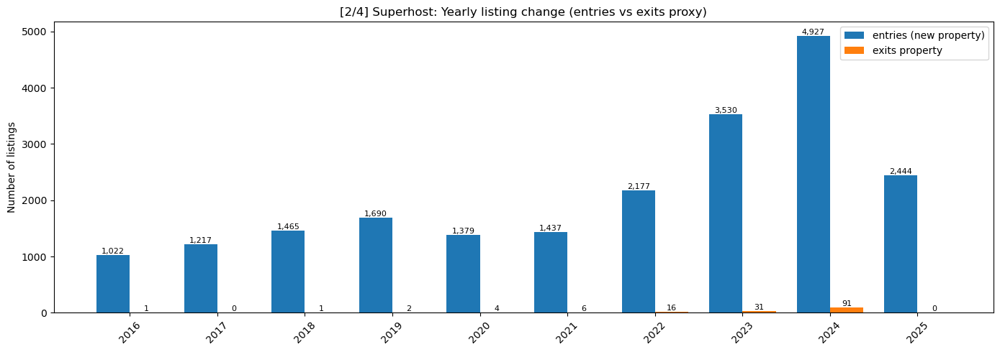


=== [3/4] Non-Superhost: Yearly listing change (entries vs exits proxy) ===


,year,period,entries (new property),exits property,market_change,total_listings_year_start,total_listings_year_end,inventory_end_proxy
0,2016,Pre-COVID (2016–2019),"1,155",7,"1,148","1,154","2,302","2,302"
1,2017,Pre-COVID (2016–2019),"1,549",12,"1,537","2,302","3,839","3,839"
2,2018,Pre-COVID (2016–2019),"1,539",21,"1,518","3,839","5,357","5,357"
3,2019,Pre-COVID (2016–2019),"1,737",29,"1,708","5,357","7,065","7,065"
4,2020,COVID-era (2019–2022),"1,342",47,"1,295","7,065","8,360","8,360"
5,2021,COVID-era (2019–2022),"1,466",58,"1,408","8,360","9,768","9,768"
6,2022,COVID-era (2019–2022),"2,109",143,"1,966","9,768","11,734","11,734"
7,2023,Post-COVID (2022–2025),"3,518",356,"3,162","11,734","14,896","14,896"
8,2024,Post-COVID (2022–2025),"4,682",628,"4,054","14,896","18,950","18,950"
9,2025,Post-COVID (2022–2025),"4,747",0,"4,747","18,950","23,697","23,697"


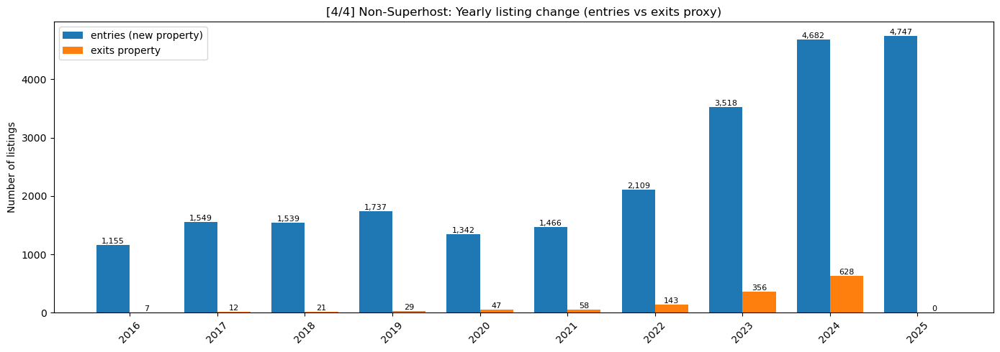

In [1267]:
#superhost market change
def detect_col(columns, candidates):
    norm = {c.lower().replace("_", ""): c for c in columns}
    for cand in candidates:
        key = cand.lower().replace("_", "")
        if key in norm:
            return norm[key]
    for cand in candidates:
        key = cand.lower().replace("_", "")
        for k, c in norm.items():
            if key in k:
                return c
    return None

def bool01(s):
    mapping = {
        "t": 1, "true": 1, "1": 1, "y": 1, "yes": 1,
        "f": 0, "false": 0, "0": 0, "n": 0, "no": 0,
    }
    return (
        s.astype(str).str.strip().str.lower()
        .map(mapping).fillna(0).astype("int8")
    )

def clean_price_to_numeric(s):
    return pd.to_numeric(
        s.astype(str)
         .str.replace(r"[\$,]", "", regex=True)
         .str.replace(" ", "", regex=False),
        errors="coerce",
    )

def to_dt(s):
    return pd.to_datetime(s, errors="coerce", utc=False)


d=df.copy()

PRICE = detect_col(df.columns, ["price", "nightly_price", "listing_price"])
SUPER = detect_col(df.columns, ["is_super", "host_is_superhost", "is_superhost"])
ID_COL = detect_col(df.columns, ["id", "listing_id", "listingid"]) or df.columns[0]

FIRST_REVIEW = detect_col(df.columns, ["first_review"])
HOST_SINCE   = detect_col(df.columns, ["host_since"])
LAST_REVIEW  = detect_col(df.columns, ["last_review"])

REV_LTM      = detect_col(df.columns, ["number_of_reviews_ltm"])
AVAIL_365    = detect_col(df.columns, ["availability_365"])

# superhost flag
if SUPER is None:
    raise ValueError("Could not find superhost flag column (host_is_superhost / is_superhost).")
d["is_super"] = bool01(d[SUPER])
d["group"] = d["is_super"].map({1: "Superhost", 0: "Non-Superhost"})

# price numeric
if PRICE is not None:
    d[PRICE] = clean_price_to_numeric(d[PRICE])

# parse time 
if FIRST_REVIEW is not None:
    d[FIRST_REVIEW] = to_dt(d[FIRST_REVIEW])
if HOST_SINCE is not None:
    d[HOST_SINCE] = to_dt(d[HOST_SINCE])
if LAST_REVIEW is not None:
    d[LAST_REVIEW] = to_dt(d[LAST_REVIEW])


LAST_SCRAPED = detect_col(d.columns, ["last_scraped", "calendar_last_scraped"])
if LAST_SCRAPED is not None:
    d[LAST_SCRAPED] = to_dt(d[LAST_SCRAPED])
    snapshot_date = d[LAST_SCRAPED].dropna().max()
else:
    snapshot_date = pd.Timestamp("2025-09-23")  # fallback (you can edit)

snapshot_date = pd.to_datetime(snapshot_date).to_pydatetime()
snapshot_date = pd.Timestamp(snapshot_date)

print("snapshot_date =", snapshot_date)

#Entry year definition 

if FIRST_REVIEW is None and HOST_SINCE is None:
    raise ValueError("Need at least first_review or host_since to define entry.")

d["entry_date"] = pd.NaT
d["entry_source"] = pd.NA

if FIRST_REVIEW is not None:
    m = d[FIRST_REVIEW].notna()
    d.loc[m, "entry_date"] = d.loc[m, FIRST_REVIEW]
    d.loc[m, "entry_source"] = "first_review"

if HOST_SINCE is not None:
    m = d["entry_date"].isna() & d[HOST_SINCE].notna()
    d.loc[m, "entry_date"] = d.loc[m, HOST_SINCE]
    d.loc[m, "entry_source"] = "host_since"

d["entry_year"] = d["entry_date"].dt.year

# Exit proxy 

d["inactive_exit_proxy"] = False

if LAST_REVIEW is not None:
    months_12_ago = snapshot_date - pd.DateOffset(months=12)
    cond_last_old = d[LAST_REVIEW].notna() & (d[LAST_REVIEW] < months_12_ago)
else:
    cond_last_old = pd.Series(False, index=d.index)

if REV_LTM is not None:
    rev_ltm_num = pd.to_numeric(d[REV_LTM], errors="coerce").fillna(0)
    cond_no_recent_reviews = (rev_ltm_num == 0)
else:
    cond_no_recent_reviews = pd.Series(True, index=d.index)  

if AVAIL_365 is not None:
    avail_num = pd.to_numeric(d[AVAIL_365], errors="coerce")
    cond_high_avail = avail_num.notna() & (avail_num >= 300)
else:
    cond_high_avail = pd.Series(True, index=d.index)

d["inactive_exit_proxy"] = cond_last_old & cond_no_recent_reviews & cond_high_avail

# exit year proxy 
if LAST_REVIEW is not None:
    d["exit_year_proxy"] = np.where(
        d["inactive_exit_proxy"] & d[LAST_REVIEW].notna(),
        d[LAST_REVIEW].dt.year,
        np.nan
    )
else:
    d["exit_year_proxy"] = np.nan


# Build yearly table
YEARS = list(range(2016, 2026))
d["entry_year"] = d["entry_year"].astype("Int64")
d["exit_year_proxy_int"] = pd.to_numeric(d["exit_year_proxy"], errors="coerce").astype("Int64")

def tag_period(y):
    if 2016 <= y <= 2019:
        return "Pre-COVID (2016–2019)"
    if 2019 <= y <= 2022:
        return "COVID-era (2019–2022)"
    if 2022 <= y <= 2025:
        return "Post-COVID (2022–2025)"
    return "Other"

MIN_YEAR = YEARS[0]  # 2016

def build_yearly_for(group_mask):
    g = d.loc[group_mask].copy()

    #baseline: entry_year < 2016 
    pre = g[g["entry_year"].notna() & (g["entry_year"] < MIN_YEAR)].copy()
    still_possible_active = pre["exit_year_proxy_int"].isna() | (pre["exit_year_proxy_int"] >= MIN_YEAR)
    base_inventory = pre.loc[still_possible_active, ID_COL].nunique()

    entries_y = (g.groupby("entry_year")[ID_COL]
                   .nunique()
                   .reindex(YEARS, fill_value=0))

    exits_y = (g.loc[g["inactive_exit_proxy"] & g["exit_year_proxy_int"].notna()]
                 .groupby("exit_year_proxy_int")[ID_COL]
                 .nunique()
                 .reindex(YEARS, fill_value=0))

    yearly = pd.DataFrame({
        "year": YEARS,
        "entries (new property)": entries_y.values,
        "exits property": exits_y.values,
    })

    yearly["market_change"] = yearly["entries (new property)"] - yearly["exits property"]
    yearly["inventory_end_proxy"] = base_inventory + yearly["market_change"].cumsum()
    yearly["total_listings_year_start"] = yearly["inventory_end_proxy"].shift(1, fill_value=base_inventory)
    yearly["total_listings_year_end"]   = yearly["inventory_end_proxy"]

    yearly["period"] = yearly["year"].apply(tag_period)

    return yearly[[
        "year","period",
        "entries (new property)","exits property","market_change",
        "total_listings_year_start","total_listings_year_end",
        "inventory_end_proxy"
    ]]

    
def plot_entries_exits(yearly, title):
    x = np.arange(len(YEARS))
    width = 0.38

    entries_vals = yearly["entries (new property)"].values.astype(float)
    exits_vals   = yearly["exits property"].values.astype(float)

    plt.figure(figsize=(14, 5))
    b1 = plt.bar(x - width/2, entries_vals, width, label="entries (new property)")
    b2 = plt.bar(x + width/2, exits_vals,   width, label="exits property")

    plt.xticks(x, YEARS, rotation=45)
    plt.ylabel("Number of listings")
    plt.title(title)
    plt.legend()

    def add_bar_labels(bars):
        for bar in bars:
            h = bar.get_height()
            plt.text(
                bar.get_x() + bar.get_width()/2,
                h,
                f"{int(h):,}",
                ha="center", va="bottom", fontsize=8
            )

    add_bar_labels(b1)
    add_bar_labels(b2)

    plt.tight_layout()
    plt.show()


# Superhost table
yearly_super = build_yearly_for(d["is_super"] == 1)
print("\n=== [1/4] Superhost: Yearly listing change (entries vs exits proxy) ===")
display(
    yearly_super.style.format({
        "entries (new property)": "{:,.0f}",
        "exits property": "{:,.0f}",
        "market_change": "{:,.0f}",
        "total_listings_year_start": "{:,.0f}",
        "total_listings_year_end": "{:,.0f}",
        "inventory_end_proxy": "{:,.0f}",
    })
)

# Superhost bar chart 
plot_entries_exits(yearly_super, "[2/4] Superhost: Yearly listing change (entries vs exits proxy)")


# Non-Superhost table
yearly_non = build_yearly_for(d["is_super"] == 0)
print("\n=== [3/4] Non-Superhost: Yearly listing change (entries vs exits proxy) ===")
display(
    yearly_non.style.format({     
        "entries (new property)": "{:,.0f}",
        "exits property": "{:,.0f}",
        "market_change": "{:,.0f}",
        "total_listings_year_start": "{:,.0f}",
        "total_listings_year_end": "{:,.0f}",
        "inventory_end_proxy": "{:,.0f}",
    })
)

# Non-Superhost bar chart
plot_entries_exits(yearly_non, "[4/4] Non-Superhost: Yearly listing change (entries vs exits proxy)")

ENT = "entries (new property)"
EXT = "exits property"

In [1268]:
report='''
1.From 2016 to 2025, both superhosts and non-superhosts exhibited an expansion trend where "new listings far outnumbered exits from the market (proxy)": 
Superhosts saw rapid net growth each year, with existing listings increasing from 803 at the beginning of 2016 to 21,939 at the end of 2025
(4,927 new listings, 91 exits, and a net increase of 4,836 in 2024).

2.Non-Superhosts also experienced rapid growth, but the number of exits from the market was significantly larger,
especially in 2023–2024 (356 exits in 2023; 628 exits in 2024).
Existing listings increased from 1,154 at the beginning of 2016 to 23,697 at the end of 2025; of which 4,682 were new listings and 628 exits in 2024,
resulting in a net increase of 4,054.

3.Furthermore, the fact that both groups of exits were 0 in 2025 is mainly because exits are more difficult to fully identify in 2025. 
Therefore, the interpretation of the "exit rate" in 2025 should be approached with caution.
'''
print(report)


1.From 2016 to 2025, both superhosts and non-superhosts exhibited an expansion trend where "new listings far outnumbered exits from the market (proxy)": 
Superhosts saw rapid net growth each year, with existing listings increasing from 803 at the beginning of 2016 to 21,939 at the end of 2025
(4,927 new listings, 91 exits, and a net increase of 4,836 in 2024).

2.Non-Superhosts also experienced rapid growth, but the number of exits from the market was significantly larger,
especially in 2023–2024 (356 exits in 2023; 628 exits in 2024).
Existing listings increased from 1,154 at the beginning of 2016 to 23,697 at the end of 2025; of which 4,682 were new listings and 628 exits in 2024,
resulting in a net increase of 4,054.

3.Furthermore, the fact that both groups of exits were 0 in 2025 is mainly because exits are more difficult to fully identify in 2025. 
Therefore, the interpretation of the "exit rate" in 2025 should be approached with caution.



In [1266]:
# overall (all listings) yearly
mask_all = pd.Series(True, index=d.index)
yearly_all = build_yearly_for(mask_all).set_index("year")

def add_shares(yearly_df, group_name):
    y = yearly_df.copy().set_index("year")


    ent_total = y[ENT].sum()
    ext_total = y[EXT].sum()
    y[f"entries_share_in_{group_name}"] = y[ENT] / ent_total if ent_total else np.nan
    y[f"exits_share_in_{group_name}"]   = y[EXT] / ext_total if ext_total else np.nan


    y[f"entries_share_in_year"] = y[ENT] / yearly_all[ENT].replace(0, np.nan)
    y[f"exits_share_in_year"]   = y[EXT] / yearly_all[EXT].replace(0, np.nan)


    y[f"entries_share_within_period_{group_name}"] = (
        y.groupby("period")[ENT].transform(lambda s: s / s.sum() if s.sum() else np.nan)
    )
    y[f"exits_share_within_period_{group_name}"] = (
        y.groupby("period")[EXT].transform(lambda s: s / s.sum() if s.sum() else np.nan)
    )

    return y.reset_index()

yearly_super_s = add_shares(yearly_super, "superhost")
yearly_non_s   = add_shares(yearly_non, "non_superhost")

share_cols_super = [
    "year", "period",
    "entries_share_in_year", "exits_share_in_year",
    "entries_share_in_superhost", "exits_share_in_superhost",
    "entries_share_within_period_superhost", "exits_share_within_period_superhost",
]

share_cols_non = [
    "year", "period",
    "entries_share_in_year", "exits_share_in_year",
    "entries_share_in_non_superhost", "exits_share_in_non_superhost",
    "entries_share_within_period_non_superhost", "exits_share_within_period_non_superhost",
]

fmt_share = {c: "{:.2%}" for c in (set(share_cols_super + share_cols_non) - {"year", "period"})}

print("\n=== Superhost shares only ===")
display(yearly_super_s[share_cols_super].style.format(fmt_share))

print("\n=== Non-Superhost shares only ===")
display(yearly_non_s[share_cols_non].style.format(fmt_share))


=== Superhost shares only ===


,year,period,entries_share_in_year,exits_share_in_year,entries_share_in_superhost,exits_share_in_superhost,entries_share_within_period_superhost,exits_share_within_period_superhost
0,2016,Pre-COVID (2016–2019),46.95%,12.50%,4.80%,0.66%,18.95%,25.00%
1,2017,Pre-COVID (2016–2019),44.00%,0.00%,5.72%,0.00%,22.56%,0.00%
2,2018,Pre-COVID (2016–2019),48.77%,4.55%,6.88%,0.66%,27.16%,25.00%
3,2019,Pre-COVID (2016–2019),49.31%,6.45%,7.94%,1.32%,31.33%,50.00%
4,2020,COVID-era (2019–2022),50.68%,7.84%,6.48%,2.63%,27.62%,15.38%
5,2021,COVID-era (2019–2022),49.50%,9.38%,6.75%,3.95%,28.78%,23.08%
6,2022,COVID-era (2019–2022),50.79%,10.06%,10.23%,10.53%,43.60%,61.54%
7,2023,Post-COVID (2022–2025),50.09%,8.01%,16.58%,20.39%,32.38%,25.41%
8,2024,Post-COVID (2022–2025),51.27%,12.66%,23.14%,59.87%,45.20%,74.59%
9,2025,Post-COVID (2022–2025),33.99%,nan%,11.48%,0.00%,22.42%,0.00%



=== Non-Superhost shares only ===


,year,period,entries_share_in_year,exits_share_in_year,entries_share_in_non_superhost,exits_share_in_non_superhost,entries_share_within_period_non_superhost,exits_share_within_period_non_superhost
0,2016,Pre-COVID (2016–2019),53.05%,87.50%,4.84%,0.54%,19.31%,10.14%
1,2017,Pre-COVID (2016–2019),56.00%,100.00%,6.50%,0.92%,25.90%,17.39%
2,2018,Pre-COVID (2016–2019),51.23%,95.45%,6.45%,1.61%,25.74%,30.43%
3,2019,Pre-COVID (2016–2019),50.69%,93.55%,7.28%,2.23%,29.05%,42.03%
4,2020,COVID-era (2019–2022),49.32%,92.16%,5.63%,3.61%,27.29%,18.95%
5,2021,COVID-era (2019–2022),50.50%,90.62%,6.15%,4.46%,29.81%,23.39%
6,2022,COVID-era (2019–2022),49.21%,89.94%,8.84%,10.99%,42.89%,57.66%
7,2023,Post-COVID (2022–2025),49.91%,91.99%,14.75%,27.36%,27.17%,36.18%
8,2024,Post-COVID (2022–2025),48.73%,87.34%,19.64%,48.27%,36.16%,63.82%
9,2025,Post-COVID (2022–2025),66.01%,nan%,19.91%,0.00%,36.66%,0.00%


In [1271]:
report='''
1.The percentage of new entries shared in a year (Superhost's share in new entries) remained relatively stable between 44% and 51% from 2016 to 2024 
(51.27% in 2024), indicating that Superhost and non-Superhost entries were roughly split evenly, with Superhost's share slightly higher in 2023-2024. 
The significant decrease in 2025 (33.99%) is likely due to incomplete data at the snapshot expiration date/for that year.

2.The percentage of Superhost exits in "Proxy Exits in the Current Year" for 2016–2024 is very low (mostly 0%–12.66%,  2024=12.66%), 
indicating that the exit rate is mainly dominated by non-Superhosts, and the Superhost exit rate has been consistently low. 
The 2025 figure is NaN because overall exits in 2025 = 0, the denominator is 0, so the percentage cannot be calculated.

3.The percentage of entries_share_in_superhost (the percentage of new Superhost entries in the current year) was not high in early years 
(2016=4.80%, 2019=7.94%), but later it was significantly concentrated in 2023–2024 (2023=16.58%, 2024=23.14%),
indicating that the main surge in new Superhost entries occurred after the Covid-19 pandemic.

4.The percentage of Superhost exits in 2024 (59.87%) is very high, indicating that most of the Superhost exits you identified occurred in 2024.
However, don't forget that the corresponding exits_share_in_year is only 12.66%—meaning that Superhost exits were still a minority in the overall market;
it's just that Superhost's own exit events mainly occurred in 2024. Interpreting 2025 exit metrics is not recommended due to insufficient sample size.

5.The contribution of Superhosts to new listings (entries_share_within_period_superhost / exits_share_within_period_superhost) 
across different years within the same period is as follows: During the Pre-COVID phase, 
Superhost additions increased year by year (2016→2019: 18.95%→31.33%); during the COVID phase, 
2022 saw the largest contribution to new listings (43.60%); and during the Post-COVID phase, the peak for new listings was in 2024 (45.20%).

6.In summary: From 2016 to 2024, Superhosts consistently accounted for nearly half of new listings (44%–51%), 
but their share of delistings remained consistently low (mostly <13%), 
indicating that Superhosts are more stable and delistings are primarily driven by Non-Superhosts; 
furthermore, the addition and delisting of Superhosts are clearly concentrated in 2023–2024.
'''
print(report)


1.The percentage of new entries shared in a year (Superhost's share in new entries) remained relatively stable between 44% and 51% from 2016 to 2024 
(51.27% in 2024), indicating that Superhost and non-Superhost entries were roughly split evenly, with Superhost's share slightly higher in 2023-2024. 
The significant decrease in 2025 (33.99%) is likely due to incomplete data at the snapshot expiration date/for that year.

2.The percentage of Superhost exits in "Proxy Exits in the Current Year" for 2016–2024 is very low (mostly 0%–12.66%,  2024=12.66%), 
indicating that the exit rate is mainly dominated by non-Superhosts, and the Superhost exit rate has been consistently low. 
The 2025 figure is NaN because overall exits in 2025 = 0, the denominator is 0, so the percentage cannot be calculated.

3.The percentage of entries_share_in_superhost (the percentage of new Superhost entries in the current year) was not high in early years 
(2016=4.80%, 2019=7.94%), but later it was significantly 

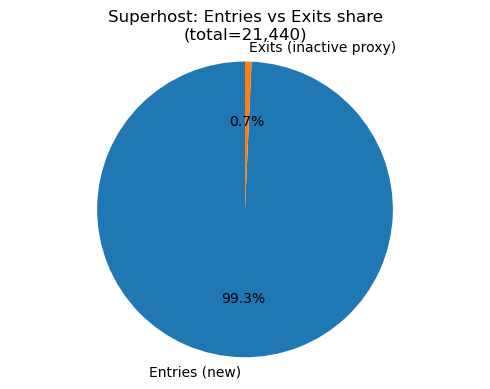

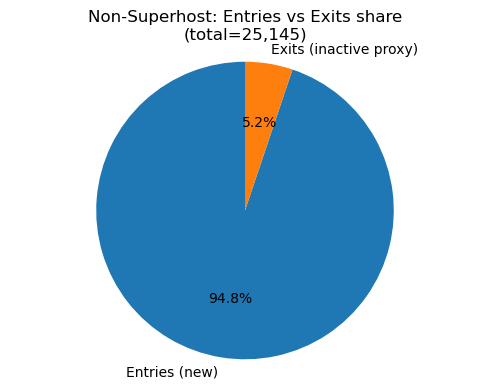

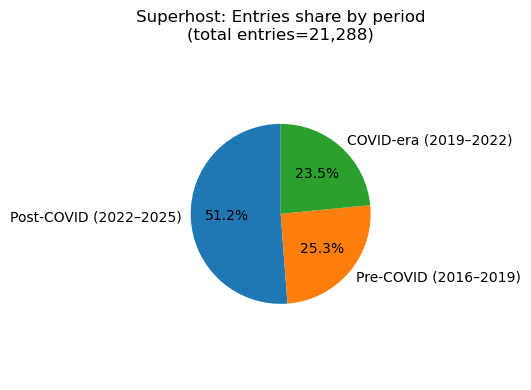

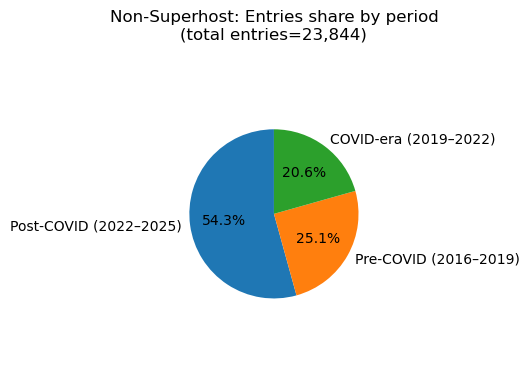

In [1191]:
def pie_entries_exits(yearly, title):
    entries = float(yearly["entries (new property)"].sum())
    exits   = float(yearly["exits property"].sum())
    total = entries + exits
    if total <= 0:
        print(f"{title}: nothing to plot (total=0)")
        return

    labels = ["Entries (new)", "Exits (inactive proxy)"]
    values = [entries, exits]

    plt.figure(figsize=(5, 4))
    plt.pie(values, labels=labels, autopct="%.1f%%", startangle=90)
    plt.title(title + f"\n(total={int(total):,})")
    plt.axis("equal")
    plt.tight_layout()
    plt.show()

def pie_entries_by_period(yearly, title):
    s = (yearly.groupby("period")["entries (new property)"].sum()).sort_values(ascending=False)
    total = float(s.sum())
    if total <= 0:
        print(f"{title}: nothing to plot (total=0)")
        return

    plt.figure(figsize=(5, 4))
    plt.pie(s.values, labels=s.index.tolist(), autopct="%.1f%%", startangle=90)
    plt.title(title + f"\n(total entries={int(total):,})")
    plt.axis("equal")
    plt.tight_layout()
    plt.show()

# Pie charts 
pie_entries_exits(yearly_super, "Superhost: Entries vs Exits share")
pie_entries_exits(yearly_non,   "Non-Superhost: Entries vs Exits share")

pie_entries_by_period(yearly_super, "Superhost: Entries share by period")
pie_entries_by_period(yearly_non,   "Non-Superhost: Entries share by period")

In [1215]:
report='''
1. The airbnb Market Growth Remains Positive (Both Groups are Expanding): From 2016 to 2025, entries property significantly exceeded exits each year,
resulting in a positive market change throughout the year, and an inventory end-proxy that increased year by year. 
This indicates that the NZ Airbnb market as a whole is experiencing continuous expansion.

2. New Listings: Superhosts' "new listing share" is roughly half, and it slightly increased from 2020 to 2024. 
entries_share_in_year (the percentage of new listings in a given year that are Superhosts) was approximately 44%–51% from 2016 to 2024, 
and repeatedly exceeded 50% from 2020 to 2024 (approximately 51.3% in 2024). 
A decrease to 34% in 2025 is more likely a matter of time (as of September 23rd, and non-Superhost entries are particularly high in 2025).

3. Exit rate (inactivity) is almost entirely dominated by non-Superhosts: Non-Superhosts accounted for 87%–100% of exits from 2016 to 2024.
Looking at exits_share_in_year: Superhosts accounted for only a small percentage each year (mostly <10%, approximately 12.7% in 2024), 
indicating that non-Superhosts are more likely to exit, while Superhosts have significantly stronger retention rates.

4. Stage characteristics: The peak in new entries was concentrated in the Post-COVID period (2023–2024), 
while the inflection point of the COVID-era was in 2022. 
Looking at the number of entries in both groups, 2023–2024 was the explosive period (both groups saw a significant jump in entries). 

Looking at entries_share_within_period_: Within the COVID-era (2019–2022), 2022 accounted for the largest share of new entries (approximately 43%), 
marking an inflection point for "market recovery and expansion"; within the Post-COVID (2022–2025) era, 2024 was the year with the largest contribution 
(approximately 45% for Superhosts and approximately 36% for Non-Superhosts).
'''
print(report)


1. The airbnb Market Growth Remains Positive (Both Groups are Expanding): From 2016 to 2025, entries property significantly exceeded exits each year,
resulting in a positive market change throughout the year, and an inventory end-proxy that increased year by year. 
This indicates that the NZ Airbnb market as a whole is experiencing continuous expansion.

2. New Listings: Superhosts' "new listing share" is roughly half, and it slightly increased from 2020 to 2024. 
entries_share_in_year (the percentage of new listings in a given year that are Superhosts) was approximately 44%–51% from 2016 to 2024, 
and repeatedly exceeded 50% from 2020 to 2024 (approximately 51.3% in 2024). 
A decrease to 34% in 2025 is more likely a matter of time (as of September 23rd, and non-Superhost entries are particularly high in 2025).

3. Exit rate (inactivity) is almost entirely dominated by non-Superhosts: Non-Superhosts accounted for 87%–100% of exits from 2016 to 2024.
Looking at exits_share_in_year: Sup

Detected: {'ROOM': 'room_type', 'PROP': 'property_type', 'AMEN': 'amenities'}

=== Table 1: Entry vs Exit (N + median price + shares) ===


,year,group,N_Entry,N_Exit,median_price_Entry,median_price_Exit,entry_share_in_year,exit_share_in_year
0,2016,Non-Superhost,"1,155",14,198,242,53.05%,93.33%
2,2017,Non-Superhost,"1,549",30,229,185,56.00%,96.77%
4,2018,Non-Superhost,"1,539",54,200,252,51.23%,90.00%
6,2019,Non-Superhost,"1,737",83,210,196,50.69%,93.26%
8,2020,Non-Superhost,"1,342",155,226,230,49.32%,88.57%
10,2021,Non-Superhost,"1,466",143,258,236,50.50%,89.94%
12,2022,Non-Superhost,"2,109",307,227,261,49.21%,81.87%
14,2023,Non-Superhost,"3,518",892,207,248,49.91%,88.23%
16,2024,Non-Superhost,"4,682","1,757",208,234,48.73%,84.27%
18,2025,Non-Superhost,"4,747",nan,185,nan,66.01%,nan%


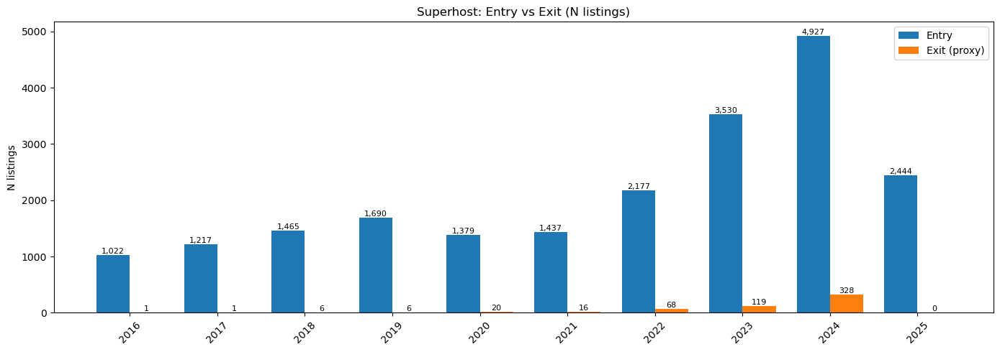

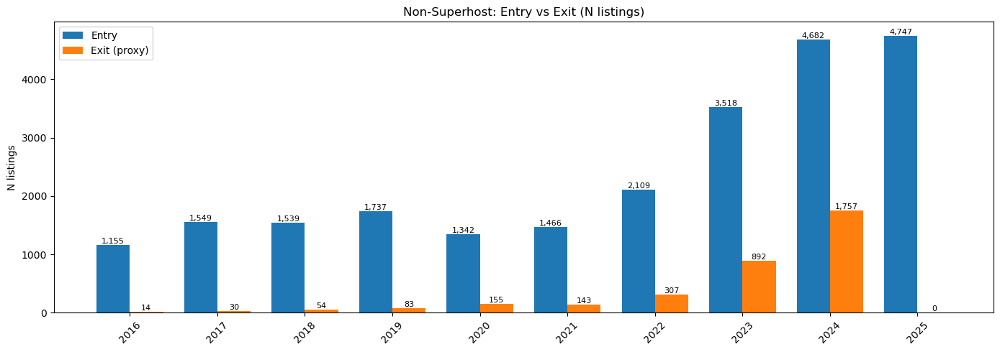

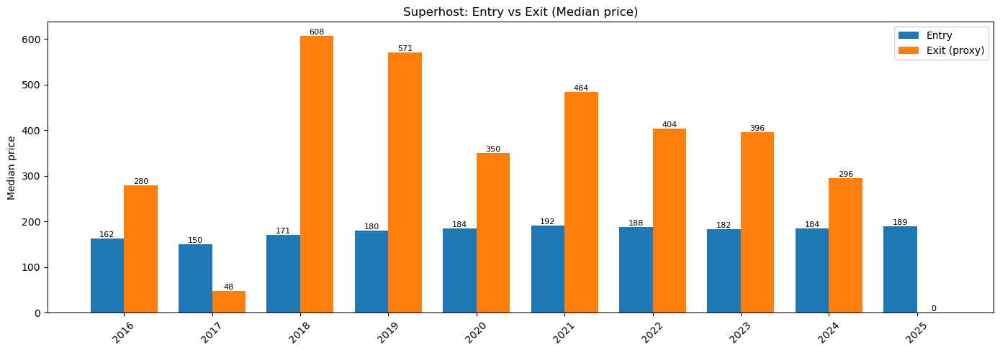

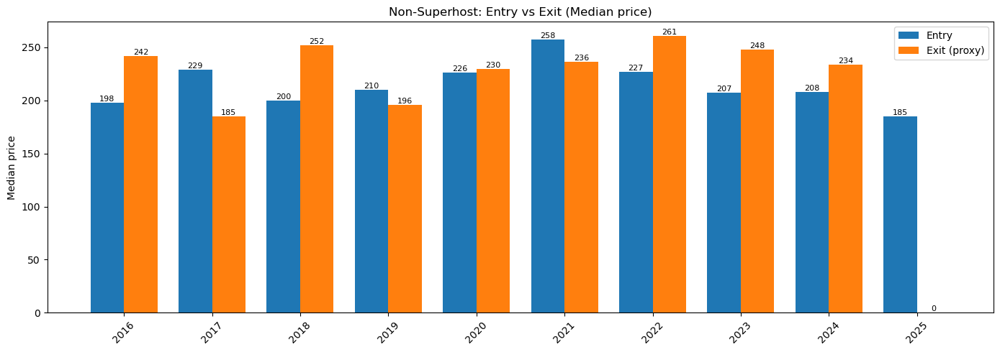


=== Table 2: room_type (Top1 + Share) ===


,year,group,top1_Entry,top1_Exit,top1_share_Entry,top1_share_Exit
0,2016,Non-Superhost,Entire home/apt,Entire home/apt,69.18%,50.00%
2,2017,Non-Superhost,Entire home/apt,Entire home/apt,76.69%,53.33%
4,2018,Non-Superhost,Entire home/apt,Private room,74.92%,59.26%
6,2019,Non-Superhost,Entire home/apt,Entire home/apt,74.67%,51.81%
8,2020,Non-Superhost,Entire home/apt,Entire home/apt,77.20%,59.35%
10,2021,Non-Superhost,Entire home/apt,Entire home/apt,81.45%,65.03%
12,2022,Non-Superhost,Entire home/apt,Entire home/apt,80.09%,64.50%
14,2023,Non-Superhost,Entire home/apt,Entire home/apt,78.85%,62.89%
16,2024,Non-Superhost,Entire home/apt,Entire home/apt,79.11%,68.75%
18,2025,Non-Superhost,Entire home/apt,nan,81.38%,nan%


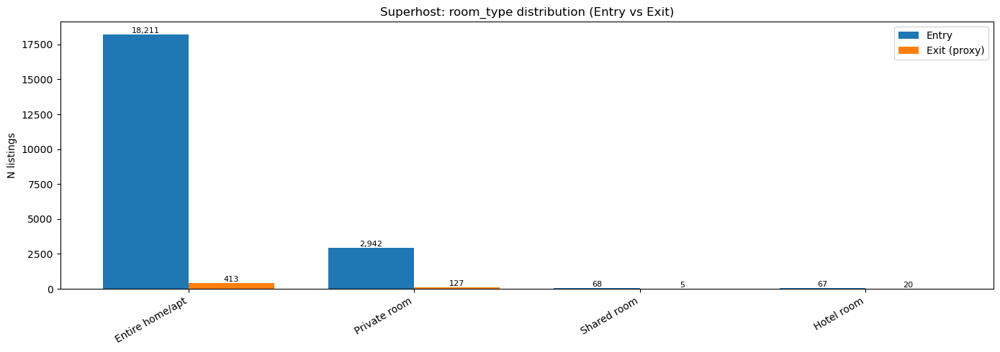

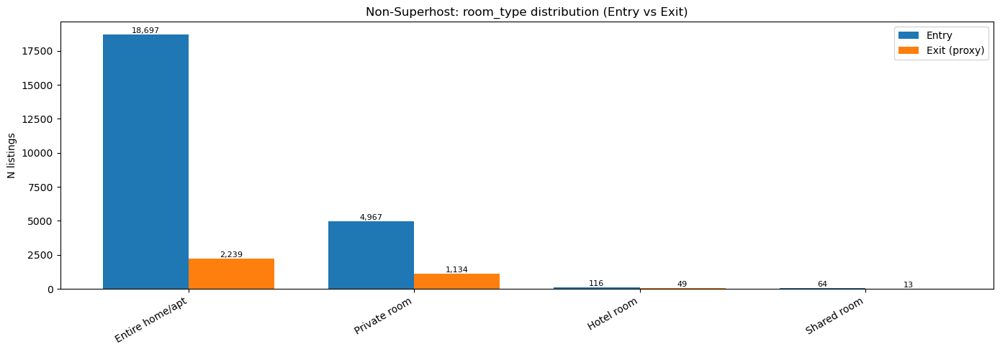

In [1230]:
#PROPERTY TYPE and amen
ROOM = detect_col(d.columns, ["room_type", "roomtype"])
PROP = detect_col(d.columns, ["property_type", "propertytype"])
AMEN = detect_col(d.columns, ["amenities", "amenity"])

print("Detected:", {"ROOM": ROOM, "PROP": PROP, "AMEN": AMEN})

if LAST_REVIEW is None:
    raise ValueError("Need last_review column to define exit under the new rule.")

months_12_ago = snapshot_date - pd.DateOffset(months=12)

d["inactive_exit_proxy"] = d[LAST_REVIEW].notna() & (d[LAST_REVIEW] < months_12_ago)
d["exit_year_proxy"] = np.where(d["inactive_exit_proxy"], d[LAST_REVIEW].dt.year, np.nan)
d["exit_year_proxy_int"] = pd.to_numeric(d["exit_year_proxy"], errors="coerce").astype("Int64")

# rebuild entries / exits 

d["entry_year_int"] = pd.to_numeric(d["entry_year"], errors="coerce").astype("Int64")

entries = d[d["entry_year_int"].isin(YEARS)].copy()
entries["event"] = "Entry"
entries["year"] = entries["entry_year_int"].astype(int)

exits = d[d["inactive_exit_proxy"] & d["exit_year_proxy_int"].isin(YEARS)].copy()
exits["event"] = "Exit"
exits["year"] = exits["exit_year_proxy_int"].astype(int)

entries = entries.sort_values(["year", ID_COL]).drop_duplicates(["year", ID_COL])
exits   = exits.sort_values(["year", ID_COL]).drop_duplicates(["year", ID_COL])

# utils
def _topk_with_share(df, col, k=1):
    if col is None or col not in df.columns:
        return None

    base = df[["year", "group", "event", ID_COL, col]].copy()
    base[col] = base[col].astype(str).str.strip()
    base.loc[base[col].isin(["", "nan", "None"]), col] = np.nan
    base = base.dropna(subset=[col])

    totals = base.groupby(["year", "group", "event"])[ID_COL].nunique().rename("N").reset_index()
    counts = (
        base.groupby(["year", "group", "event", col])[ID_COL].nunique()
        .rename("n").reset_index()
        .merge(totals, on=["year", "group", "event"], how="left")
    )
    counts["share"] = counts["n"] / counts["N"].replace(0, np.nan)
    counts["rank"] = counts.groupby(["year", "group", "event"])["n"].rank(method="first", ascending=False)
    top = counts[counts["rank"] <= k].copy()

    out = top.sort_values(["year", "group", "event", "rank"])
    rows = []
    for (y, g, e), sub in out.groupby(["year", "group", "event"]):
        r = {"year": y, "group": g, "event": e}
        for i, (_, rr) in enumerate(sub.iterrows(), start=1):
            r[f"top{i}"] = rr[col]
            r[f"top{i}_share"] = rr["share"]
        rows.append(r)

    return pd.DataFrame(rows)

def _annotate_bars(ax, fmt="{:,.0f}"):
    for p in ax.patches:
        h = p.get_height()
        if np.isnan(h):
            continue
        ax.annotate(fmt.format(h),
                    (p.get_x() + p.get_width()/2, h),
                    ha="center", va="bottom", fontsize=8)

def plot_entry_exit_yearly(df_wide, group_name, col_entry, col_exit, title, ylabel, label_fmt="{:,.0f}"):
    if col_entry not in df_wide.columns or col_exit not in df_wide.columns:
        print("Skip plot:", title, "missing cols")
        return
    sub = df_wide[df_wide["group"] == group_name].sort_values("year")
    x = np.arange(len(sub))
    w = 0.38
    y1 = pd.to_numeric(sub[col_entry], errors="coerce").fillna(0).values
    y2 = pd.to_numeric(sub[col_exit],  errors="coerce").fillna(0).values

    fig, ax = plt.subplots(figsize=(14, 5))
    ax.bar(x - w/2, y1, w, label="Entry")
    ax.bar(x + w/2, y2, w, label="Exit (proxy)")
    ax.set_xticks(x)
    ax.set_xticklabels(sub["year"].tolist(), rotation=45)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.legend()
    _annotate_bars(ax, fmt=label_fmt)
    plt.tight_layout()
    plt.show()

def _parse_amenities_cell(x):
    if pd.isna(x):
        return []
    s = str(x).strip()
    if s in ("", "nan", "None"):
        return []
    if s.startswith("{") and s.endswith("}"):
        inner = s[1:-1].strip()
        parts = [p.strip().strip("'\"") for p in inner.split(",") if p.strip()]
        return [p for p in parts if p]
    if s.startswith("[") and s.endswith("]"):
        try:
            v = ast.literal_eval(s)
            if isinstance(v, list):
                return [str(i).strip() for i in v if str(i).strip()]
        except Exception:
            pass
        parts = [p.strip().strip("'\"") for p in s[1:-1].split(",") if p.strip()]
        return [p for p in parts if p]
    if "|" in s:
        return [p.strip() for p in s.split("|") if p.strip()]
    return [s]

def amenities_topk_yearly(df_evt, k=3):
    if AMEN is None or AMEN not in df_evt.columns:
        return None

    base = df_evt[["year", "group", "event", ID_COL, AMEN]].copy()
    base["amen_list"] = base[AMEN].apply(_parse_amenities_cell)
    base = base.explode("amen_list")
    base["amen_list"] = base["amen_list"].astype(str).str.strip()
    base = base[base["amen_list"].notna() & (base["amen_list"] != "")]

    totals = base.groupby(["year", "group", "event"])[ID_COL].nunique().rename("N").reset_index()
    counts = (
        base.groupby(["year", "group", "event", "amen_list"])[ID_COL].nunique()
        .rename("n").reset_index()
        .merge(totals, on=["year", "group", "event"], how="left")
    )
    counts["share"] = counts["n"] / counts["N"].replace(0, np.nan)
    counts["rank"] = counts.groupby(["year", "group", "event"])["n"].rank(method="first", ascending=False)
    top = counts[counts["rank"] <= k].sort_values(["year", "group", "event", "rank"])

    rows = []
    for (y, g, e), sub in top.groupby(["year", "group", "event"]):
        r = {"year": y, "group": g, "event": e}
        for i, (_, rr) in enumerate(sub.iterrows(), start=1):
            r[f"amen{i}"] = rr["amen_list"]
            r[f"amen{i}_share"] = rr["share"]
        rows.append(r)

    return pd.DataFrame(rows)

def plot_cat_dist_overall(entries_evt, exits_evt, col, group_name, topn=8, title=""):
    if col is None:
        print("Missing column for plot:", title)
        return

    def series_counts(df):
        s = df[df["group"] == group_name][col].astype(str).str.strip()
        s = s[~s.isin(["", "nan", "None"])]
        return s.value_counts()

    ce = series_counts(entries_evt)
    cx = series_counts(exits_evt)

    cats = ce.head(topn).index.to_list()
    for c in cx.head(topn).index:
        if c not in cats and len(cats) < topn:
            cats.append(c)

    y1 = ce.reindex(cats).fillna(0).values
    y2 = cx.reindex(cats).fillna(0).values
    x = np.arange(len(cats))
    w = 0.38

    fig, ax = plt.subplots(figsize=(14, 5))
    ax.bar(x - w/2, y1, w, label="Entry")
    ax.bar(x + w/2, y2, w, label="Exit (proxy)")
    ax.set_xticks(x)
    ax.set_xticklabels(cats, rotation=30, ha="right")
    ax.set_ylabel("N listings")
    ax.set_title(title)
    ax.legend()
    _annotate_bars(ax, fmt="{:,.0f}")  # show N on top
    plt.tight_layout()
    plt.show()

def plot_amenities_overall(entries_evt, exits_evt, group_name, topn=10):
    if AMEN is None:
        print("Missing amenities column.")
        return

    def amen_counts(df):
        b = df[df["group"] == group_name][[ID_COL, AMEN]].copy()
        b["amen_list"] = b[AMEN].apply(_parse_amenities_cell)
        b = b.explode("amen_list")
        b["amen_list"] = b["amen_list"].astype(str).str.strip()
        b = b[(b["amen_list"].notna()) & (b["amen_list"] != "")]
        return b.groupby("amen_list")[ID_COL].nunique().sort_values(ascending=False)

    ce = amen_counts(entries_evt)
    cx = amen_counts(exits_evt)

    cats = ce.head(topn).index.to_list()
    for c in cx.head(topn).index:
        if c not in cats and len(cats) < topn:
            cats.append(c)

    y1 = ce.reindex(cats).fillna(0).values
    y2 = cx.reindex(cats).fillna(0).values
    x = np.arange(len(cats))
    w = 0.38

    fig, ax = plt.subplots(figsize=(14, 5))
    ax.bar(x - w/2, y1, w, label="Entry")
    ax.bar(x + w/2, y2, w, label="Exit (proxy)")
    ax.set_xticks(x)
    ax.set_xticklabels(cats, rotation=30, ha="right")
    ax.set_ylabel("N listings")
    ax.set_title(f"{group_name}: Top amenities (Entry vs Exit)")
    ax.legend()
    _annotate_bars(ax, fmt="{:,.0f}")  # show N on top
    plt.tight_layout()
    plt.show()


# Table 1: N + median price + shares 
events_all = pd.concat([entries, exits], ignore_index=True)

t_counts = (
    events_all.groupby(["year", "group", "event"])[ID_COL]
    .nunique().rename("N").reset_index()
)

t_price = None
if PRICE is not None and PRICE in d.columns:
    t_price = (
        events_all.groupby(["year", "group", "event"])[PRICE]
        .median().rename("median_price").reset_index()
    )

t1 = t_counts
if t_price is not None:
    t1 = t1.merge(t_price, on=["year", "group", "event"], how="left")

totals = (
    t_counts.groupby(["year", "event"])["N"]
    .sum().rename("N_total").reset_index()
)

t1 = t1.merge(totals, on=["year", "event"], how="left")
t1["share_in_year"] = t1["N"] / t1["N_total"].replace(0, np.nan)

t1_w = t1.pivot(index=["year", "group"], columns="event", values=["N", "median_price", "share_in_year"])
t1_w.columns = [f"{a}_{b}" for a, b in t1_w.columns]
t1_w = t1_w.reset_index().sort_values(["group", "year"]).rename(columns={
    "share_in_year_Entry": "entry_share_in_year",
    "share_in_year_Exit":  "exit_share_in_year",
})

print("\n=== Table 1: Entry vs Exit (N + median price + shares) ===")
fmt1 = {
    "N_Entry": "{:,.0f}", "N_Exit": "{:,.0f}",
    "median_price_Entry": "{:,.0f}", "median_price_Exit": "{:,.0f}",
    "entry_share_in_year": "{:.2%}", "exit_share_in_year": "{:.2%}",
}
display(t1_w.style.format(fmt1))

# barcharts (N + median price)
plot_entry_exit_yearly(t1_w, "Superhost", "N_Entry", "N_Exit",
                       "Superhost: Entry vs Exit (N listings)", "N listings", "{:,.0f}")
plot_entry_exit_yearly(t1_w, "Non-Superhost", "N_Entry", "N_Exit",
                       "Non-Superhost: Entry vs Exit (N listings)", "N listings", "{:,.0f}")

plot_entry_exit_yearly(t1_w, "Superhost", "median_price_Entry", "median_price_Exit",
                       "Superhost: Entry vs Exit (Median price)", "Median price", "{:,.0f}")
plot_entry_exit_yearly(t1_w, "Non-Superhost", "median_price_Entry", "median_price_Exit",
                       "Non-Superhost: Entry vs Exit (Median price)", "Median price", "{:,.0f}")


#Table 2: room_type (Top1 + Share) + overall bars 

if ROOM is not None:
    rt_top = pd.concat([_topk_with_share(entries, ROOM, k=1),
                        _topk_with_share(exits,   ROOM, k=1)], ignore_index=True)
    rt_w = rt_top.pivot(index=["year","group"], columns="event", values=["top1","top1_share"])
    rt_w.columns = [f"{a}_{b}" for a,b in rt_w.columns]
    rt_w = rt_w.reset_index().sort_values(["group","year"])

    print("\n=== Table 2: room_type (Top1 + Share) ===")
    fmt2 = {c:"{:.2%}" for c in rt_w.columns if "share" in c}
    display(rt_w.style.format(fmt2))

    plot_cat_dist_overall(entries, exits, ROOM, "Superhost", topn=8,
                          title="Superhost: room_type distribution (Entry vs Exit)")
    plot_cat_dist_overall(entries, exits, ROOM, "Non-Superhost", topn=8,
                          title="Non-Superhost: room_type distribution (Entry vs Exit)")


=== Table 3: property_type (Top1 + Share) ===


,year,group,top1_Entry,top1_Exit,top1_share_Entry,top1_share_Exit
0,2016,Non-Superhost,Entire home,Entire home,36.02%,42.86%
2,2017,Non-Superhost,Entire home,Entire home,45.97%,30.00%
4,2018,Non-Superhost,Entire home,Private room in home,38.14%,29.63%
6,2019,Non-Superhost,Entire home,Entire home,36.85%,33.73%
8,2020,Non-Superhost,Entire home,Entire home,40.69%,36.77%
10,2021,Non-Superhost,Entire home,Entire home,48.02%,32.17%
12,2022,Non-Superhost,Entire home,Entire home,36.18%,36.48%
14,2023,Non-Superhost,Entire home,Entire home,46.84%,32.85%
16,2024,Non-Superhost,Entire home,Entire home,49.32%,40.18%
18,2025,Non-Superhost,Entire home,nan,49.06%,nan%


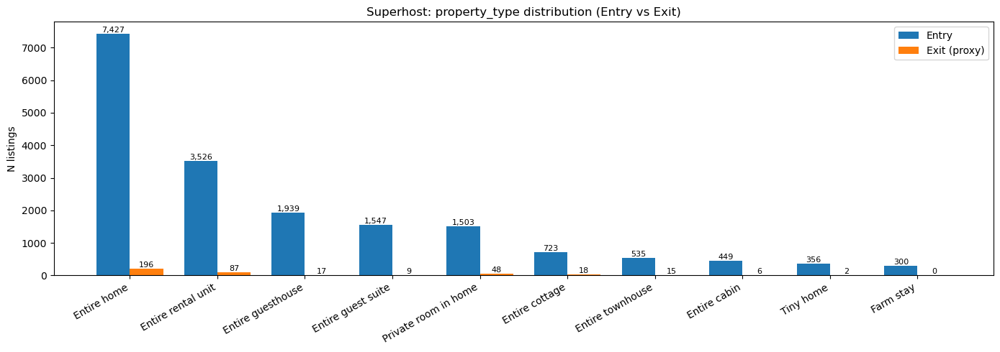

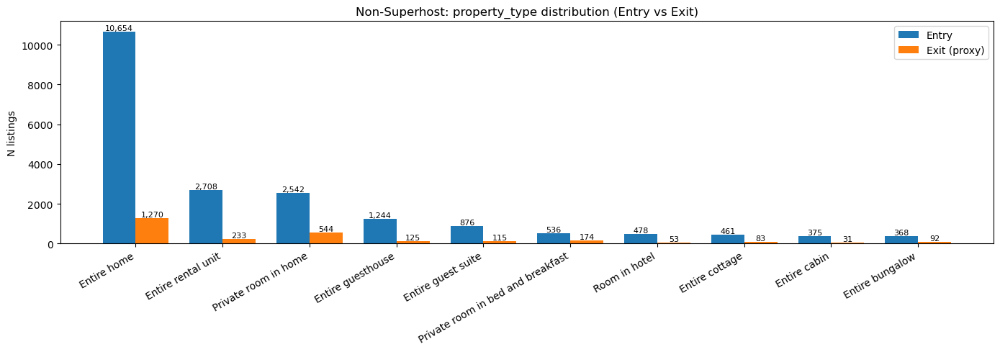


=== Table 4: amenities (Top3 + Share) ===


,year,group,amen1_Entry,amen1_Exit,amen1_share_Entry,amen1_share_Exit,amen2_Entry,amen2_Exit,amen2_share_Entry,amen2_share_Exit,amen3_Entry,amen3_Exit,amen3_share_Entry,amen3_share_Exit
0,2016,Non-Superhost,Smoke alarm,Free parking on premises,93.33%,85.71%,Wifi,Smoke alarm,88.57%,85.71%,Kitchen,Essentials,83.12%,78.57%
2,2017,Non-Superhost,Smoke alarm,Smoke alarm,89.80%,96.67%,Wifi,Essentials,86.89%,93.33%,Kitchen,Wifi,84.57%,93.33%
4,2018,Non-Superhost,Smoke alarm,Wifi,91.88%,96.30%,Wifi,Smoke alarm,86.09%,90.74%,Kitchen,Essentials,83.95%,87.04%
6,2019,Non-Superhost,Smoke alarm,Smoke alarm,93.49%,89.16%,Wifi,Essentials,87.22%,86.75%,Kitchen,Wifi,84.63%,86.75%
8,2020,Non-Superhost,Smoke alarm,Wifi,89.72%,92.90%,Wifi,Essentials,87.85%,90.32%,Kitchen,Smoke alarm,84.72%,88.39%
10,2021,Non-Superhost,Smoke alarm,Wifi,92.50%,93.71%,Wifi,Essentials,86.83%,91.61%,Kitchen,Free parking on premises,84.79%,87.41%
12,2022,Non-Superhost,Smoke alarm,Wifi,91.75%,86.64%,Kitchen,Free parking on premises,85.73%,85.99%,Wifi,Smoke alarm,84.78%,85.34%
14,2023,Non-Superhost,Smoke alarm,Smoke alarm,92.67%,90.25%,Wifi,Wifi,88.15%,85.99%,Kitchen,Kitchen,84.99%,82.06%
16,2024,Non-Superhost,Wifi,Smoke alarm,90.88%,89.76%,Smoke alarm,Wifi,89.90%,86.40%,Kitchen,Kitchen,83.79%,82.93%
18,2025,Non-Superhost,Wifi,nan,92.46%,nan%,Smoke alarm,nan,91.49%,nan%,Kitchen,nan,83.88%,nan%


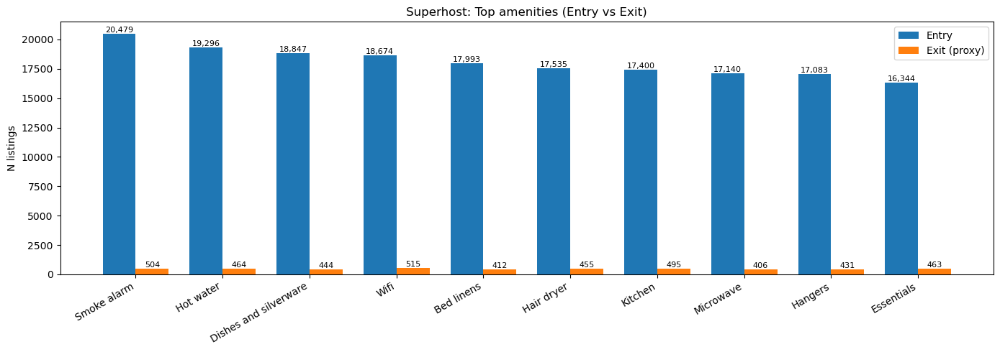

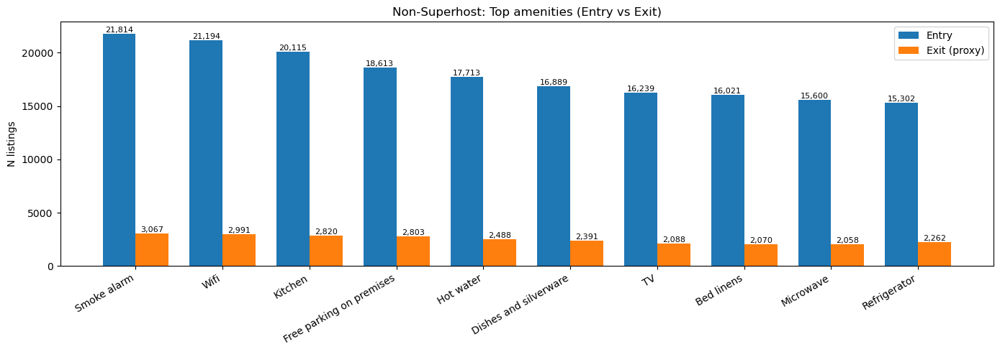

In [1232]:
# Table: property_type (top1 each year + share)
if PROP is not None:
    pt_top = pd.concat([
        _topk_with_share(entries, PROP, k=1),
        _topk_with_share(exits,   PROP, k=1)
    ], ignore_index=True)

    pt_w = pt_top.pivot(index=["year","group"], columns="event", values=["top1","top1_share"])
    pt_w.columns = [f"{a}_{b}" for a,b in pt_w.columns]
    pt_w = pt_w.reset_index().sort_values(["group","year"])

    print("\n=== Table 3: property_type (Top1 + Share) ===")
    fmt3 = {c:"{:.2%}" for c in pt_w.columns if "share" in c}
    display(pt_w.style.format(fmt3))

    plot_cat_dist_overall(entries, exits, PROP, "Superhost", topn=10,
                          title="Superhost: property_type distribution (Entry vs Exit)")
    plot_cat_dist_overall(entries, exits, PROP, "Non-Superhost", topn=10,
                          title="Non-Superhost: property_type distribution (Entry vs Exit)")


# Table: amenities (top3 each year + share) 
am_top = amenities_topk_yearly(pd.concat([entries, exits], ignore_index=True), k=3)
if am_top is not None and len(am_top) > 0:
    # split to Entry vs Exit wide
    am_w = am_top.pivot(index=["year","group"], columns="event",
                        values=["amen1","amen1_share","amen2","amen2_share","amen3","amen3_share"])
    am_w.columns = [f"{a}_{b}" for a,b in am_w.columns]
    am_w = am_w.reset_index().sort_values(["group","year"])

    print("\n=== Table 4: amenities (Top3 + Share) ===")
    fmt4 = {c:"{:.2%}" for c in am_w.columns if "share" in c}
    display(am_w.style.format(fmt4))

    plot_amenities_overall(entries, exits, "Superhost", topn=10)
    plot_amenities_overall(entries, exits, "Non-Superhost", topn=10)
else:
    print("\nAmenities table skipped: no amenities column or parsing produced empty results.")

In [1286]:
report='''
1.Looking at the NZ Airbnb market changes (Table 1), from 2016 to 2024, new listings were roughly split evenly between Superhosts and Non-Superhosts: 
In the early stages (2016–2019), Non-Superhosts had a slightly higher entry share (approximately 50–56%), 
but by 2024, Superhosts had a slightly higher share (approximately 51%). 

However, the composition of exiting listings (exit proxies) differed significantly: 
each year, exits primarily came from Non-Superhosts (mostly between 80% and 97%), with Superhosts accounting for only a minority. 

This suggests that without a last review definition for exiting within a year, Non-Superhosts are more likely to become inactive long-term, 
while Superhosts are relatively more stable. 
Note: The share here refers to the percentage of each group among all exits in that year, not the "exit rate."

2.Looking at prices (Table 1), the median price for entries doesn't differ significantly between Superhost and Non-Superhost 
(Non-Superhosts are mostly around $200–$260, while Superhosts are mostly around $150–$190).

More notably, the median price for exits is often higher than for entries (especially for Superhosts, 
where the exit median is frequently significantly higher). 

This may reflect that higher-priced listings with few reviews are more likely to be considered inactive; 
however, it's also worth noting that in some years, the number of Superhost exits is lower, 
leading to greater fluctuations in the median ( years with unusually low/high medians).


3.Regarding property type (Tables 2/3), "Entire home/apt" consistently remains the dominant room type for both entries and exits.
For Entry listings, the percentage of Entire Homes/Apartments for Non-Superhosts has been increasing year by year (roughly from 69% to 79%+),
while for Superhosts it's even higher (often between 80% and 90%). 

For Exits, Entire Homes/Apartments for Non-Superhosts remain the top choice, 
but the percentage is significantly lower than for Entry (approximately 50%–69%), 
indicating that exiting (inactive) listings are more diversified in terms of room type, with a higher relative proportion of Private rooms. 

The property type is similar: "Entire Home" is consistently the top choice, 
but Entry's top share is higher than Exit's, suggesting a more diverse range of exiting listing types.

4.Looking at amenities (Table 4 + two amenities bar charts), the top amenities for Entry and Exit are highly consistent, 
primarily including Smoke Alarm, Wi-Fi, Kitchen, Hot Water, Essentials (some also include Free Parking). 
Furthermore, these amenities constitute a very high percentage of entries in both groups (many approaching or exceeding 90%),
indicating that they are more like "basic market offerings" and have limited explanatory power in distinguishing which entries will exit. 

Both bar charts also show that while the absolute number of exits for Non-Superhosts is significantly higher than for Superhosts, 
there is no "completely different configuration" in terms of amenities; the difference is more about scale than structure.
'''
print(report)


1.Looking at the NZ Airbnb market changes (Table 1), from 2016 to 2024, new listings were roughly split evenly between Superhosts and Non-Superhosts: 
In the early stages (2016–2019), Non-Superhosts had a slightly higher entry share (approximately 50–56%), 
but by 2024, Superhosts had a slightly higher share (approximately 51%). 

However, the composition of exiting listings (exit proxies) differed significantly: 
each year, exits primarily came from Non-Superhosts (mostly between 80% and 97%), with Superhosts accounting for only a minority. 

This suggests that without a last review definition for exiting within a year, Non-Superhosts are more likely to become inactive long-term, 
while Superhosts are relatively more stable. 
Note: The share here refers to the percentage of each group among all exits in that year, not the "exit rate."

2.Looking at prices (Table 1), the median price for entries doesn't differ significantly between Superhost and Non-Superhost 
(Non-Superhosts are most

Detected: {'Region_parent': 'region_parent_name', 'Region(ward)': 'region_name', 'Neighbourhood': 'neighbourhood'}

=== Region_parent: Top3 per year (Superhost) ===


,year,group,top1_Entry,top1_Exit,top1_share_Entry,top1_share_Exit,top2_Entry,top2_Exit,top2_share_Entry,top2_share_Exit,top3_Entry,top3_Exit,top3_share_Entry,top3_share_Exit
1,2016,Superhost,Queenstown-Lakes District,Auckland,20.06%,100.00%,Auckland,nan,14.58%,nan%,Far North District,nan,4.99%,nan%
3,2017,Superhost,Auckland,Christchurch City,15.94%,100.00%,Queenstown-Lakes District,nan,12.00%,nan%,Christchurch City,nan,5.83%,nan%
5,2018,Superhost,Queenstown-Lakes District,Queenstown-Lakes District,14.54%,33.33%,Auckland,Gisborne District,11.47%,16.67%,Christchurch City,Hastings District,4.71%,16.67%
7,2019,Superhost,Queenstown-Lakes District,Queenstown-Lakes District,14.91%,66.67%,Auckland,Far North District,11.36%,16.67%,Christchurch City,Thames-Coromandel District,5.44%,16.67%
9,2020,Superhost,Queenstown-Lakes District,Auckland,15.16%,15.00%,Auckland,Queenstown-Lakes District,10.37%,15.00%,Christchurch City,Southland District,6.09%,10.00%
11,2021,Superhost,Queenstown-Lakes District,Queenstown-Lakes District,14.96%,25.00%,Auckland,Auckland,9.60%,12.50%,Christchurch City,Waipa District,6.33%,12.50%
13,2022,Superhost,Queenstown-Lakes District,Queenstown-Lakes District,15.94%,26.47%,Auckland,Auckland,14.56%,19.12%,Christchurch City,Nelson City,5.28%,7.35%
15,2023,Superhost,Auckland,Queenstown-Lakes District,15.64%,23.53%,Queenstown-Lakes District,Auckland,13.82%,16.81%,Christchurch City,Far North District,7.51%,7.56%
17,2024,Superhost,Auckland,Queenstown-Lakes District,16.03%,21.65%,Queenstown-Lakes District,Auckland,14.05%,19.51%,Christchurch City,Far North District,8.32%,6.71%
19,2025,Superhost,Queenstown-Lakes District,nan,18.33%,nan%,Auckland,nan,17.55%,nan%,Christchurch City,nan,10.27%,nan%



=== Region_parent: Top3 per year (Non-Superhost) ===


,year,group,top1_Entry,top1_Exit,top1_share_Entry,top1_share_Exit,top2_Entry,top2_Exit,top2_share_Entry,top2_share_Exit,top3_Entry,top3_Exit,top3_share_Entry,top3_share_Exit
0,2016,Non-Superhost,Auckland,Auckland,26.06%,35.71%,Queenstown-Lakes District,Central Hawke's Bay District,9.18%,7.14%,Christchurch City,Hastings District,5.19%,7.14%
2,2017,Non-Superhost,Auckland,Auckland,22.34%,43.33%,Queenstown-Lakes District,Christchurch City,8.39%,6.67%,Thames-Coromandel District,Hamilton City,6.46%,6.67%
4,2018,Non-Superhost,Auckland,Auckland,22.29%,42.59%,Queenstown-Lakes District,Far North District,8.38%,5.56%,Tauranga City,Kapiti Coast District,4.74%,5.56%
6,2019,Non-Superhost,Auckland,Auckland,18.83%,26.51%,Queenstown-Lakes District,Christchurch City,8.64%,8.43%,Christchurch City,Marlborough District,5.35%,6.02%
8,2020,Non-Superhost,Auckland,Auckland,17.59%,34.19%,Queenstown-Lakes District,Queenstown-Lakes District,7.45%,13.55%,Christchurch City,Christchurch City,5.37%,5.16%
10,2021,Non-Superhost,Auckland,Auckland,14.19%,26.57%,Thames-Coromandel District,Queenstown-Lakes District,9.89%,6.29%,Queenstown-Lakes District,Tauranga City,7.30%,6.29%
12,2022,Non-Superhost,Auckland,Auckland,23.94%,20.52%,Queenstown-Lakes District,Queenstown-Lakes District,9.39%,9.77%,Tauranga City,Christchurch City,5.41%,5.21%
14,2023,Non-Superhost,Auckland,Auckland,24.79%,24.66%,Queenstown-Lakes District,Queenstown-Lakes District,8.64%,6.28%,Christchurch City,Tauranga City,6.82%,5.72%
16,2024,Non-Superhost,Auckland,Auckland,25.82%,22.48%,Queenstown-Lakes District,Queenstown-Lakes District,8.48%,7.46%,Christchurch City,Tauranga City,6.28%,5.41%
18,2025,Non-Superhost,Auckland,nan,23.51%,nan%,Queenstown-Lakes District,nan,9.99%,nan%,Christchurch City,nan,6.32%,nan%


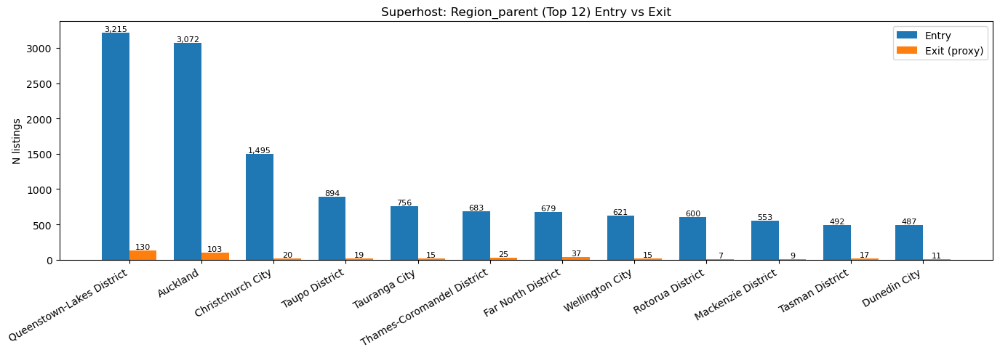

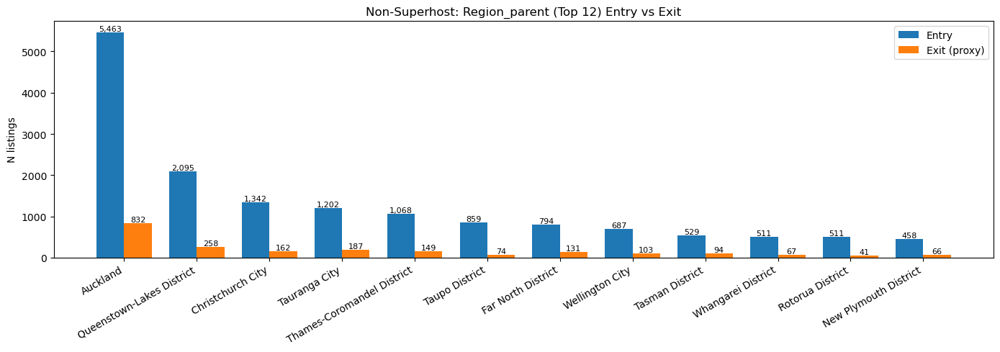


=== Region (ward): Top3 per year (Superhost) ===


,year,group,top1_Entry,top1_Exit,top1_share_Entry,top1_share_Exit,top2_Entry,top2_Exit,top2_share_Entry,top2_share_Exit,top3_Entry,top3_Exit,top3_share_Entry,top3_share_Exit
1,2016,Superhost,Queenstown-Wakatipu Ward,North Shore Ward,15.36%,100.00%,Area Outside Ward,nan,9.10%,nan%,Waitemat?? and Gulf Ward,nan,5.28%,nan%
3,2017,Superhost,Area Outside Ward,Banks Peninsula Ward,11.26%,100.00%,Queenstown-Wakatipu Ward,nan,8.38%,nan%,Waitemat?? and Gulf Ward,nan,4.11%,nan%
5,2018,Superhost,Queenstown-Wakatipu Ward,Queenstown-Wakatipu Ward,10.72%,33.33%,Area Outside Ward,Gisborne Ward,9.35%,16.67%,Waitemat?? and Gulf Ward,Hastings-Havelock North Ward,3.48%,16.67%
7,2019,Superhost,Area Outside Ward,Queenstown-Wakatipu Ward,10.30%,33.33%,Queenstown-Wakatipu Ward,Arrowtown Ward,10.12%,16.67%,Wanaka Ward,Bay of Islands-Whangaroa Ward,4.56%,16.67%
9,2020,Superhost,Area Outside Ward,Area Outside Ward,10.22%,10.00%,Queenstown-Wakatipu Ward,Queenstown-Wakatipu Ward,9.79%,10.00%,Wanaka Ward,??r??kei Ward,4.71%,5.00%
11,2021,Superhost,Area Outside Ward,Wanaka Ward,11.55%,25.00%,Queenstown-Wakatipu Ward,Area Outside Ward,11.27%,12.50%,Taup?? Ward,Motukairangi/Eastern Ward,4.66%,12.50%
13,2022,Superhost,Queenstown-Wakatipu Ward,Queenstown-Wakatipu Ward,10.75%,19.12%,Area Outside Ward,Waitemat?? and Gulf Ward,9.65%,10.29%,Waitemat?? and Gulf Ward,Area Outside Ward,5.19%,8.82%
15,2023,Superhost,Area Outside Ward,Queenstown-Wakatipu Ward,10.34%,15.13%,Queenstown-Wakatipu Ward,Area Outside Ward,8.50%,9.24%,Wanaka Ward,Wanaka Ward,4.79%,8.40%
17,2024,Superhost,Area Outside Ward,Queenstown-Wakatipu Ward,9.92%,12.50%,Queenstown-Wakatipu Ward,Waitemat?? and Gulf Ward,9.46%,8.84%,Waitemat?? and Gulf Ward,Wanaka Ward,4.73%,8.54%
19,2025,Superhost,Queenstown-Wakatipu Ward,nan,12.68%,nan%,Area Outside Ward,nan,9.37%,nan%,Central Ward,nan,6.14%,nan%



=== Region (ward): Top3 per year (Non-Superhost) ===


,year,group,top1_Entry,top1_Exit,top1_share_Entry,top1_share_Exit,top2_Entry,top2_Exit,top2_share_Entry,top2_share_Exit,top3_Entry,top3_Exit,top3_share_Entry,top3_share_Exit
0,2016,Non-Superhost,Area Outside Ward,??r??kei Ward,6.84%,7.14%,Queenstown-Wakatipu Ward,Albany Ward,6.49%,7.14%,Waitemat?? and Gulf Ward,Aramoana-Ruahine Ward,5.45%,7.14%
2,2017,Non-Superhost,Area Outside Ward,Waitemat?? and Gulf Ward,7.81%,16.67%,Waitemat?? and Gulf Ward,Albany Ward,5.23%,6.67%,Queenstown-Wakatipu Ward,Albert-Eden-Puket??papa Ward,5.04%,6.67%
4,2018,Non-Superhost,Area Outside Ward,Albert-Eden-Puket??papa Ward,8.45%,11.11%,Waitemat?? and Gulf Ward,Albany Ward,6.56%,9.26%,Queenstown-Wakatipu Ward,North Shore Ward,4.74%,7.41%
6,2019,Non-Superhost,Area Outside Ward,Area Outside Ward,8.58%,8.43%,Waitemat?? and Gulf Ward,Waitemat?? and Gulf Ward,5.99%,6.02%,Queenstown-Wakatipu Ward,Albany Ward,5.07%,4.82%
8,2020,Non-Superhost,Area Outside Ward,Area Outside Ward,7.68%,10.97%,Waitemat?? and Gulf Ward,Queenstown-Wakatipu Ward,5.89%,7.74%,Queenstown-Wakatipu Ward,Waitemat?? and Gulf Ward,4.17%,7.10%
10,2021,Non-Superhost,Area Outside Ward,Waitemat?? and Gulf Ward,8.25%,9.79%,Mercury Bay Ward,Mount Maunganui-Papamoa Ward,5.39%,6.29%,West Ward,Area Outside Ward,5.32%,4.20%
12,2022,Non-Superhost,Waitemat?? and Gulf Ward,Area Outside Ward,7.92%,7.17%,Area Outside Ward,Queenstown-Wakatipu Ward,6.12%,6.19%,Queenstown-Wakatipu Ward,Waitemat?? and Gulf Ward,5.60%,4.23%
14,2023,Non-Superhost,Waitemat?? and Gulf Ward,Area Outside Ward,7.19%,6.05%,Area Outside Ward,Waitemat?? and Gulf Ward,6.40%,4.93%,Queenstown-Wakatipu Ward,Mount Maunganui-Papamoa Ward,4.97%,3.81%
16,2024,Non-Superhost,Area Outside Ward,Area Outside Ward,7.39%,6.83%,Waitemat?? and Gulf Ward,Waitemat?? and Gulf Ward,6.11%,4.84%,Queenstown-Wakatipu Ward,Queenstown-Wakatipu Ward,4.59%,4.72%
18,2025,Non-Superhost,Area Outside Ward,nan,8.07%,nan%,Queenstown-Wakatipu Ward,nan,5.90%,nan%,Waitemat?? and Gulf Ward,nan,5.88%,nan%


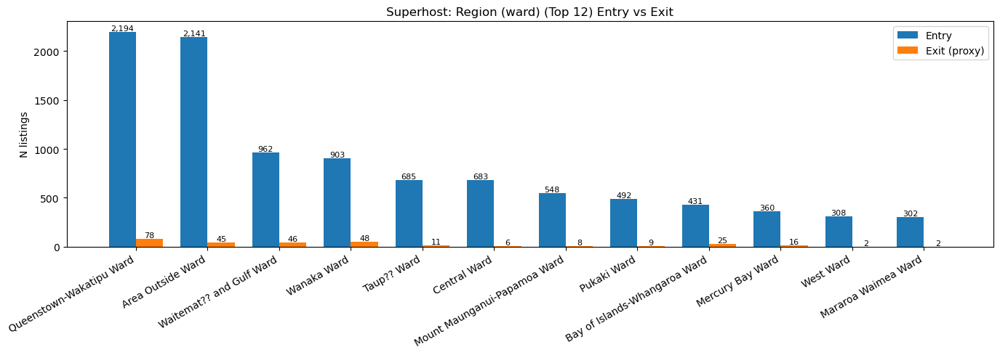

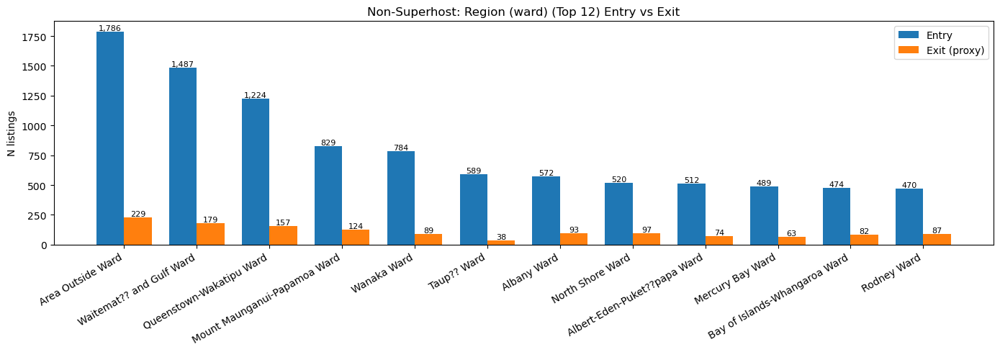


=== Neighbourhood: Top3 per year (Superhost) ===


,year,group,top1_Entry,top1_Exit,top1_share_Entry,top1_share_Exit,top2_Entry,top2_Exit,top2_share_Entry,top2_share_Exit,top3_Entry,top3_Exit,top3_share_Entry,top3_share_Exit
1,2016,Superhost,"Auckland, New Zealand","Auckland, New Zealand",11.17%,100.00%,"Queenstown, Otago, New Zealand",nan,10.38%,nan%,"Wellington, New Zealand",nan,4.07%,nan%
3,2017,Superhost,"Auckland, New Zealand","Cass Bay, Canterbury, New Zealand",13.33%,100.00%,"Queenstown, Otago, New Zealand",nan,6.14%,nan%,"Christchurch, Canterbury, New Zealand",nan,5.29%,nan%
5,2018,Superhost,"Auckland, New Zealand","Lake Hayes Estate, Otago, New Zealand",8.49%,25.00%,"Queenstown, Otago, New Zealand",New Zealand,5.75%,25.00%,"Christchurch, Canterbury, New Zealand","Papamoa, Bay Of Plenty, New Zealand",3.93%,25.00%
7,2019,Superhost,"Auckland, New Zealand","Arrowtown, Otago, New Zealand",8.35%,20.00%,"Queenstown, Otago, New Zealand","Lake Hayes Estate, Otago, New Zealand",4.87%,20.00%,"Christchurch, Canterbury, New Zealand","Queenstown, Otago, New Zealand",4.72%,20.00%
9,2020,Superhost,"Auckland, New Zealand","Auckland, New Zealand",7.51%,18.75%,"Queenstown, Otago, New Zealand","Clarkville, Canterbury, New Zealand",6.05%,6.25%,"Taupo, Waikato, New Zealand","Hot Water Beach, Waikato, New Zealand",3.80%,6.25%
11,2021,Superhost,"Queenstown, Otago, New Zealand","Auckland, New Zealand",8.23%,15.38%,"Auckland, New Zealand","Ohaupo, Waikato, New Zealand",7.51%,15.38%,"Christchurch, Canterbury, New Zealand","Wanaka, Otago, New Zealand",5.45%,15.38%
13,2022,Superhost,"Auckland, New Zealand","Auckland, New Zealand",9.57%,13.33%,"Queenstown, Otago, New Zealand","Queenstown, Otago, New Zealand",8.35%,8.89%,"Christchurch, Canterbury, New Zealand","Nelson, New Zealand",4.63%,6.67%
15,2023,Superhost,"Auckland, New Zealand","Auckland, New Zealand",10.25%,12.86%,"Queenstown, Otago, New Zealand","Waiheke Island, Auckland, New Zealand",6.95%,5.71%,"Christchurch, Canterbury, New Zealand","Ohakune, Manawatu-Wanganui, New Zealand",6.70%,4.29%
17,2024,Superhost,"Auckland, New Zealand","Auckland, New Zealand",12.67%,13.23%,"Christchurch, Canterbury, New Zealand","Queenstown, Otago, New Zealand",11.04%,6.88%,"Queenstown, Otago, New Zealand","Waiheke Island, Auckland, New Zealand",10.19%,5.82%
19,2025,Superhost,"Auckland, New Zealand",nan,16.40%,nan%,"Christchurch, Canterbury, New Zealand",nan,11.99%,nan%,"Queenstown, Otago, New Zealand",nan,10.05%,nan%



=== Neighbourhood: Top3 per year (Non-Superhost) ===


,year,group,top1_Entry,top1_Exit,top1_share_Entry,top1_share_Exit,top2_Entry,top2_Exit,top2_share_Entry,top2_share_Exit,top3_Entry,top3_Exit,top3_share_Entry,top3_share_Exit
0,2016,Non-Superhost,"Auckland, New Zealand","Auckland, New Zealand",16.75%,25.00%,"Christchurch, Canterbury, New Zealand","Amberley, Canterbury, New Zealand",4.79%,12.50%,"Queenstown, Otago, New Zealand","Dalefield, Otago, New Zealand",3.93%,12.50%
2,2017,Non-Superhost,"Auckland, New Zealand","Auckland, New Zealand",14.54%,35.00%,"Queenstown, Otago, New Zealand","Hamilton, Waikato, New Zealand",3.14%,10.00%,"Wellington, New Zealand","Tauranga, Bay Of Plenty, New Zealand",2.55%,10.00%
4,2018,Non-Superhost,"Auckland, New Zealand","Auckland, New Zealand",14.29%,22.22%,"Christchurch, Canterbury, New Zealand","Arrowtown, Otago, New Zealand",3.81%,2.78%,"Wellington, New Zealand","Auckland, , New Zealand",3.17%,2.78%
6,2019,Non-Superhost,"Auckland, New Zealand","Auckland, New Zealand",15.00%,28.00%,"Christchurch, Canterbury, New Zealand","Tauranga, Bay Of Plenty, New Zealand",3.79%,8.00%,"Queenstown, Otago, New Zealand","Blenheim, Marlborough, New Zealand",3.79%,6.00%
8,2020,Non-Superhost,"Auckland, New Zealand","Auckland, New Zealand",11.54%,29.73%,"Christchurch, Canterbury, New Zealand","Christchurch, Canterbury, New Zealand",3.51%,3.60%,"Queenstown, Otago, New Zealand","Queenstown, Otago, New Zealand",2.94%,3.60%
10,2021,Non-Superhost,"Auckland, New Zealand","Auckland, New Zealand",8.72%,18.69%,"Queenstown, Otago, New Zealand","Christchurch, Canterbury, New Zealand",3.12%,4.67%,"Rotorua, Bay of Plenty, New Zealand","Raglan, Waikato, New Zealand",2.34%,2.80%
12,2022,Non-Superhost,"Auckland, New Zealand","Auckland, New Zealand",18.09%,11.06%,"Queenstown, Otago, New Zealand","Christchurch, Canterbury, New Zealand",5.67%,5.03%,"Christchurch, Canterbury, New Zealand","Queenstown, Otago, New Zealand",3.96%,5.03%
14,2023,Non-Superhost,"Auckland, New Zealand","Auckland, New Zealand",18.05%,16.23%,"Christchurch, Canterbury, New Zealand","Queenstown, Otago, New Zealand",6.93%,3.40%,"Queenstown, Otago, New Zealand","Hamilton, Waikato, New Zealand",3.90%,2.83%
16,2024,Non-Superhost,"Auckland, New Zealand","Auckland, New Zealand",18.09%,14.02%,"Queenstown, Otago, New Zealand","Christchurch, Canterbury, New Zealand",4.31%,3.38%,"Christchurch, Canterbury, New Zealand","Queenstown, Otago, New Zealand",3.30%,2.66%
18,2025,Non-Superhost,"Auckland, New Zealand",nan,22.51%,nan%,"Queenstown, Otago Region, New Zealand",nan,3.36%,nan%,"W??naka, Otago, New Zealand",nan,3.23%,nan%


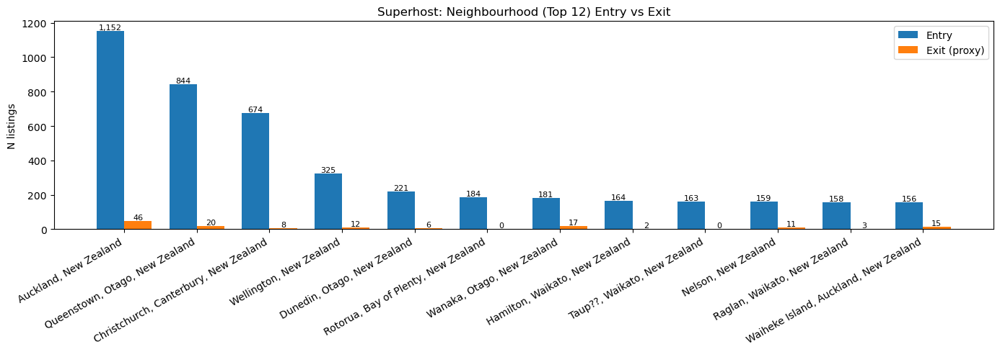

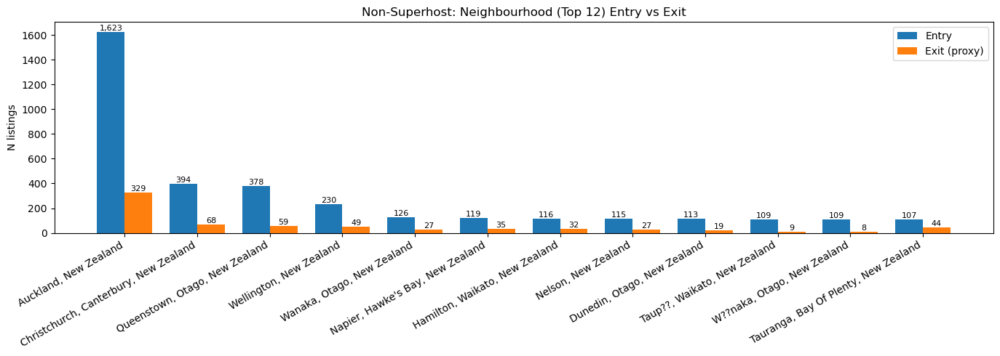

In [1251]:
# location
REG_PARENT = detect_col(d.columns, ["region_parent_name", "region_parent"])
WARD       = detect_col(d.columns, ["region_name", "ward"])
NBHD       = detect_col(d.columns, ["neighbourhood", "neighborhood", "neighbourhood_cleansed", "neighborhood_cleansed"])

print("Detected:", {"Region_parent": REG_PARENT, "Region(ward)": WARD, "Neighbourhood": NBHD})

#Exit rule : only last_review older than 12 months
if LAST_REVIEW is None:
    raise ValueError("Need last_review column to define exit.")
months_12_ago = snapshot_date - pd.DateOffset(months=12)

d["inactive_exit_proxy"] = d[LAST_REVIEW].notna() & (d[LAST_REVIEW] < months_12_ago)
d["exit_year_proxy"] = np.where(d["inactive_exit_proxy"], d[LAST_REVIEW].dt.year, np.nan)
d["exit_year_proxy_int"] = pd.to_numeric(d["exit_year_proxy"], errors="coerce").astype("Int64")

#Build entries / exits
d["entry_year_int"] = pd.to_numeric(d["entry_year"], errors="coerce").astype("Int64")

entries = d[d["entry_year_int"].isin(YEARS)].copy()
entries["event"] = "Entry"
entries["year"]  = entries["entry_year_int"].astype(int)

exits = d[d["inactive_exit_proxy"] & d["exit_year_proxy_int"].isin(YEARS)].copy()
exits["event"] = "Exit"
exits["year"]  = exits["exit_year_proxy_int"].astype(int)

entries = entries.sort_values(["year", ID_COL]).drop_duplicates(["year", ID_COL])
exits   = exits.sort_values(["year", ID_COL]).drop_duplicates(["year", ID_COL])


def _clean_text_series(s):
    s = s.astype(str).str.strip()
    s = s.replace({"": np.nan, "nan": np.nan, "None": np.nan, "NaN": np.nan})
    return s

def annotate_N(ax):
    for p in ax.patches:
        h = p.get_height()
        if np.isnan(h):
            continue
        ax.text(p.get_x() + p.get_width()/2, h, f"{int(h):,}",
                ha="center", va="bottom", fontsize=8)

def topk_table_yearly(entries_df, exits_df, col, k=3):
    """Return wide table: per (year, group), topK category and share for Entry & Exit."""
    if col is None or col not in d.columns:
        return None

    def _build(df_evt):
        base = df_evt[["year","group","event",ID_COL,col]].copy()
        base[col] = _clean_text_series(base[col])
        base = base.dropna(subset=[col])

        totals = (base.groupby(["year","group","event"])[ID_COL]
                  .nunique().rename("N").reset_index())

        counts = (base.groupby(["year","group","event",col])[ID_COL]
                  .nunique().rename("n").reset_index()
                  .merge(totals, on=["year","group","event"], how="left"))
        counts["share"] = counts["n"] / counts["N"].replace(0, np.nan)
        counts["rank"]  = counts.groupby(["year","group","event"])["n"].rank(method="first", ascending=False)
        top = counts[counts["rank"] <= k].sort_values(["year","group","event","rank"])

        rows = []
        for (y,g,e), sub in top.groupby(["year","group","event"]):
            r = {"year": y, "group": g, "event": e}
            for i, (_, rr) in enumerate(sub.iterrows(), start=1):
                r[f"top{i}"] = rr[col]
                r[f"top{i}_share"] = rr["share"]
            rows.append(r)
        return pd.DataFrame(rows)

    tmp = pd.concat([_build(entries_df), _build(exits_df)], ignore_index=True)

    wide = tmp.pivot(index=["year","group"], columns="event",
                     values=[*(sum([[f"top{i}", f"top{i}_share"] for i in range(1,k+1)], []))])

    wide.columns = [f"{a}_{b}" for a,b in wide.columns]  # e.g. top1_Entry, top1_share_Exit ...
    wide = wide.reset_index().sort_values(["group","year"])
    return wide

def plot_top_overall(entries_df, exits_df, col, group_name, topn=12, title=""):
    """Overall bar (across all years): Entry vs Exit counts for top locations, with N labels."""
    if col is None:
        print("Missing col for plot:", title); return

    def cnt(df):
        b = df[df["group"]==group_name][[ID_COL,col]].copy()
        b[col] = _clean_text_series(b[col])
        b = b.dropna(subset=[col])
        return b.groupby(col)[ID_COL].nunique().sort_values(ascending=False)

    ce = cnt(entries_df)
    cx = cnt(exits_df)

    cats = ce.head(topn).index.tolist()
    for c in cx.head(topn).index:
        if c not in cats and len(cats) < topn:
            cats.append(c)

    y1 = ce.reindex(cats).fillna(0).values
    y2 = cx.reindex(cats).fillna(0).values

    x = np.arange(len(cats)); w = 0.38
    fig, ax = plt.subplots(figsize=(14,5))
    ax.bar(x - w/2, y1, w, label="Entry")
    ax.bar(x + w/2, y2, w, label="Exit (proxy)")
    ax.set_xticks(x)
    ax.set_xticklabels(cats, rotation=30, ha="right")
    ax.set_ylabel("N listings")
    ax.set_title(title)
    ax.legend()
    annotate_N(ax)
    plt.tight_layout()
    plt.show()


def run_location_level(level_name, col, k_table=3, topn_plot=12):
    if col is None:
        print(f"\n[{level_name}] skipped: column not found.")
        return

    w = topk_table_yearly(entries, exits, col, k=k_table)
    if w is None or len(w)==0:
        print(f"\n[{level_name}] no data after cleaning.")
        return

    fmt = {c:"{:.2%}" for c in w.columns if "share" in c}

    print(f"\n=== {level_name}: Top{k_table} per year (Superhost) ===")
    display(w[w["group"]=="Superhost"].style.format(fmt))

    print(f"\n=== {level_name}: Top{k_table} per year (Non-Superhost) ===")
    display(w[w["group"]=="Non-Superhost"].style.format(fmt))

    plot_top_overall(entries, exits, col, "Superhost", topn=topn_plot,
                     title=f"Superhost: {level_name} (Top {topn_plot}) Entry vs Exit")
    plot_top_overall(entries, exits, col, "Non-Superhost", topn=topn_plot,
                     title=f"Non-Superhost: {level_name} (Top {topn_plot}) Entry vs Exit")

run_location_level("Region_parent", REG_PARENT, k_table=3, topn_plot=12)
run_location_level("Region (ward)",  WARD,       k_table=3, topn_plot=12)
run_location_level("Neighbourhood",  NBHD,       k_table=3, topn_plot=12)

In [1288]:
report='''
1.Pre-COVID (2016–2019): entries are highly concentrated around Auckland (broad demand hub) and Queenstown-Lakes (tourism destination), 
forming the core location structure of new supply.

COVID-era (2019–2022): the top-concentration pattern largely persists, but Superhost exit geography is less robust because exit samples are small.
   
Post-COVID (2022–2025): entries surge (notably in 2023–2024), and new supply continues to flow into demand-strong regions, 
while exits remain mainly driven by Non-Superhosts—suggesting expansion is accompanied by 
a higher likelihood of inactivity among lower-stability listings.

2.Looking at the Region_parent (regional area), the spatial distribution of new listings (Entries) has long shown a "top-concentration" pattern.
Auckland is almost always the top non-superhost, and its share is mostly around 14%–26%, 
indicating a stable and highly concentrated source of new listings. 

Meanwhile, the Queenstown-Lakes District frequently appears as the second-highest, 
reflecting the continued attractiveness of tourist destinations to new supply. 

In contrast, new Superhost listings tend to shift more frequently between Auckland and the Queenstown-Lakes District, 
often alternating between the two as Top 1 and Top 2, reflecting a supply structure that favors high-demand + first-tier cities.

3.Regarding exits (Exit proxy = last_review < snapshot_date - 12 months), the Superhost table shows 100% top1_share_Exit in many years.
This doesn't mean 100% of Superhosts in that region have exited, but rather that the number of Superhosts judged to have exited that year was very small.

Therefore, the Top 1 is amplified to 100%, making the geographical conclusion less robust. 
Conversely, the Exit sample for Non-Superhosts is larger and more stable: Auckland repeatedly appears as the Top 1 exit location,
with Top1_share_Exit rates mostly between 20% and 43%, meaning that exits (inactivity) are not only concentrated in Auckland 
but also distributed across multiple regions (including Top 2/Top 3). (Christchurch, Queenstown-Lakes, Far North) 
The overall pattern is "mainly in Auckland, but not dominated by a single region."

4.Looking at the Neighbourhood table, the top neighbors for Entries are commonly "Auckland, New Zealand," "Queenstown, Otago, New Zealand," 
and "Christchurch, Canterbury, New Zealand," further confirming that new supply mainly revolves around major cities and popular tourist areas.
Note the presence of garbled characters/abnormal place names (such as W??naka) in the table, 
suggesting potential encoding or cleaning issues in the neighborhood field. 

Finally, the 2025 Exit being NaN is because, based on the current snapshot, 
2025 may not yet be sufficient to establish an exit condition of "no comments for more than 12 months" or the data may be incomplete;
therefore, strong conclusions should not be drawn from the 2025 Exit structure.
'''
print(report)


1.Pre-COVID (2016–2019): entries are highly concentrated around Auckland (broad demand hub) and Queenstown-Lakes (tourism destination), 
forming the core location structure of new supply.

COVID-era (2019–2022): the top-concentration pattern largely persists, but Superhost exit geography is less robust because exit samples are small.
   
Post-COVID (2022–2025): entries surge (notably in 2023–2024), and new supply continues to flow into demand-strong regions, 
while exits remain mainly driven by Non-Superhosts—suggesting expansion is accompanied by 
a higher likelihood of inactivity among lower-stability listings.

2.Looking at the Region_parent (regional area), the spatial distribution of new listings (Entries) has long shown a "top-concentration" pattern.
Auckland is almost always the top non-superhost, and its share is mostly around 14%–26%, 
indicating a stable and highly concentrated source of new listings. 

Meanwhile, the Queenstown-Lakes District frequently appears as the secon

In [1289]:
report='''
1.Based on the combined results of "new listings - exiting listings (based on the rule of last_reviews exceeding 12 months),"price, 
listing configuration (room/property/amenities),and regional distribution (Region/Neighbourhood) from 2016 to 2025, 
the NZ Airbnb market exhibits a clear structure:
continuous overall expansion + relatively stable supply structure + exiting listings primarily from non-superhosts + growth in listings 
and supply concentrated in NZ's core cities and tourist hotspots.

2.In terms of scale and cycle, from 2016 to 2024, "new listings significantly outnumbered exits" almost every year, 
with inventory agency value increasing year by year, indicating that the market as a whole was still in an expansion phase;
2023–2024 saw the strongest surge in new listings, while 2022 showed clear recovery/inflection point characteristics within the COVID-era. 

The decline in the proportion of new Superhost listings in 2025 is more likely due to the fact that only a nine-month sample 
(snapshot on September 23rd) exists for 2025, and these new listings haven't yet stabilized into a stable operating state; 
this cannot be interpreted simply.

3.Analyzing the supply structure and quality, new listings are generally split roughly 50/50 between Superhosts and Non-Superhosts, 
with a slight increase in the proportion of new Superhost listings from 2020 to 2024. 
This reflects a market expansion that is also trending towards greater stability and higher-quality listings. 
However, regarding exits (inactivity), exits are almost entirely dominated by Non-Superhosts (80%–97% in most years), 
indicating that the unstable supply in the market mainly comes from non-top-tier hosts. 

Therefore, "exit share" should be understood as "the proportion of each group in the exit pool that year," rather than a strict exit rate. 
This structural difference means that while the market is growing, 
the existing stock is undergoing continuous filtering—Non-Superhosts are more likely to remain inactive for extended periods,
while Superhosts are more stable.

4.In terms of price and product type, the median price of new listings is not significantly different between the two groups 
(Non-Superhosts are mostly around NZD 200–260, Superhosts are mostly around NZD 150–190), 
but the median price of "exit groups" is often higher (especially for Superhost exits, where the median price fluctuates more), 
indicating that high-priced listings with few reviews are more likely to be judged as inactive.

Also, because the Superhost exit sample is often smaller, the median price can be amplified by a few extreme values,requiring careful interpretation.
In terms of configuration, Entire home/apter/Entire home have long been the dominant types for both Entry and Exit listings, 
indicating a stable main supply structure in the market. Exit listings have a more diversified room type distribution (relatively more private rooms), 
meaning that exiting listings are more varied in type, while new listings are more concentrated in mainstream listing types.

The top items for Amenities show a high degree of consistency between Entry and Exit (Smoke alarm, Wi-Fi, Kitchen, Hot water, Essentials), 
representing basic housing configurations and reflecting more scale than structural differences. 
This has limited explanatory power for identifying which properties are exiting the market.

5.From a regional perspective, both new listings and exits exhibit head-concentration characteristic:
Auckland has long been the core source of both new and exiting non-superhosts, 
while the Queenstown-Lakes District serves as a stable second pole, reflecting the continued attractiveness of the tourism market. 

New superhosts tend to switch between Auckland and Queenstown-Lakes, reflecting a strategic focus on high-demand areas. 
The Neighbourhood level also repeatedly confirms the "core city + tourist hotspot" supply structure. 
The presence of garbled place names indicates a need for further cleanup, otherwise it will affect the accurate estimation of concentration.

6.Conclusion: The NZ Airbnb market continued to expand from 2016 to 2024, and accelerated its growth after 2022 (after the end of COVID-19);
supply and demand were highly stable and concentrated in core and tourist cities; 
the main source of market instability was the long-term inactivity of non-superhosts, 
while superhosts were more retained and stable, presenting an overall dynamic structure of growth.
'''
print(report)


1.Based on the combined results of "new listings - exiting listings (based on the rule of last_reviews exceeding 12 months),"price, 
listing configuration (room/property/amenities),and regional distribution (Region/Neighbourhood) from 2016 to 2025, 
the NZ Airbnb market exhibits a clear structure:
continuous overall expansion + relatively stable supply structure + exiting listings primarily from non-superhosts + growth in listings 
and supply concentrated in NZ's core cities and tourist hotspots.

2.In terms of scale and cycle, from 2016 to 2024, "new listings significantly outnumbered exits" almost every year, 
with inventory agency value increasing year by year, indicating that the market as a whole was still in an expansion phase;
2023–2024 saw the strongest surge in new listings, while 2022 showed clear recovery/inflection point characteristics within the COVID-era. 

The decline in the proportion of new Superhost listings in 2025 is more likely due to the fact that only a nine-mo

In [1272]:
report='''
Branch B.2 Property × Host (Market Impact from the Host Perspective).
This section investigates whether host behaviour shows seasonality and whether such seasonality affects host quality differences. 
We compare Superhosts and Non-Superhosts across peak and off-peak periods using operational metrics
(response rate, response time, acceptance rate, instant booking) and credibility/completeness indicators (verification and missingness patterns). 
The goal is to identify whether seasonal demand conditions amplify or compress the performance gap between host groups.
'''
print(report)


Branch B.2 Property × Host (Market Impact from the Host Perspective).
This section investigates whether host behaviour shows seasonality and whether such seasonality affects host quality differences. 
We compare Superhosts and Non-Superhosts across peak and off-peak periods using operational metrics
(response rate, response time, acceptance rate, instant booking) and credibility/completeness indicators (verification and missingness patterns). 
The goal is to identify whether seasonal demand conditions amplify or compress the performance gap between host groups.



,group,active_start,year,N_entry,N_exit,entry_intensity,exit_rate,net_change,net_growth_rate
0,Non-Superhost,"1,151",2016,"1,155",14,100.35%,1.22%,"1,141",99.13%
2,Non-Superhost,"2,292",2017,"1,549",30,67.58%,1.31%,"1,519",66.27%
4,Non-Superhost,"3,811",2018,"1,539",54,40.38%,1.42%,"1,485",38.97%
6,Non-Superhost,"5,296",2019,"1,737",83,32.80%,1.57%,"1,654",31.23%
8,Non-Superhost,"6,950",2020,"1,342",155,19.31%,2.23%,"1,187",17.08%
10,Non-Superhost,"8,137",2021,"1,466",143,18.02%,1.76%,"1,323",16.26%
12,Non-Superhost,"9,460",2022,"2,109",307,22.29%,3.25%,"1,802",19.05%
14,Non-Superhost,"11,262",2023,"3,518",892,31.24%,7.92%,"2,626",23.32%
16,Non-Superhost,"13,888",2024,"4,682","1,757",33.71%,12.65%,"2,925",21.06%
18,Non-Superhost,"16,813",2025,"4,747",0,28.23%,0.00%,"4,747",28.23%


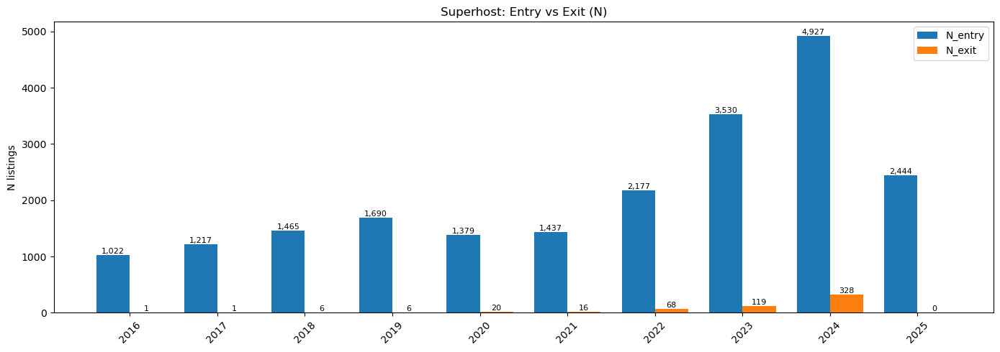

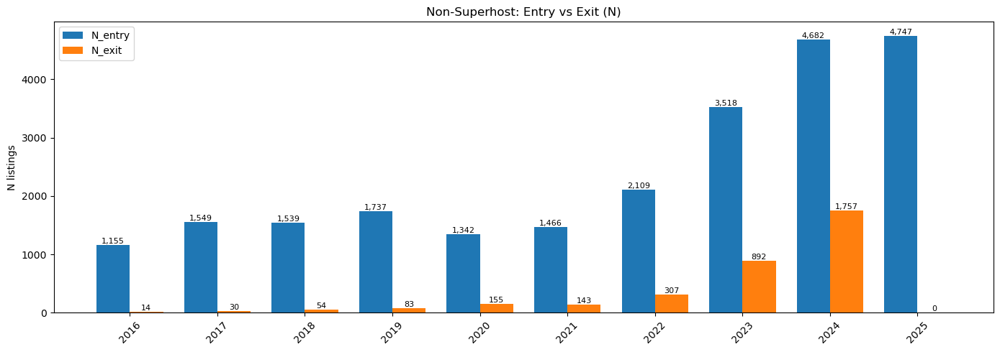

In [1240]:
#property x time x host
LAST_REVIEW = detect_col(d.columns, ["last_review"])
if LAST_REVIEW is None:
    raise ValueError("Need last_review column to define exit.")

months_12_ago = pd.Timestamp(snapshot_date) - pd.DateOffset(months=12)
d["inactive_exit_proxy"] = d[LAST_REVIEW].notna() & (pd.to_datetime(d[LAST_REVIEW], errors="coerce") < months_12_ago)
d["exit_year_proxy"] = np.where(d["inactive_exit_proxy"], pd.to_datetime(d[LAST_REVIEW], errors="coerce").dt.year, np.nan)
d["exit_year_proxy_int"] = pd.to_numeric(d["exit_year_proxy"], errors="coerce").astype("Int64")

# entry year
d["entry_year_int"] = pd.to_numeric(d["entry_year"], errors="coerce").astype("Int64")

#Build yearly Entry/Exit

entries = d[d["entry_year_int"].isin(YEARS)].copy()
entries["year"] = entries["entry_year_int"].astype(int)

exits = d[d["inactive_exit_proxy"] & d["exit_year_proxy_int"].isin(YEARS)].copy()
exits["year"] = exits["exit_year_proxy_int"].astype(int)

# unique listing per year
entries_y = entries.groupby(["year","group"])[ID_COL].nunique().rename("N_entry").reset_index()
exits_y   = exits.groupby(["year","group"])[ID_COL].nunique().rename("N_exit").reset_index()


rows = []
for y in YEARS:
    start = y  # year start conceptually
    active = d[
        (d["entry_year_int"].notna()) &
        (d["entry_year_int"] <= (y-1)) &
        (
            d["exit_year_proxy_int"].isna() |
            (d["exit_year_proxy_int"] >= y)   # exit happens in this year or later => still active at start
        )
    ]
    tmp = active.groupby("group")[ID_COL].nunique().rename("active_start").reset_index()
    tmp["year"] = y
    rows.append(tmp)
active_start_y = pd.concat(rows, ignore_index=True)


# Merge + rates (market impact table)

t = (active_start_y
     .merge(entries_y, on=["year","group"], how="left")
     .merge(exits_y,   on=["year","group"], how="left")
    )
t["N_entry"] = t["N_entry"].fillna(0).astype(int)
t["N_exit"]  = t["N_exit"].fillna(0).astype(int)

t["entry_intensity"] = t["N_entry"] / t["active_start"].replace(0, np.nan)
t["exit_rate"]       = t["N_exit"]  / t["active_start"].replace(0, np.nan)
t["net_change"]      = t["N_entry"] - t["N_exit"]
t["net_growth_rate"] = t["net_change"] / t["active_start"].replace(0, np.nan)

t = t.sort_values(["group","year"])

display(
    t.style.format({
        "active_start": "{:,.0f}",
        "N_entry": "{:,.0f}",
        "N_exit": "{:,.0f}",
        "entry_intensity": "{:.2%}",
        "exit_rate": "{:.2%}",
        "net_change": "{:,.0f}",
        "net_growth_rate": "{:.2%}",
    })
)

#Bar chart 
def plot_metric(tdf, group_name, col1, col2, title, ylabel, fmt="{:,.0f}"):
    sub = tdf[tdf["group"] == group_name].sort_values("year")
    x = np.arange(len(sub))
    w = 0.38
    y1 = pd.to_numeric(sub[col1], errors="coerce").fillna(0).values
    y2 = pd.to_numeric(sub[col2], errors="coerce").fillna(0).values

    fig, ax = plt.subplots(figsize=(14,5))
    b1 = ax.bar(x - w/2, y1, w, label=col1)
    b2 = ax.bar(x + w/2, y2, w, label=col2)
    ax.set_xticks(x)
    ax.set_xticklabels(sub["year"].tolist(), rotation=45)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.legend()

    for b in list(b1)+list(b2):
        h = b.get_height()
        ax.text(b.get_x()+b.get_width()/2, h, fmt.format(h), ha="center", va="bottom", fontsize=8)

    plt.tight_layout()
    plt.show()

# N Entry vs N Exit 
plot_metric(t, "Superhost", "N_entry", "N_exit", "Superhost: Entry vs Exit (N)", "N listings")
plot_metric(t, "Non-Superhost", "N_entry", "N_exit", "Non-Superhost: Entry vs Exit (N)", "N listings")

In [1253]:
report='''
From 2016 to 2025, both the superhost and non-superhost markets expanded: the number of new listings each year far exceeded the number of exits, 
resulting in a continuous increase in net growth, with 2023-2024 seeing the most explosive growth in new listings.

Exiting proxies (based on last_reviews exceeding 12 months) was primarily concentrated in non-superhosts: 
their number of exits and exit rate were significantly higher; superhosts maintained a consistently low exit rate and were generally more stable.
'''
print(report)


From 2016 to 2025, both the superhost and non-superhost markets expanded: the number of new listings each year far exceeded the number of exits, 
resulting in a continuous increase in net growth, with 2023-2024 seeing the most explosive growth in new listings.

Exiting proxies (based on last_reviews exceeding 12 months) was primarily concentrated in non-superhosts: 
their number of exits and exit rate were significantly higher; superhosts maintained a consistently low exit rate and were generally more stable.



Detected: {'HRR': 'host_response_rate', 'HRT': 'host_response_time', 'HAR': 'host_acceptance_rate', 'IB': 'instant_bookable'}

=== Table A (Entry cohort): response/accept/instant by year ===


,year,group,N,median_response_rate,median_acceptance_rate,instant_bookable_share
0,2016,Non-Superhost,"1,155",100.00%,94.00%,28.31%
2,2017,Non-Superhost,"1,549",100.00%,100.00%,42.29%
4,2018,Non-Superhost,"1,539",100.00%,98.00%,36.58%
6,2019,Non-Superhost,"1,737",100.00%,99.00%,39.38%
8,2020,Non-Superhost,"1,342",100.00%,99.00%,42.55%
10,2021,Non-Superhost,"1,466",100.00%,99.00%,47.89%
12,2022,Non-Superhost,"2,109",100.00%,100.00%,44.48%
14,2023,Non-Superhost,"3,518",100.00%,98.00%,35.67%
16,2024,Non-Superhost,"4,682",100.00%,98.00%,36.16%
18,2025,Non-Superhost,"4,747",100.00%,100.00%,37.22%



=== Table B (Entry cohort): response_time distribution shares ===


resp_time_cat,year,group,Within an hour,Within a few hours,Within a day,A few days or more,Unknown
0,2016,Non-Superhost,37.66%,12.03%,12.12%,5.11%,33.07%
2,2017,Non-Superhost,51.26%,10.85%,8.84%,2.97%,26.08%
4,2018,Non-Superhost,47.30%,11.57%,10.66%,2.53%,27.94%
6,2019,Non-Superhost,47.67%,10.13%,10.02%,2.53%,29.65%
8,2020,Non-Superhost,52.38%,9.91%,8.87%,2.61%,26.23%
10,2021,Non-Superhost,53.75%,13.10%,8.19%,2.59%,22.37%
12,2022,Non-Superhost,56.14%,9.39%,8.68%,1.80%,23.99%
14,2023,Non-Superhost,52.50%,10.69%,9.10%,3.92%,23.79%
16,2024,Non-Superhost,55.06%,11.23%,10.02%,3.57%,20.12%
18,2025,Non-Superhost,64.93%,13.86%,7.82%,1.24%,12.16%


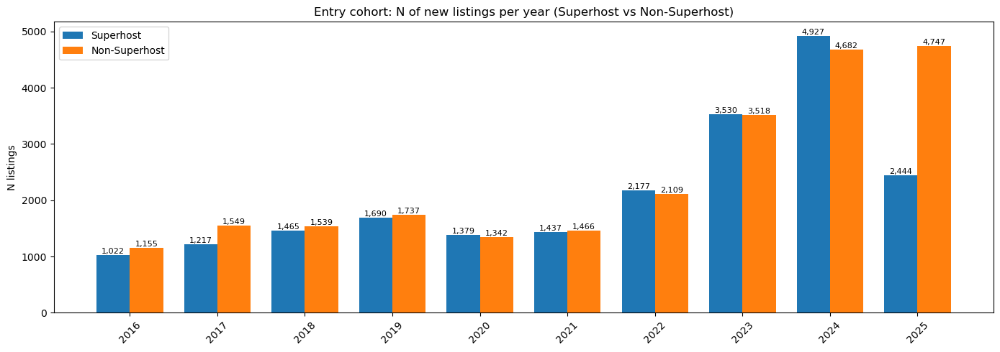

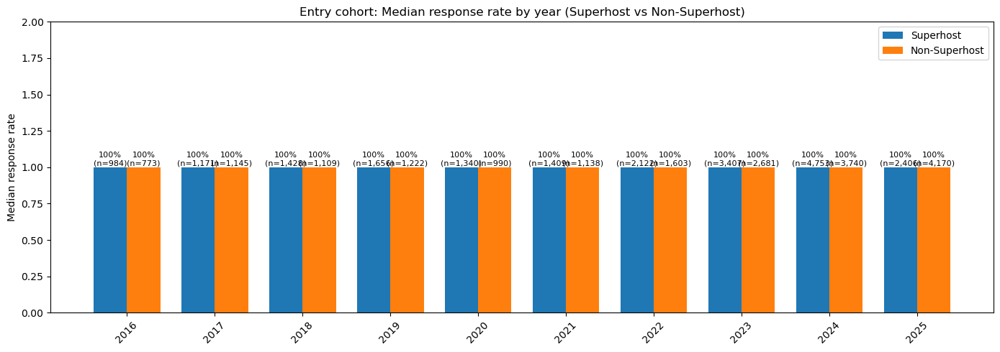

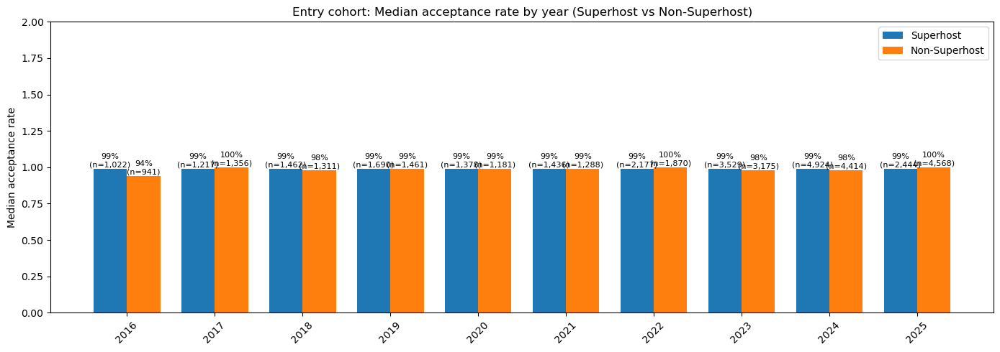

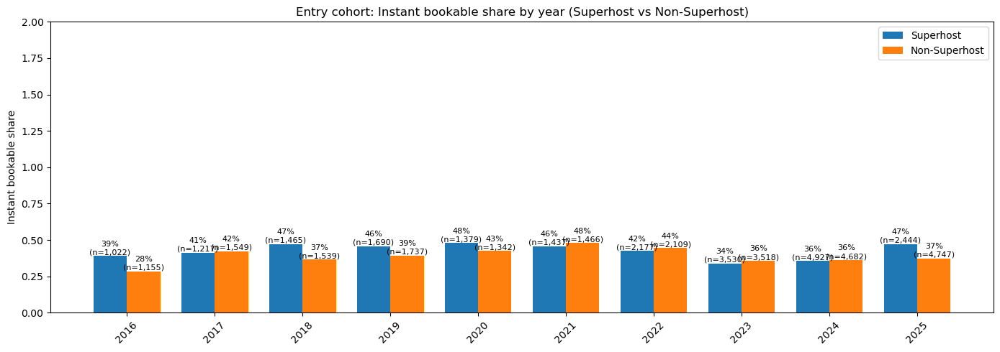

In [1247]:
# Property × Host (Group 1): responsiveness factors over time (YEARLY, Entry cohort)
HRR = detect_col(d.columns, ["host_response_rate", "response_rate"])
HRT = detect_col(d.columns, ["host_response_time", "response_time"])
HAR = detect_col(d.columns, ["host_acceptance_rate", "acceptance_rate"])
IB  = detect_col(d.columns, ["instant_bookable", "is_instant_bookable", "instantbookable"])

print("Detected:", {"HRR": HRR, "HRT": HRT, "HAR": HAR, "IB": IB})

def pct01(s):
    if s is None:
        return None
    x = (
        s.astype(str).str.strip().str.replace("%", "", regex=False)
         .replace({"": np.nan, "nan": np.nan, "None": np.nan})
    )
    x = pd.to_numeric(x, errors="coerce")
    return np.where(x <= 1, x, x / 100.0)

def norm_response_time(x):
    if pd.isna(x):
        return "Unknown"
    s = str(x).strip().lower()
    if s in ("", "nan", "none"):
        return "Unknown"
    if "within an hour" in s or "within 1 hour" in s:
        return "Within an hour"
    if "within a few hours" in s:
        return "Within a few hours"
    if "within a day" in s or "within 24" in s:
        return "Within a day"
    if "a few days" in s or "more than a day" in s or "within a few days" in s:
        return "A few days or more"
    return "Other"

def annotate_vals_with_n(ax, val_fmt, ns=None):
    for i, p in enumerate(ax.patches):
        h = p.get_height()
        if np.isnan(h):
            continue
        n_txt = f"\n(n={int(ns[i]):,})" if ns is not None else ""
        ax.text(
            p.get_x() + p.get_width()/2, h,
            val_fmt.format(h) + n_txt,
            ha="center", va="bottom", fontsize=8
        )

def plot_yearly_metric(tbl, group_name, y_col, title, ylabel, val_fmt="{:.0%}", ylim=None):
    sub = tbl[tbl["group"] == group_name].sort_values("year")
    x = np.arange(len(sub))
    y = pd.to_numeric(sub[y_col], errors="coerce").values
    n = pd.to_numeric(sub["N"], errors="coerce").fillna(0).astype(int).values

    fig, ax = plt.subplots(figsize=(14, 5))
    ax.bar(x, y)
    ax.set_xticks(x)
    ax.set_xticklabels(sub["year"].tolist(), rotation=45)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    if ylim is not None:
        ax.set_ylim(ylim)

    annotate_vals_with_n(ax, val_fmt=val_fmt, ns=n)
    plt.tight_layout()
    plt.show()

def plot_yearly_counts(tbl, group_name, title):
    sub = tbl[tbl["group"] == group_name].sort_values("year")
    x = np.arange(len(sub))
    y = pd.to_numeric(sub["N"], errors="coerce").fillna(0).values

    fig, ax = plt.subplots(figsize=(14, 5))
    ax.bar(x, y)
    ax.set_xticks(x)
    ax.set_xticklabels(sub["year"].tolist(), rotation=45)
    ax.set_ylabel("N listings")
    ax.set_title(title)

    annotate_vals_with_n(ax, val_fmt="{:,.0f}")
    plt.tight_layout()
    plt.show()

#  build Entry 
if "entry_year_int" not in d.columns:
    d["entry_year_int"] = pd.to_numeric(d.get("entry_year", np.nan), errors="coerce").astype("Int64")

entries_evt = d[d["entry_year_int"].isin(YEARS)].copy()
entries_evt["year"] = entries_evt["entry_year_int"].astype(int)


entries_evt = entries_evt.sort_values(["year", ID_COL]).drop_duplicates(["year", ID_COL])

# clean metrics 
if HRR is not None and HRR in entries_evt.columns:
    entries_evt["resp_rate01"] = pct01(entries_evt[HRR]).astype(float)
else:
    entries_evt["resp_rate01"] = np.nan

if HAR is not None and HAR in entries_evt.columns:
    entries_evt["acc_rate01"] = pct01(entries_evt[HAR]).astype(float)
else:
    entries_evt["acc_rate01"] = np.nan

if IB is not None and IB in entries_evt.columns:
    entries_evt["instant01"] = bool01(entries_evt[IB]).astype(int)
else:
    entries_evt["instant01"] = np.nan

if HRT is not None and HRT in entries_evt.columns:
    entries_evt["resp_time_cat"] = entries_evt[HRT].apply(norm_response_time)
else:
    entries_evt["resp_time_cat"] = "Unknown"

# Table numeric + instant bookable
tblA = (
    entries_evt.groupby(["year", "group"])
    .agg(
        N=(ID_COL, "nunique"),
        median_response_rate=("resp_rate01", "median"),
        median_acceptance_rate=("acc_rate01", "median"),
        instant_bookable_share=("instant01", "mean"),
    )
    .reset_index()
    .sort_values(["group", "year"])
)

print("\n=== Table A (Entry cohort): response/accept/instant by year ===")
display(
    tblA.style.format({
        "N": "{:,.0f}",
        "median_response_rate": "{:.2%}",
        "median_acceptance_rate": "{:.2%}",
        "instant_bookable_share": "{:.2%}",
    })
)

# Table response_time distribution shares
order = ["Within an hour", "Within a few hours", "Within a day", "A few days or more", "Other", "Unknown"]

base = entries_evt.groupby(["year", "group"])[ID_COL].nunique().rename("N").reset_index()

dist = (
    entries_evt.groupby(["year", "group", "resp_time_cat"])[ID_COL]
    .nunique().rename("n").reset_index()
    .merge(base, on=["year","group"], how="left")
)
dist["share"] = dist["n"] / dist["N"].replace(0, np.nan)
dist["resp_time_cat"] = pd.Categorical(dist["resp_time_cat"], categories=order, ordered=True)

tblB = (
    dist.pivot_table(
        index=["year","group"],
        columns="resp_time_cat",
        values="share",
        fill_value=0.0,
        observed=False
    )
    .reset_index()
    .sort_values(["group","year"])
)
print("\n=== Table B (Entry cohort): response_time distribution shares ===")
fmtB = {c: "{:.2%}" for c in tblB.columns if c not in ("year","group")}
display(tblB.style.format(fmtB))

#  Bar charts
tblA = (
    entries_evt.groupby(["year", "group"])
    .agg(
        N=(ID_COL, "nunique"),

        median_response_rate=("resp_rate01", "median"),
        n_response_rate=("resp_rate01", lambda s: s.notna().sum()),

        median_acceptance_rate=("acc_rate01", "median"),
        n_acceptance_rate=("acc_rate01", lambda s: s.notna().sum()),

        instant_bookable_share=("instant01", "mean"),
        n_instant=("instant01", lambda s: s.notna().sum()),
    )
    .reset_index()
    .sort_values(["year", "group"])
)

def plot_two_groups_by_year(tbl, value_col, n_col, title, ylabel, val_fmt="{:.0%}", ylim=None):
    YEARS_ALL = sorted(tbl["year"].unique().tolist())
    groups = ["Superhost", "Non-Superhost"]

    # wide: year x group
    v = (tbl.pivot(index="year", columns="group", values=value_col)
           .reindex(YEARS_ALL).reindex(columns=groups))
    n = (tbl.pivot(index="year", columns="group", values=n_col)
           .reindex(YEARS_ALL).reindex(columns=groups))

    x = np.arange(len(YEARS_ALL))
    w = 0.38

    y_left  = pd.to_numeric(v["Superhost"], errors="coerce").values
    y_right = pd.to_numeric(v["Non-Superhost"], errors="coerce").values
    n_left  = pd.to_numeric(n["Superhost"], errors="coerce").fillna(0).astype(int).values
    n_right = pd.to_numeric(n["Non-Superhost"], errors="coerce").fillna(0).astype(int).values

    fig, ax = plt.subplots(figsize=(14, 5))
    b1 = ax.bar(x - w/2, np.nan_to_num(y_left,  nan=0.0), w, label="Superhost")
    b2 = ax.bar(x + w/2, np.nan_to_num(y_right, nan=0.0), w, label="Non-Superhost")

    ax.set_xticks(x)
    ax.set_xticklabels(YEARS_ALL, rotation=45)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.legend()
    if ylim is not None:
        ax.set_ylim(ylim)

    def _annot(bars, ys, ns):
        for bar, y, nn in zip(bars, ys, ns):
            if np.isnan(y):
                continue
            ax.text(
                bar.get_x() + bar.get_width()/2,
                bar.get_height(),
                f"{val_fmt.format(y)}\n(n={nn:,})",
                ha="center", va="bottom", fontsize=8
            )

    _annot(b1, y_left,  n_left)
    _annot(b2, y_right, n_right)

    plt.tight_layout()
    plt.show()

def plot_two_groups_counts(tbl, title):
    YEARS_ALL = sorted(tbl["year"].unique().tolist())
    groups = ["Superhost", "Non-Superhost"]

    v = (tbl.pivot(index="year", columns="group", values="N")
           .reindex(YEARS_ALL).reindex(columns=groups))

    x = np.arange(len(YEARS_ALL))
    w = 0.38
    y_left  = pd.to_numeric(v["Superhost"], errors="coerce").fillna(0).values
    y_right = pd.to_numeric(v["Non-Superhost"], errors="coerce").fillna(0).values

    fig, ax = plt.subplots(figsize=(14, 5))
    b1 = ax.bar(x - w/2, y_left,  w, label="Superhost")
    b2 = ax.bar(x + w/2, y_right, w, label="Non-Superhost")

    ax.set_xticks(x)
    ax.set_xticklabels(YEARS_ALL, rotation=45)
    ax.set_ylabel("N listings")
    ax.set_title(title)
    ax.legend()

    for bars in (b1, b2):
        for bar in bars:
            h = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2, h, f"{int(h):,}",
                    ha="center", va="bottom", fontsize=8)

    plt.tight_layout()
    plt.show()

# N entries per year
plot_two_groups_counts(tblA, "Entry cohort: N of new listings per year (Superhost vs Non-Superhost)")

#median response rate
if tblA["median_response_rate"].notna().any():
    plot_two_groups_by_year(
        tblA, "median_response_rate", "n_response_rate",
        "Entry cohort: Median response rate by year (Superhost vs Non-Superhost)",
        "Median response rate", val_fmt="{:.0%}", ylim=(0, 2)
    )

#median acceptance rate
if tblA["median_acceptance_rate"].notna().any():
    plot_two_groups_by_year(
        tblA, "median_acceptance_rate", "n_acceptance_rate",
        "Entry cohort: Median acceptance rate by year (Superhost vs Non-Superhost)",
        "Median acceptance rate", val_fmt="{:.0%}", ylim=(0, 2)
    )

#instant bookable share
if tblA["instant_bookable_share"].notna().any():
    plot_two_groups_by_year(
        tblA, "instant_bookable_share", "n_instant",
        "Entry cohort: Instant bookable share by year (Superhost vs Non-Superhost)",
        "Instant bookable share", val_fmt="{:.0%}", ylim=(0, 2)
    )

In [1254]:
report='''
Looking at new listings (Entries) from 2016 to 2025, both Superhosts and Non-Superhosts are expanding, 
with the peak of new listings concentrated in 2023-2024, while Non-Superhosts saw stronger growth in 2025. 
However, in terms of host behavior metrics, the median response rate has been almost 100% year after year, 
and the median booking acceptance rate has consistently been close to 98-100%, indicating a significant ceiling effect in these metrics, 
making them unsuitable for distinguishing between Superhosts and Non-Superhosts. 

The real differentiator lies in response-time distribution and data completeness: 
Superhosts consistently maintain a higher "respond within 1 hour" response time, with a very low probability of not responding;
Non-Superhosts have a higher percentage of "Unknown" entries, but this percentage is decreasing year by year, 
indicating that the completeness of information/records for new hosts is improving. 

Finally, the proportion of Instant Books fluctuates significantly and is not always higher than that of Superhost 
(both groups saw a decline in 2023–2024).
It is more like a "market-driven variable" influenced by platform policies, supply and demand structure, or operational strategies, 
rather than a stable characteristic of Superhost.
'''
print(report)


Looking at new listings (Entries) from 2016 to 2025, both Superhosts and Non-Superhosts are expanding, 
with the peak of new listings concentrated in 2023-2024, while Non-Superhosts saw stronger growth in 2025. 
However, in terms of host behavior metrics, the median response rate has been almost 100% year after year, 
and the median booking acceptance rate has consistently been close to 98-100%, indicating a significant ceiling effect in these metrics, 
making them unsuitable for distinguishing between Superhosts and Non-Superhosts. 

The real differentiator lies in response-time distribution and data completeness: 
Superhosts consistently maintain a higher "respond within 1 hour" response time, with a very low probability of not responding;
Non-Superhosts have a higher percentage of "Unknown" entries, but this percentage is decreasing year by year, 
indicating that the completeness of information/records for new hosts is improving. 

Finally, the proportion of Instant Books fluctuate

Detected: {'identity_verified': 'host_identity_verified', 'host_verifications': 'host_verifications', 'has_profile_pic': 'host_has_profile_pic', 'host_about': 'host_about'}

=== Table (Entry cohort): Trust & credibility by year ===


,year,group,N,identity_verified_share,n_identity_verified,verifications_count_median,n_verifications,has_profile_pic_share,n_profile_pic,about_length_median,n_about_len,about_nonempty_share,n_about_nonempty
0,2016,Non-Superhost,"1,155",92.29%,1155,2.00,1155,98.96%,1155,62,1155,56.02%,1155
2,2017,Non-Superhost,"1,549",96.38%,1549,2.00,1548,99.35%,1549,0,1549,41.83%,1549
4,2018,Non-Superhost,"1,539",93.96%,1539,2.00,1538,98.25%,1539,20,1539,51.53%,1539
6,2019,Non-Superhost,"1,737",94.01%,1737,2.00,1737,98.68%,1737,0,1737,46.40%,1737
8,2020,Non-Superhost,"1,342",93.67%,1342,2.00,1342,96.65%,1342,0,1342,37.26%,1342
10,2021,Non-Superhost,"1,466",91.00%,1466,2.00,1462,97.41%,1466,0,1466,38.88%,1466
12,2022,Non-Superhost,"2,109",94.78%,2109,2.00,2107,96.35%,2109,0,2109,36.70%,2109
14,2023,Non-Superhost,"3,518",97.33%,3518,2.00,3516,93.21%,3518,0,3518,37.52%,3518
16,2024,Non-Superhost,"4,682",94.62%,4682,2.00,4682,90.90%,4682,0,4682,35.58%,4682
18,2025,Non-Superhost,"4,747",93.30%,4747,2.00,4746,87.40%,4747,0,4747,32.69%,4747


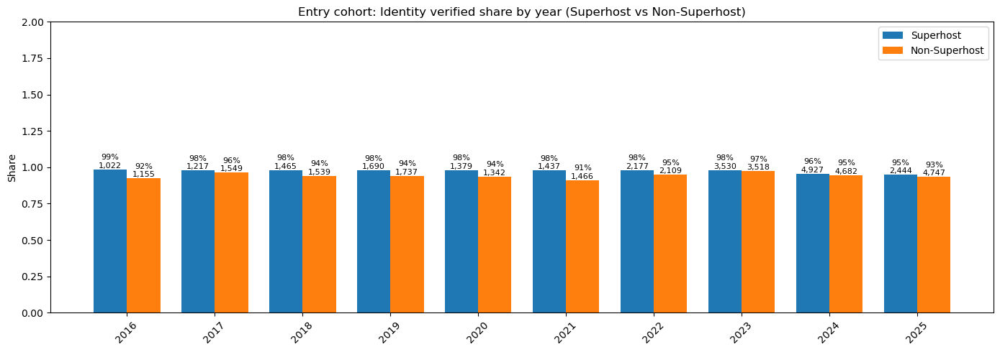

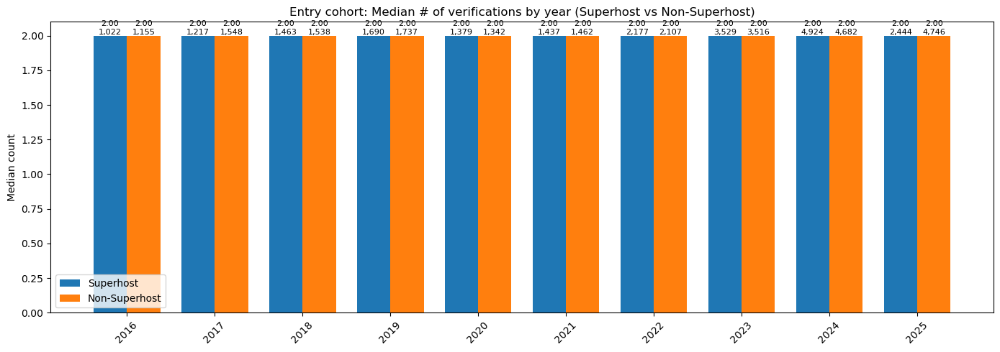

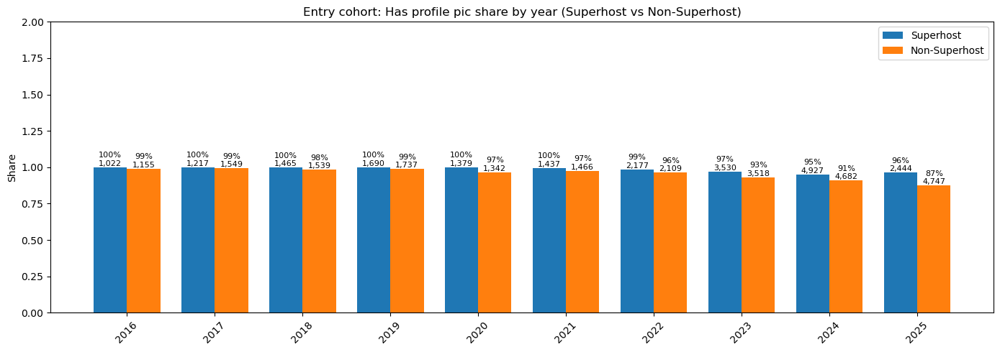

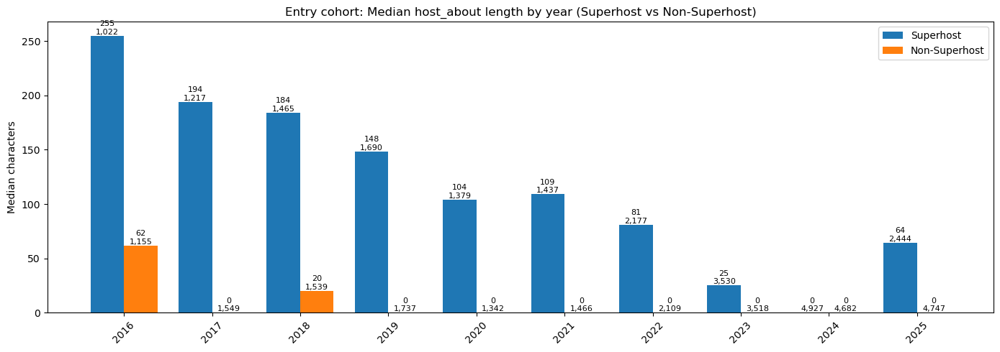

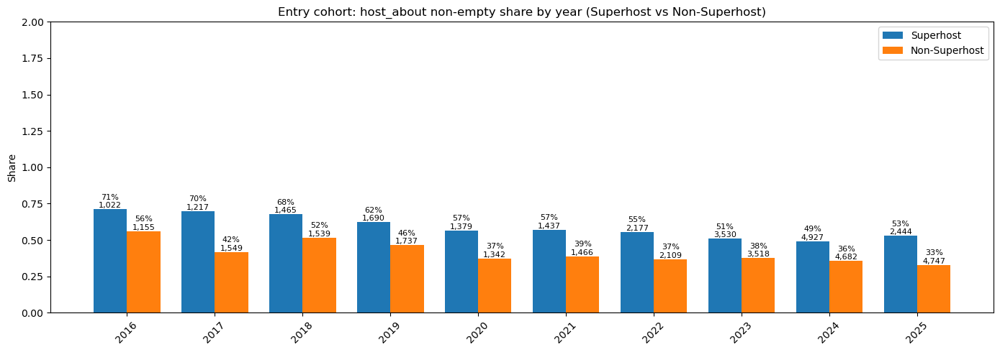

In [1252]:
IDV = detect_col(d.columns, ["host_identity_verified", "identity_verified"])
VER = detect_col(d.columns, ["host_verifications", "verifications"])
PIC = detect_col(d.columns, ["host_has_profile_pic", "has_profile_pic", "profile_pic"])
ABOUT = detect_col(d.columns, ["host_about", "about"])

print("Detected:", {"identity_verified": IDV, "host_verifications": VER, "has_profile_pic": PIC, "host_about": ABOUT})

# Ensure entry 
if "entry_year_int" not in d.columns:
    d["entry_year_int"] = pd.to_numeric(d.get("entry_year", np.nan), errors="coerce").astype("Int64")

entries_evt = d[d["entry_year_int"].isin(YEARS)].copy()
entries_evt["year"] = entries_evt["entry_year_int"].astype(int)
entries_evt = entries_evt.sort_values(["year", ID_COL]).drop_duplicates(["year", ID_COL])


def _safe_str(x):
    if pd.isna(x):
        return ""
    s = str(x).strip()
    if s.lower() in ("nan", "none"):
        return ""
    return s

def parse_verifications_count(x):
    s = _safe_str(x)
    if not s:
        return np.nan

    try:
        v = ast.literal_eval(s)
        if isinstance(v, (list, tuple, set)):
            items = [str(i).strip() for i in v if str(i).strip()]
            return float(len(items))
    except Exception:
        pass

    s2 = s
    if (s2.startswith("{") and s2.endswith("}")) or (s2.startswith("[") and s2.endswith("]")):
        s2 = s2[1:-1].strip()

    if "|" in s2:
        parts = [p.strip().strip("'\"") for p in s2.split("|") if p.strip()]
        return float(len(parts))
    if "," in s2:
        parts = [p.strip().strip("'\"") for p in s2.split(",") if p.strip()]
        return float(len(parts))

    return 1.0

def about_len(x):
    s = _safe_str(x)
    return len(s)

def about_nonempty(x):
    return 1 if len(_safe_str(x)) > 0 else 0

def annotate_vals_with_n(ax, val_fmt, ns):
    for i, p in enumerate(ax.patches):
        h = p.get_height()
        if np.isnan(h):
            continue
        ax.text(
            p.get_x() + p.get_width()/2, h,
            f"{val_fmt.format(h)}\n(n={int(ns[i]):,})",
            ha="center", va="bottom", fontsize=8
        )

def plot_two_groups_by_year(tbl, value_col, n_col, title, ylabel, val_fmt="{:.0%}", ylim=None, show_n=True):
    years_all = sorted(tbl["year"].unique().tolist())
    groups = ["Superhost", "Non-Superhost"]

    v = (tbl.pivot(index="year", columns="group", values=value_col)
           .reindex(years_all).reindex(columns=groups))
    n = (tbl.pivot(index="year", columns="group", values=n_col)
           .reindex(years_all).reindex(columns=groups))

    x = np.arange(len(years_all))
    w = 0.38

    y_sup = pd.to_numeric(v["Superhost"], errors="coerce").values
    y_non = pd.to_numeric(v["Non-Superhost"], errors="coerce").values
    n_sup = pd.to_numeric(n["Superhost"], errors="coerce").fillna(0).astype(int).values
    n_non = pd.to_numeric(n["Non-Superhost"], errors="coerce").fillna(0).astype(int).values

    fig, ax = plt.subplots(figsize=(14, 5))
    b1 = ax.bar(x - w/2, np.nan_to_num(y_sup, nan=0.0), w, label="Superhost")
    b2 = ax.bar(x + w/2, np.nan_to_num(y_non, nan=0.0), w, label="Non-Superhost")

    ax.set_xticks(x)
    ax.set_xticklabels(years_all, rotation=45)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.legend()
    if ylim is not None:
        ax.set_ylim(ylim)

    for p, val, nn in zip(list(b1), y_sup, n_sup):
        if np.isnan(val):
            continue
        label = val_fmt.format(val)
        if show_n:
            label += f"\n{nn:,}"
        ax.text(p.get_x()+p.get_width()/2, p.get_height(), label,
                ha="center", va="bottom", fontsize=8)

    for p, val, nn in zip(list(b2), y_non, n_non):
        if np.isnan(val):
            continue
        label = val_fmt.format(val)
        if show_n:
            label += f"\n{nn:,}"
        ax.text(p.get_x()+p.get_width()/2, p.get_height(), label,
                ha="center", va="bottom", fontsize=8)

    plt.tight_layout()
    plt.show()

# Build features
if IDV is not None and IDV in entries_evt.columns:
    entries_evt["idv01"] = bool01(entries_evt[IDV]).astype(float)
else:
    entries_evt["idv01"] = np.nan

# profile pic
if PIC is not None and PIC in entries_evt.columns:
    entries_evt["pic01"] = bool01(entries_evt[PIC]).astype(float)
else:
    entries_evt["pic01"] = np.nan

# verifications count 
if VER is not None and VER in entries_evt.columns:
    entries_evt["ver_cnt"] = entries_evt[VER].apply(parse_verifications_count)
else:
    entries_evt["ver_cnt"] = np.nan

if ABOUT is not None and ABOUT in entries_evt.columns:
    entries_evt["about_len"] = entries_evt[ABOUT].apply(about_len).astype(float)
    entries_evt["about_nonempty"] = entries_evt[ABOUT].apply(about_nonempty).astype(float)
else:
    entries_evt["about_len"] = np.nan
    entries_evt["about_nonempty"] = np.nan

# Yearly table 
tblT = (
    entries_evt.groupby(["year","group"])
    .agg(
        N=(ID_COL, "nunique"),

        identity_verified_share=("idv01", "mean"),
        n_identity_verified=("idv01", lambda s: s.notna().sum()),

        verifications_count_median=("ver_cnt", "median"),
        n_verifications=("ver_cnt", lambda s: s.notna().sum()),

        has_profile_pic_share=("pic01", "mean"),
        n_profile_pic=("pic01", lambda s: s.notna().sum()),

        about_length_median=("about_len", "median"),
        n_about_len=("about_len", lambda s: s.notna().sum()),

        about_nonempty_share=("about_nonempty", "mean"),
        n_about_nonempty=("about_nonempty", lambda s: s.notna().sum()),
    )
    .reset_index()
    .sort_values(["group","year"])
)

print("\n=== Table (Entry cohort): Trust & credibility by year ===")
display(
    tblT.style.format({
        "N": "{:,.0f}",

        "identity_verified_share": "{:.2%}",
        "verifications_count_median": "{:.2f}",
        "has_profile_pic_share": "{:.2%}",

        "about_length_median": "{:,.0f}",
        "about_nonempty_share": "{:.2%}",
    })
)

# Bar chartsSuper vs Non
if tblT["identity_verified_share"].notna().any():
    plot_two_groups_by_year(tblT, "identity_verified_share", "n_identity_verified",
                            "Entry cohort: Identity verified share by year (Superhost vs Non-Superhost)",
                            "Share", val_fmt="{:.0%}", ylim=(0,2))

if tblT["verifications_count_median"].notna().any():
    plot_two_groups_by_year(tblT, "verifications_count_median", "n_verifications",
                            "Entry cohort: Median # of verifications by year (Superhost vs Non-Superhost)",
                            "Median count", val_fmt="{:.2f}")

if tblT["has_profile_pic_share"].notna().any():
    plot_two_groups_by_year(tblT, "has_profile_pic_share", "n_profile_pic",
                            "Entry cohort: Has profile pic share by year (Superhost vs Non-Superhost)",
                            "Share", val_fmt="{:.0%}", ylim=(0,2))

if tblT["about_length_median"].notna().any():
    plot_two_groups_by_year(tblT, "about_length_median", "n_about_len",
                            "Entry cohort: Median host_about length by year (Superhost vs Non-Superhost)",
                            "Median characters", val_fmt="{:,.0f}")

if tblT["about_nonempty_share"].notna().any():
    plot_two_groups_by_year(tblT, "about_nonempty_share", "n_about_nonempty",
                            "Entry cohort: host_about non-empty share by year (Superhost vs Non-Superhost)",
                            "Share", val_fmt="{:.0%}", ylim=(0,2))

In [1255]:
report='''
Looking at new entry cohorts from 2016 to 2025, the "hard trust" indicator for hosts is nearing saturation:
both groups have consistently high identity verification rates (Non-Superhosts are mostly over 90%, while Superhosts are more stable and higher), 
and the median number of identity verifications has remained almost unchanged at 2 each year, offering little differentiation. 

The real difference lies in "profile completeness": 
Superhosts are more likely to include profile pictures and are more willing to fill out their host_about section 
(the percentage of non-empty profiles is  significantly higher than that of Non-Superhosts). 

Meanwhile, the overall completeness of profiles for both groups is declining, especially for Non-Superhosts, 
indicating that new hosts entering the market in recent years tend to "write less or no information," 
while Superhosts maintain a relatively more complete and credible profile image.
'''
print(report)


Looking at new entry cohorts from 2016 to 2025, the "hard trust" indicator for hosts is nearing saturation:
both groups have consistently high identity verification rates (Non-Superhosts are mostly over 90%, while Superhosts are more stable and higher), 
and the median number of identity verifications has remained almost unchanged at 2 each year, offering little differentiation. 

The real difference lies in "profile completeness": 
Superhosts are more likely to include profile pictures and are more willing to fill out their host_about section 
(the percentage of non-empty profiles is  significantly higher than that of Non-Superhosts). 

Meanwhile, the overall completeness of profiles for both groups is declining, especially for Non-Superhosts, 
indicating that new hosts entering the market in recent years tend to "write less or no information," 
while Superhosts maintain a relatively more complete and credible profile image.



=== Table A: Ops metrics by season (Superhost vs Non-Superhost) ===


,season,group,N,median_response_rate,median_acceptance_rate,instant_bookable_share
0,Autumn,Non-Superhost,"5,005",100.00%,98.00%,35.00%
1,Autumn,Superhost,"3,709",100.00%,99.00%,37.91%
2,Spring,Non-Superhost,"2,844",100.00%,99.00%,39.17%
3,Spring,Superhost,"4,905",100.00%,99.00%,40.84%
4,Summer,Non-Superhost,"4,869",100.00%,97.00%,32.76%
5,Summer,Superhost,"1,325",100.00%,98.00%,44.15%
6,Winter,Non-Superhost,"7,899",100.00%,99.00%,44.71%
7,Winter,Superhost,"11,359",100.00%,99.00%,40.55%



=== Table B: Response time distribution shares by season ===


resp_time_cat,season,group,Within an hour,Within a few hours,Within a day,A few days or more,Unknown
0,Autumn,Non-Superhost,45.57%,12.47%,12.11%,3.10%,26.75%
1,Autumn,Superhost,66.38%,16.77%,7.09%,0.49%,9.27%
2,Spring,Non-Superhost,63.96%,9.74%,6.12%,2.04%,18.14%
3,Spring,Superhost,90.78%,7.40%,1.22%,0.06%,0.53%
4,Summer,Non-Superhost,39.04%,11.19%,13.19%,3.92%,32.66%
5,Summer,Superhost,70.94%,13.43%,6.04%,0.98%,8.60%
6,Winter,Non-Superhost,71.16%,12.17%,6.46%,0.85%,9.37%
7,Winter,Superhost,85.86%,9.82%,3.11%,0.04%,1.16%


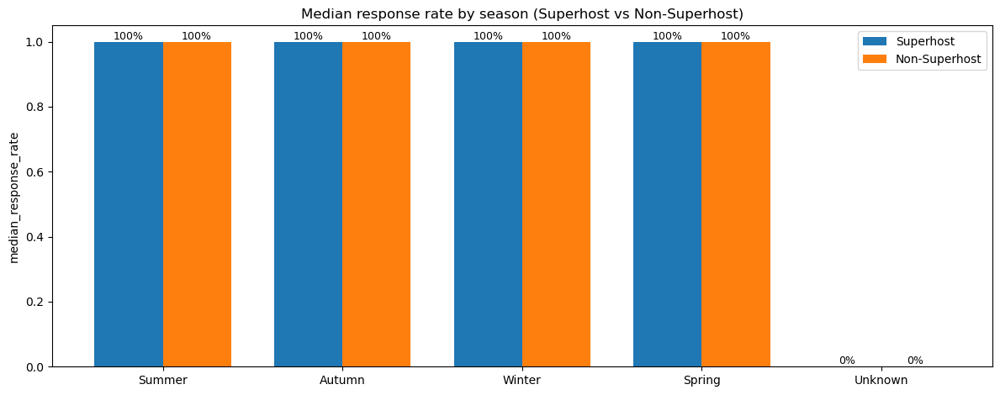

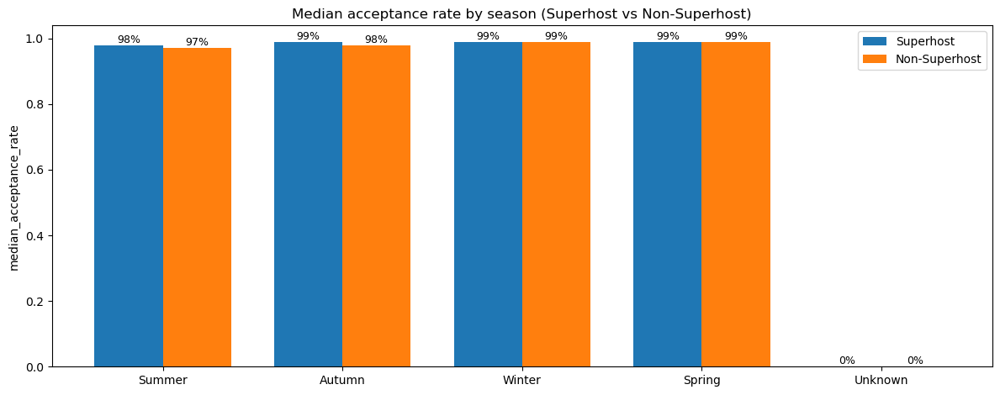

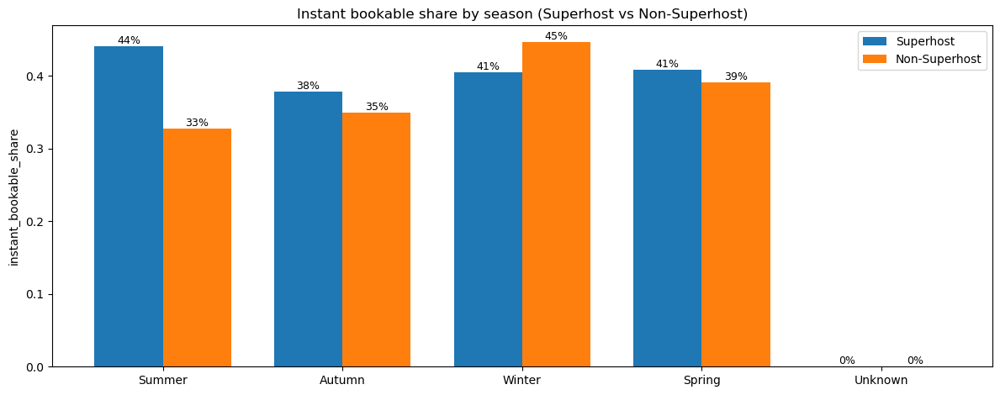

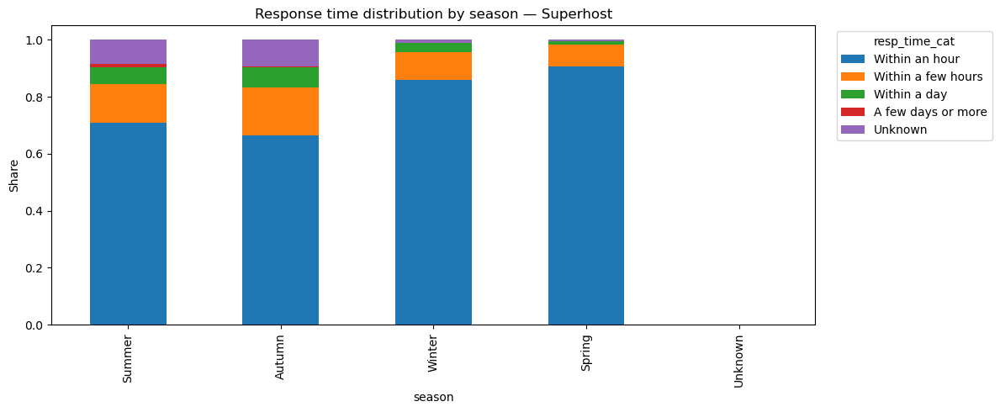

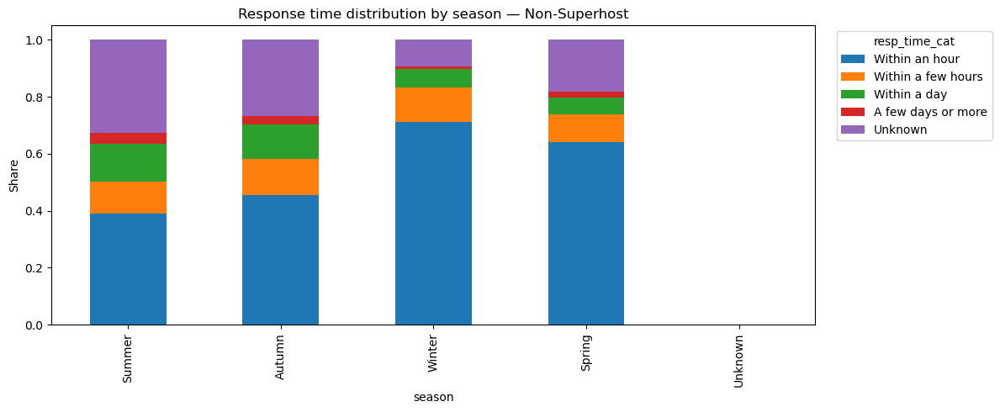

In [1273]:
def detect_col(columns, candidates):
    norm = {c.lower().replace("_", ""): c for c in columns}
    for cand in candidates:
        key = cand.lower().replace("_", "")
        if key in norm:
            return norm[key]
    for cand in candidates:
        key = cand.lower().replace("_", "")
        for k, c in norm.items():
            if key in k:
                return c
    return None

def bool01(s):
    mapping = {"t":1,"true":1,"1":1,"y":1,"yes":1, "f":0,"false":0,"0":0,"n":0,"no":0}
    return (s.astype(str).str.strip().str.lower().map(mapping).fillna(0).astype("int8"))

def to_dt(s):
    return pd.to_datetime(s, errors="coerce", utc=False)

def to_rate01(s):
    x = s.astype(str).str.strip()
    is_pct = x.str.endswith("%")
    x = x.str.replace("%", "", regex=False)
    v = pd.to_numeric(x, errors="coerce")
    # if values look like 0-1 => keep; if 1-100 => /100
    v = np.where(is_pct, v/100, v)
    v = np.where((v > 1) & (v <= 100), v/100, v)
    return pd.to_numeric(v, errors="coerce")

def resp_time_category(s):
    x = s.astype(str).str.strip().str.lower()
    out = np.select(
        [
            x.str.contains("within an hour", na=False),
            x.str.contains("within a few hours", na=False),
            x.str.contains("within a day", na=False),
            x.str.contains("a few days", na=False) | x.str.contains("or more", na=False),
        ],
        ["Within an hour", "Within a few hours", "Within a day", "A few days or more"],
        default="Unknown"
    )
    out = pd.Series(out, index=s.index)
    out = out.where(s.notna(), "Unknown")
    return out

def add_bar_labels(ax, bars, fmt=lambda v: f"{v:.0%}"):
    for b in bars:
        h = b.get_height()
        if np.isnan(h): 
            continue
        ax.text(
            b.get_x() + b.get_width()/2,
            h,
            fmt(h),
            ha="center", va="bottom", fontsize=9
        )

d = df.copy()

SUPER = detect_col(d.columns, ["host_is_superhost", "is_superhost", "is_super", "superhost"])
if SUPER is None:
    raise ValueError("Could not find superhost flag column (host_is_superhost / is_superhost / is_super).")

RESP_RATE = detect_col(d.columns, ["host_response_rate", "response_rate"])
ACPT_RATE = detect_col(d.columns, ["host_acceptance_rate", "acceptance_rate"])
RESP_TIME = detect_col(d.columns, ["host_response_time", "response_time"])
INSTANT   = detect_col(d.columns, ["instant_bookable", "instant_bookable_share", "instant_bookable_flag"])

LAST_REVIEW = detect_col(d.columns, ["last_review"])
if LAST_REVIEW is None:
    raise ValueError("Need last_review to build month/quarter/season for seasonality (activity proxy).")


#Clean & derive time fields
d["is_super"] = bool01(d[SUPER])
d["group"] = d["is_super"].map({1:"Superhost", 0:"Non-Superhost"})

d["last_review_dt"] = to_dt(d[LAST_REVIEW])
d["year"] = d["last_review_dt"].dt.year
d = d[(d["year"] >= 2016) & (d["year"] <= 2025)].copy()

d["month"] = d["last_review_dt"].dt.month.astype("Int64")
d["quarter"] = d["last_review_dt"].dt.quarter.astype("Int64")

d["season"] = np.select(
    [
        d["month"].isin([12, 1, 2]),
        d["month"].isin([3, 4, 5]),
        d["month"].isin([6, 7, 8]),
        d["month"].isin([9, 10, 11]),
    ],
    ["Summer", "Autumn", "Winter", "Spring"],
    default="Unknown"
)

# rates 
if RESP_RATE is not None:
    d["resp_rate01"] = to_rate01(d[RESP_RATE])
else:
    d["resp_rate01"] = np.nan

if ACPT_RATE is not None:
    d["acpt_rate01"] = to_rate01(d[ACPT_RATE])
else:
    d["acpt_rate01"] = np.nan

# instant_bookable
if INSTANT is not None:
    x = d[INSTANT]
    if x.astype(str).str.contains("%").any():
        d["instant01"] = to_rate01(x)
    else:
        d["instant01"] = pd.to_numeric(bool01(x), errors="coerce")
else:
    d["instant01"] = np.nan

# response time
if RESP_TIME is not None:
    d["resp_time_cat"] = resp_time_category(d[RESP_TIME])
else:
    d["resp_time_cat"] = "Unknown"

RESP_TIME_ORDER = ["Within an hour", "Within a few hours", "Within a day", "A few days or more", "Unknown"]
d["resp_time_cat"] = pd.Categorical(d["resp_time_cat"], categories=RESP_TIME_ORDER, ordered=True)

#Summary
def ops_table(period_col):
    # Table A
    t = (d.groupby([period_col, "group"], observed=False)
           .agg(
               N=("group","size"),
               median_response_rate=("resp_rate01","median"),
               median_acceptance_rate=("acpt_rate01","median"),
               instant_bookable_share=("instant01","mean"),
           )
           .reset_index()
        )
    return t

def resp_time_share_table(period_col):
    # Table B
    dist = (d.groupby([period_col, "group", "resp_time_cat"], observed=False)
              .size().rename("n").reset_index())
    dist["share"] = dist.groupby([period_col, "group"], observed=False)["n"].transform(lambda s: s / s.sum())
    pivot = (dist.pivot_table(index=[period_col,"group"], columns="resp_time_cat", values="share", fill_value=0.0, observed=False)
                .reset_index())
    return pivot

def plot_two_group_bars(t, period_col, value_col, title, fmt=lambda v: f"{v:.0%}"):
    p = t.pivot(index=period_col, columns="group", values=value_col).copy()
    if period_col == "season":
        order = ["Summer","Autumn","Winter","Spring","Unknown"]
        p = p.reindex(order)
    p = p.fillna(0)

    x = np.arange(len(p.index))
    width = 0.38

    fig, ax = plt.subplots(figsize=(12, 4.8))
    b1 = ax.bar(x - width/2, p.get("Superhost", pd.Series(0, index=p.index)).values, width, label="Superhost")
    b2 = ax.bar(x + width/2, p.get("Non-Superhost", pd.Series(0, index=p.index)).values, width, label="Non-Superhost")

    ax.set_xticks(x)
    ax.set_xticklabels([str(i) for i in p.index], rotation=0)
    ax.set_ylabel(value_col)
    ax.set_title(title)
    ax.legend()

    add_bar_labels(ax, b1, fmt=fmt)
    add_bar_labels(ax, b2, fmt=fmt)

    plt.tight_layout()
    plt.show()

def plot_resp_time_stacked(pivot, period_col, group_name):
    sub = pivot[pivot["group"] == group_name].copy()
    sub = sub.set_index(period_col)

    if period_col == "season":
        order = ["Summer","Autumn","Winter","Spring","Unknown"]
        sub = sub.reindex(order)

    cols = [c for c in RESP_TIME_ORDER if c in sub.columns]
    ax = sub[cols].plot(kind="bar", stacked=True, figsize=(12, 5))

    ax.set_ylabel("Share")
    ax.set_title(f"Response time distribution by {period_col} — {group_name}")
    ax.legend(title="resp_time_cat", bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.tight_layout()
    plt.show()


#Run: pick one period
PERIOD = "season"   # change to: "quarter" or "month"

# Table A
tabA = ops_table(PERIOD)
print(f"=== Table A: Ops metrics by {PERIOD} (Superhost vs Non-Superhost) ===")
display(tabA.style.format({
    "N":"{:,.0f}",
    "median_response_rate":"{:.2%}",
    "median_acceptance_rate":"{:.2%}",
    "instant_bookable_share":"{:.2%}",
}))

# Table B
tabB = resp_time_share_table(PERIOD)
print(f"\n=== Table B: Response time distribution shares by {PERIOD} ===")
display(tabB.style.format({c:"{:.2%}" for c in tabB.columns if c not in [PERIOD,"group"]}))

# Charts
plot_two_group_bars(tabA, PERIOD, "median_response_rate",
                    f"Median response rate by {PERIOD} (Superhost vs Non-Superhost)",
                    fmt=lambda v: f"{v:.0%}")

plot_two_group_bars(tabA, PERIOD, "median_acceptance_rate",
                    f"Median acceptance rate by {PERIOD} (Superhost vs Non-Superhost)",
                    fmt=lambda v: f"{v:.0%}")

plot_two_group_bars(tabA, PERIOD, "instant_bookable_share",
                    f"Instant bookable share by {PERIOD} (Superhost vs Non-Superhost)",
                    fmt=lambda v: f"{v:.0%}")

# Response time stacked 
plot_resp_time_stacked(tabB, PERIOD, "Superhost")
plot_resp_time_stacked(tabB, PERIOD, "Non-Superhost")

In [1274]:
report='''
This section defines seasonality using the month of a listing’s most recent activity proxy (last_review) and maps months into four seasons 
(Southern Hemisphere standard): Summer = Dec–Feb (12, 1, 2), Autumn = Mar–May (3, 4, 5), Winter = Jun–Aug (6, 7, 8), and Spring = Sep–Nov (9, 10, 11).

From a seasonal perspective, both groups had a median response rate of 100% and a median acceptance rate generally between 97% and 99%, 
resulting in little difference in median values.

More informative is the distribution of instant bookability and response time: Superhosts had significantly higher instant bookability rates in summer 
(44.15% vs 32.76%, +11.39pp), with smaller differences in spring and autumn (40.84% ​​vs 39.17%; 37.91% vs 35.00%),
but non-Superhosts had higher rates in winter (44.71% vs 40.55%).

In terms of response speed distribution, Superhost is significantly faster throughout the year: for example, 
Spring "Within an hour" rate is 90.78% (Non-Superhost 63.96%), Winter 85.86% vs 71.16%, Summer 70.94% vs 39.04%, and Autumn 66.38% vs 45.57%.
Meanwhile, Non-Superhost has a high percentage of "Unknown" responses in Summer/Autumn (32.66% / 26.75%),
while Superhost is significantly lower (8.60% / 9.27%, with Spring even at only 0.53%).

This indicates that seasonality primarily affects operational capabilities in terms of response speed and information completeness—Non-Superhost is 
more prone to slower response times and missing information during peak/off-peak seasons, 
while Superhost is generally more stable and "readily available" (faster responses, lower Unknown rates, 
and a greater tendency to enable Instant Book in certain seasons).
'''
print(report)


This section defines seasonality using the month of a listing’s most recent activity proxy (last_review) and maps months into four seasons 
(Southern Hemisphere standard): Summer = Dec–Feb (12, 1, 2), Autumn = Mar–May (3, 4, 5), Winter = Jun–Aug (6, 7, 8), and Spring = Sep–Nov (9, 10, 11).

From a seasonal perspective, both groups had a median response rate of 100% and a median acceptance rate generally between 97% and 99%, 
resulting in little difference in median values.

More informative is the distribution of instant bookability and response time: Superhosts had significantly higher instant bookability rates in summer 
(44.15% vs 32.76%, +11.39pp), with smaller differences in spring and autumn (40.84% ​​vs 39.17%; 37.91% vs 35.00%),
but non-Superhosts had higher rates in winter (44.71% vs 40.55%).

In terms of response speed distribution, Superhost is significantly faster throughout the year: for example, 
Spring "Within an hour" rate is 90.78% (Non-Superhost 63.96%), Winter 85.86

In [1278]:
# seasonal host tenure
def detect_col(columns, candidates):
    norm = {c.lower().replace("_", ""): c for c in columns}
    for cand in candidates:
        key = cand.lower().replace("_", "")
        if key in norm:
            return norm[key]
    for cand in candidates:
        key = cand.lower().replace("_", "")
        for k, c in norm.items():
            if key in k:
                return c
    return None

def bool01(s):
    mapping = {"t":1,"true":1,"1":1,"y":1,"yes":1, "f":0,"false":0,"0":0,"n":0,"no":0}
    return (s.astype(str).str.strip().str.lower().map(mapping).fillna(0).astype("int8"))

def to_dt(s):
    return pd.to_datetime(s, errors="coerce", utc=False)


d = df.copy()
SUPER = detect_col(d.columns, ["host_is_superhost", "is_superhost", "is_super", "superhost"])
HOST_SINCE = detect_col(d.columns, ["host_since"])
LAST_SCRAPED = detect_col(d.columns, ["last_scraped", "calendar_last_scraped", "calendar_updated"])
LAST_REVIEW = detect_col(d.columns, ["last_review"])

if SUPER is None:
    raise ValueError("Could not find superhost flag column.")
if HOST_SINCE is None:
    raise ValueError("Could not find host_since column.")

# group
d["is_super"] = bool01(d[SUPER])
d["group"] = d["is_super"].map({1:"Superhost", 0:"Non-Superhost"})

# parse dates
d[HOST_SINCE] = to_dt(d[HOST_SINCE])
if LAST_REVIEW is not None:
    d[LAST_REVIEW] = to_dt(d[LAST_REVIEW])

# snapshot date 
if LAST_SCRAPED is not None:
    d[LAST_SCRAPED] = to_dt(d[LAST_SCRAPED])
    snapshot_date = d[LAST_SCRAPED].dropna().max()
else:
    snapshot_date = pd.Timestamp.today()

snapshot_date = pd.Timestamp(snapshot_date)
print("snapshot_date =", snapshot_date)

# tenure computation
tenure_days = (snapshot_date - d[HOST_SINCE]).dt.days
d["tenure_months"] = (tenure_days / 30.4375).where(tenure_days.notna(), np.nan)
d["tenure_years"]  = (d["tenure_months"] / 12.0)

# season definition
if LAST_REVIEW is not None:
    m = d[LAST_REVIEW].dt.month
else:
    m = pd.Series(np.nan, index=d.index)

d["season"] = np.select(
    [m.isin([12,1,2]), m.isin([3,4,5]), m.isin([6,7,8]), m.isin([9,10,11])],
    ["Summer", "Autumn", "Winter", "Spring"],
    default="Unknown"
)


d["host_since_year"] = d[HOST_SINCE].dt.year.astype("Int64")
d = d[d["host_since_year"].between(2016, 2025)].copy()

def tenure_summary(group_cols):
    sub = d.dropna(subset=["tenure_months", "tenure_years"])
    g = (sub.groupby(group_cols, dropna=False)
           .agg(
               N=("tenure_months","size"),
               tenure_months_median=("tenure_months","median"),
               tenure_years_median=("tenure_years","median"),
               tenure_months_p25=("tenure_months", lambda x: np.nanpercentile(x, 25)),
               tenure_months_p75=("tenure_months", lambda x: np.nanpercentile(x, 75)),
           )
           .reset_index()
        )
    return g

#tenure_median by year × group
tenure_year = tenure_summary(["host_since_year", "group"]).sort_values(["host_since_year","group"])
print("\n=== Tenure median by host_since_year × group ===")
display(tenure_year.style.format({
    "N":"{:,.0f}",
    "tenure_months_median":"{:.1f}",
    "tenure_years_median":"{:.2f}",
    "tenure_months_p25":"{:.1f}",
    "tenure_months_p75":"{:.1f}",
}))

#tenure_median by season × group
season_order = ["Summer","Autumn","Winter","Spring","Unknown"]
tenure_season = tenure_summary(["season", "group"])
tenure_season["season"] = pd.Categorical(tenure_season["season"], categories=season_order, ordered=True)
tenure_season = tenure_season.sort_values(["season","group"])
print("\n=== Tenure median by season × group ===")
display(tenure_season.style.format({
    "N":"{:,.0f}",
    "tenure_months_median":"{:.1f}",
    "tenure_years_median":"{:.2f}",
    "tenure_months_p25":"{:.1f}",
    "tenure_months_p75":"{:.1f}",
}))

#  tenure_median by year × season × group
tenure_year_season = tenure_summary(["host_since_year","season","group"])
tenure_year_season["season"] = pd.Categorical(tenure_year_season["season"], categories=season_order, ordered=True)
tenure_year_season = tenure_year_season.sort_values(["host_since_year","season","group"])
print("\n=== Tenure median by host_since_year × season × group ===")
display(tenure_year_season.style.format({
    "N":"{:,.0f}",
    "tenure_months_median":"{:.1f}",
    "tenure_years_median":"{:.2f}",
    "tenure_months_p25":"{:.1f}",
    "tenure_months_p75":"{:.1f}",
}))

snapshot_date = 2025-09-23 00:00:00

=== Tenure median by host_since_year × group ===


,host_since_year,group,N,tenure_months_median,tenure_years_median,tenure_months_p25,tenure_months_p75
0,2016,Non-Superhost,"3,830",110.8,9.23,107.9,113.6
1,2016,Superhost,"4,236",111.4,9.28,108.7,114.3
2,2017,Non-Superhost,"4,148",97.5,8.12,97.5,100.7
3,2017,Superhost,"2,663",99.2,8.27,96.4,102.3
4,2018,Non-Superhost,"2,471",87.5,7.29,84.4,90.4
5,2018,Superhost,"2,551",87.0,7.25,84.5,90.0
6,2019,Non-Superhost,"2,102",74.3,6.19,72.0,77.6
7,2019,Superhost,"1,682",75.0,6.25,71.7,78.1
8,2020,Non-Superhost,"1,242",61.6,5.13,58.5,64.5
9,2020,Superhost,"1,154",63.4,5.28,60.3,67.2



=== Tenure median by season × group ===


,season,group,N,tenure_months_median,tenure_years_median,tenure_months_p25,tenure_months_p75
4,Summer,Non-Superhost,"3,704",90.9,7.57,58.5,103.4
5,Summer,Superhost,829,91.3,7.61,68.8,108.5
0,Autumn,Non-Superhost,"3,857",85.8,7.15,52.0,101.4
1,Autumn,Superhost,"2,622",88.9,7.40,58.6,106.3
8,Winter,Non-Superhost,"6,493",83.0,6.92,41.0,100.3
9,Winter,Superhost,"8,369",87.9,7.33,58.8,105.4
2,Spring,Non-Superhost,"2,327",83.1,6.92,36.9,102.5
3,Spring,Superhost,"3,780",87.0,7.25,57.8,105.0
6,Unknown,Non-Superhost,"3,710",68.3,5.69,22.3,97.5
7,Unknown,Superhost,549,78.6,6.55,44.1,102.3



=== Tenure median by host_since_year × season × group ===


,host_since_year,season,group,N,tenure_months_median,tenure_years_median,tenure_months_p25,tenure_months_p75
4,2016,Summer,Non-Superhost,847,111.3,9.28,108.2,114.1
5,2016,Summer,Superhost,254,111.8,9.32,108.9,114.6
0,2016,Autumn,Non-Superhost,779,110.5,9.21,107.9,113.6
1,2016,Autumn,Superhost,714,111.4,9.28,108.9,114.5
8,2016,Winter,Non-Superhost,"1,187",110.7,9.22,107.7,113.4
9,2016,Winter,Superhost,"2,177",111.5,9.29,108.6,114.3
2,2016,Spring,Non-Superhost,521,110.6,9.22,108.2,113.6
3,2016,Spring,Superhost,967,110.9,9.24,108.4,114.1
6,2016,Unknown,Non-Superhost,496,110.7,9.22,107.9,113.8
7,2016,Unknown,Superhost,124,111.7,9.31,110.1,114.7


In [1279]:
report='''
1.This section covers the period from 2016 to 2025 (filtered by host_since_year), with the observation cutoff point being September 23, 2025. 
Tenure is defined as: snapshot_date - host_since (converted to months/years). 
Seasons are categorized by month: Summer = December–February, Autumn = March–May, Winter = June–August, Spring = September–November; 
if the month is unavailable, it is marked as Unknown.

2.P25 and P75 (interquartiles) are provided because they describe the tenure range of the "middle 50% of hosts" (IQR range),
offering greater resilience to extreme values ​​than the mean. When a small number of "very old/very new" hosts exist,
median + P25/P75 more consistently reflects typical levels and dispersion, 
and facilitates comparisons between Superhosts and Non-Superhosts to determine whether "they are generally more experienced" or 
"only a few are artificially inflating the numbers."

3.The results clearly show a clear gradient: earlier host_since_years correlate with longer tenures. 
For example, the median host tenure in 2016 was approximately 110–111 months (≈9.23–9.28 years), 
decreasing to 14.9–15.8 months (≈1.24–1.32 years) in 2024, and even shorter in 2025 (5 months for non-Superhosts and 7.9 months for Superhosts; 
however, the sample size of N=138 is significantly smaller, suggesting an effect that only a small number of new hosts can quickly become Superhosts).
When aggregated by season, Superhosts are generally more senior across all four seasons: 
for example, the median Superhost tenure in Winter is 87.9 months vs. 83.0 months for Non-Superhosts; in Spring it is 87.0 vs. 83.1 months; 
the difference is typically on the order of several months. 
Meanwhile, the lower quartile of P25/P75 shows that Non-Superhosts tend to lower quartiles ( Winter Non-Superhost P25=41.0, while Superhost P25=58.8), 
which means that Non-Superhosts have a higher proportion of less experienced hosts, which also supports the view that Superhosts are more stable.
'''
print(report)


1.This section covers the period from 2016 to 2025 (filtered by host_since_year), with the observation cutoff point being September 23, 2025. 
Tenure is defined as: snapshot_date - host_since (converted to months/years). 
Seasons are categorized by month: Summer = December–February, Autumn = March–May, Winter = June–August, Spring = September–November; 
if the month is unavailable, it is marked as Unknown.

2.P25 and P75 (interquartiles) are provided because they describe the tenure range of the "middle 50% of hosts" (IQR range),
offering greater resilience to extreme values ​​than the mean. When a small number of "very old/very new" hosts exist,
median + P25/P75 more consistently reflects typical levels and dispersion, 
and facilitates comparisons between Superhosts and Non-Superhosts to determine whether "they are generally more experienced" or 
"only a few are artificially inflating the numbers."

3.The results clearly show a clear gradient: earlier host_since_years correlate with 

In [1291]:
report='''
1. (Market dynamics: expansion vs churn) From 2016 to 2025, both Superhost and Non-Superhost segments expanded, 
as annual entries consistently exceeded exits (inactivity proxy), producing sustained positive net growth; 
the most pronounced surge in new supply occurred in 2023–2024. 

However, churn is asymmetric: exit events are primarily concentrated among Non-Superhosts, while Superhosts maintain a consistently low exit level, 
implying higher retention and overall stability in the Superhost segment.

2. (Operational capability: ceiling vs real differentiators) Host-level medians of response_rate and acceptance_rate are near saturation
(typically 97–100%) across years, indicating a strong ceiling effect and limited discriminative power. 

The real separation emerges in distributional metrics and data completeness: 
Superhosts are more likely to respond within one hour with a lower “non-response/unknown” probability, 
whereas Non-Superhosts show higher “Unknown” shares (though gradually improving over time). 

Instant Bookability fluctuates materially and even declines in 2023–2024 for both groups, 
suggesting it behaves more like a market-driven variable influenced by platform policy, supply-demand conditions, 
and operational strategy rather than a stable Superhost trait.

3. (Trust signals: hard trust saturates; soft trust matters) “Hard trust” indicators such as identity verification rates 
and the median number of verifications show little differentiation because both groups have largely converged to high verification levels.

In contrast, “soft trust” and profile completeness are consistently stronger among Superhosts: 
they are more likely to provide profile photos and fill out host_about, supporting a more credible host image.
Notably, overall profile completeness declines over time—especially for Non-Superhosts—indicating that 
newer cohorts tend to enter with less information disclosure.

4. (Seasonality and host experience:host tenure) When defining seasonality via last_review month mapping,
median response and acceptance remain stable across seasons, but Superhosts outperform in response-time distributions throughout the year, 
while Non-Superhosts exhibit higher “Unknown” response-time shares in peak/off-peak contexts. 

Tenure analysis (snapshot_date − host_since) further supports the stability mechanism: Superhosts are generally more senior across seasons, 
and using P25/P75 reveals Non-Superhosts have lower quartiles (a higher proportion of less experienced hosts). 

Together, operational speed, information completeness, and longer tenure explain why Superhosts appear more resilient, 
whereas Non-Superhosts drive most observed inactivity exits.
'''
print(report)


1. (Market dynamics: expansion vs churn) From 2016 to 2025, both Superhost and Non-Superhost segments expanded, 
as annual entries consistently exceeded exits (inactivity proxy), producing sustained positive net growth; 
the most pronounced surge in new supply occurred in 2023–2024. 

However, churn is asymmetric: exit events are primarily concentrated among Non-Superhosts, while Superhosts maintain a consistently low exit level, 
implying higher retention and overall stability in the Superhost segment.

2. (Operational capability: ceiling vs real differentiators) Host-level medians of response_rate and acceptance_rate are near saturation
(typically 97–100%) across years, indicating a strong ceiling effect and limited discriminative power. 

The real separation emerges in distributional metrics and data completeness: 
Superhosts are more likely to respond within one hour with a lower “non-response/unknown” probability, 
whereas Non-Superhosts show higher “Unknown” shares (though gradu

In [1293]:
report='''
1. By analyzing the number of Airbnb listings in New Zealand from 2016 to 2025 (based on indicators such as the number of new and exiting listings 
(exiting listings are those last rated more than 12 months ago), price, listing structure, and location (region/community), 
we can see a clear pattern: the market continues to grow, the main listing types remain relatively stable, 
exiting listings mainly come from non-Superhosts, and the increase in listings is concentrated in major cities and tourist hotspots. 

Between 2016 and 2024, the number of new listings far exceeded the number of exits in most years, 
resulting in a continuous increase in the total number of listings. 2022 (the end of Covid) appears to be a turning point, 
while 2023-2024 saw the largest increase in the number of new listings. 
For 2025, the results should be treated with caution because the data only goes up to September 23 (in some years), 
and the number of exits near the deadline is difficult to detect.

2. (New and Exiting Listings) New listings are broadly divided into Superhosts and non-Superhosts (in most years they are close) (50/50) 
The share of super landlords increased slightly between 2020 and 2024, indicating market growth and improved landlord stability. 

However, the exit situation is quite different: most exits come from non-super landlords (typically 80%–97%). 
Furthermore, the "exit share" here refers to the "composition of exits in a given year," not the actual exit rate for each group. 
Overall, the market is expanding, but there is also a "screening" effect: non-super landlords are more likely to cease operations, 
while super landlords are more likely to remain active.

3. (Price + Property Configuration) The entry-level prices for different groups are not significantly different 
(non-super landlords typically charge NZ$200–260 per night, while super landlords charge NZ$150–190 per night). 
The price is in New Zealand dollars (depending on the property tier), so price alone cannot explain the increase in new listings.

A clearer pattern is that the median price of exiting properties is usually higher (especially those exiting from Superhosts),
suggesting that some high-priced properties with low ratings are more likely to be classified as inactive.
Since the sample size of Superhost exits may be small, the median price may be affected by a few extreme values, 
so it needs to be interpreted with caution. 
In terms of property type, "entire houses/apartments" remain the main type of both new and exiting listings, 
meaning the core supply structure is relatively stable; exiting properties are more diverse (relatively more private rooms),
while new supply is more concentrated in mainstream types.

New and exiting listings have very similar amenities (smoke detectors, Wi-Fi, kitchen, hot water, basic necessities), 
so amenities mainly reflect basic standards and cannot well explain the situation of exiting properties.

4. (Property location + (Landlord Capability) Geographically, both new and exiting listings show a clear trend: 
Auckland remains the largest center for both new and exiting listings from non-superhosts, 
while Queenstown Lakes is a stable second center, matching strong tourism demand. 

Superhosts switch listings more frequently between Auckland and Queenstown Lakes, indicating a preference for areas with high demand. 
Neighborhood analysis also supports the "core city + tourist hotspot" pattern, 
but confusing place names/spelling errors suggest further cleanup is needed. 

Regarding landlord behavior, response and acceptance rates are close to 97-100% (a ceiling effect exists), 
making it difficult to effectively differentiate between different groups. The real differences are host response time and data completeness: 
Super hosts responded faster (more responded within 1 hour) and had fewer "unknown" records; non-Super hosts had more "unknown" records. 
Instant booking functionality varied significantly over time (even declining in 2023-2024), 
suggesting it's more of a market-driven feature than a fixed feature for Super hosts. 
"Hard trust" (authentication) was high in both groups, but "soft trust" (profile picture, host profile) was more complete among Super hosts. 
Tenure results also support this: Super hosts were generally more experienced, 
while non-Super hosts included more new hosts—consistent with the departure of most inactive hosts.
'''
print(report)


1. By analyzing the number of Airbnb listings in New Zealand from 2016 to 2025 (based on indicators such as the number of new and exiting listings 
(exiting listings are those last rated more than 12 months ago), price, listing structure, and location (region/community), 
we can see a clear pattern: the market continues to grow, the main listing types remain relatively stable, 
exiting listings mainly come from non-Superhosts, and the increase in listings is concentrated in major cities and tourist hotspots. 

Between 2016 and 2024, the number of new listings far exceeded the number of exits in most years, 
resulting in a continuous increase in the total number of listings. 2022 (the end of Covid) appears to be a turning point, 
while 2023-2024 saw the largest increase in the number of new listings. 
For 2025, the results should be treated with caution because the data only goes up to September 23 (in some years), 
and the number of exits near the deadline is difficult to detect.

2. 